# Measuring emission line fluxes

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import corner
import lmfit
from lmfit import minimize, Parameters
from astropy.io import fits

import uncertainties.umath as uum
from uncertainties import ufloat
from uncertainties import unumpy as upy

import os
import sys
magePath = '/home/benjamin/Documents/analogs/'
os.sys.path.append(magePath)

from magE.directMethod import directT, run_all
from magE.functions import mergeSpec, gaussian, to_vel, FWHM, dV, save_catalog
from magE.plotutils import * 
from magE.constutils import *

PATH = '/home/benjamin/Documents/analogs/specs/final_spec/'
os.chdir(PATH)
os.getcwd()

'/home/benjamin/Documents/analogs/specs/final_spec'

In [2]:
# read the data
import pandas as pd
galname = 'J1146'
j1146 = pd.read_csv(galname + '.csv')

wave = j1146['wave'].to_numpy()
flux = j1146['flux'].to_numpy()
err = j1146['noise'].to_numpy()
igal = np.argmax(np.array(galnames) == galname)

class SpecPiece(object):
    
    def __init__(self, name, wavelength, flux, noise):
        self.name = name
        self.wavelength = wavelength
        self.flux = flux
        self.noise = noise

# Main lines
        
# [NII]6548 + Ha + [NII]6584
select = (wave > 6910) * (wave < 6970)
ha_nii = SpecPiece('ha+nii', wave[select], flux[select], err[select])

# Hb + [OIII]4959 + [OIII]5007
select = (wave > 5275) * (wave < 5310)
oiii_hei = SpecPiece('oiii+hei', wave[select], flux[select], err[select])


# Low ionization lines

# [OII]7319 + [OII]7330
select = (wave > 7715) * (wave < 7770)
oii_7320 = SpecPiece('oii7330', wave[select], flux[select], err[select])

# HeI7065
select = (wave > 7430) * (wave < 7510)
hei_7065 = SpecPiece('hei7065', wave[select], flux[select], err[select])

# HeI6678
select = (wave > 7025) * (wave < 7090)
hei_6678 = SpecPiece('hei6678', wave[select], flux[select], err[select])

# [SII]6716 + [SII]6731
select = (wave > 7080) * (wave < 7130)
sii = SpecPiece('sii', wave[select], flux[select], err[select])

# HeI5875
select = (wave > 6170) * (wave < 6250)
hei_5875 = SpecPiece('hei5875', wave[select], flux[select], err[select])

# [NII]5755
select = (wave > 6100) * (wave < 6150)
nii_5755 = SpecPiece('nii5755', wave[select], flux[select], err[select])

# Hb
select = (wave > 5120) * (wave < 5155)
hbeta = SpecPiece('hb', wave[select], flux[select], err[select])

# HeI4471
select = (wave > 4710) * (wave < 4740)
hei_4471 = SpecPiece('hei4471', wave[select], flux[select], err[select])

# Hg
select = (wave > 4570) * (wave < 4605)
hgamma = SpecPiece('hg', wave[select], flux[select], err[select])

# Hd
select = (wave > 4320) * (wave < 4350)
hdelta = SpecPiece('hd', wave[select], flux[select], err[select])

# [SII]4068 + [SII]4076
select = (wave > 4275) * (wave < 4330)
sii2 = SpecPiece('sii2', wave[select], flux[select], err[select])

# [OII]3726 + [OII]3729
select = (wave > 3925) * (wave < 3955)
oii_3727 = SpecPiece('oii3727', wave[select], flux[select], err[select])


# High ionization lines

# [SIII]9532
select = (wave > 10020) * (wave < 10130)
siii_9532 = SpecPiece('siiia', wave[select], flux[select], err[select])

# [SIII]9069
select = (wave > 9500) * (wave < 9670)
siii_9069 = SpecPiece('siiib', wave[select], flux[select], err[select])

# [Ar III]7135
select = (wave > 7500) * (wave < 7580)
ariii_7135 = SpecPiece('ariii_7135', wave[select], flux[select], err[select])

# [OI]6300 + [SIII]6312
select = (wave > 6635) * (wave < 6700)
oi_siii = SpecPiece('oi+siiic', wave[select], flux[select], err[select])

# [OIII]4959
select = (wave > 5220) * (wave < 5260)
oiii_4959 = SpecPiece('oiiib', wave[select], flux[select], err[select])

# [Ar IV]4740
select = (wave > 4990) * (wave < 5030)
ariv_4740 = SpecPiece('ariv_4740', wave[select], flux[select], err[select])

# HeII4686
select = (wave > 4930) * (wave < 4975)
heii_4686 = SpecPiece('heii4686', wave[select], flux[select], err[select])

# [OIII]4363
select = (wave > 4600) * (wave < 4623)
oiii_4363 = SpecPiece('oiiic', wave[select], flux[select], err[select])

# [NeIII]3868
select = (wave > 4070) * (wave < 4105)
neiii_3868 = SpecPiece('neiiia', wave[select], flux[select], err[select])

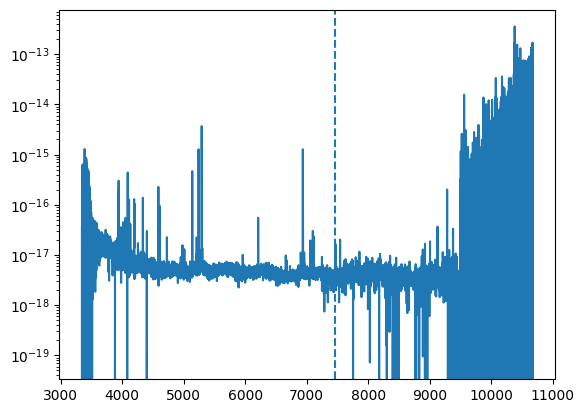

In [3]:
plt.plot(wave, flux)
#plt.xlim(7430, 7510)
plt.axvline((1 + z_BN[igal])*wave_cat['HeI7065'], ls='--')
plt.yscale('log')

---

# Two component model fit for [OIII] 4959

# [OIII]4959

In [4]:
m = arc_slope19a
n = arc_intercept19a

sigma_arc_4959 = (m * wave_cat['[OIII]4959']*(1 + z_BN[igal])) + n

In [5]:
m_wer = ufloat(9.1375e-05, 6.6525e-06)
n_wer = ufloat(0.04053405, 0.04407090)

sigma_arc_4959_wer = (m_wer * wave_cat['[OIII]4959']*(1 + z_BN[igal])) + n_wer

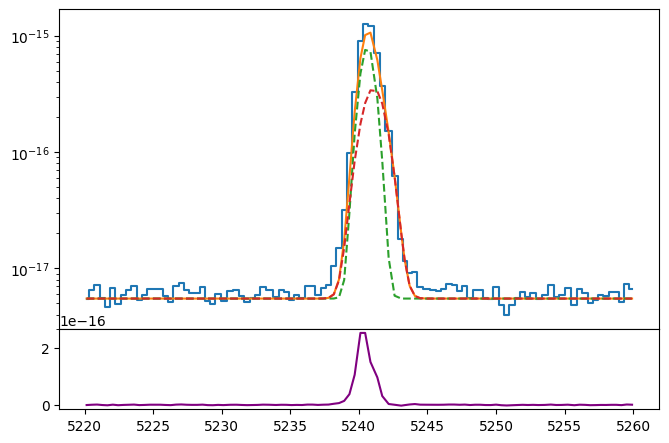

In [7]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4959.wavelength, oiii_4959.flux, where='mid')
bkg = 0.55e-17

oiiib_nar = gaussian(oiii_4959.wavelength, 100e-17, wave_cat['[OIII]4959'], z=z_BN[igal]+0.00001, sigma=0.5)
oiiib_brd = gaussian(oiii_4959.wavelength, 70e-17, wave_cat['[OIII]4959'], z=z_BN[igal]+0.0001, sigma=0.8)

ax.plot(oiii_4959.wavelength, bkg + oiiib_nar + oiiib_brd)
ax.plot(oiii_4959.wavelength, bkg + oiiib_nar, ls='--')
ax.plot(oiii_4959.wavelength, bkg + oiiib_brd, ls='--')
ax1.plot(oiii_4959.wavelength, oiii_4959.flux - bkg - oiiib_nar - oiiib_brd, color='purple')
ax.set_yscale('log')

In [8]:
params_oiii_4959 = Parameters()
params_oiii_4959.add('z_nar', value=z_BN[igal]+0.00001)
params_oiii_4959.add('z_brd', value=z_BN[igal]+0.0001)
params_oiii_4959.add('sigma_nar', value=0.5, min=0.)
params_oiii_4959.add('sigma_brd', value=0.8, min=0.)
params_oiii_4959.add('Oiiib_nar', value=100e-17, min=0.)
params_oiii_4959.add('Oiiib_brd', value=70e-17, min=0.)
params_oiii_4959.add('bkg', value=0.55e-17, min=0.)


def residual_oiii_4959(params_oiii_4959, x, data, uncertainty):
    
    z_nar = params_oiii_4959['z_nar']
    z_brd = params_oiii_4959['z_brd']
    sigma_nar = params_oiii_4959['sigma_nar']
    sigma_brd = params_oiii_4959['sigma_brd']
    oiiib_nar = params_oiii_4959['Oiiib_nar']
    oiiib_brd = params_oiii_4959['Oiiib_brd']
    bkg = params_oiii_4959['bkg']
    
    x = oiii_4959.wavelength
    model = gaussian(x, oiiib_nar, wave_cat['[OIII]4959'], z_nar, sigma_nar) \
          + gaussian(x, oiiib_brd, wave_cat['[OIII]4959'], z_brd, sigma_brd)
    
    return (model + bkg - oiii_4959.flux) / oiii_4959.noise

In [9]:
np.random.seed(1146)
out_oiii_4959 = minimize(residual_oiii_4959, params_oiii_4959, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:17<00:00, 143.12it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 73.19300646  28.14287332 121.91851288  51.19940836  80.65103544
 148.17215741 118.23179985]


In [10]:
out_oiii_4959.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05679363,1.7001e-06,(0.00%),0.056810000000000006,-inf,inf,True
z_brd,0.05686919,2.1672e-06,(0.00%),0.056900000000000006,-inf,inf,True
sigma_nar,0.47226547,0.00716103,(1.52%),0.5,0.00000000,inf,True
sigma_brd,0.80126655,0.00999585,(1.25%),0.8,0.00000000,inf,True
Oiiib_nar,1.0131e-15,5.0785e-17,(5.01%),1e-15,0.00000000,inf,True
Oiiib_brd,1.0300e-15,5.7548e-17,(5.59%),7e-16,0.00000000,inf,True
bkg,6.1873e-18,7.2202e-20,(1.17%),5.5e-18,0.00000000,inf,True


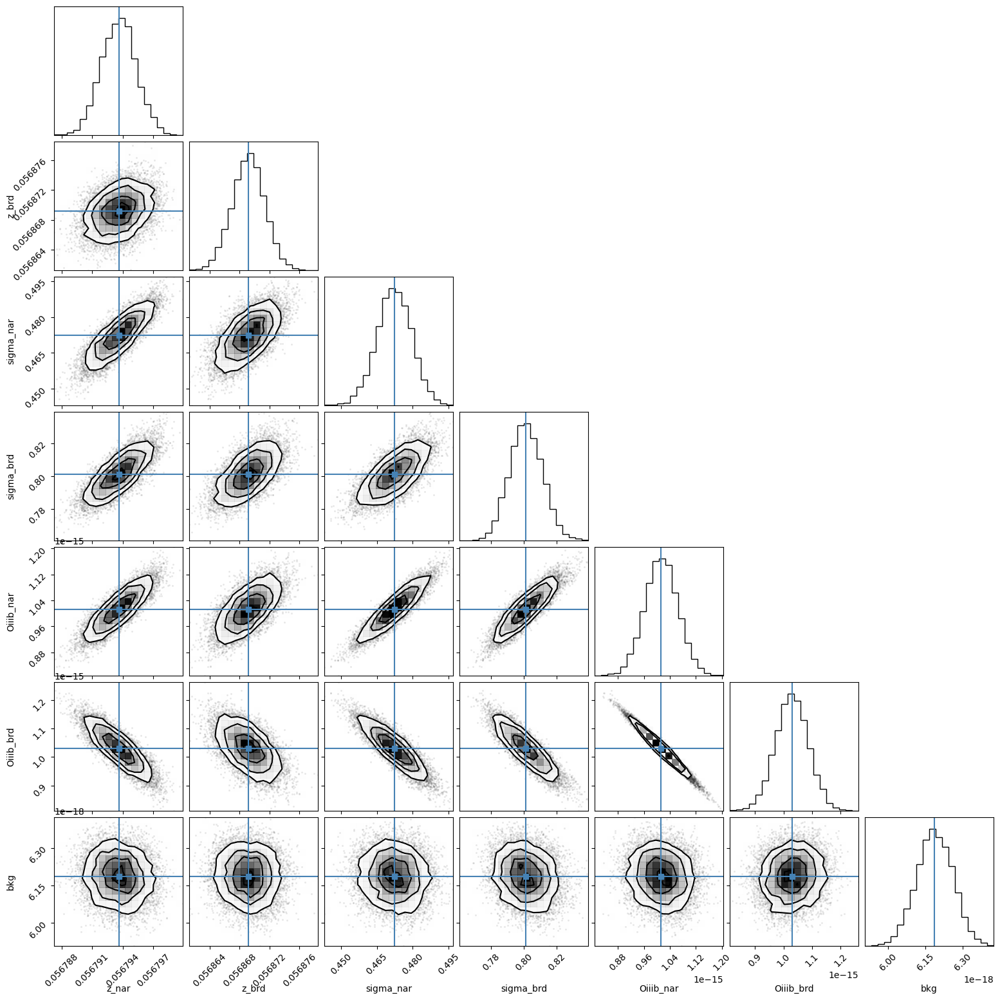

In [11]:
corner.corner(out_oiii_4959.flatchain, labels=out_oiii_4959.var_names,
             truths=list(out_oiii_4959.params.valuesdict().values()));
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

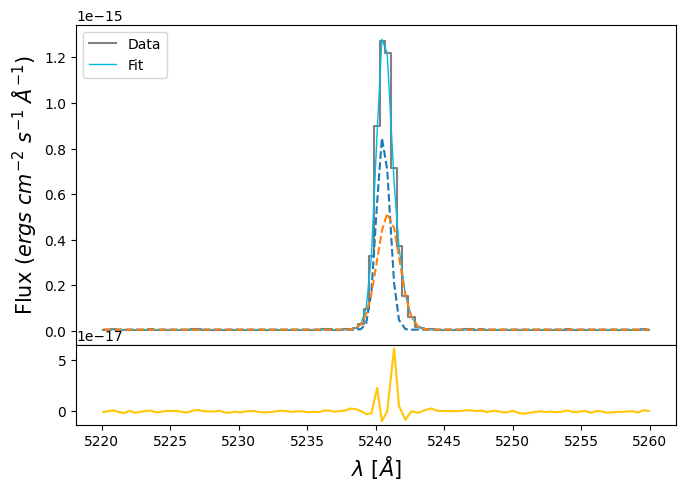

In [12]:
oiiib_nar_flux = out_oiii_4959.flatchain.Oiiib_nar.mean()
oiiib_nar_std = out_oiii_4959.flatchain.Oiiib_nar.std()

oiiib_brd_flux = out_oiii_4959.flatchain.Oiiib_brd.mean()
oiiib_brd_std = out_oiii_4959.flatchain.Oiiib_brd.std()

bkg_oiii_4959 = out_oiii_4959.flatchain.bkg.mean()
bkg_oiii_4959_std = out_oiii_4959.flatchain.bkg.std()

z_nar_oiii_4959 = out_oiii_4959.flatchain.z_nar.mean()
z_nar_oiii_4959_std = out_oiii_4959.flatchain.z_nar.std()

z_brd_oiii_4959 = out_oiii_4959.flatchain.z_brd.mean()
z_brd_oiii_4959_std = out_oiii_4959.flatchain.z_brd.std()

sigma_nar_oiii_4959 = out_oiii_4959.flatchain.sigma_nar.mean()
sigma_nar_oiii_4959_std = out_oiii_4959.flatchain.sigma_nar.std()

sigma_brd_oiii_4959 = out_oiii_4959.flatchain.sigma_brd.mean()
sigma_brd_oiii_4959_std = out_oiii_4959.flatchain.sigma_brd.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4959.wavelength, oiii_4959.flux,
            color='gray', label='Data', where='mid')

oiiib_nar = gaussian(oiii_4959.wavelength, oiiib_nar_flux, wave_cat['[OIII]4959'], z_nar_oiii_4959, sigma_nar_oiii_4959)
oiiib_brd = gaussian(oiii_4959.wavelength, oiiib_brd_flux, wave_cat['[OIII]4959'], z_brd_oiii_4959, sigma_brd_oiii_4959)
oiiib = oiiib_nar + oiiib_brd

ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib,
        lw=1, color=c[0], label='Fit')
ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib_nar, ls='--')
ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib_brd, ls='--')
ax1.plot(oiii_4959.wavelength, oiii_4959.flux - bkg_oiii_4959 - oiiib,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.legend(loc='upper left')

In [13]:
# Correcting sigma by instrumental broadening

# Intrinsic from the galaxy
sigma_nar_intrinsic = ufloat(sigma_nar_oiii_4959, sigma_nar_oiii_4959_std)
sigma_brd_intrinsic = upy.sqrt((ufloat(sigma_brd_oiii_4959, sigma_brd_oiii_4959_std)**2) - (sigma_arc_4959**2)) 

In [14]:
# EW
EW_OIII_4959_nar = ufloat(oiiib_nar_flux, oiiib_nar_std) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)
EW_OIII_4959_brd = ufloat(oiiib_brd_flux, oiiib_brd_std) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)
EW_OIII_4959 = (ufloat(oiiib_nar_flux, oiiib_nar_std) + ufloat(oiiib_brd_flux, oiiib_brd_std)) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)

# FWHM
FWHM_4959_nar = FWHM(sigma_nar_intrinsic, wave_cat['[OIII]4959']*(1 + ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std)))
FWHM_4959_brd = FWHM(sigma_brd_intrinsic, wave_cat['[OIII]4959']*(1 + ufloat(z_brd_oiii_4959, z_brd_oiii_4959_std)))

# velocity shift
dV_4959 = dV(ufloat(z_brd_oiii_4959, z_brd_oiii_4959_std),
             ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std))

# Ratio to fix velocity shifts between components
z_ratio = z_brd_oiii_4959 / z_nar_oiii_4959

# Ratio to distribute the flux between components in no detection
brd_to_nar = oiiib_brd_flux / oiiib_nar_flux

# Dispersion for the whole spectra
dLam = (np.max(wave) - np.min(wave)) / len(wave)

In [14]:
print('Redshift of the narrow component: {:.4f}'.format(ufloat(z_nar_oiii_4959, z_nar_oiii_4959_std)))

Redshift of the narrow component: 0.0568+/-0.0000


In [15]:
# Velocities
vel = {'galname': galname,
       'z_nar': z_nar_oiii_4959,
       'dV': dV_4959.nominal_value,
       'dV_err': dV_4959.std_dev,
       'FWHM_nar': FWHM_4959_nar.nominal_value,
       'FWHM_nar_err': FWHM_4959_nar.std_dev,
       'FWHM_brd': FWHM_4959_brd.nominal_value,
       'FWHM_brd_err': FWHM_4959_brd.std_dev
}
vel_catalog_pd = pd.DataFrame(data=vel, index=[0])
vel_catalog_pd

,galname,z_nar,dV,dV_err,FWHM_nar,FWHM_nar_err,FWHM_brd,FWHM_brd_err
0,J1146,0.056789,21.130298,0.662895,63.610429,0.900907,77.088277,1.225853


In [16]:
save_catalog(galname, vel_catalog_pd, magePath + '/results/vel_catalog.csv')

Existent catalog (.csv) file.
Existent data for J1146, overwriting...
Done.


---

# [NII]6548 + H$\alpha$ + [NII]6584

In [15]:
sigma_arc_ha = (m * wave_cat['Ha']*(1 + z_BN[igal])) + n

sigma_nar_ha = sigma_arc_ha
sigma_brd_ha = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_ha**2))

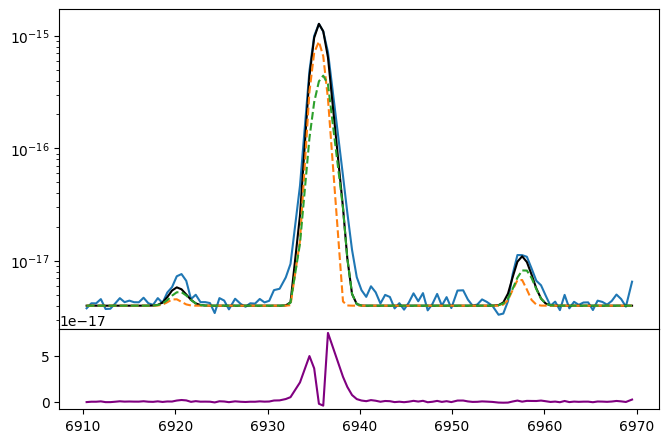

In [16]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(ha_nii.wavelength, ha_nii.flux)
bkg = 0.4e-17

ha_nar = gaussian(ha_nii.wavelength, 150e-17, wave_cat['Ha'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
ha_brd = gaussian(ha_nii.wavelength, 100e-17, wave_cat['Ha'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

niib_nar = gaussian(ha_nii.wavelength, 0.1e-17, wave_cat['[NII]6548'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
niib_brd = gaussian(ha_nii.wavelength, 0.3e-17, wave_cat['[NII]6548'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

niia_nar = gaussian(ha_nii.wavelength, 0.5e-17, wave_cat['[NII]6584'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_ha))
niia_brd = gaussian(ha_nii.wavelength, 1.0e-17, wave_cat['[NII]6584'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_ha))

ha = ha_nar + ha_brd
niib = niib_nar + niib_brd
niia = niia_nar + niia_brd

ax.plot(ha_nii.wavelength, bkg + niib + ha + niia, color='black')
ax.plot(ha_nii.wavelength, bkg + niib_nar + ha_nar + niia_nar, ls='--')
ax.plot(ha_nii.wavelength, bkg + niib_brd + ha_brd + niia_brd, ls='--')
ax1.plot(ha_nii.wavelength, ha_nii.flux - bkg - niib - ha - niia, color='purple')
ax.set_yscale('log')

In [17]:
params_ha_nii = Parameters()
params_ha_nii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_ha_nii.add('z_ratio', value=z_ratio, vary=False)
params_ha_nii.add('sigma_nar', value=upy.nominal_values(sigma_nar_ha), vary=False)
params_ha_nii.add('sigma_brd', value=upy.nominal_values(sigma_brd_ha), vary=False)
params_ha_nii.add('Ha_nar', value=150e-17, min=0.)
params_ha_nii.add('Ha_brd', value=100e-17, min=0.)
params_ha_nii.add('Niia_nar', value=0.5e-17, min=0.)
params_ha_nii.add('Niia_brd', value=1.0e-17, min=0.)
params_ha_nii.add('Niib_to_niia', value=1/3, min=0., max=1.)
params_ha_nii.add('bkg', value=0.4e-17, vary=True)


def residual_ha_nii(params_ha_nii, x, data, uncertainty):
    
    z_nar = params_ha_nii['z_nar']
    z_brd = params_ha_nii['z_nar'] * params_ha_nii['z_ratio']
    sigma_nar = params_ha_nii['sigma_nar']
    sigma_brd = params_ha_nii['sigma_brd']
    ha_nar = params_ha_nii['Ha_nar']
    ha_brd = params_ha_nii['Ha_brd']
    niia_nar = params_ha_nii['Niia_nar']
    niia_brd = params_ha_nii['Niia_brd']
    niib_nar = params_ha_nii['Niia_nar']*params_ha_nii['Niib_to_niia']
    niib_brd = params_ha_nii['Niia_brd']*params_ha_nii['Niib_to_niia']
    bkg = params_ha_nii['bkg']
    
    x = ha_nii.wavelength
    
    model_ha = gaussian(x, ha_nar, wave_cat['Ha'], z_nar, sigma_nar) \
             + gaussian(x, ha_brd, wave_cat['Ha'], z_brd, sigma_brd)
    
    model_niia = gaussian(x, niia_nar, wave_cat['[NII]6584'], z_nar, sigma_nar) \
               + gaussian(x, niia_brd, wave_cat['[NII]6584'], z_brd, sigma_brd)
    
    model_niib = gaussian(x, niib_nar, wave_cat['[NII]6548'], z_nar, sigma_nar) \
               + gaussian(x, niib_brd, wave_cat['[NII]6548'], z_brd, sigma_brd)
    model = model_niib + model_ha + model_niia
    
    return (model + bkg - ha_nii.flux) / ha_nii.noise

In [18]:
np.random.seed(1146)
out_ha_nii = minimize(residual_ha_nii, params_ha_nii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:29<00:00, 85.51it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 7 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [106.50856606 105.91305619 102.99468772 141.47359275 125.07032191
  78.74172813  78.32952239]


In [19]:
out_ha_nii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05677704,5.9161e-07,(0.00%),0.05679360801873642,-inf,inf,True
z_ratio,1.00133015,,,1.0013301548900462,-inf,inf,False
sigma_nar,0.67427052,,,0.674270522629,-inf,inf,False
sigma_brd,0.90940878,,,0.909408779663647,-inf,inf,False
Ha_nar,8.8886e-16,2.0691e-17,(2.33%),1.5e-15,0.00000000,inf,True
Ha_brd,1.8170e-15,2.3750e-17,(1.31%),1e-15,0.00000000,inf,True
Niia_nar,9.5286e-19,7.6513e-19,(80.30%),5e-18,0.00000000,inf,True
Niia_brd,1.4726e-17,1.0068e-18,(6.84%),1e-17,0.00000000,inf,True
Niib_to_niia,0.35217677,0.03994036,(11.34%),0.3333333333333333,0.00000000,1.00000000,True
bkg,4.6108e-18,5.0679e-20,(1.10%),4e-18,-inf,inf,True


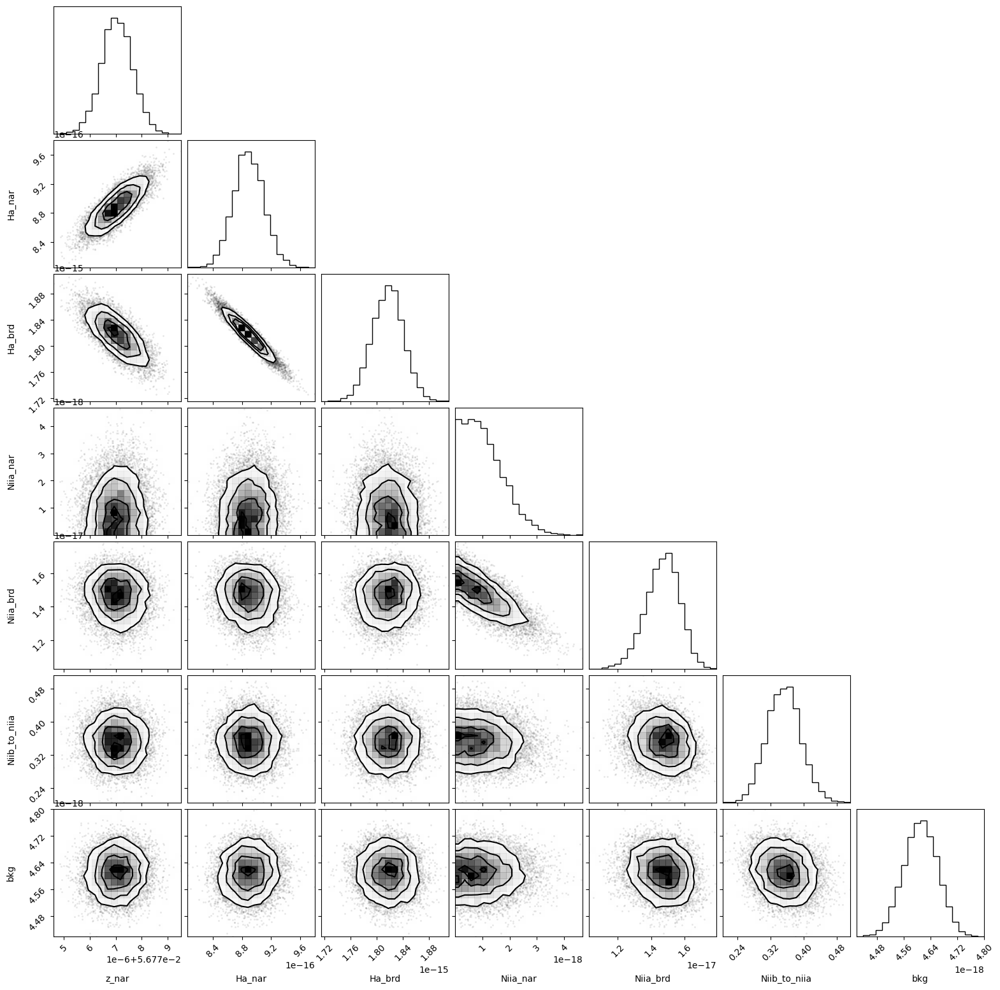

In [20]:
corner.corner(out_ha_nii.flatchain, labels=out_ha_nii.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

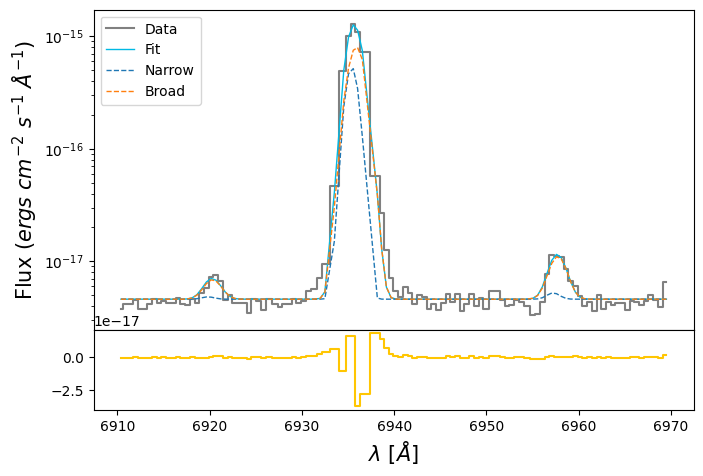

In [23]:
ha_nar_flux = out_ha_nii.flatchain.Ha_nar.mean()
ha_nar_std = out_ha_nii.flatchain.Ha_nar.std()

ha_brd_flux = out_ha_nii.flatchain.Ha_brd.mean()
ha_brd_std = out_ha_nii.flatchain.Ha_brd.std()

niia_nar_flux = out_ha_nii.flatchain.Niia_nar.mean()
niia_nar_std = out_ha_nii.flatchain.Niia_nar.std()

niia_brd_flux = out_ha_nii.flatchain.Niia_brd.mean()
niia_brd_std = out_ha_nii.flatchain.Niia_brd.std()

niib_nar_flux = niia_nar_flux * out_ha_nii.flatchain.Niib_to_niia.mean()
niib_nar_std = niia_nar_flux * out_ha_nii.flatchain.Niib_to_niia.std()

niib_brd_flux = niia_brd_flux * out_ha_nii.flatchain.Niib_to_niia.mean()
niib_brd_std = niia_brd_flux * out_ha_nii.flatchain.Niib_to_niia.std()

z_ha_nii = out_ha_nii.flatchain.z_nar.mean()
z_ha_nii_std = out_ha_nii.flatchain.z_nar.std()

bkg_ha_nii = out_ha_nii.flatchain.bkg.mean()
bkg_ha_nii_std = out_ha_nii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(ha_nii.wavelength, ha_nii.flux,
            color='gray', label='Data', where='mid')

ha_nar = gaussian(ha_nii.wavelength, ha_nar_flux, wave_cat['Ha'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
ha_brd = gaussian(ha_nii.wavelength, ha_brd_flux, wave_cat['Ha'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niia_nar = gaussian(ha_nii.wavelength, niia_nar_flux, wave_cat['[NII]6584'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
niia_brd = gaussian(ha_nii.wavelength, niia_brd_flux, wave_cat['[NII]6584'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niib_nar = gaussian(ha_nii.wavelength, niib_nar_flux, wave_cat['[NII]6548'], z_ha_nii, upy.nominal_values(sigma_nar_ha))
niib_brd = gaussian(ha_nii.wavelength, niib_brd_flux, wave_cat['[NII]6548'], z_ha_nii * z_ratio, upy.nominal_values(sigma_brd_ha))

niia = niia_nar + niia_brd
ha = ha_nar + ha_brd
niib = niib_nar + niib_brd

ax.plot(ha_nii.wavelength, bkg_ha_nii + niia + ha + niib,
        lw=1, color=c[0], label='Fit')

ax.plot(ha_nii.wavelength, bkg_ha_nii + niia_nar + ha_nar + niib_nar,
        ls='--', lw=1, label='Narrow')
ax.plot(ha_nii.wavelength, bkg_ha_nii + niia_brd + ha_brd + niib_brd,
        ls='--', lw=1, label='Broad')

ax1.step(ha_nii.wavelength, ha_nii.flux - bkg_ha_nii - niia - ha - niib,
         color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [21]:
# EW
EW_Ha_nar = ufloat(ha_nar_flux, ha_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_Ha_brd = ufloat(ha_brd_flux, ha_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_Ha = (ufloat(ha_nar_flux, ha_nar_std) + ufloat(ha_brd_flux, ha_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

EW_NII_6584_nar = ufloat(niia_nar_flux, niia_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6584_brd = ufloat(niia_brd_flux, niia_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6584 = (ufloat(niia_nar_flux, niia_nar_std) + ufloat(niia_brd_flux, niia_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

EW_NII_6548_nar = ufloat(niib_nar_flux, niib_nar_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6548_brd = ufloat(niib_brd_flux, niib_brd_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6548 = (ufloat(niib_nar_flux, niib_nar_std) + ufloat(niib_brd_flux, niib_brd_std)) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

# [OII]7319 + [OII]7330

In [25]:
sigma_arc_7330 = (m * wave_cat['[OII]7330']*(1 + z_BN[igal])) + n

sigma_nar_7330 = sigma_arc_7330
sigma_brd_7330 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_7330**2))

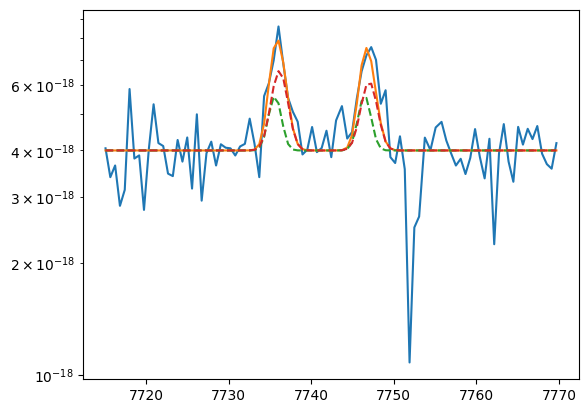

In [26]:
# Search for good initial guess

plt.plot(oii_7320.wavelength, oii_7320.flux)

oiia_nar = gaussian(oii_7320.wavelength, 0.3e-17, wave_cat['[OII]7330'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7330))
oiia_brd = gaussian(oii_7320.wavelength, 0.5e-17, wave_cat['[OII]7330'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7330))
oiib_nar = gaussian(oii_7320.wavelength, 0.3e-17, wave_cat['[OII]7319'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7330))
oiib_brd = gaussian(oii_7320.wavelength, 0.6e-17, wave_cat['[OII]7319'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7330))

oiia = oiia_nar + oiia_brd
oiib = oiib_nar + oiib_brd
bkg = 0.4e-17

plt.plot(oii_7320.wavelength, bkg + oiib + oiia)
plt.plot(oii_7320.wavelength, bkg + oiib_nar + oiia_nar, ls='--')
plt.plot(oii_7320.wavelength, bkg + oiib_brd + oiia_brd, ls='--')

plt.yscale('log')

In [27]:
params_oii_7320 = Parameters()

params_oii_7320.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oii_7320.add('z_ratio', value=z_ratio, vary=False)
params_oii_7320.add('sigma_nar', value=upy.nominal_values(sigma_nar_7330), vary=False)
params_oii_7320.add('sigma_brd', value=upy.nominal_values(sigma_brd_7330), vary=False)
params_oii_7320.add('Oiia_nar', value=0.3e-17, min=0.)
params_oii_7320.add('Oiia_brd', value=0.5e-17, min=0.)
params_oii_7320.add('Oiib_nar', value=0.3e-17, min=0.)
params_oii_7320.add('Oiib_brd', value=0.6e-17, min=0.)
params_oii_7320.add('bkg', value=0.4e-17, min=0.)

def residual_oii_7320(params_oii_7320, x, data, uncertainty):
    
    z_nar = params_oii_7320['z_nar']
    z_brd = params_oii_7320['z_nar'] * params_oii_7320['z_ratio']
    sigma_nar = params_oii_7320['sigma_nar']
    sigma_brd = params_oii_7320['sigma_brd']
    oiia_nar_flux = params_oii_7320['Oiia_nar']
    oiia_brd_flux = params_oii_7320['Oiia_brd']
    oiib_nar_flux = params_oii_7320['Oiib_nar']
    oiib_brd_flux = params_oii_7320['Oiib_brd']
    bkg = params_oii_7320['bkg']
    
    x = oii_7320.wavelength
    model_oiia = gaussian(x, oiia_nar_flux, wave_cat['[OII]7330'], z_nar, sigma_nar) + \
                 gaussian(x, oiia_brd_flux, wave_cat['[OII]7330'], z_brd, sigma_brd)
    model_oiib = gaussian(x, oiib_nar_flux, wave_cat['[OII]7319'], z_nar, sigma_nar) + \
                 gaussian(x, oiib_brd_flux, wave_cat['[OII]7319'], z_brd, sigma_brd)
    model = model_oiia + model_oiib
    return (model + bkg - oii_7320.flux) / oii_7320.noise

In [28]:
np.random.seed(1146)
out_oii_7320 = minimize(residual_oii_7320, params_oii_7320, args=(1, 1, 1),
                         method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:21<00:00, 115.26it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [61.07634216 74.98352525 69.39243161 62.91572677 64.04666368 59.04681721]


In [29]:
out_oii_7320.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05680834,1.4143e-05,(0.02%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_nar,0.74837458,,,0.7483745803689998,-inf,inf,False
sigma_brd,0.94223521,,,0.9422352107486537,-inf,inf,False
Oiia_nar,1.1228e-18,1.0057e-18,(89.57%),3e-18,0.00000000,inf,True
Oiia_brd,7.5666e-18,1.1991e-18,(15.85%),5e-18,0.00000000,inf,True
Oiib_nar,4.0308e-18,1.7176e-18,(42.61%),3e-18,0.00000000,inf,True
Oiib_brd,4.8018e-18,1.9379e-18,(40.36%),6e-18,0.00000000,inf,True
bkg,4.1208e-18,5.1177e-20,(1.24%),4e-18,0.00000000,inf,True


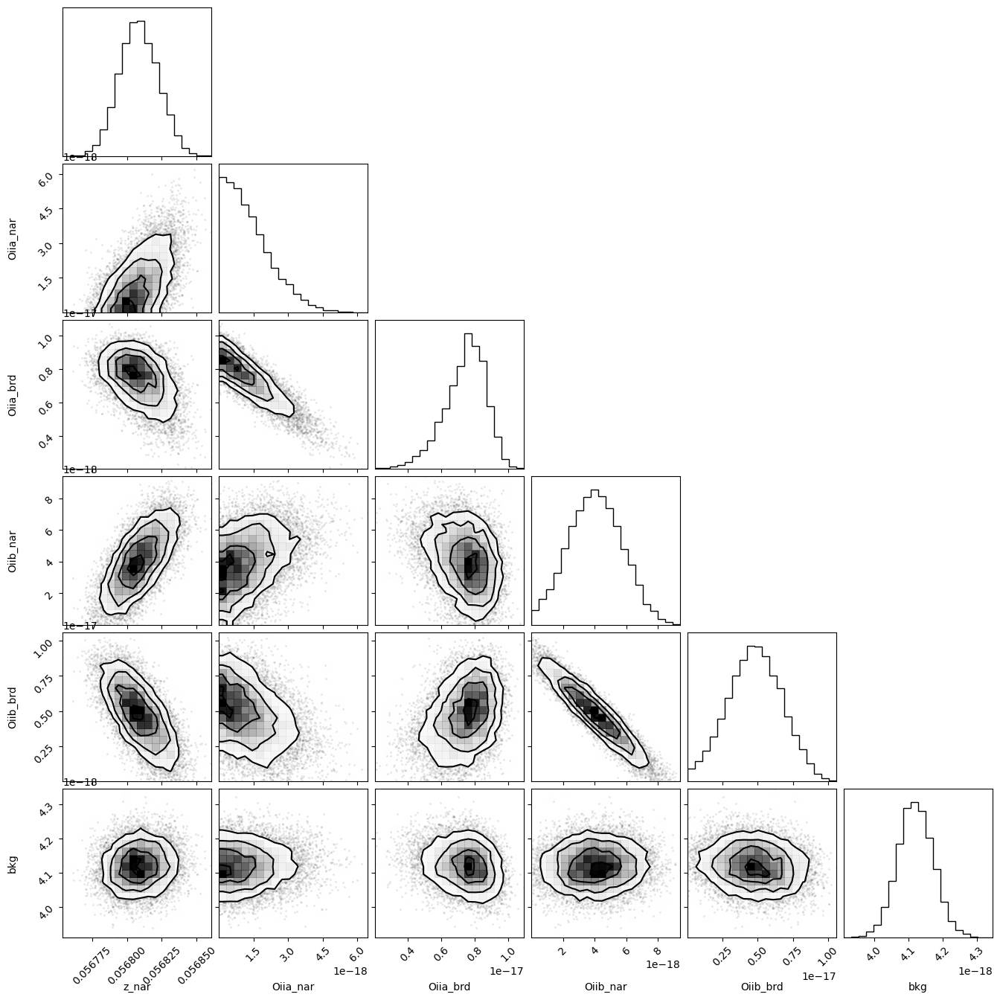

In [30]:
corner.corner(out_oii_7320.flatchain, labels=out_oii_7320.var_names);

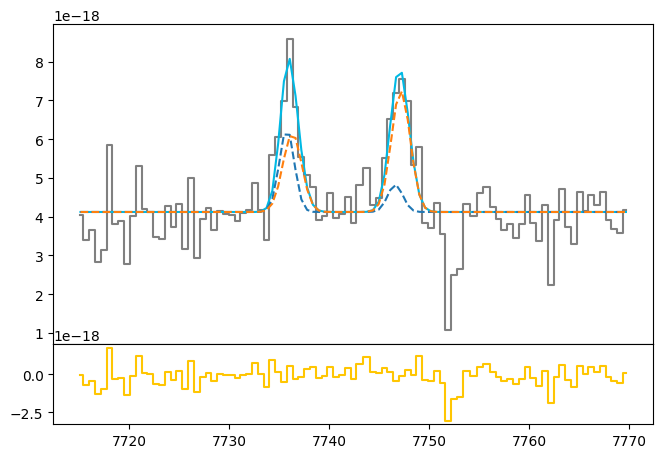

In [31]:
oiia_nar_flux = out_oii_7320.flatchain.Oiia_nar.mean()
oiia_nar_std = out_oii_7320.flatchain.Oiia_nar.std()

oiia_brd_flux = out_oii_7320.flatchain.Oiia_brd.mean()
oiia_brd_std = out_oii_7320.flatchain.Oiia_brd.std()

oiib_nar_flux = out_oii_7320.flatchain.Oiib_nar.mean()
oiib_nar_std = out_oii_7320.flatchain.Oiib_nar.std()

oiib_brd_flux = out_oii_7320.flatchain.Oiib_brd.mean()
oiib_brd_std = out_oii_7320.flatchain.Oiib_brd.std()

z_oii_7320 = out_oii_7320.flatchain.z_nar.mean()
z_oii_7320_std = out_oii_7320.flatchain.z_nar.std()

bkg_oii_7320 = out_oii_7320.flatchain.bkg.mean()
bkg_oii_7320_std = out_oii_7320.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_7320.wavelength, oii_7320.flux, color='gray', label='Data', where='mid')

oiia_nar = gaussian(oii_7320.wavelength, oiia_nar_flux, wave_cat['[OII]7330'], z_oii_7320, upy.nominal_values(sigma_nar_7330))
oiib_nar = gaussian(oii_7320.wavelength, oiib_nar_flux, wave_cat['[OII]7319'], z_oii_7320, upy.nominal_values(sigma_nar_7330))

oiia_brd = gaussian(oii_7320.wavelength, oiia_brd_flux, wave_cat['[OII]7330'], z_oii_7320 * z_ratio, upy.nominal_values(sigma_brd_7330))
oiib_brd = gaussian(oii_7320.wavelength, oiib_brd_flux, wave_cat['[OII]7319'], z_oii_7320 * z_ratio, upy.nominal_values(sigma_brd_7330))

oiia = oiia_nar + oiia_brd
oiib = oiib_nar + oiib_brd

ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia + oiib, color=c[0])
ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia_nar + oiib_nar, ls='--')
ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia_brd + oiib_brd, ls='--')
#plt.yscale('log')
ax1.step(oii_7320.wavelength, oii_7320.flux - bkg_oii_7320 - oiia - oiib, color=c[3], where='mid')

In [32]:
# EW
EW_OII_7330_nar = ufloat(oiia_nar_flux, oiia_nar_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7330_brd = ufloat(oiia_brd_flux, oiia_brd_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7330 = (ufloat(oiia_nar_flux, oiia_nar_std) + ufloat(oiia_brd_flux, oiia_brd_std)) / ufloat(bkg_oii_7320, bkg_oii_7320_std)

EW_OII_7319_nar = ufloat(oiib_nar_flux, oiib_nar_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7319_brd = ufloat(oiib_brd_flux, oiib_brd_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7319 = (ufloat(oiib_nar_flux, oiib_nar_std) + ufloat(oiib_brd_flux, oiib_brd_std)) / ufloat(bkg_oii_7320, bkg_oii_7320_std)

# HeI 7065

In [33]:
sigma_arc_7065 = (m * wave_cat['HeI7065']*(1 + z_BN[igal])) + n

sigma_nar_7065 = sigma_arc_7065
sigma_brd_7065 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_7065**2))

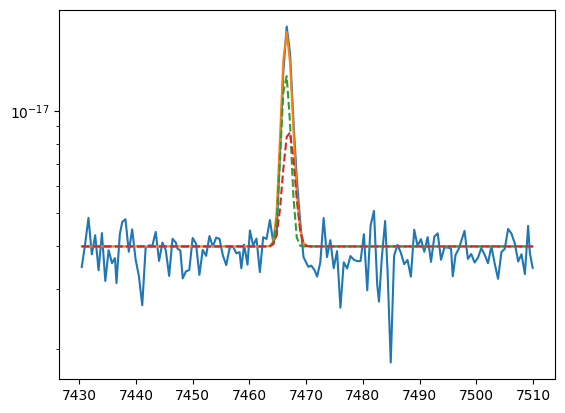

In [34]:
plt.plot(hei_7065.wavelength, hei_7065.flux)
bkg = 0.4e-17

hei7065_nar = gaussian(hei_7065.wavelength, 1.6e-17, wave_cat['HeI7065'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7065))
hei7065_brd = gaussian(hei_7065.wavelength, 1.1e-17, wave_cat['HeI7065'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7065))

hei7065 = hei7065_nar + hei7065_brd

plt.plot(hei_7065.wavelength, hei7065 + bkg)
plt.plot(hei_7065.wavelength, hei7065_nar + bkg, ls='--')
plt.plot(hei_7065.wavelength, hei7065_brd + bkg, ls='--')
plt.yscale('log')

In [35]:
params_7065 = Parameters()
params_7065.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_7065.add('z_ratio', value=z_ratio, vary=False)
params_7065.add('sigma_hei7065_nar', value=upy.nominal_values(sigma_nar_7065), vary=False)
params_7065.add('sigma_hei7065_brd', value=upy.nominal_values(sigma_brd_7065), vary=False)
params_7065.add('Hei7065_nar', value=1.6e-17, min=0.)
params_7065.add('Hei7065_brd', value=1.1e-17, min=0.)
params_7065.add('bkg', value=0.4e-17, min=0.)

def residual_hei7065(params_7065, x, data, uncertainty):
    
    z_nar = params_7065['z_nar']
    z_brd = params_7065['z_nar'] * params_7065['z_ratio']
    sigma_hei7065_nar = params_7065['sigma_hei7065_nar']
    sigma_hei7065_brd = params_7065['sigma_hei7065_brd']
    hei7065_nar_flux = params_7065['Hei7065_nar']
    hei7065_brd_flux = params_7065['Hei7065_brd']
    bkg = params_7065['bkg']
    
    x = hei_7065.wavelength
    model = gaussian(x, hei7065_nar_flux, wave_cat['HeI7065'], z_nar, sigma_hei7065_nar) + \
            gaussian(x, hei7065_brd_flux, wave_cat['HeI7065'], z_brd, sigma_hei7065_brd)
    return (model + bkg - hei_7065.flux) / hei_7065.noise

In [36]:
np.random.seed(1146)
out_hei7065 = minimize(residual_hei7065, params_7065, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:19<00:00, 127.50it/s]


In [37]:
out_hei7065.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05680574,7.1713e-06,(0.01%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_hei7065_nar,0.72278483,,,0.7227848288689999,-inf,inf,False
sigma_hei7065_brd,0.92204153,,,0.9220415330532962,-inf,inf,False
Hei7065_nar,1.7149e-17,2.5368e-18,(14.79%),1.6e-17,0.00000000,inf,True
Hei7065_brd,1.0667e-17,2.9378e-18,(27.54%),1.1e-17,0.00000000,inf,True
bkg,3.8481e-18,3.2515e-20,(0.84%),4e-18,0.00000000,inf,True


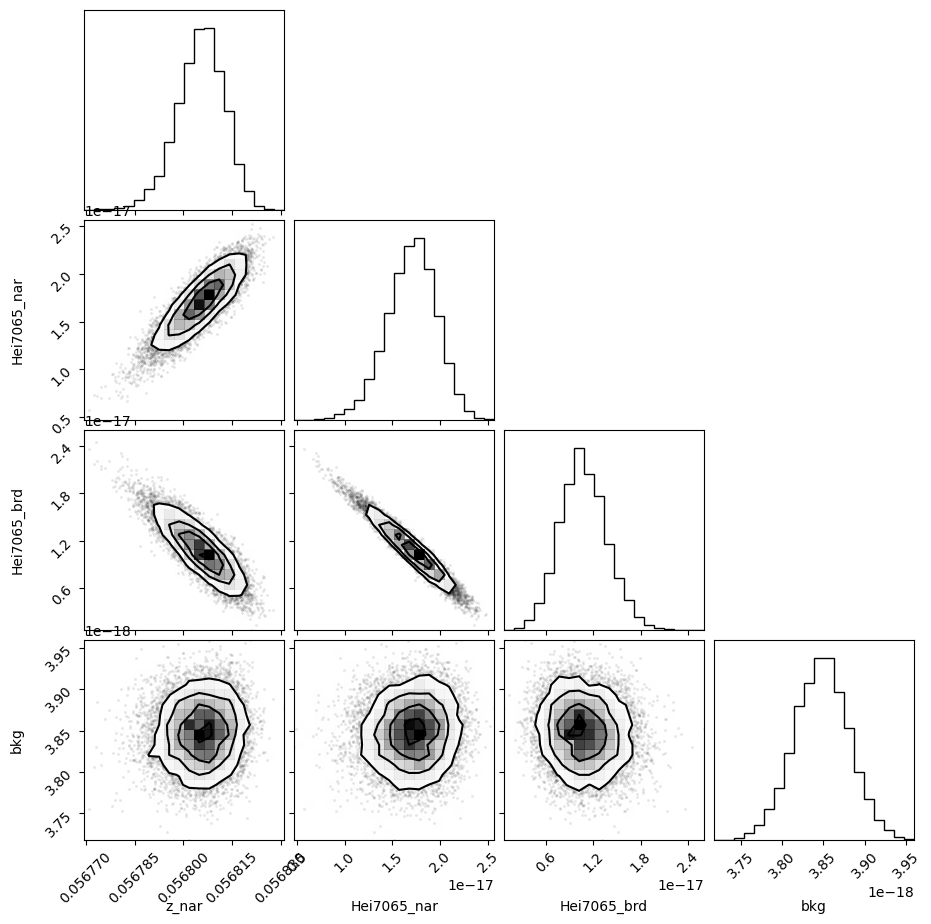

In [38]:
corner.corner(out_hei7065.flatchain, labels=out_hei7065.var_names);

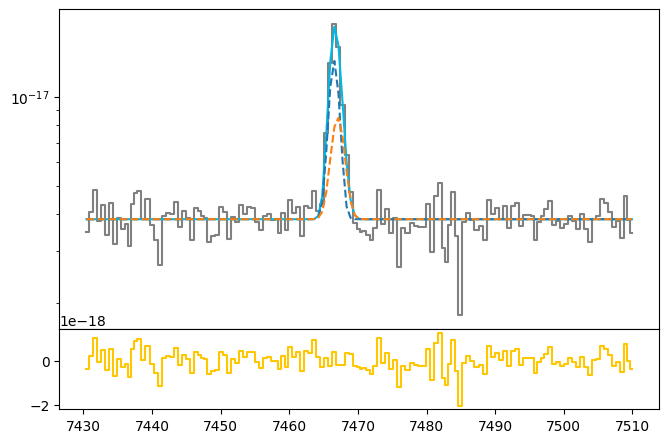

In [39]:
heia_nar_flux = out_hei7065.flatchain.Hei7065_nar.mean()
heia_nar_std = out_hei7065.flatchain.Hei7065_nar.std()

heia_brd_flux = out_hei7065.flatchain.Hei7065_brd.mean()
heia_brd_std = out_hei7065.flatchain.Hei7065_brd.std()

z_heia = out_hei7065.flatchain.z_nar.mean()
z_heia_std = out_hei7065.flatchain.z_nar.std()

bkg_heia = out_hei7065.flatchain.bkg.mean()
bkg_heia_std = out_hei7065.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_7065.wavelength, hei_7065.flux, color='gray', label='Data', where='mid')

heia_nar = gaussian(hei_7065.wavelength, heia_nar_flux, wave_cat['HeI7065'], z_heia, upy.nominal_values(sigma_nar_7065))
heia_brd = gaussian(hei_7065.wavelength, heia_brd_flux, wave_cat['HeI7065'], z_heia * z_ratio, upy.nominal_values(sigma_brd_7065))

heia = heia_nar + heia_brd

ax.plot(hei_7065.wavelength, bkg_heia + heia, color=c[0])
ax.plot(hei_7065.wavelength, bkg_heia + heia_nar, ls='--')
ax.plot(hei_7065.wavelength, bkg_heia + heia_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_7065.wavelength, hei_7065.flux - bkg_heia - heia, color=c[3], where='mid')

In [40]:
# EW
EW_HeI_7065_nar = ufloat(heia_nar_flux, heia_nar_std) / ufloat(bkg_heia, bkg_heia_std)
EW_HeI_7065_brd = ufloat(heia_brd_flux, heia_brd_std) / ufloat(bkg_heia, bkg_heia_std)
EW_HeI_7065 = (ufloat(heia_nar_flux, heia_nar_std) + ufloat(heia_brd_flux, heia_brd_std)) / ufloat(bkg_heia, bkg_heia_std)

# HeI 6678

In [41]:
sigma_arc_6678 = (m * wave_cat['HeI6678']*(1 + z_BN[igal])) + n

sigma_nar_6678 = sigma_arc_6678
sigma_brd_6678 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6678**2))

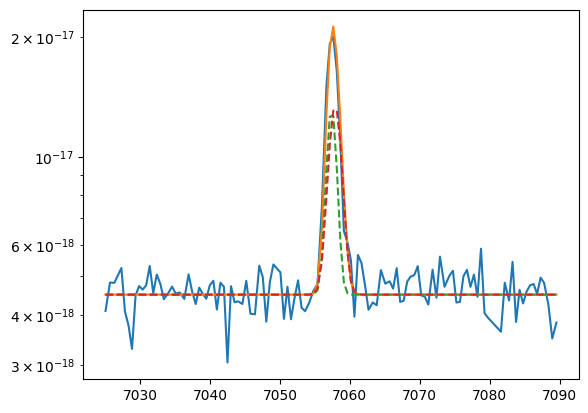

In [42]:
plt.plot(hei_6678.wavelength, hei_6678.flux)
bkg = 0.45e-17

hei6678_nar = gaussian(hei_6678.wavelength, 1.5e-17, wave_cat['HeI6678'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6678))
hei6678_brd = gaussian(hei_6678.wavelength, 2e-17, wave_cat['HeI6678'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6678))

hei6678 = hei6678_nar + hei6678_brd

plt.plot(hei_6678.wavelength, hei6678 + bkg)
plt.plot(hei_6678.wavelength, hei6678_nar + bkg, ls='--')
plt.plot(hei_6678.wavelength, hei6678_brd + bkg, ls='--')
plt.yscale('log')

In [43]:
params_6678 = Parameters()
params_6678.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_6678.add('z_ratio', value=z_ratio, vary=False)
params_6678.add('sigma_hei6678_nar', value=upy.nominal_values(sigma_nar_6678), vary=False)
params_6678.add('sigma_hei6678_brd', value=upy.nominal_values(sigma_brd_6678), vary=False)
params_6678.add('Hei6678_nar', value=1.5e-17, min=0.)
params_6678.add('Hei6678_brd', value=2.0e-17, min=0.)
params_6678.add('bkg', value=0.45e-17, min=0.)

def residual_hei6678(params_6678, x, data, uncertainty):
    
    z_nar = params_6678['z_nar']
    z_brd = params_6678['z_nar'] * params_6678['z_ratio']
    sigma_hei6678_nar = params_6678['sigma_hei6678_nar']
    sigma_hei6678_brd = params_6678['sigma_hei6678_brd']
    hei6678_nar_flux = params_6678['Hei6678_nar']
    hei6678_brd_flux = params_6678['Hei6678_brd']
    bkg = params_6678['bkg']
    
    x = hei_6678.wavelength
    model = gaussian(x, hei6678_nar_flux, wave_cat['HeI6678'], z_nar, sigma_hei6678_nar) + \
            gaussian(x, hei6678_brd_flux, wave_cat['HeI6678'], z_brd, sigma_hei6678_brd)
    return (model + bkg - hei_6678.flux) / hei_6678.noise

In [44]:
np.random.seed(1146)
out_hei6678 = minimize(residual_hei6678, params_6678, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 133.56it/s]


In [45]:
out_hei6678.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05676494,8.5326e-06,(0.02%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_hei6678_nar,0.68541037,,,0.6854103691300999,-inf,inf,False
sigma_hei6678_brd,0.89304538,,,0.893045381793749,-inf,inf,False
Hei6678_nar,1.3561e-17,3.1309e-18,(23.09%),1.5e-17,0.00000000,inf,True
Hei6678_brd,2.0194e-17,3.4251e-18,(16.96%),2e-17,0.00000000,inf,True
bkg,4.5836e-18,3.9060e-20,(0.85%),4.5e-18,0.00000000,inf,True


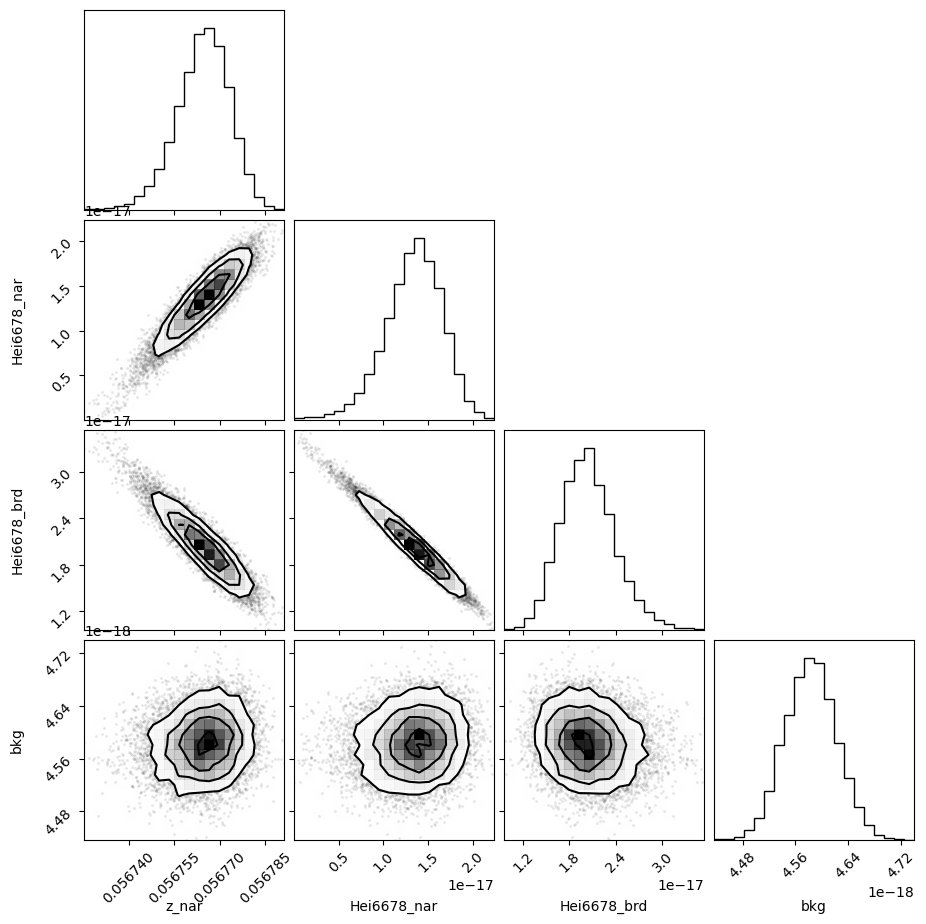

In [46]:
corner.corner(out_hei6678.flatchain, labels=out_hei6678.var_names);

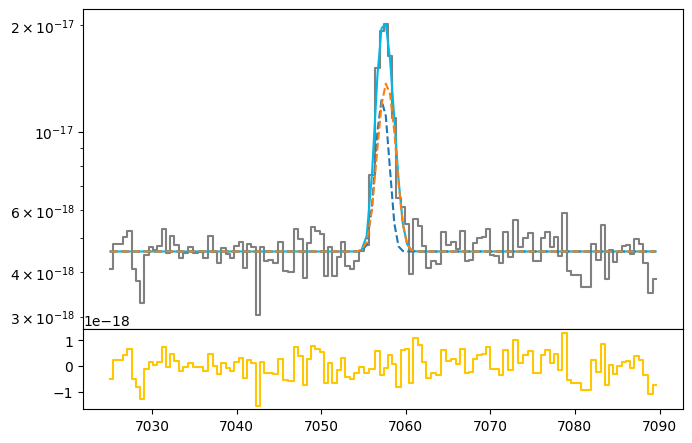

In [47]:
heib_nar_flux = out_hei6678.flatchain.Hei6678_nar.mean()
heib_nar_std = out_hei6678.flatchain.Hei6678_nar.std()

heib_brd_flux = out_hei6678.flatchain.Hei6678_brd.mean()
heib_brd_std = out_hei6678.flatchain.Hei6678_brd.std()

z_heib = out_hei6678.flatchain.z_nar.mean()
z_heib_std = out_hei6678.flatchain.z_nar.std()

bkg_heib = out_hei6678.flatchain.bkg.mean()
bkg_heib_std = out_hei6678.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_6678.wavelength, hei_6678.flux, color='gray', label='Data', where='mid')

heib_nar = gaussian(hei_6678.wavelength, heib_nar_flux, wave_cat['HeI6678'], z_heib, upy.nominal_values(sigma_nar_6678))
heib_brd = gaussian(hei_6678.wavelength, heib_brd_flux, wave_cat['HeI6678'], z_heib * z_ratio, upy.nominal_values(sigma_brd_6678))

heib = heib_nar + heib_brd

ax.plot(hei_6678.wavelength, bkg_heib + heib, color=c[0])
ax.plot(hei_6678.wavelength, bkg_heib + heib_nar, ls='--')
ax.plot(hei_6678.wavelength, bkg_heib + heib_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_6678.wavelength, hei_6678.flux - bkg_heib - heib, color=c[3], where='mid')

In [48]:
# EW
EW_HeI_6678_nar = ufloat(heib_nar_flux, heib_nar_std) / ufloat(bkg_heib, bkg_heib_std)
EW_HeI_6678_brd = ufloat(heib_brd_flux, heib_brd_std) / ufloat(bkg_heib, bkg_heib_std)
EW_HeI_6678 = (ufloat(heib_nar_flux, heib_nar_std) + ufloat(heib_brd_flux, heib_brd_std)) / ufloat(bkg_heib, bkg_heib_std)

# HeI 5875

In [49]:
sigma_arc_5875 = (m * wave_cat['HeI5875']*(1 + z_BN[igal])) + n

sigma_nar_5875 = sigma_arc_5875
sigma_brd_5875 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_5875**2))

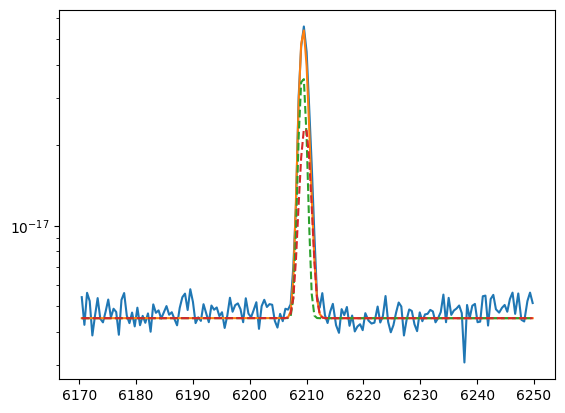

In [50]:
plt.plot(hei_5875.wavelength, hei_5875.flux)
bkg = 0.45e-17

hei5875_nar = gaussian(hei_5875.wavelength, 5e-17, wave_cat['HeI5875'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_5875))
hei5875_brd = gaussian(hei_5875.wavelength, 4e-17, wave_cat['HeI5875'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_5875))

hei5875 = hei5875_nar + hei5875_brd

plt.plot(hei_5875.wavelength, hei5875 + bkg)
plt.plot(hei_5875.wavelength, hei5875_nar + bkg, ls='--')
plt.plot(hei_5875.wavelength, hei5875_brd + bkg, ls='--')
plt.yscale('log')

In [51]:
params_5875 = Parameters()
params_5875.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_5875.add('z_ratio', value=z_ratio, vary=False)
params_5875.add('sigma_hei5875_nar', value=upy.nominal_values(sigma_nar_5875), vary=False)
params_5875.add('sigma_hei5875_brd', value=upy.nominal_values(sigma_brd_5875), vary=False)
params_5875.add('Hei5875_nar', value=5e-17, min=0.)
params_5875.add('Hei5875_brd', value=4e-17, min=0.)
params_5875.add('bkg', value=0.45e-17, min=0.)

def residual_hei5875(params_5875, x, data, uncertainty):
    
    z_nar = params_5875['z_nar']
    z_brd = params_5875['z_nar'] * params_5875['z_ratio']
    sigma_hei5875_nar = params_5875['sigma_hei5875_nar']
    sigma_hei5875_brd = params_5875['sigma_hei5875_brd']
    hei5875_nar_flux = params_5875['Hei5875_nar']
    hei5875_brd_flux = params_5875['Hei5875_brd']
    bkg = params_5875['bkg']
    
    x = hei_5875.wavelength
    model = gaussian(x, hei5875_nar_flux, wave_cat['HeI5875'], z_nar, sigma_hei5875_nar) + \
            gaussian(x, hei5875_brd_flux, wave_cat['HeI5875'], z_brd, sigma_hei5875_brd)
    return (model + bkg - hei_5875.flux) / hei_5875.noise

In [52]:
np.random.seed(1146)
out_hei5875 = minimize(residual_hei5875, params_5875, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:19<00:00, 126.64it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [58.4197459  66.92167325 75.53426813 43.21861074]


In [53]:
out_hei5875.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05679206,2.5602e-06,(0.00%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_hei5875_nar,0.60791398,,,0.6079139794270999,-inf,inf,False
sigma_hei5875_brd,0.83504616,,,0.8350461581343727,-inf,inf,False
Hei5875_nar,4.0403e-17,2.5624e-18,(6.34%),5e-17,0.00000000,inf,True
Hei5875_brd,5.6250e-17,2.8276e-18,(5.03%),4e-17,0.00000000,inf,True
bkg,4.7181e-18,2.9427e-20,(0.62%),4.5e-18,0.00000000,inf,True


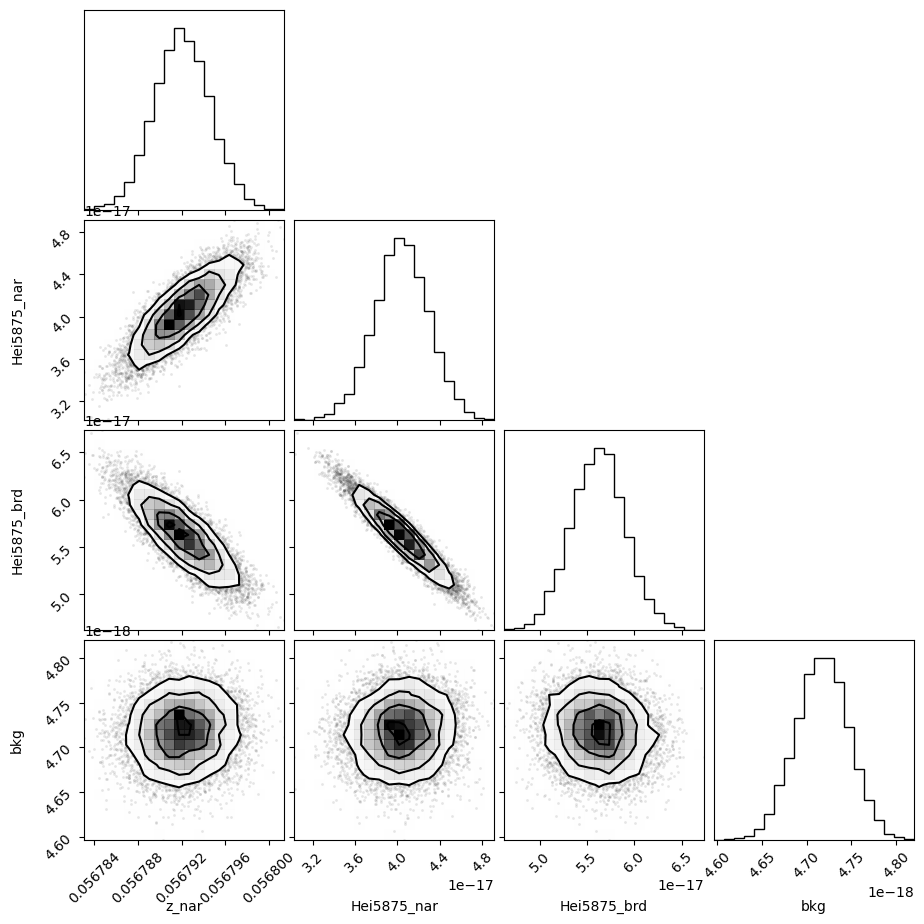

In [54]:
corner.corner(out_hei5875.flatchain, labels=out_hei5875.var_names);

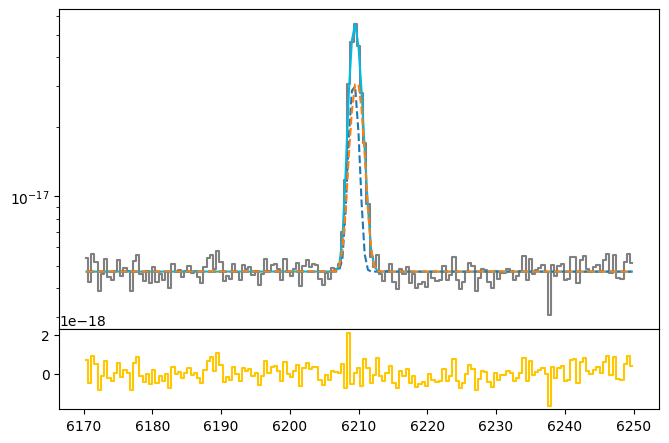

In [55]:
heic_nar_flux = out_hei5875.flatchain.Hei5875_nar.mean()
heic_nar_std = out_hei5875.flatchain.Hei5875_nar.std()

heic_brd_flux = out_hei5875.flatchain.Hei5875_brd.mean()
heic_brd_std = out_hei5875.flatchain.Hei5875_brd.std()

z_heic = out_hei5875.flatchain.z_nar.mean()
z_heic_std = out_hei5875.flatchain.z_nar.std()

bkg_heic = out_hei5875.flatchain.bkg.mean()
bkg_heic_std = out_hei5875.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_5875.wavelength, hei_5875.flux, color='gray', label='Data', where='mid')

heic_nar = gaussian(hei_5875.wavelength, heic_nar_flux, wave_cat['HeI5875'], z_heic, upy.nominal_values(sigma_nar_5875))
heic_brd = gaussian(hei_5875.wavelength, heic_brd_flux, wave_cat['HeI5875'], z_heic * z_ratio, upy.nominal_values(sigma_brd_5875))

heic = heic_nar + heic_brd

ax.plot(hei_5875.wavelength, bkg_heic + heic, color=c[0])
ax.plot(hei_5875.wavelength, bkg_heic + heic_nar, ls='--')
ax.plot(hei_5875.wavelength, bkg_heic + heic_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_5875.wavelength, hei_5875.flux - bkg_heic - heic, color=c[3], where='mid')

In [56]:
# EW
EW_HeI_5875_nar = ufloat(heic_nar_flux, heic_nar_std) / ufloat(bkg_heic, bkg_heic_std)
EW_HeI_5875_brd = ufloat(heic_brd_flux, heic_brd_std) / ufloat(bkg_heic, bkg_heic_std)
EW_HeI_5875 = (ufloat(heic_nar_flux, heic_nar_std) + ufloat(heic_brd_flux, heic_brd_std)) / ufloat(bkg_heic, bkg_heic_std)

# HeI 4471

In [57]:
sigma_arc_4471 = (m * wave_cat['HeI4471']*(1 + z_BN[igal])) + n

sigma_nar_4471 = sigma_arc_4471
sigma_brd_4471 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4471**2))

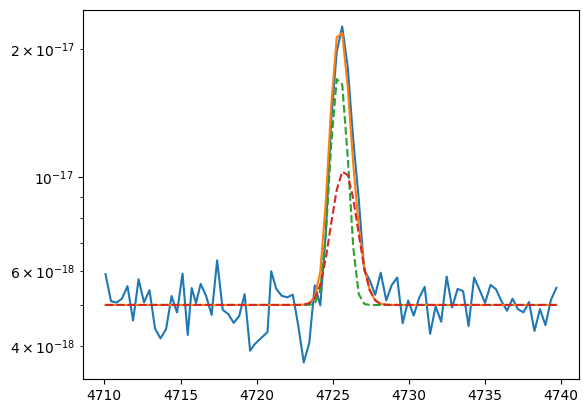

In [58]:
plt.plot(hei_4471.wavelength, hei_4471.flux)
bkg = 0.5e-17

hei4471_nar = gaussian(hei_4471.wavelength, 1.5e-17, wave_cat['HeI4471'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4471))
hei4471_brd = gaussian(hei_4471.wavelength, 1.0e-17, wave_cat['HeI4471'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4471))

hei4471 = hei4471_nar + hei4471_brd

plt.plot(hei_4471.wavelength, hei4471 + bkg)
plt.plot(hei_4471.wavelength, hei4471_nar + bkg, ls='--')
plt.plot(hei_4471.wavelength, hei4471_brd + bkg, ls='--')
plt.yscale('log')

In [59]:
params_4471 = Parameters()
params_4471.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_4471.add('z_ratio', value=z_ratio, vary=False)
params_4471.add('sigma_hei4471_nar', value=upy.nominal_values(sigma_nar_4471), vary=False)
params_4471.add('sigma_hei4471_brd', value=upy.nominal_values(sigma_brd_4471), vary=False)
params_4471.add('Hei4471_nar', value=1.5e-17, min=0.)
params_4471.add('Hei4471_brd', value=1.0e-17, min=0.)
params_4471.add('bkg', value=0.5e-17, min=0.)

def residual_hei4471(params_4471, x, data, uncertainty):
    
    z_nar = params_4471['z_nar']
    z_brd = params_4471['z_nar'] * params_4471['z_ratio']
    sigma_hei4471_nar = params_4471['sigma_hei4471_nar']
    sigma_hei4471_brd = params_4471['sigma_hei4471_brd']
    hei4471_nar_flux = params_4471['Hei4471_nar']
    hei4471_brd_flux = params_4471['Hei4471_brd']
    bkg = params_4471['bkg']
    
    x = hei_4471.wavelength
    model = gaussian(x, hei4471_nar_flux, wave_cat['HeI4471'], z_nar, sigma_hei4471_nar) + \
            gaussian(x, hei4471_brd_flux, wave_cat['HeI4471'], z_brd, sigma_hei4471_brd)
    return (model + bkg - hei_4471.flux) / hei_4471.noise

In [60]:
np.random.seed(1146)
out_hei4471 = minimize(residual_hei4471, params_4471, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 133.85it/s]


In [61]:
out_hei4471.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05681077,5.4303e-06,(0.01%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_hei4471_nar,0.47232298,,,0.47232298266101996,-inf,inf,False
sigma_hei4471_brd,0.74218036,,,0.7421803552923544,-inf,inf,False
Hei4471_nar,1.4673e-17,1.4300e-18,(9.75%),1.5e-17,0.00000000,inf,True
Hei4471_brd,1.0638e-17,1.7800e-18,(16.73%),1e-17,0.00000000,inf,True
bkg,5.0336e-18,6.7302e-20,(1.34%),5e-18,0.00000000,inf,True


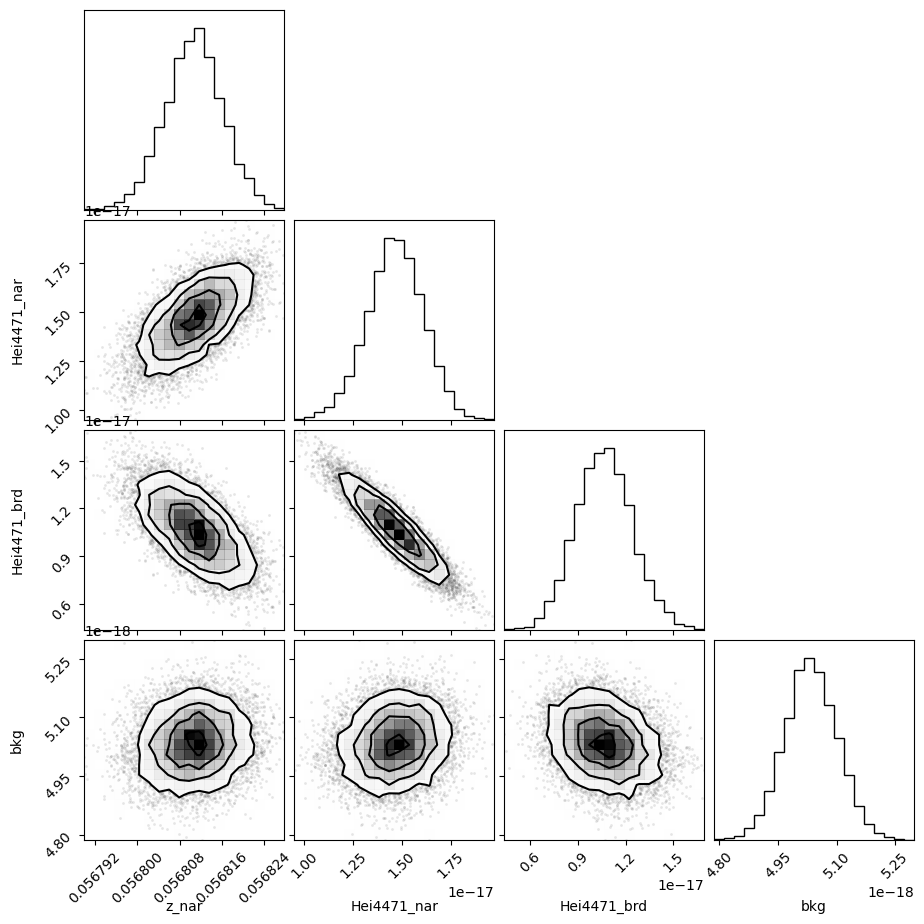

In [62]:
corner.corner(out_hei4471.flatchain, labels=out_hei4471.var_names);

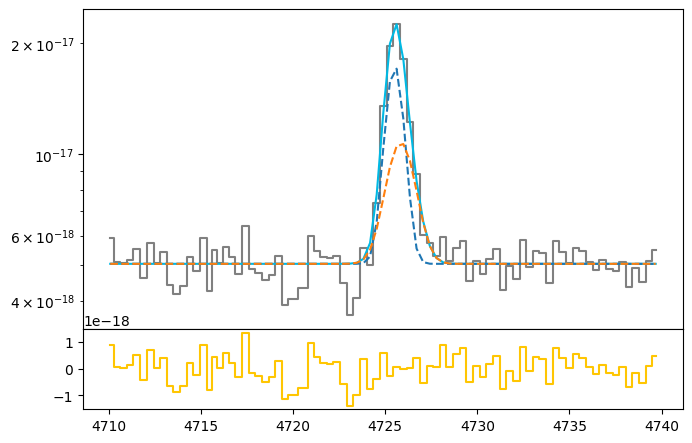

In [63]:
heid_nar_flux = out_hei4471.flatchain.Hei4471_nar.mean()
heid_nar_std = out_hei4471.flatchain.Hei4471_nar.std()

heid_brd_flux = out_hei4471.flatchain.Hei4471_brd.mean()
heid_brd_std = out_hei4471.flatchain.Hei4471_brd.std()

z_heid = out_hei4471.flatchain.z_nar.mean()
z_heid_std = out_hei4471.flatchain.z_nar.std()

bkg_heid = out_hei4471.flatchain.bkg.mean()
bkg_heid_std = out_hei4471.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_4471.wavelength, hei_4471.flux, color='gray', label='Data', where='mid')

heid_nar = gaussian(hei_4471.wavelength, heid_nar_flux, wave_cat['HeI4471'], z_heid, upy.nominal_values(sigma_nar_4471))
heid_brd = gaussian(hei_4471.wavelength, heid_brd_flux, wave_cat['HeI4471'], z_heid * z_ratio, upy.nominal_values(sigma_brd_4471))

heid = heid_nar + heid_brd

ax.plot(hei_4471.wavelength, bkg_heid + heid, color=c[0])
ax.plot(hei_4471.wavelength, bkg_heid + heid_nar, ls='--')
ax.plot(hei_4471.wavelength, bkg_heid + heid_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_4471.wavelength, hei_4471.flux - bkg_heid - heid, color=c[3], where='mid')

In [64]:
# EW
EW_HeI_4471_nar = ufloat(heid_nar_flux, heid_nar_std) / ufloat(bkg_heid, bkg_heid_std)
EW_HeI_4471_brd = ufloat(heid_brd_flux, heid_brd_std) / ufloat(bkg_heid, bkg_heid_std)
EW_HeI_4471 = (ufloat(heid_nar_flux, heid_nar_std) + ufloat(heid_brd_flux, heid_brd_std)) / ufloat(bkg_heid, bkg_heid_std)

# [SII]6716 + [SII]6730

In [65]:
sigma_arc_6730 = (m * wave_cat['[SII]6730']*(1 + z_BN[igal])) + n

sigma_nar_6730 = sigma_arc_6730
sigma_brd_6730 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6730**2))

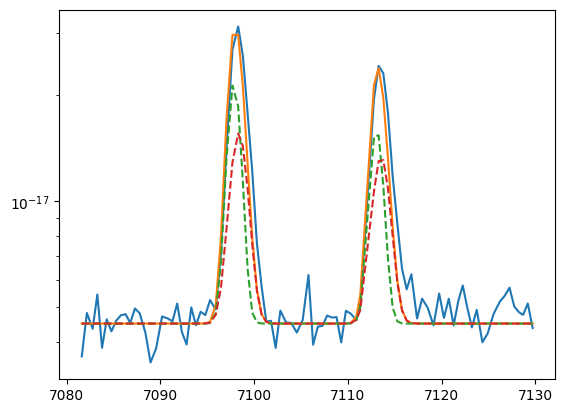

In [66]:
plt.plot(sii.wavelength, sii.flux)
bkg = 0.45e-17

siia_nar = gaussian(sii.wavelength, 2.0e-17, wave_cat['[SII]6730'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6730))
siia_brd = gaussian(sii.wavelength, 2.0e-17, wave_cat['[SII]6730'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6730))

siib_nar = gaussian(sii.wavelength, 3.0e-17, wave_cat['[SII]6716'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6730))
siib_brd = gaussian(sii.wavelength, 2.5e-17, wave_cat['[SII]6716'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6730))

siia = siia_nar + siia_brd
siib = siib_nar + siib_brd

plt.plot(sii.wavelength, siia + siib + bkg)
plt.plot(sii.wavelength, siia_nar + siib_nar + bkg, ls='--')
plt.plot(sii.wavelength, siia_brd + siib_brd + bkg, ls='--')
plt.yscale('log')

In [67]:
params_sii = Parameters()
params_sii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_sii.add('z_ratio', value=z_ratio, vary=False)
params_sii.add('sigma_nar', value=upy.nominal_values(sigma_nar_6730), vary=False)
params_sii.add('sigma_brd', value=upy.nominal_values(sigma_brd_6730), vary=False)
params_sii.add('Siia_nar', value=2.0e-17, min=0.)
params_sii.add('Siia_brd', value=2.0e-17, min=0.)
params_sii.add('Siib_nar', value=3.0e-17, min=0.)
params_sii.add('Siib_brd', value=2.5e-17, min=0.)
params_sii.add('bkg', value=0.45e-17, min=0.)


def residual_sii(params_sii, x, data, uncertainty):
    
    z_nar = params_sii['z_nar']
    z_brd = params_sii['z_nar'] * params_sii['z_ratio']
    sigma_nar = params_sii['sigma_nar']
    sigma_brd = params_sii['sigma_brd']
    siia_nar_flux = params_sii['Siia_nar']
    siia_brd_flux = params_sii['Siia_brd']
    siib_nar_flux = params_sii['Siib_nar']
    siib_brd_flux = params_sii['Siib_brd']
    bkg = params_sii['bkg']
    
    x = sii.wavelength
    model_siia = gaussian(x, siia_nar_flux, wave_cat['[SII]6730'], z_nar, sigma_nar) + \
                 gaussian(x, siia_brd_flux, wave_cat['[SII]6730'], z_brd, sigma_brd)
    model_siib = gaussian(x, siib_nar_flux, wave_cat['[SII]6716'], z_nar, sigma_nar) + \
                 gaussian(x, siib_brd_flux, wave_cat['[SII]6716'], z_brd, sigma_brd)
    model = model_siia + model_siib
    return (model + bkg - sii.flux) / sii.noise

In [68]:
np.random.seed(1146)
out_sii = minimize(residual_sii, params_sii, args=(1, 1, 1),
                    method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:25<00:00, 97.99it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [71.43060833 94.1715732  97.79006508 88.02604177 88.64940679 52.78318046]


In [69]:
out_sii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05680592,4.9578e-06,(0.01%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_nar,0.69049587,,,0.6904958735564999,-inf,inf,False
sigma_brd,0.89695442,,,0.8969544198177726,-inf,inf,False
Siia_nar,1.0475e-17,2.4694e-18,(23.57%),2e-17,0.00000000,inf,True
Siia_brd,3.3461e-17,2.7122e-18,(8.11%),2e-17,0.00000000,inf,True
Siib_nar,1.7666e-17,3.2607e-18,(18.46%),3e-17,0.00000000,inf,True
Siib_brd,4.0708e-17,3.4803e-18,(8.55%),2.5e-17,0.00000000,inf,True
bkg,4.7165e-18,5.0078e-20,(1.06%),4.5e-18,0.00000000,inf,True


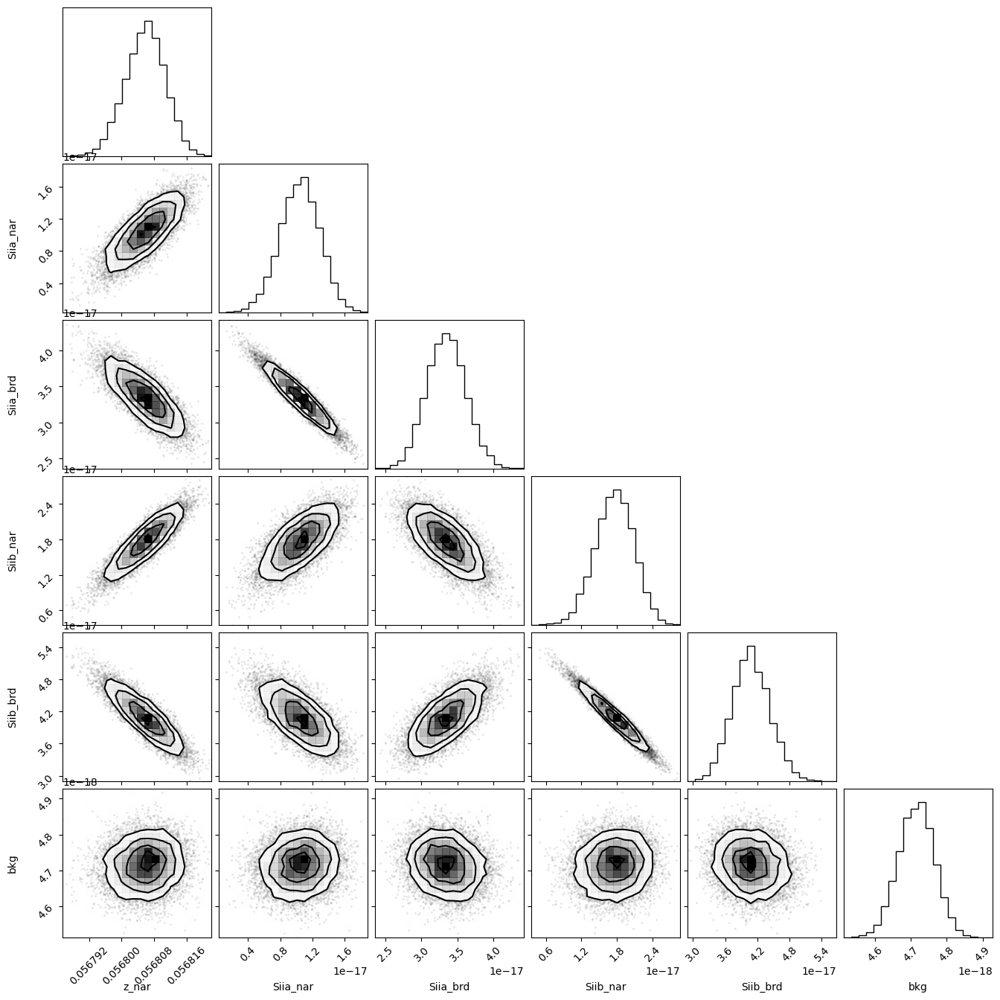

In [70]:
corner.corner(out_sii.flatchain, labels=out_sii.var_names);

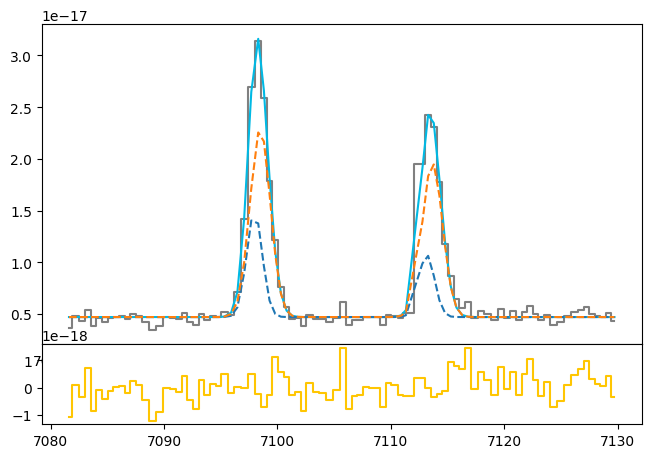

In [71]:
siia_nar_flux = out_sii.flatchain.Siia_nar.mean()
siia_nar_std = out_sii.flatchain.Siia_nar.std()

siia_brd_flux = out_sii.flatchain.Siia_brd.mean()
siia_brd_std = out_sii.flatchain.Siia_brd.std()

siib_nar_flux = out_sii.flatchain.Siib_nar.mean()
siib_nar_std = out_sii.flatchain.Siib_nar.std()

siib_brd_flux = out_sii.flatchain.Siib_brd.mean()
siib_brd_std = out_sii.flatchain.Siib_brd.std()

z_sii = out_sii.flatchain.z_nar.mean()
z_sii_std = out_sii.flatchain.z_nar.std()

bkg_sii = out_sii.flatchain.bkg.mean()
bkg_sii_std = out_sii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(sii.wavelength, sii.flux, color='gray', label='Data', where='mid')

siia_nar = gaussian(sii.wavelength, siia_nar_flux, wave_cat['[SII]6730'], z_sii, upy.nominal_values(sigma_nar_6730))
siib_nar = gaussian(sii.wavelength, siib_nar_flux, wave_cat['[SII]6716'], z_sii, upy.nominal_values(sigma_nar_6730))

siia_brd = gaussian(sii.wavelength, siia_brd_flux, wave_cat['[SII]6730'], z_sii * z_ratio, upy.nominal_values(sigma_brd_6730))
siib_brd = gaussian(sii.wavelength, siib_brd_flux, wave_cat['[SII]6716'], z_sii * z_ratio, upy.nominal_values(sigma_brd_6730))

siia = siia_nar + siia_brd
siib = siib_nar + siib_brd

ax.plot(sii.wavelength, bkg_sii + siia + siib, color=c[0])
ax.plot(sii.wavelength, bkg_sii + siia_nar + siib_nar, ls='--')
ax.plot(sii.wavelength, bkg_sii + siia_brd + siib_brd, ls='--')
#plt.yscale('log')
ax1.step(sii.wavelength, sii.flux - bkg_sii - siia - siib, color=c[3], where='mid')

In [72]:
# EW
EW_SII_6730_nar = ufloat(siia_nar_flux, siia_nar_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6730_brd = ufloat(siia_brd_flux, siia_brd_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6730 = (ufloat(siia_nar_flux, siia_nar_std) + ufloat(siia_brd_flux, siia_brd_std)) / ufloat(bkg_sii, bkg_sii_std)

EW_SII_6716_nar = ufloat(siib_nar_flux, siib_nar_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6716_brd = ufloat(siib_brd_flux, siib_brd_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6716 = (ufloat(siib_nar_flux, siib_nar_std) + ufloat(siib_brd_flux, siib_brd_std)) / ufloat(bkg_sii, bkg_sii_std)

# H$\beta$

In [73]:
sigma_arc_hb = (m * wave_cat['Hb']*(1 + z_BN[igal])) + n

sigma_nar_hb = sigma_arc_hb
sigma_brd_hb = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hb**2))

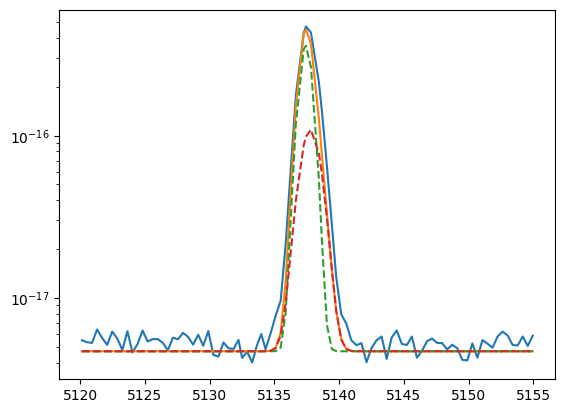

In [74]:
plt.plot(hbeta.wavelength, hbeta.flux)
bkg = 0.47e-17

hb_nar = gaussian(hbeta.wavelength, 45e-17, wave_cat['Hb'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hb))
hb_brd = gaussian(hbeta.wavelength, 20e-17, wave_cat['Hb'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hb))

hb = hb_nar + hb_brd

plt.plot(hbeta.wavelength, hb + bkg)
plt.plot(hbeta.wavelength, hb_nar + bkg, ls='--')
plt.plot(hbeta.wavelength, hb_brd + bkg, ls='--')
plt.yscale('log')

In [75]:
params_hb = Parameters()
params_hb.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hb.add('z_ratio', value=z_ratio, vary=False)
params_hb.add('sigma_nar', value=upy.nominal_values(sigma_nar_hb), vary=False)
params_hb.add('sigma_brd', value=upy.nominal_values(sigma_brd_hb), vary=False)
params_hb.add('Hb_nar', value=45e-17, min=0.)
params_hb.add('Hb_brd', value=20e-17, min=0.)
params_hb.add('bkg', value=0.47e-17, min=0.)

def residual_hb(params_hb, x, data, uncertainty):
    
    z_nar = params_hb['z_nar']
    z_brd = params_hb['z_nar'] * params_hb['z_ratio']
    sigma_nar = params_hb['sigma_nar']
    sigma_brd = params_hb['sigma_brd']
    hb_nar_flux = params_hb['Hb_nar']
    hb_brd_flux = params_hb['Hb_brd']
    bkg = params_hb['bkg']
    
    x = hbeta.wavelength
    model = gaussian(x, hb_nar_flux, wave_cat['Hb'], z_nar, sigma_nar) + \
            gaussian(x, hb_brd_flux, wave_cat['Hb'], z_brd, sigma_brd)
    return (model + bkg - hbeta.flux) / hbeta.noise

In [76]:
np.random.seed(1146)
out_hb = minimize(residual_hb, params_hb, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 134.27it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [124.97102658 130.2473686  124.24630842  57.1989305 ]


In [77]:
out_hb.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05678410,5.9408e-07,(0.00%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_nar,0.50997080,,,0.5099707988850001,-inf,inf,False
sigma_brd,0.76668957,,,0.7666895692178735,-inf,inf,False
Hb_nar,2.9640e-16,5.0662e-18,(1.71%),4.5e-16,0.00000000,inf,True
Hb_brd,4.9235e-16,5.4764e-18,(1.11%),2e-16,0.00000000,inf,True
bkg,5.3173e-18,5.0842e-20,(0.96%),4.7e-18,0.00000000,inf,True


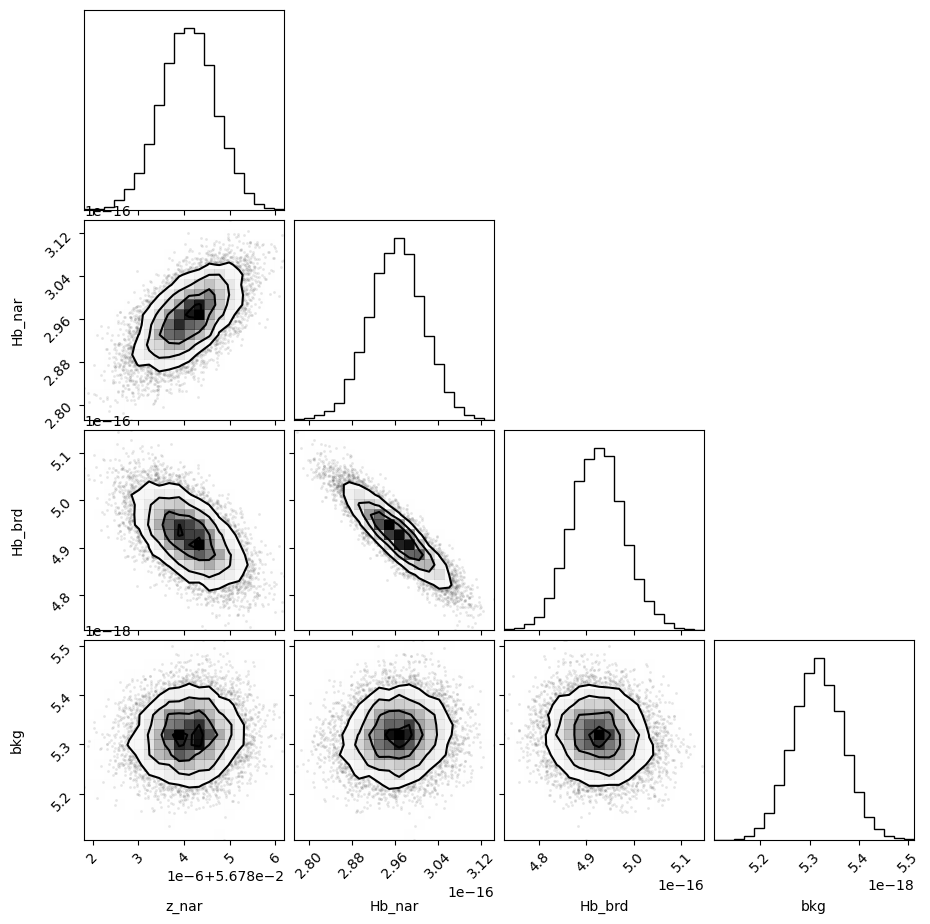

In [78]:
corner.corner(out_hb.flatchain, labels=out_hb.var_names);

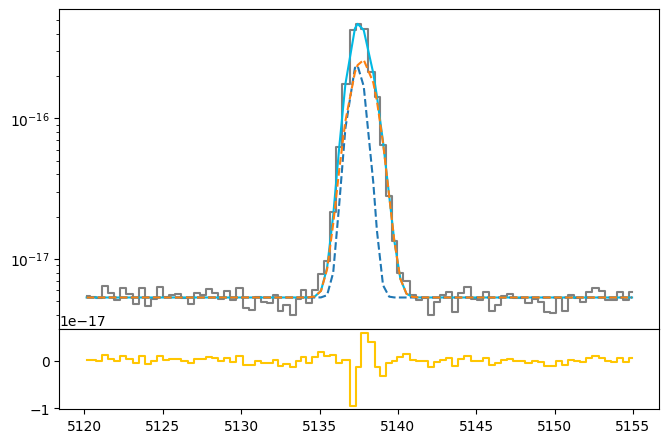

In [79]:
hb_nar_flux = out_hb.flatchain.Hb_nar.mean()
hb_nar_std = out_hb.flatchain.Hb_nar.std()

hb_brd_flux = out_hb.flatchain.Hb_brd.mean()
hb_brd_std = out_hb.flatchain.Hb_brd.std()

z_hb = out_hb.flatchain.z_nar.mean()
z_hb_std = out_hb.flatchain.z_nar.std()

bkg_hb = out_hb.flatchain.bkg.mean()
bkg_hb_std = out_hb.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hbeta.wavelength, hbeta.flux, color='gray', label='Data', where='mid')

hb_nar = gaussian(hbeta.wavelength, hb_nar_flux, wave_cat['Hb'], z_hb, upy.nominal_values(sigma_nar_hb))
hb_brd = gaussian(hbeta.wavelength, hb_brd_flux, wave_cat['Hb'], z_hb * z_ratio, upy.nominal_values(sigma_brd_hb))

hb = hb_nar + hb_brd

ax.plot(hbeta.wavelength, bkg_hb + hb, color=c[0])
ax.plot(hbeta.wavelength, bkg_hb + hb_nar, ls='--')
ax.plot(hbeta.wavelength, bkg_hb + hb_brd, ls='--')
ax.set_yscale('log')
ax1.step(hbeta.wavelength, hbeta.flux - bkg_hb - hb, color=c[3], where='mid')

In [80]:
# EW
EW_Hb_nar = ufloat(hb_nar_flux, hb_nar_std) / ufloat(bkg_hb, bkg_hb_std)
EW_Hb_brd = ufloat(hb_brd_flux, hb_brd_std) / ufloat(bkg_hb, bkg_hb_std)
EW_Hb = (ufloat(hb_nar_flux, hb_nar_std) + ufloat(hb_brd_flux, hb_brd_std)) / ufloat(bkg_hb, bkg_hb_std)

# H$\gamma$

In [81]:
sigma_arc_hg = (m * wave_cat['Hg']*(1 + z_BN[igal])) + n

sigma_nar_hg = sigma_arc_hg
sigma_brd_hg = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hg**2))

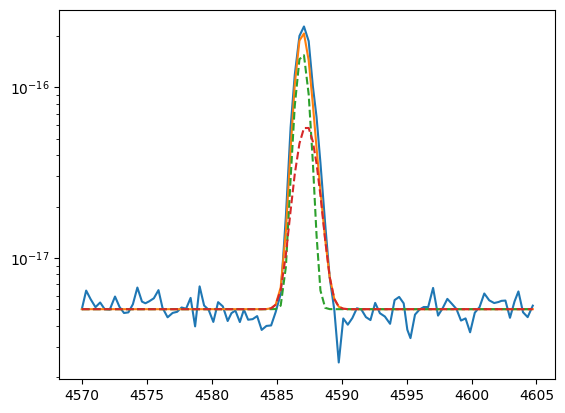

In [82]:
plt.plot(hgamma.wavelength, hgamma.flux)
bkg = 0.5e-17

hg_nar = gaussian(hgamma.wavelength, 18e-17, wave_cat['Hg'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hg))
hg_brd = gaussian(hgamma.wavelength, 10e-17, wave_cat['Hg'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hg))

hg = hg_nar + hg_brd

plt.plot(hgamma.wavelength, hg + bkg)
plt.plot(hgamma.wavelength, hg_nar + bkg, ls='--')
plt.plot(hgamma.wavelength, hg_brd + bkg, ls='--')
plt.yscale('log')

In [83]:
params_hg = Parameters()
params_hg.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hg.add('z_ratio', value=z_ratio, vary=False)
params_hg.add('sigma_nar', value=upy.nominal_values(sigma_nar_hg), vary=False)
params_hg.add('sigma_brd', value=upy.nominal_values(sigma_brd_hg), vary=False)
params_hg.add('Hg_nar', value=18e-17, min=0.)
params_hg.add('Hg_brd', value=10e-17, min=0.)
params_hg.add('bkg', value=0.5e-17, min=0.)

def residual_hg(params_hg, x, data, uncertainty):
    
    z_nar = params_hg['z_nar']
    z_brd = params_hg['z_nar'] * params_hg['z_ratio']
    sigma_nar = params_hg['sigma_nar']
    sigma_brd = params_hg['sigma_brd']
    hg_nar_flux = params_hg['Hg_nar']
    hg_brd_flux = params_hg['Hg_brd']
    bkg = params_hg['bkg']
    
    x = hgamma.wavelength
    model = gaussian(x, hg_nar_flux, wave_cat['Hg'], z_nar, sigma_nar) + \
            gaussian(x, hg_brd_flux, wave_cat['Hg'], z_brd, sigma_brd)
    return (model + bkg - hgamma.flux) / hgamma.noise

In [84]:
np.random.seed(1146)
out_hg = minimize(residual_hg, params_hg, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:19<00:00, 131.40it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 96.70305379 105.39553219 119.37264255  89.76735582]


In [85]:
out_hg.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05678940,1.2872e-06,(0.00%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_nar,0.45967216,,,0.45967216272719996,-inf,inf,False
sigma_brd,0.73419424,,,0.7341942365739359,-inf,inf,False
Hg_nar,1.6417e-16,3.7701e-18,(2.30%),1.8e-16,0.00000000,inf,True
Hg_brd,1.7099e-16,4.6016e-18,(2.69%),1e-16,0.00000000,inf,True
bkg,4.9014e-18,6.7645e-20,(1.38%),5e-18,0.00000000,inf,True


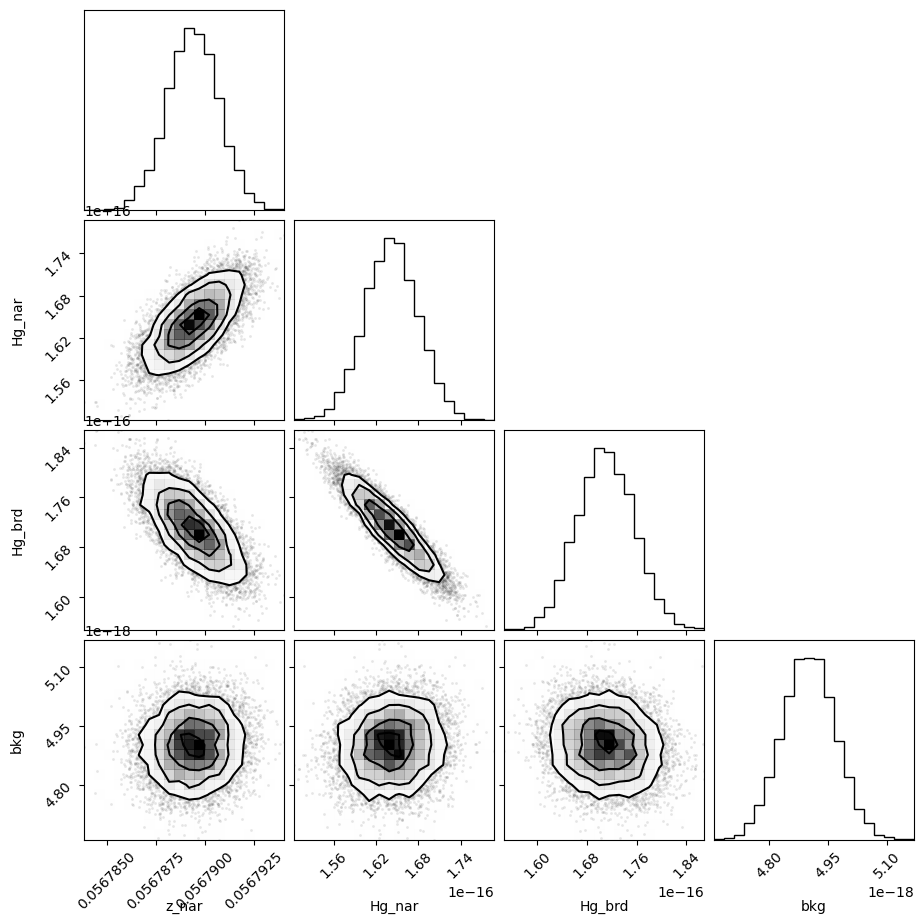

In [86]:
corner.corner(out_hg.flatchain, labels=out_hg.var_names);

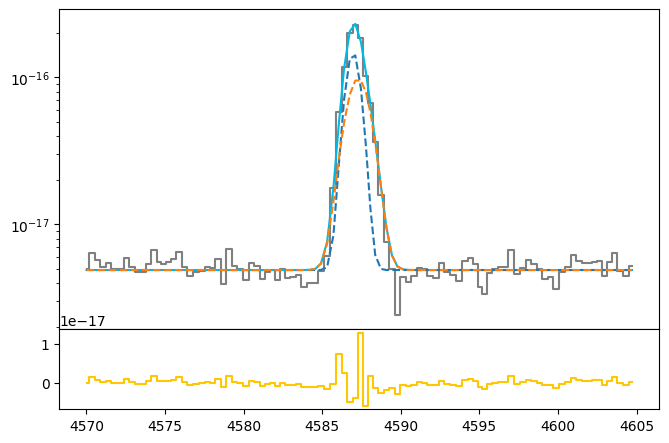

In [87]:
hg_nar_flux = out_hg.flatchain.Hg_nar.mean()
hg_nar_std = out_hg.flatchain.Hg_nar.std()

hg_brd_flux = out_hg.flatchain.Hg_brd.mean()
hg_brd_std = out_hg.flatchain.Hg_brd.std()

z_hg = out_hg.flatchain.z_nar.mean()
z_hg_std = out_hg.flatchain.z_nar.std()

bkg_hg = out_hg.flatchain.bkg.mean()
bkg_hg_std = out_hg.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hgamma.wavelength, hgamma.flux, color='gray', label='Data', where='mid')

hg_nar = gaussian(hgamma.wavelength, hg_nar_flux, wave_cat['Hg'],           z_hg, upy.nominal_values(sigma_nar_hg))
hg_brd = gaussian(hgamma.wavelength, hg_brd_flux, wave_cat['Hg'], z_hg * z_ratio, upy.nominal_values(sigma_brd_hg))

hg = hg_nar + hg_brd

ax.plot(hgamma.wavelength, bkg_hg + hg, color=c[0])
ax.plot(hgamma.wavelength, bkg_hg + hg_nar, ls='--')
ax.plot(hgamma.wavelength, bkg_hg + hg_brd, ls='--')
ax.set_yscale('log')
ax1.step(hgamma.wavelength, hgamma.flux - bkg_hg - hg, color=c[3], where='mid')

In [88]:
# EW
EW_Hg_nar = ufloat(hg_nar_flux, hg_nar_std) / ufloat(bkg_hg, bkg_hg_std)
EW_Hg_brd = ufloat(hg_brd_flux, hg_brd_std) / ufloat(bkg_hg, bkg_hg_std)
EW_Hg = (ufloat(hg_nar_flux, hg_nar_std) + ufloat(hg_brd_flux, hg_brd_std)) / ufloat(bkg_hg, bkg_hg_std)

# H$\delta$

In [89]:
sigma_arc_hd = (m * wave_cat['Hd']*(1 + z_BN[igal])) + n

sigma_nar_hd = sigma_arc_hd
sigma_brd_hd = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_hd**2))

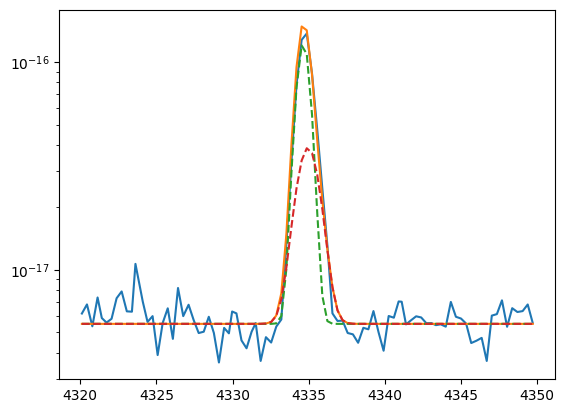

In [90]:
plt.plot(hdelta.wavelength, hdelta.flux)
bkg = 0.55e-17

hd_nar = gaussian(hdelta.wavelength, 13e-17, wave_cat['Hd'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_hd))
hd_brd = gaussian(hdelta.wavelength,  6e-17, wave_cat['Hd'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_hd))

hd = hd_nar + hd_brd

plt.plot(hdelta.wavelength, hd + bkg)
plt.plot(hdelta.wavelength, hd_nar + bkg, ls='--')
plt.plot(hdelta.wavelength, hd_brd + bkg, ls='--')
plt.yscale('log')

In [91]:
params_hd = Parameters()
params_hd.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_hd.add('z_ratio', value=z_ratio, vary=False)
params_hd.add('sigma_nar', value=upy.nominal_values(sigma_nar_hd), vary=False)
params_hd.add('sigma_brd', value=upy.nominal_values(sigma_brd_hd), vary=False)
params_hd.add('Hd_nar', value=13e-17, min=0.)
params_hd.add('Hd_brd', value=6e-17, min=0.)
params_hd.add('bkg', value=0.55e-17, min=0.)

def residual_hd(params_hd, x, data, uncertainty):
    
    z_nar = params_hd['z_nar']
    z_brd = params_hd['z_nar'] * params_hd['z_ratio']
    sigma_nar = params_hd['sigma_nar']
    sigma_brd = params_hd['sigma_brd']
    hd_nar_flux = params_hd['Hd_nar']
    hd_brd_flux = params_hd['Hd_brd']
    bkg = params_hd['bkg']
    
    x = hdelta.wavelength
    model = gaussian(x, hd_nar_flux, wave_cat['Hd'], z_nar, sigma_nar) + \
            gaussian(x, hd_brd_flux, wave_cat['Hd'], z_brd, sigma_brd)
    return (model + bkg - hdelta.flux) / hdelta.noise

In [92]:
np.random.seed(1146)
out_hd = minimize(residual_hd, params_hd, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 132.81it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [36.93738036 55.25354561 41.53022262 42.17931089]


In [93]:
out_hd.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05680170,1.3933e-06,(0.00%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_nar,0.43661611,,,0.43661611306953263,-inf,inf,False
sigma_brd,0.71998355,,,0.7199835484398447,-inf,inf,False
Hd_nar,1.1310e-16,2.5528e-18,(2.26%),1.3e-16,0.00000000,inf,True
Hd_brd,6.2632e-17,2.8628e-18,(4.57%),6e-17,0.00000000,inf,True
bkg,5.5376e-18,8.8917e-20,(1.61%),5.5e-18,0.00000000,inf,True


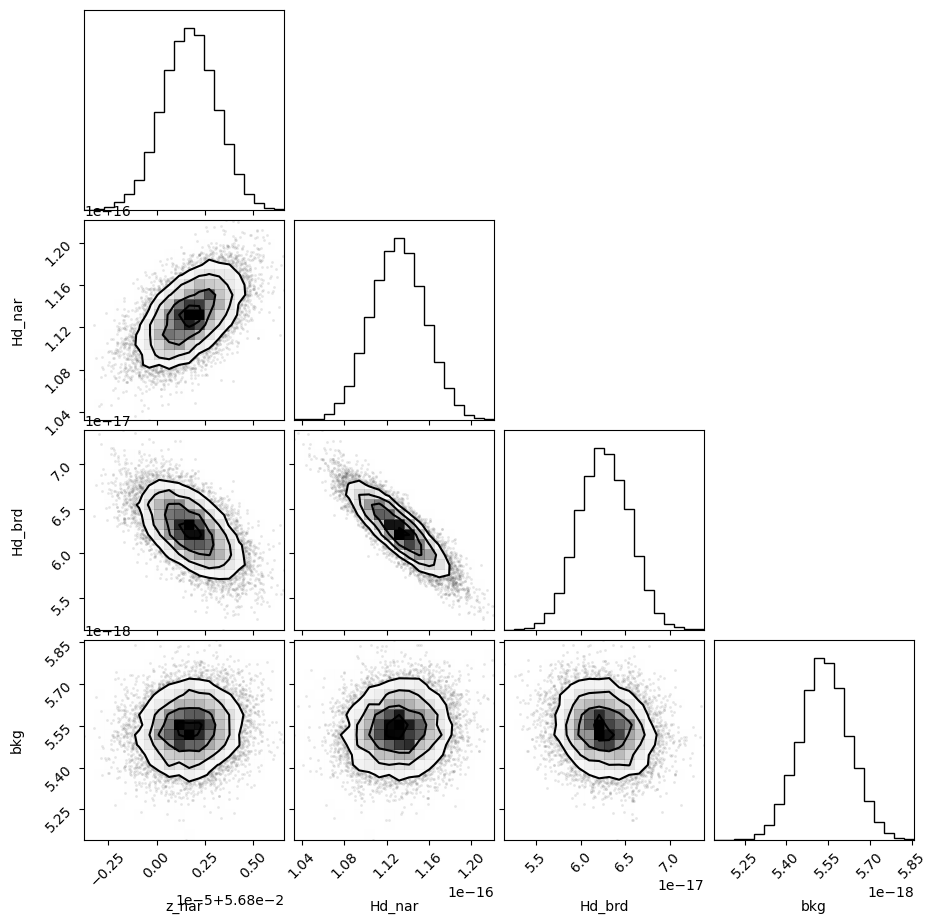

In [94]:
corner.corner(out_hd.flatchain, labels=out_hd.var_names);

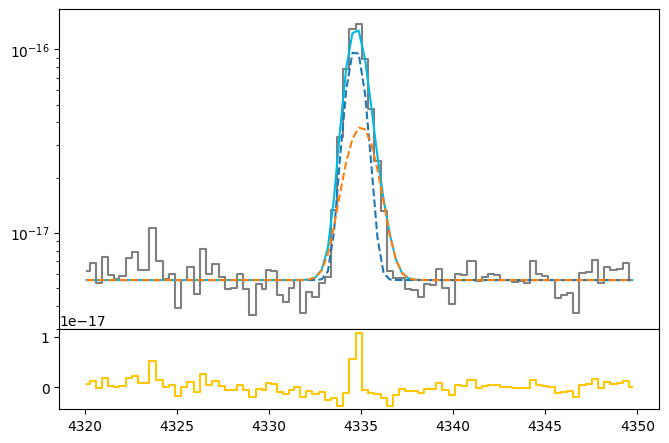

In [95]:
hd_nar_flux = out_hd.flatchain.Hd_nar.mean()
hd_nar_std = out_hd.flatchain.Hd_nar.std()

hd_brd_flux = out_hd.flatchain.Hd_brd.mean()
hd_brd_std = out_hd.flatchain.Hd_brd.std()

z_hd = out_hd.flatchain.z_nar.mean()
z_hd_std = out_hd.flatchain.z_nar.std()

bkg_hd = out_hd.flatchain.bkg.mean()
bkg_hd_std = out_hd.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hdelta.wavelength, hdelta.flux, color='gray', label='Data', where='mid')

hd_nar = gaussian(hdelta.wavelength, hd_nar_flux, wave_cat['Hd'], z_hd, sigma_nar_oiii_4959)
hd_brd = gaussian(hdelta.wavelength, hd_brd_flux, wave_cat['Hd'], z_hd * z_ratio, sigma_brd_oiii_4959)

hd = hd_nar + hd_brd

ax.plot(hdelta.wavelength, bkg_hd + hd, color=c[0])
ax.plot(hdelta.wavelength, bkg_hd + hd_nar, ls='--')
ax.plot(hdelta.wavelength, bkg_hd + hd_brd, ls='--')
ax.set_yscale('log')
ax1.step(hdelta.wavelength, hdelta.flux - bkg_hd - hd, color=c[3], where='mid')

In [96]:
# EW
EW_Hd_nar = ufloat(hd_nar_flux, hd_nar_std) / ufloat(bkg_hd, bkg_hd_std)
EW_Hd_brd = ufloat(hd_brd_flux, hd_brd_std) / ufloat(bkg_hd, bkg_hd_std)
EW_Hd = (ufloat(hd_nar_flux, hd_nar_std) + ufloat(hd_brd_flux, hd_brd_std)) / ufloat(bkg_hd, bkg_hd_std)

# HeII 4686

In [97]:
sigma_arc_4685 = (m * wave_cat['HeII4685']*(1 + z_BN[igal])) + n

sigma_nar_4685 = sigma_arc_4685
sigma_brd_4685 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4685**2))

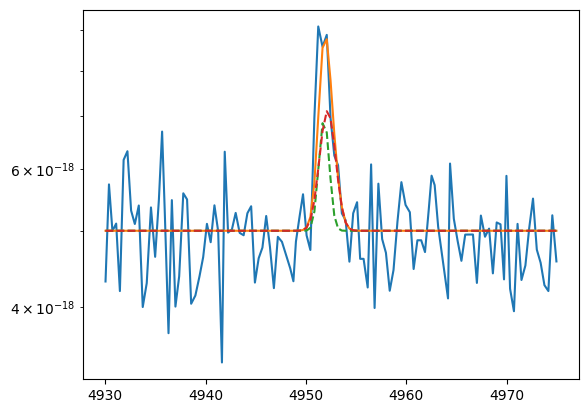

In [98]:
plt.plot(heii_4686.wavelength, heii_4686.flux)
bkg = 0.5e-17

heii4685_nar = gaussian(heii_4686.wavelength, 0.24e-17, wave_cat['HeII4685'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4685))
heii4685_brd = gaussian(heii_4686.wavelength, 0.4e-17, wave_cat['HeII4685'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4685))

heii4685 = heii4685_nar + heii4685_brd

plt.plot(heii_4686.wavelength, heii4685 + bkg)
plt.plot(heii_4686.wavelength, heii4685_nar + bkg, ls='--')
plt.plot(heii_4686.wavelength, heii4685_brd + bkg, ls='--')
plt.yscale('log')

In [99]:
params_4685 = Parameters()
params_4685.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_4685.add('z_ratio', value=z_ratio, vary=False)
params_4685.add('sigma_heii4685_nar', value=upy.nominal_values(sigma_nar_4685), vary=False)
params_4685.add('sigma_heii4685_brd', value=upy.nominal_values(sigma_brd_4685), vary=False)
params_4685.add('Heii4685_nar', value=0.24e-17, min=0.)
params_4685.add('Heii4685_brd', value=0.4e-17, min=0.)
params_4685.add('bkg', value=0.5e-17, min=0.)

def residual_heii4685(params_4685, x, data, uncertainty):
    
    z_nar = params_4685['z_nar']
    z_brd = params_4685['z_nar'] * params_4685['z_ratio']
    sigma_heii4685_nar = params_4685['sigma_heii4685_nar']
    sigma_heii4685_brd = params_4685['sigma_heii4685_brd']
    heii4685_nar_flux = params_4685['Heii4685_nar']
    heii4685_brd_flux = params_4685['Heii4685_brd']
    bkg = params_4685['bkg']
    
    x = heii_4686.wavelength
    model = gaussian(x, heii4685_nar_flux, wave_cat['HeII4685'], z_nar, sigma_heii4685_nar) + \
            gaussian(x, heii4685_brd_flux, wave_cat['HeII4685'], z_brd, sigma_heii4685_brd)
    return (model + bkg - heii_4686.flux) / heii_4686.noise

In [100]:
np.random.seed(1146)
out_heii4685 = minimize(residual_heii4685, params_4685, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:17<00:00, 139.20it/s]


In [101]:
out_heii4685.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05672260,1.9139e-05,(0.03%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_heii4685_nar,0.49301010,,,0.493010104721,-inf,inf,False
sigma_heii4685_brd,0.75551416,,,0.7555141581658775,-inf,inf,False
Heii4685_nar,2.0287e-18,1.1952e-18,(58.91%),2.4e-18,0.00000000,inf,True
Heii4685_brd,5.4618e-18,1.4780e-18,(27.06%),4e-18,0.00000000,inf,True
bkg,4.8830e-18,5.1530e-20,(1.06%),5e-18,0.00000000,inf,True


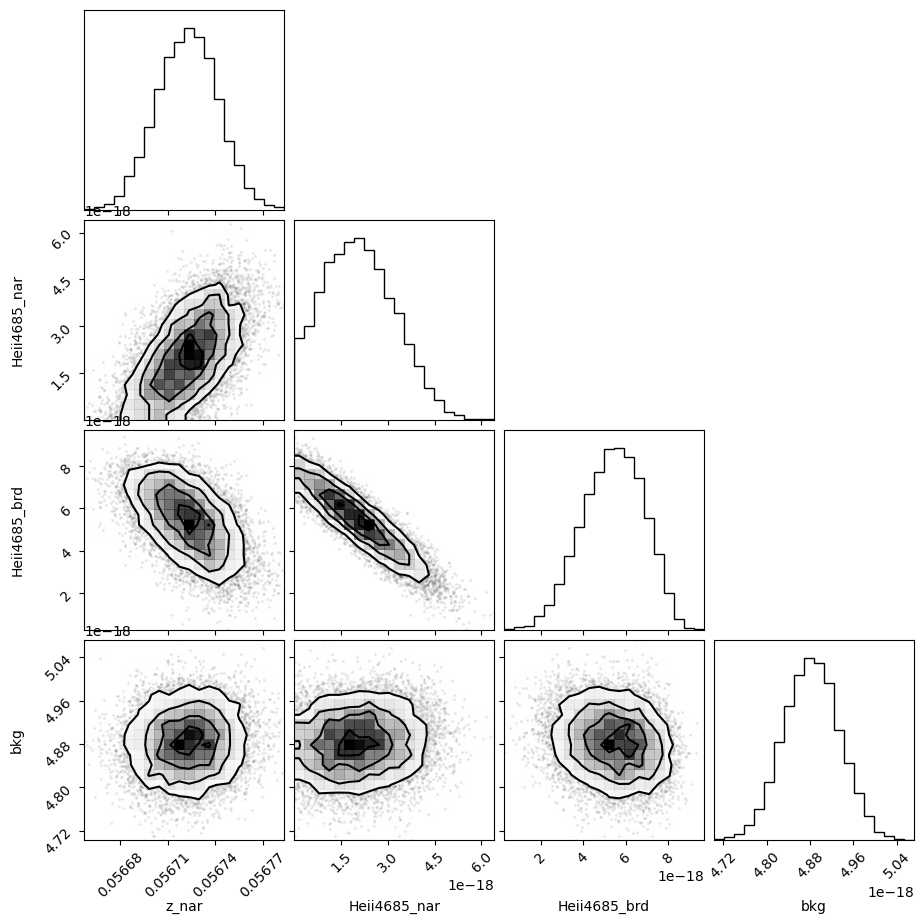

In [102]:
corner.corner(out_heii4685.flatchain, labels=out_heii4685.var_names);

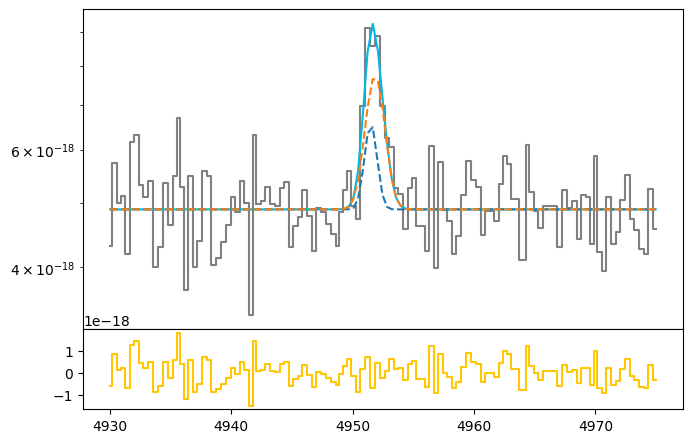

In [103]:
heiia_nar_flux = out_heii4685.flatchain.Heii4685_nar.mean()
heiia_nar_std = out_heii4685.flatchain.Heii4685_nar.std()

heiia_brd_flux = out_heii4685.flatchain.Heii4685_brd.mean()
heiia_brd_std = out_heii4685.flatchain.Heii4685_brd.std()

z_heiia = out_heii4685.flatchain.z_nar.mean()
z_heiia_std = out_heii4685.flatchain.z_nar.std()

bkg_heiia = out_heii4685.flatchain.bkg.mean()
bkg_heiia_std = out_heii4685.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(heii_4686.wavelength, heii_4686.flux, color='gray', label='Data', where='mid')

heiia_nar = gaussian(heii_4686.wavelength, heiia_nar_flux, wave_cat['HeII4685'], z_heiia, upy.nominal_values(sigma_nar_4685))
heiia_brd = gaussian(heii_4686.wavelength, heiia_brd_flux, wave_cat['HeII4685'], z_heiia * z_ratio, upy.nominal_values(sigma_brd_4685))

heiia = heiia_nar + heiia_brd

ax.plot(heii_4686.wavelength, bkg_heiia + heiia, color=c[0])
ax.plot(heii_4686.wavelength, bkg_heiia + heiia_nar, ls='--')
ax.plot(heii_4686.wavelength, bkg_heiia + heiia_brd, ls='--')
ax.set_yscale('log')
ax1.step(heii_4686.wavelength, heii_4686.flux - bkg_heiia - heiia, color=c[3], where='mid')

In [104]:
# EW
EW_HeII_4686_nar = ufloat(heiia_nar_flux, heiia_nar_std) / ufloat(bkg_heiia, bkg_heiia_std)
EW_HeII_4686_brd = ufloat(heiia_brd_flux, heiia_brd_std) / ufloat(bkg_heiia, bkg_heiia_std)
EW_HeII_4686 = (ufloat(heiia_nar_flux, heiia_nar_std) + ufloat(heiia_brd_flux, heiia_brd_std)) / ufloat(bkg_heiia, bkg_heiia_std)

# [OII]3726 + [OII]3729

In [105]:
sigma_arc_3729 = (m * wave_cat['[OII]3729']*(1 + z_BN[igal])) + n

sigma_nar_3729 = sigma_arc_3729
sigma_brd_3729 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_3729**2))

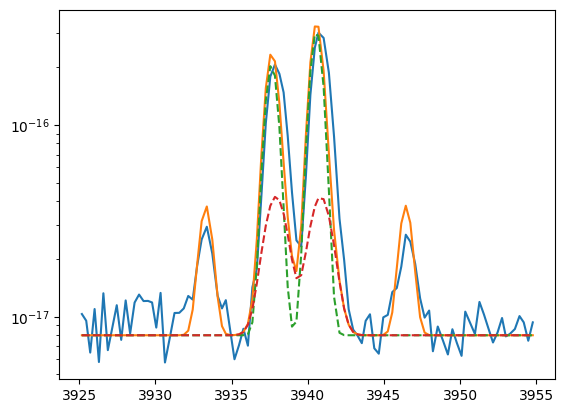

In [106]:
# Search for good initial guess

plt.plot(oii_3727.wavelength, oii_3727.flux)

h13 = gaussian(oii_3727.wavelength, 3e-17, wave_cat['H13'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))

oiic_nar = gaussian(oii_3727.wavelength, 30e-17, wave_cat['[OII]3729'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))
oiic_brd = gaussian(oii_3727.wavelength, 6e-17, wave_cat['[OII]3729'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3729))

oiid_nar = gaussian(oii_3727.wavelength, 20e-17, wave_cat['[OII]3726'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))
oiid_brd = gaussian(oii_3727.wavelength, 6e-17, wave_cat['[OII]3726'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3729))

h14 = gaussian(oii_3727.wavelength, 3e-17, wave_cat['H14'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3729))

oiic = oiic_nar + oiic_brd
oiid = oiid_nar + oiid_brd

bkg = 0.8e-17

plt.plot(oii_3727.wavelength, bkg + oiid + oiic + h13 + h14)
plt.plot(oii_3727.wavelength, bkg + oiid_nar + oiic_nar, ls='--')
plt.plot(oii_3727.wavelength, bkg + oiid_brd + oiic_brd, ls='--')

plt.yscale('log')

In [107]:
params_oii_3727 = Parameters()

params_oii_3727.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oii_3727.add('z_ratio', value=z_ratio, vary=False)
params_oii_3727.add('sigma_nar', value=upy.nominal_values(sigma_nar_3729), vary=False)
params_oii_3727.add('sigma_brd', value=upy.nominal_values(sigma_brd_3729), vary=False)
params_oii_3727.add('H13', value=3e-17, min=0.)
params_oii_3727.add('Oiic_nar', value=30e-17, min=0.)
params_oii_3727.add('Oiic_brd', value=5e-17, min=0.)
params_oii_3727.add('Oiid_nar', value=20e-17, min=0.)
params_oii_3727.add('Oiid_brd', value=5e-17, min=0.)
params_oii_3727.add('H14', value=3e-17, min=0.)
params_oii_3727.add('bkg', value=0.8e-17, min=0.)

def residual_oii_3727(params_oii_3727, x, data, uncertainty):
    
    z_nar = params_oii_3727['z_nar']
    z_brd = params_oii_3727['z_nar'] * params_oii_3727['z_ratio']
    sigma_nar = params_oii_3727['sigma_nar']
    sigma_brd = params_oii_3727['sigma_brd']
    
    h13_flux = params_oii_3727['H13']
    oiic_nar_flux = params_oii_3727['Oiic_nar']
    oiic_brd_flux = params_oii_3727['Oiic_brd']
    oiid_nar_flux = params_oii_3727['Oiid_nar']
    oiid_brd_flux = params_oii_3727['Oiid_brd']
    h14_flux = params_oii_3727['H14']
    bkg = params_oii_3727['bkg']
    
    x = oii_3727.wavelength
    model_h13 = gaussian(x, h13_flux, wave_cat['H13'], z_nar, sigma_nar)
    model_oiic = gaussian(x, oiic_nar_flux, wave_cat['[OII]3729'], z_nar, sigma_nar) + \
                 gaussian(x, oiic_brd_flux, wave_cat['[OII]3729'], z_brd, sigma_brd)
    model_oiid = gaussian(x, oiid_nar_flux, wave_cat['[OII]3726'], z_nar, sigma_nar) + \
                 gaussian(x, oiid_brd_flux, wave_cat['[OII]3726'], z_brd, sigma_brd)
    model_h14 = gaussian(x, h14_flux, wave_cat['H14'], z_nar, sigma_nar)
    model = model_h13 + model_oiic + model_oiid + model_h14
    return (model + bkg - oii_3727.flux) / oii_3727.noise

In [108]:
np.random.seed(1146)
out_oii_3727 = minimize(residual_oii_3727, params_oii_3727, args=(1, 1, 1),
                         method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:32<00:00, 77.75it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 7 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 40.01345413  87.29729484 139.71987362 141.07403331 154.63528487
 158.40531303 169.49079981  57.89560742]


In [109]:
out_oii_3727.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05684092,1.2182e-06,(0.00%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_nar,0.40060744,,,0.40060744335649995,-inf,inf,False
sigma_brd,0.69873386,,,0.6987338574197722,-inf,inf,False
H13,1.8431e-17,1.3915e-18,(7.55%),3e-17,0.00000000,inf,True
Oiic_nar,2.2575e-16,5.8278e-18,(2.58%),3e-16,0.00000000,inf,True
Oiic_brd,1.8004e-16,6.3688e-18,(3.54%),5e-17,0.00000000,inf,True
Oiid_nar,1.3928e-16,4.5597e-18,(3.27%),2e-16,0.00000000,inf,True
Oiid_brd,1.3916e-16,5.2808e-18,(3.79%),5e-17,0.00000000,inf,True
H14,1.9836e-17,1.2145e-18,(6.12%),3e-17,0.00000000,inf,True


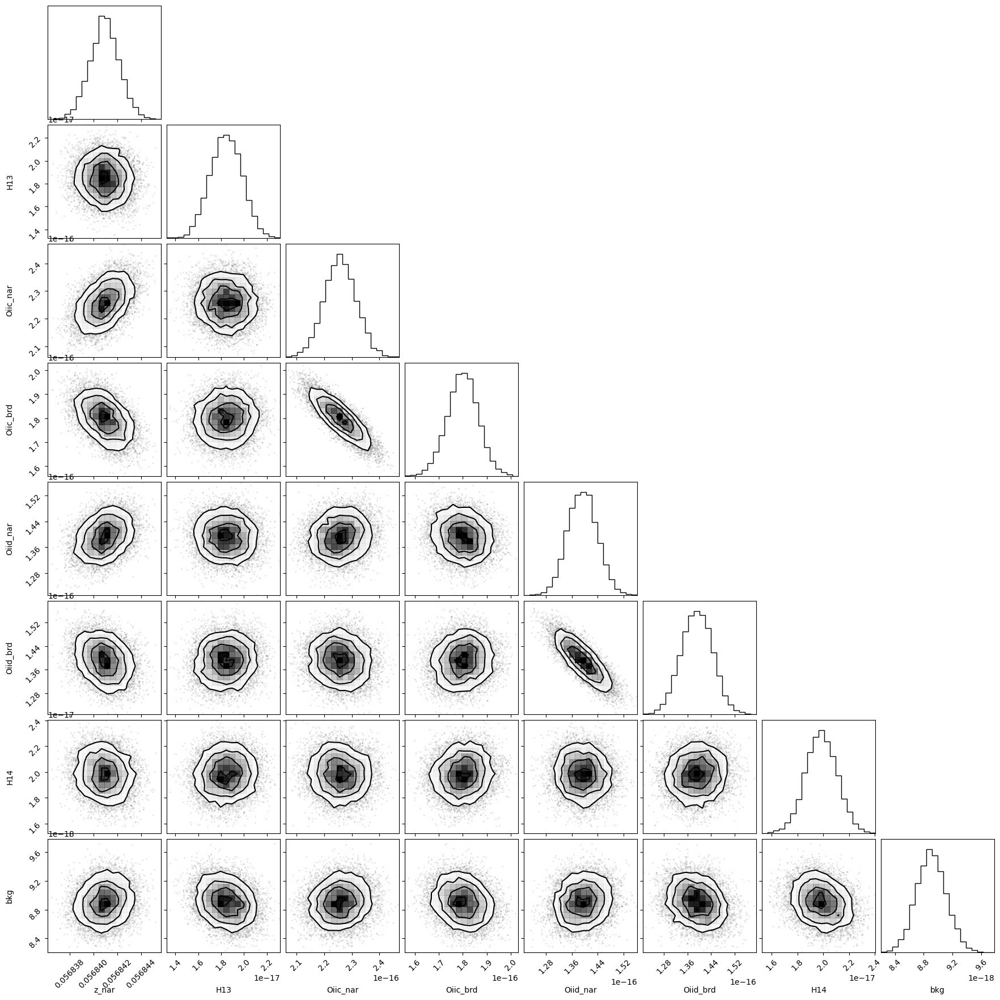

In [110]:
corner.corner(out_oii_3727.flatchain, labels=out_oii_3727.var_names);

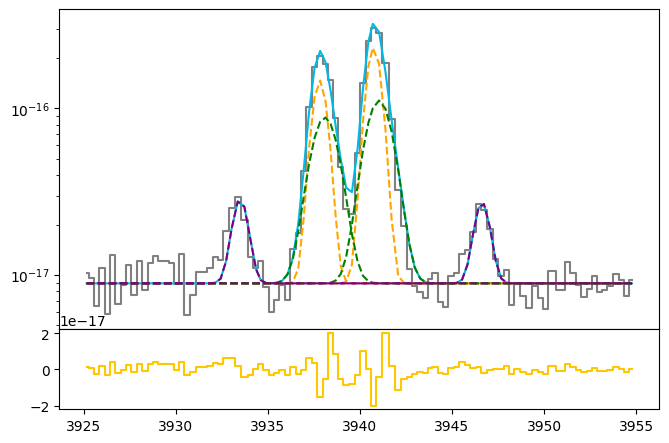

In [111]:
h13_flux = out_oii_3727.flatchain.H13.mean()
h13_std = out_oii_3727.flatchain.H13.std()

oiic_nar_flux = out_oii_3727.flatchain.Oiic_nar.mean()
oiic_nar_std = out_oii_3727.flatchain.Oiic_nar.std()

oiic_brd_flux = out_oii_3727.flatchain.Oiic_brd.mean()
oiic_brd_std = out_oii_3727.flatchain.Oiic_brd.std()

oiid_nar_flux = out_oii_3727.flatchain.Oiid_nar.mean()
oiid_nar_std = out_oii_3727.flatchain.Oiid_nar.std()

oiid_brd_flux = out_oii_3727.flatchain.Oiid_brd.mean()
oiid_brd_std = out_oii_3727.flatchain.Oiid_brd.std()

h14_flux = out_oii_3727.flatchain.H14.mean()
h14_std = out_oii_3727.flatchain.H14.std()

z_oii_3727 = out_oii_3727.flatchain.z_nar.mean()
z_oii_3727_std = out_oii_3727.flatchain.z_nar.std()

bkg_oii_3727 = out_oii_3727.flatchain.bkg.mean()
bkg_oii_3727_std = out_oii_3727.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_3727.wavelength, oii_3727.flux, color='gray', label='Data', where='mid')

h13 = gaussian(oii_3727.wavelength, h13_flux, wave_cat['H13'], z_oii_3727, upy.nominal_values(sigma_nar_3729))

oiic_nar = gaussian(oii_3727.wavelength, oiic_nar_flux, wave_cat['[OII]3729'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiic_brd = gaussian(oii_3727.wavelength, oiic_brd_flux, wave_cat['[OII]3729'], z_oii_3727 * z_ratio, upy.nominal_values(sigma_brd_3729))

oiid_nar = gaussian(oii_3727.wavelength, oiid_nar_flux, wave_cat['[OII]3726'], z_oii_3727, upy.nominal_values(sigma_nar_3729))
oiid_brd = gaussian(oii_3727.wavelength, oiid_brd_flux, wave_cat['[OII]3726'], z_oii_3727 * z_ratio, upy.nominal_values(sigma_brd_3729))

h14 = gaussian(oii_3727.wavelength, h14_flux, wave_cat['H14'], z_oii_3727, upy.nominal_values(sigma_nar_3729))

oiic = oiic_nar + oiic_brd
oiid = oiid_nar + oiid_brd

ax.plot(oii_3727.wavelength, bkg_oii_3727 + h13 + oiic + oiid + h14, color=c[0])
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiic_nar, ls='--', color='orange')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiid_nar, ls='--', color='orange')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiic_brd, ls='--', color='green')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + oiid_brd, ls='--', color='green')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + h13, ls='--', color='purple')
ax.plot(oii_3727.wavelength, bkg_oii_3727 + h14, ls='--', color='purple')

ax.set_yscale('log')
ax1.step(oii_3727.wavelength, oii_3727.flux - bkg_oii_3727 - oiic - oiid - h13 - h14,
         color=c[3], where='mid')

In [112]:
# EW
EW_OII_3729_nar = ufloat(oiic_nar_flux, oiic_nar_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3729_brd = ufloat(oiic_brd_flux, oiic_brd_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3729 = (ufloat(oiic_nar_flux, oiic_nar_std) + ufloat(oiic_brd_flux, oiic_brd_std)) / ufloat(bkg_oii_3727, bkg_oii_3727_std)

EW_OII_3726_nar = ufloat(oiid_nar_flux, oiid_nar_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3726_brd = ufloat(oiid_brd_flux, oiid_brd_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3726 = (ufloat(oiid_nar_flux, oiid_nar_std) + ufloat(oiid_brd_flux, oiid_brd_std)) / ufloat(bkg_oii_3727, bkg_oii_3727_std)

# [OI]6300 + [SIII]6312

In [113]:
sigma_arc_6312 = (m * wave_cat['[SIII]6312']*(1 + z_BN[igal])) + n

sigma_nar_6312 = sigma_arc_6312
sigma_brd_6312 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_6312**2))

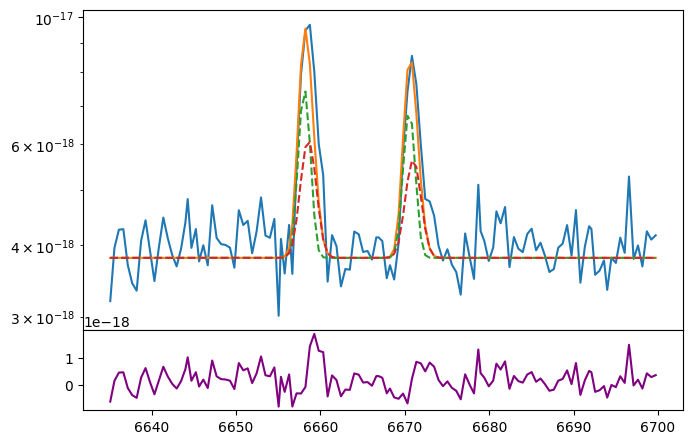

In [114]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oi_siii.wavelength, oi_siii.flux)
bkg = 0.38e-17

oi_nar = gaussian(oi_siii.wavelength, 0.6e-17, wave_cat['[OI]6300'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6312))
oi_brd = gaussian(oi_siii.wavelength, 0.5e-17, wave_cat['[OI]6300'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6312))

siiic_nar = gaussian(oi_siii.wavelength, 0.5e-17, wave_cat['[SIII]6312'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6312))
siiic_brd = gaussian(oi_siii.wavelength, 0.4e-17, wave_cat['[SIII]6312'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6312))

ax.plot(oi_siii.wavelength, bkg + siiic_nar + siiic_brd + oi_nar + oi_brd)
ax.plot(oi_siii.wavelength, bkg + siiic_nar + oi_nar, ls='--')
ax.plot(oi_siii.wavelength, bkg + siiic_brd + oi_brd, ls='--')
ax1.plot(oi_siii.wavelength, oi_siii.flux - bkg - siiic_nar - siiic_brd - oi_nar - oi_brd, color='purple')
ax.set_yscale('log')

In [115]:
params_oi_siii = Parameters()
params_oi_siii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oi_siii.add('z_ratio', value=z_ratio, vary=False)
params_oi_siii.add('sigma_nar', value=upy.nominal_values(sigma_nar_6312), vary=False)
params_oi_siii.add('sigma_brd', value=upy.nominal_values(sigma_brd_6312), vary=False)
params_oi_siii.add('Oi_nar', value=0.6e-17, min=0.)
params_oi_siii.add('Oi_brd', value=0.5e-17, min=0.)
params_oi_siii.add('Siiic_nar', value=0.5e-17, min=0.)
params_oi_siii.add('Siiic_brd', value=0.4e-17, min=0.)
params_oi_siii.add('bkg', value=0.38e-17, min=0.)


def residual_oi_siii(params_oi_siii, x, data, uncertainty):
    
    z_nar = params_oi_siii['z_nar']
    z_brd = params_oi_siii['z_nar'] * params_oi_siii['z_ratio']
    sigma_nar = params_oi_siii['sigma_nar']
    sigma_brd = params_oi_siii['sigma_brd']
    oi_nar = params_oi_siii['Oi_nar']
    oi_brd = params_oi_siii['Oi_brd']
    siiic_nar = params_oi_siii['Siiic_nar']
    siiic_brd = params_oi_siii['Siiic_brd']
    bkg = params_oi_siii['bkg']
    
    x = oi_siii.wavelength
    model_oi = gaussian(x, oi_nar, wave_cat['[OI]6300'], z_nar, sigma_nar) \
             + gaussian(x, oi_brd, wave_cat['[OI]6300'], z_brd, sigma_brd)
    model_siii = gaussian(x, siiic_nar, wave_cat['[SIII]6312'], z_nar, sigma_nar) \
               + gaussian(x, siiic_brd, wave_cat['[SIII]6312'], z_brd, sigma_brd)
    
    return (model_siii + model_oi + bkg - oi_siii.flux) / oi_siii.noise

In [116]:
np.random.seed(1146)
out_oi_siii = minimize(residual_oi_siii, params_oi_siii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:25<00:00, 98.23it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 6 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [53.61096083 62.70562661 66.93990034 56.89153476 56.34891021 52.37188379]


In [117]:
out_oi_siii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05681307,1.0687e-05,(0.02%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_nar,0.65005876,,,0.650058755106,-inf,inf,False
sigma_brd,0.86620960,,,0.8662095964153512,-inf,inf,False
Oi_nar,3.4667e-18,1.4880e-18,(42.92%),6e-18,0.00000000,inf,True
Oi_brd,9.1423e-18,1.6594e-18,(18.15%),5e-18,0.00000000,inf,True
Siiic_nar,3.5920e-18,1.2658e-18,(35.24%),5e-18,0.00000000,inf,True
Siiic_brd,5.5083e-18,1.4306e-18,(25.97%),4e-18,0.00000000,inf,True
bkg,3.9679e-18,3.0497e-20,(0.77%),3.8e-18,0.00000000,inf,True


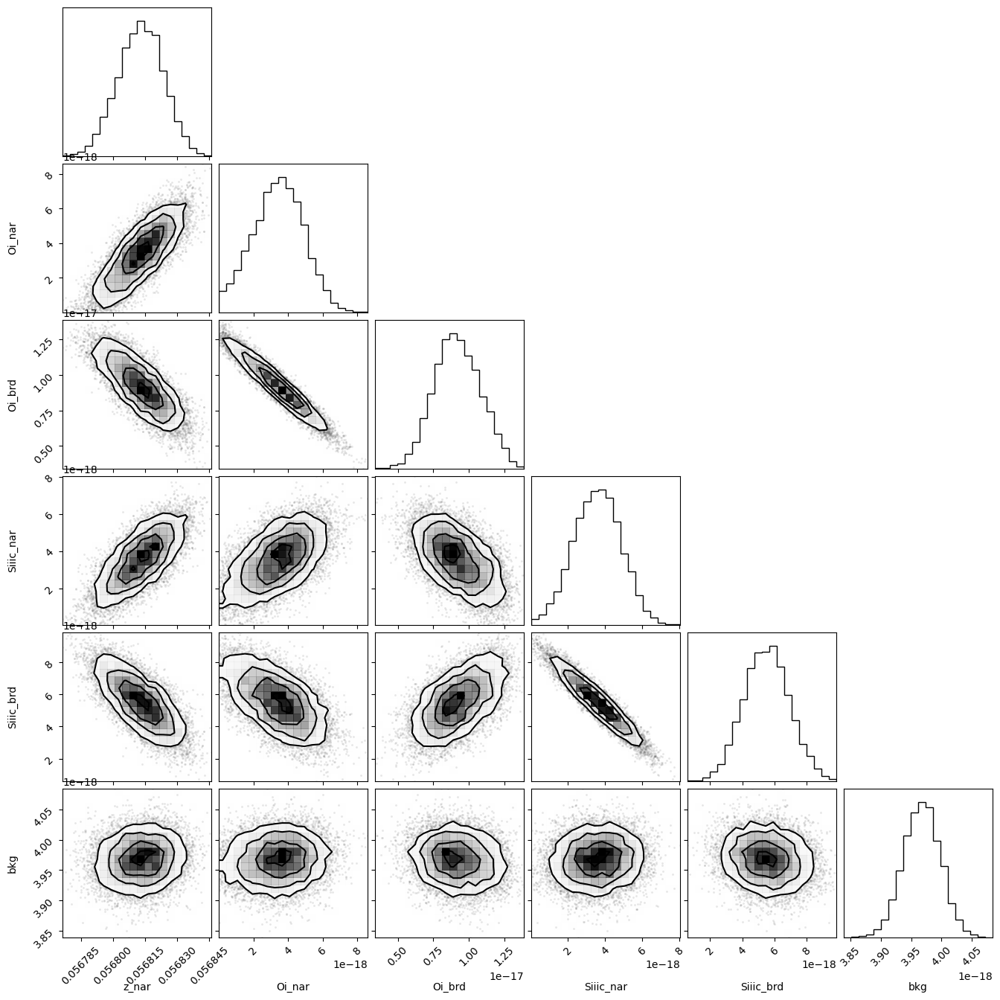

In [118]:
corner.corner(out_oi_siii.flatchain, labels=out_oi_siii.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

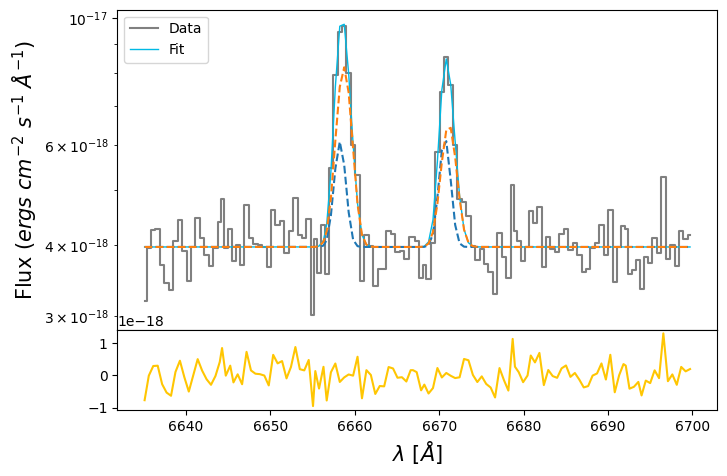

In [119]:
oia_nar_flux = out_oi_siii.flatchain.Oi_nar.mean()
oia_nar_std = out_oi_siii.flatchain.Oi_nar.std()

oia_brd_flux = out_oi_siii.flatchain.Oi_brd.mean()
oia_brd_std = out_oi_siii.flatchain.Oi_brd.std()

siiic_nar_flux = out_oi_siii.flatchain.Siiic_nar.mean()
siiic_nar_std = out_oi_siii.flatchain.Siiic_nar.std()

siiic_brd_flux = out_oi_siii.flatchain.Siiic_brd.mean()
siiic_brd_std = out_oi_siii.flatchain.Siiic_brd.std()

z_oi_siii = out_oi_siii.flatchain.z_nar.mean()
z_oi_siii_std = out_oi_siii.flatchain.z_nar.std()

bkg_oi_siii = out_oi_siii.flatchain.bkg.mean()
bkg_oi_siii_std = out_oi_siii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oi_siii.wavelength, oi_siii.flux,
            color='gray', label='Data', where='mid')

oia_nar = gaussian(oi_siii.wavelength, oia_nar_flux, wave_cat['[OI]6300'], z_oi_siii, upy.nominal_values(sigma_nar_6312))
oia_brd = gaussian(oi_siii.wavelength, oia_brd_flux, wave_cat['[OI]6300'], z_oi_siii * z_ratio, upy.nominal_values(sigma_brd_6312))

siiic_nar = gaussian(oi_siii.wavelength, siiic_nar_flux, wave_cat['[SIII]6312'], z_oi_siii, upy.nominal_values(sigma_nar_6312))
siiic_brd = gaussian(oi_siii.wavelength, siiic_brd_flux, wave_cat['[SIII]6312'], z_oi_siii * z_ratio, upy.nominal_values(sigma_brd_6312))

oia = oia_nar + oia_brd
siiic = siiic_nar + siiic_brd

ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic + oia,
        lw=1, color=c[0], label='Fit')
ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic_nar + oia_nar, ls='--')
ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic_brd + oia_brd, ls='--')

ax1.plot(oi_siii.wavelength, oi_siii.flux - bkg_oi_siii - siiic - oia,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [120]:
# EW
EW_OI_6300_nar = ufloat(oia_nar_flux, oia_nar_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_OI_6300_brd = ufloat(oia_brd_flux, oia_brd_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_OI_6300 = (ufloat(oia_nar_flux, oia_nar_std) + ufloat(oia_brd_flux, oia_brd_std)) / ufloat(bkg_oi_siii, bkg_oi_siii_std)

EW_SIII_6312_nar = ufloat(siiic_nar_flux, siiic_nar_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_SIII_6312_brd = ufloat(siiic_brd_flux, siiic_brd_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_SIII_6312 = (ufloat(siiic_nar_flux, siiic_nar_std) + ufloat(siiic_brd_flux, siiic_brd_std)) / ufloat(bkg_oi_siii, bkg_oi_siii_std)

# [OIII]5007 + HeI 5015

In [121]:
sigma_arc_5007 = (m * wave_cat['[OIII]5007']*(1 + z_BN[igal])) + n

sigma_nar_5007 = sigma_arc_5007
sigma_brd_5007 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_5007**2))

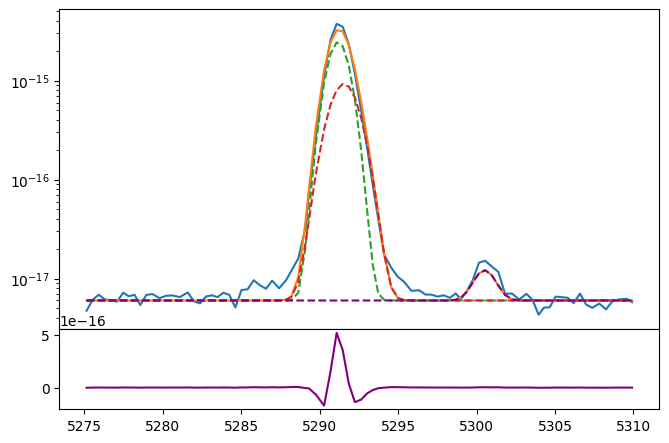

In [122]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_hei.wavelength, oiii_hei.flux)
bkg = 0.6e-17

oiiia_nar = gaussian(oiii_hei.wavelength, 400e-17, wave_cat['[OIII]5007'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6312))
oiiia_brd = gaussian(oiii_hei.wavelength, 200e-17, wave_cat['[OIII]5007'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_6312))

hei_5015 = gaussian(oiii_hei.wavelength, 1e-17, wave_cat['HeI5015'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_6312))

ax.plot(oiii_hei.wavelength, bkg + oiiia_nar + oiiia_brd + hei_5015)
ax.plot(oiii_hei.wavelength, bkg + oiiia_nar, ls='--')
ax.plot(oiii_hei.wavelength, bkg + oiiia_brd, ls='--')
ax.plot(oiii_hei.wavelength, bkg + hei_5015, ls='--', color='purple')
ax1.plot(oiii_hei.wavelength, oiii_hei.flux - bkg - oiiia_nar - oiiia_brd - hei_5015, color='purple')
ax.set_yscale('log')

In [123]:
params_oiii_hei = Parameters()
params_oiii_hei.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oiii_hei.add('z_ratio', value=z_ratio, vary=False)
params_oiii_hei.add('sigma_nar', value=upy.nominal_values(sigma_nar_6312), vary=False)
params_oiii_hei.add('sigma_brd', value=upy.nominal_values(sigma_brd_6312), vary=False)
params_oiii_hei.add('Hei', value=1e-17, min=0.)
params_oiii_hei.add('Oiiia_nar', value=400e-17, min=0.)
params_oiii_hei.add('Oiiia_brd', value=200e-17, min=0.)
params_oiii_hei.add('bkg', value=0.6e-17, min=0.)


def residual_oiii_hei(params_oiii_hei, x, data, uncertainty):
    
    z_nar = params_oiii_hei['z_nar']
    z_brd = params_oiii_hei['z_nar'] * params_oiii_hei['z_ratio']
    sigma_nar = params_oiii_hei['sigma_nar']
    sigma_brd = params_oiii_hei['sigma_brd']
    oiiia_nar = params_oiii_hei['Oiiia_nar']
    oiiia_brd = params_oiii_hei['Oiiia_brd']
    hei = params_oiii_hei['Hei']
    bkg = params_oiii_hei['bkg']
    
    x = oiii_hei.wavelength
    model_oiii = gaussian(x, oiiia_nar, wave_cat['[OIII]5007'], z_nar, sigma_nar) \
               + gaussian(x, oiiia_brd, wave_cat['[OIII]5007'], z_brd, sigma_brd)
    model_hei = gaussian(x, hei, wave_cat['HeI5015'], z_nar, sigma_nar)
    
    return (model_oiii + model_hei + bkg - oiii_hei.flux) / oiii_hei.noise

In [124]:
np.random.seed(1146)
out_oiii_hei = minimize(residual_oiii_hei, params_oiii_hei, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:22<00:00, 109.48it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [98.25562126 91.8437102  95.4337732  97.04770887 66.57577394]


In [125]:
out_oiii_hei.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05679726,2.6018e-07,(0.00%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_nar,0.65005876,,,0.650058755106,-inf,inf,False
sigma_brd,0.86620960,,,0.8662095964153512,-inf,inf,False
Hei,1.3332e-17,6.4092e-19,(4.81%),1e-17,0.00000000,inf,True
Oiiia_nar,5.1777e-15,1.4209e-17,(0.27%),4e-15,0.00000000,inf,True
Oiiia_brd,9.8349e-16,1.3452e-17,(1.37%),2e-15,0.00000000,inf,True
bkg,6.8710e-18,6.5382e-20,(0.95%),6e-18,0.00000000,inf,True


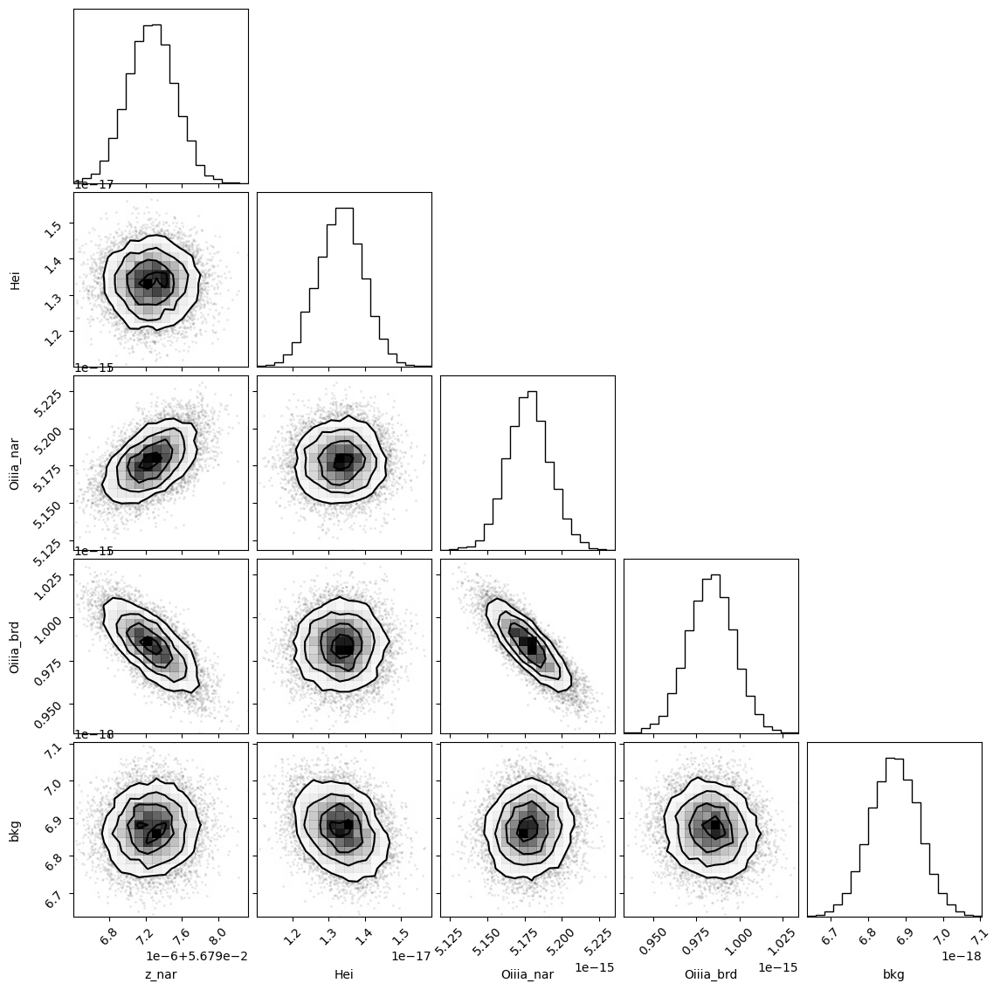

In [126]:
corner.corner(out_oiii_hei.flatchain, labels=out_oiii_hei.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

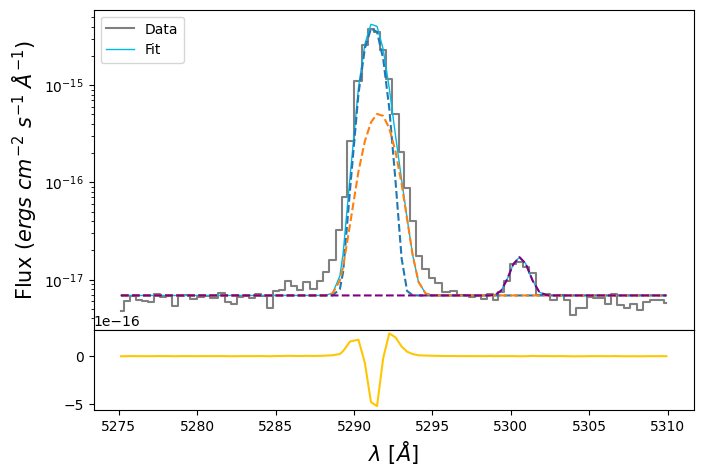

In [127]:
hei_flux = out_oiii_hei.flatchain.Hei.mean()
hei_std = out_oiii_hei.flatchain.Hei.std()

oiiia_nar_flux = out_oiii_hei.flatchain.Oiiia_nar.mean()
oiiia_nar_std = out_oiii_hei.flatchain.Oiiia_nar.std()

oiiia_brd_flux = out_oiii_hei.flatchain.Oiiia_brd.mean()
oiiia_brd_std = out_oiii_hei.flatchain.Oiiia_brd.std()

z_oiii_hei = out_oiii_hei.flatchain.z_nar.mean()
z_oiii_hei_std = out_oiii_hei.flatchain.z_nar.std()

bkg_oiii_hei = out_oiii_hei.flatchain.bkg.mean()
bkg_oiii_hei_std = out_oiii_hei.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_hei.wavelength, oiii_hei.flux,
            color='gray', label='Data', where='mid')

hei = gaussian(oiii_hei.wavelength, hei_flux, wave_cat['HeI5015'], z_oiii_hei, upy.nominal_values(sigma_nar_5007))

oiiia_nar = gaussian(oiii_hei.wavelength, oiiia_nar_flux, wave_cat['[OIII]5007'], z_oiii_hei, upy.nominal_values(sigma_nar_5007))
oiiia_brd = gaussian(oiii_hei.wavelength, oiiia_brd_flux, wave_cat['[OIII]5007'], z_oiii_hei * z_ratio, upy.nominal_values(sigma_brd_5007))

oiiia = oiiia_nar + oiiia_brd

ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia + hei,
        lw=1, color=c[0], label='Fit')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia_nar, ls='--')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia_brd, ls='--')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + hei, ls='--', color='purple')

ax1.plot(oiii_hei.wavelength, oiii_hei.flux - bkg_oiii_hei - oiiia - hei,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [128]:
# EW
EW_OIII_5007_nar = ufloat(oiiia_nar_flux, oiiia_nar_std) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)
EW_OIII_5007_brd = ufloat(oiiia_brd_flux, oiiia_brd_std) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)
EW_OIII_5007 = (ufloat(oiiia_nar_flux, oiiia_nar_std) + ufloat(oiiia_brd_flux, oiiia_brd_std)) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)

# [OIII]4363

In [129]:
sigma_arc_4363 = (m * wave_cat['[OIII]4363']*(1 + z_BN[igal])) + n

sigma_nar_4363 = sigma_arc_4363
sigma_brd_4363 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4363**2))

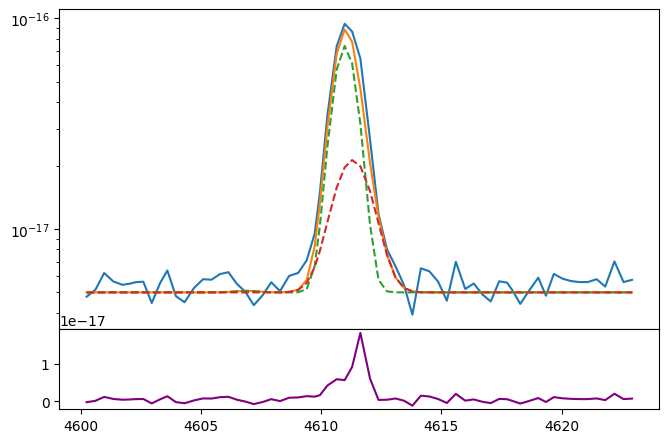

In [130]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_4363.wavelength, oiii_4363.flux)
bkg = 0.5e-17

feii_4360 = gaussian(oiii_4363.wavelength, 0.01e-17, wave_cat['[FeII]4360'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4363))
oiiic_nar = gaussian(oiii_4363.wavelength, 8e-17, wave_cat['[OIII]4363'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4363))
oiiic_brd = gaussian(oiii_4363.wavelength, 3.0e-17, wave_cat['[OIII]4363'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4363))

ax.plot(oiii_4363.wavelength, bkg + oiiic_nar + oiiic_brd + feii_4360)
ax.plot(oiii_4363.wavelength, bkg + oiiic_nar + feii_4360, ls='--')
ax.plot(oiii_4363.wavelength, bkg + oiiic_brd, ls='--')
ax1.plot(oiii_4363.wavelength, oiii_4363.flux - bkg - oiiic_nar - oiiic_brd - feii_4360, color='purple')
ax.set_yscale('log')

In [131]:
params_oiiic = Parameters()

params_oiiic.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_oiiic.add('z_ratio', value=z_ratio, vary=False)
params_oiiic.add('sigma_nar', value=upy.nominal_values(sigma_nar_4363), vary=False)
params_oiiic.add('sigma_brd', value=upy.nominal_values(sigma_brd_4363), vary=False)
params_oiiic.add('Feii_4360_nar', value=0.01e-17, min=0.)
params_oiiic.add('Oiiic_nar', value=8.0e-17, min=0.)
params_oiiic.add('Oiiic_brd', value=3.0e-17, min=0.)
params_oiiic.add('bkg', value=0.5e-17, min=0.)


def residual_oiiic(params_oiiic, x, data, uncertainty):
    
    z_nar = params_oiiic['z_nar']
    z_brd = params_oiiic['z_nar'] * params_oiiic['z_ratio']
    sigma_nar = params_oiiic['sigma_nar']
    sigma_brd = params_oiiic['sigma_brd']
    feii_4360_flux = params_oiiic['Feii_4360_nar']
    oiiic_nar_flux = params_oiiic['Oiiic_nar']
    oiiic_brd_flux = params_oiiic['Oiiic_brd']
    bkg = params_oiiic['bkg']
    
    x = oiii_4363.wavelength
    model = gaussian(x, feii_4360_flux, wave_cat['[FeII]4360'], z_nar, sigma_nar) + \
            gaussian(x, oiiic_nar_flux, wave_cat['[OIII]4363'], z_nar, sigma_nar) + \
            gaussian(x, oiiic_brd_flux, wave_cat['[OIII]4363'], z_brd, sigma_brd)
    
    return (model + bkg - oiii_4363.flux) / oiii_4363.noise

In [132]:
np.random.seed(1146)
out_oiiic = minimize(residual_oiiic, params_oiiic, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:19<00:00, 127.18it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [51.756211   60.65527344 48.7930998  77.39902186 57.0323396 ]


In [133]:
out_oiiic.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05679209,1.8325e-06,(0.00%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_nar,0.46186776,,,0.4618677634058999,-inf,inf,False
sigma_brd,0.73557087,,,0.7355708740193915,-inf,inf,False
Feii_4360_nar,1.7414e-19,1.9249e-19,(110.53%),1e-19,0.00000000,inf,True
Oiiic_nar,8.2055e-17,2.1881e-18,(2.67%),8e-17,0.00000000,inf,True
Oiiic_brd,4.3637e-17,2.5973e-18,(5.95%),3e-17,0.00000000,inf,True
bkg,5.4241e-18,8.4668e-20,(1.56%),5e-18,0.00000000,inf,True


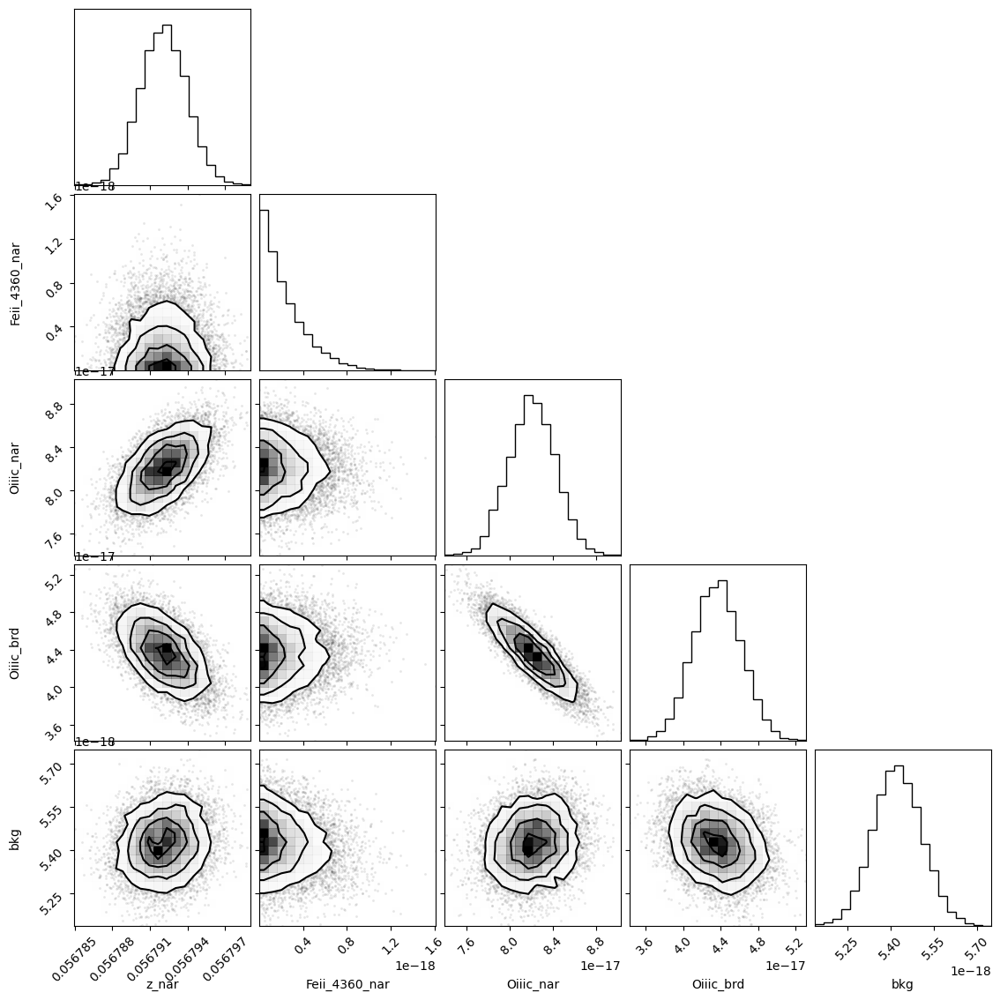

In [134]:
corner.corner(out_oiiic.flatchain, labels=out_oiiic.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

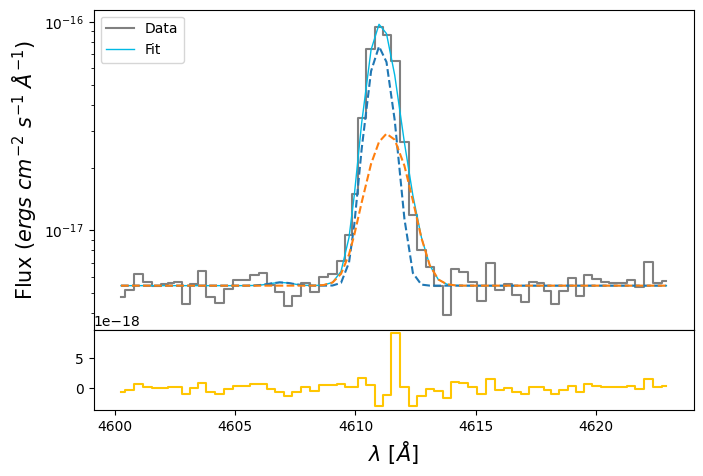

In [135]:
oiiic_nar_flux = out_oiiic.flatchain.Oiiic_nar.mean()
oiiic_nar_std = out_oiiic.flatchain.Oiiic_nar.std()

oiiic_brd_flux = out_oiiic.flatchain.Oiiic_brd.mean()
oiiic_brd_std = out_oiiic.flatchain.Oiiic_brd.std()

feii_4360_flux = out_oiiic.flatchain.Feii_4360_nar.mean()
feii_4360_std = out_oiiic.flatchain.Feii_4360_nar.std()

z_oiii = out_oiiic.flatchain.z_nar.mean()
z_oiii_std = out_oiiic.flatchain.z_nar.std()

bkg_oiiic = out_oiiic.flatchain.bkg.mean()
bkg_oiiic_std = out_oiiic.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4363.wavelength, oiii_4363.flux,
            color='gray', label='Data', where='mid')

feii_4360 = gaussian(oiii_4363.wavelength, feii_4360_flux, wave_cat['[FeII]4360'], z_oiii, upy.nominal_values(sigma_nar_4363))
oiiic_nar = gaussian(oiii_4363.wavelength, oiiic_nar_flux, wave_cat['[OIII]4363'], z_oiii, upy.nominal_values(sigma_nar_4363))
oiiic_brd = gaussian(oiii_4363.wavelength, oiiic_brd_flux, wave_cat['[OIII]4363'], z_oiii * z_ratio, upy.nominal_values(sigma_brd_4363))
oiiic = oiiic_nar + oiiic_brd

ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic + feii_4360, lw=1, color=c[0], label='Fit')
ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic_nar + feii_4360, ls='--')
ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic_brd, ls='--')
ax1.step(oiii_4363.wavelength, oiii_4363.flux - bkg_oiiic - oiiic - feii_4360, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [136]:
# EW
EW_OIII_4363_nar = ufloat(oiiic_nar_flux, oiiic_nar_std) / ufloat(bkg_oiiic, bkg_oiiic_std)
EW_OIII_4363_brd = ufloat(oiiic_brd_flux, oiiic_brd_std) / ufloat(bkg_oiiic, bkg_oiiic_std)
EW_OIII_4363 = (ufloat(oiiic_nar_flux, oiiic_nar_std) + ufloat(oiiic_brd_flux, oiiic_brd_std)) / ufloat(bkg_oiiic, bkg_oiiic_std)

# [ArIII]7135

In [137]:
sigma_arc_7135 = (m * wave_cat['[ArIII]7135']*(1 + z_BN[igal])) + n

sigma_nar_7135 = sigma_arc_7135
sigma_brd_7135 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_7135**2))

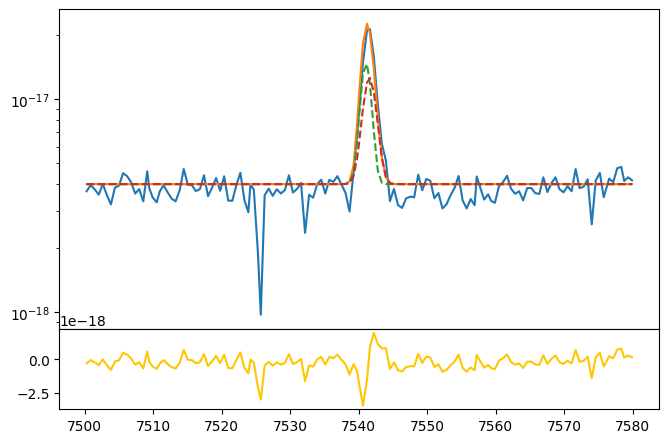

In [138]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(ariii_7135.wavelength, ariii_7135.flux)
bkg = 0.4e-17

ariiia_nar = gaussian(ariii_7135.wavelength, 2e-17, wave_cat['[ArIII]7135'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_7135))
ariiia_brd = gaussian(ariii_7135.wavelength, 2e-17, wave_cat['[ArIII]7135'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_7135))

ax.plot(ariii_7135.wavelength, bkg + ariiia_nar + ariiia_brd)
ax.plot(ariii_7135.wavelength, bkg + ariiia_nar, ls='--')
ax.plot(ariii_7135.wavelength, bkg + ariiia_brd, ls='--')
ax1.plot(ariii_7135.wavelength, ariii_7135.flux - bkg - ariiia_nar - ariiia_brd, color=c[3])
ax.set_yscale('log')

In [139]:
params_ariii = Parameters()
params_ariii.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_ariii.add('z_ratio', value=z_ratio, vary=False)
params_ariii.add('sigma_nar', value=upy.nominal_values(sigma_nar_7135), vary=False)
params_ariii.add('sigma_brd', value=upy.nominal_values(sigma_brd_7135), vary=False)
params_ariii.add('Ariiia_nar', value=2e-17, min=0.)
params_ariii.add('Ariiia_brd', value=2e-17, min=0.)
params_ariii.add('bkg', value=0.4e-17, min=0.)


def residual_ariii(params_ariii, x, data, uncertainty):
    
    z_nar = params_ariii['z_nar']
    z_brd = params_ariii['z_nar'] * params_ariii['z_ratio']
    sigma_nar = params_ariii['sigma_nar']
    sigma_brd = params_ariii['sigma_brd']
    ariiia_nar = params_ariii['Ariiia_nar']
    ariiia_brd = params_ariii['Ariiia_brd']
    bkg = params_ariii['bkg']
    
    x = ariii_7135.wavelength
    model_ariii = gaussian(x, ariiia_nar, wave_cat['[ArIII]7135'], z_nar, sigma_nar) \
                + gaussian(x, ariiia_brd, wave_cat['[ArIII]7135'], z_brd, sigma_brd)
    
    return (model_ariii + bkg - ariii_7135.flux) / ariii_7135.noise

In [140]:
np.random.seed(1146)
out_ariii = minimize(residual_ariii, params_ariii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:19<00:00, 125.19it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [41.50509022 45.36580968 44.83027854 51.87742105]


In [141]:
out_ariii.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05680443,8.4367e-06,(0.01%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_nar,0.72960329,,,0.72960329058,-inf,inf,False
sigma_brd,0.92739616,,,0.927396162088914,-inf,inf,False
Ariiia_nar,1.3437e-17,3.8719e-18,(28.82%),2e-17,0.00000000,inf,True
Ariiia_brd,2.6074e-17,4.1815e-18,(16.04%),2e-17,0.00000000,inf,True
bkg,3.8067e-18,3.1180e-20,(0.82%),4e-18,0.00000000,inf,True


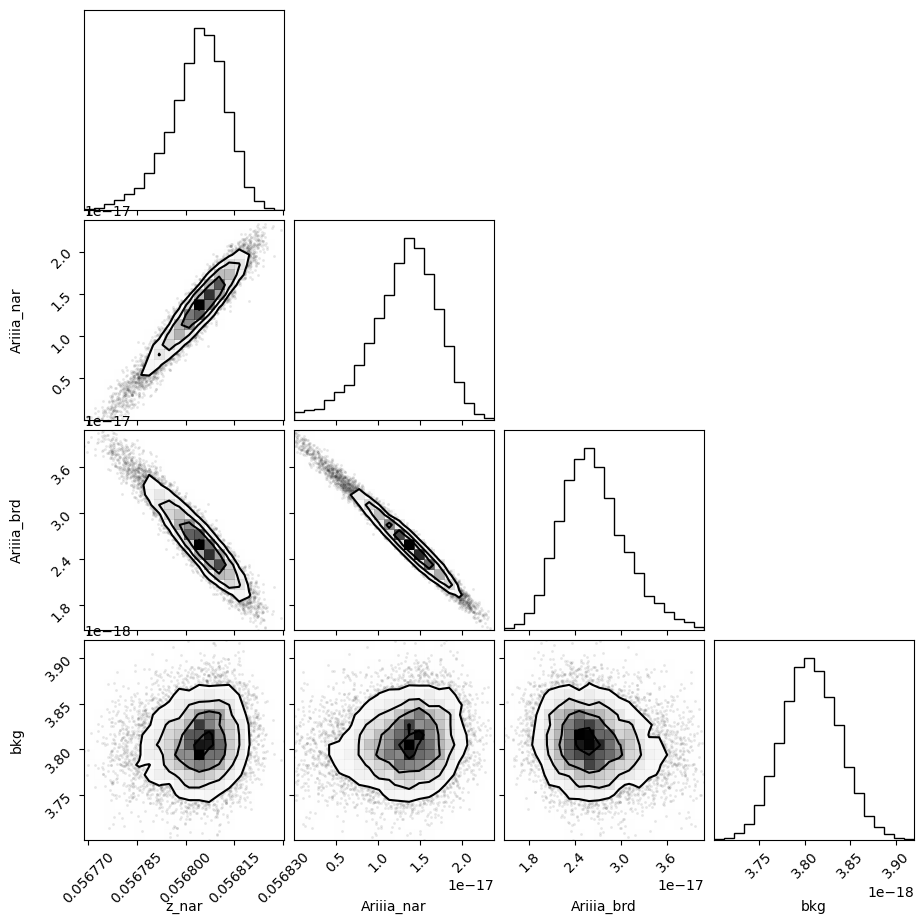

In [142]:
corner.corner(out_ariii.flatchain, labels=out_ariii.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

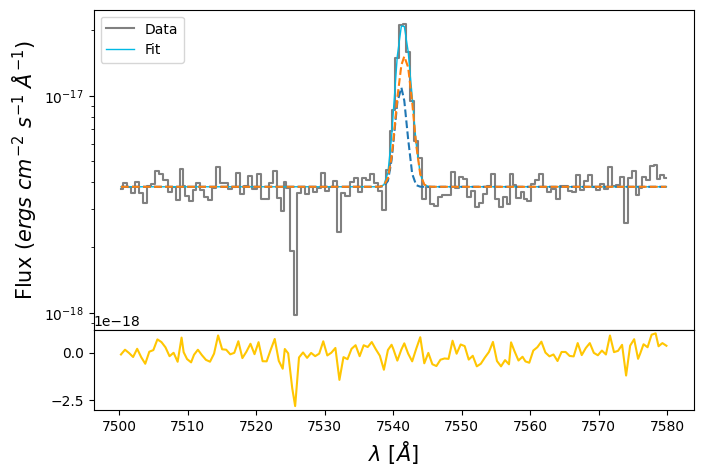

In [143]:
ariiia_nar_flux = out_ariii.flatchain.Ariiia_nar.mean()
ariiia_nar_std = out_ariii.flatchain.Ariiia_nar.std()

ariiia_brd_flux = out_ariii.flatchain.Ariiia_brd.mean()
ariiia_brd_std = out_ariii.flatchain.Ariiia_brd.std()

z_ariii = out_ariii.flatchain.z_nar.mean()
z_ariii_std = out_ariii.flatchain.z_nar.std()

bkg_ariii = out_ariii.flatchain.bkg.mean()
bkg_ariii_std = out_ariii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(ariii_7135.wavelength, ariii_7135.flux,
            color='gray', label='Data', where='mid')

ariiia_nar = gaussian(ariii_7135.wavelength, ariiia_nar_flux, wave_cat['[ArIII]7135'], z_ariii, upy.nominal_values(sigma_nar_7135))
ariiia_brd = gaussian(ariii_7135.wavelength, ariiia_brd_flux, wave_cat['[ArIII]7135'], z_ariii * z_ratio, upy.nominal_values(sigma_brd_7135))

ariiia = ariiia_nar + ariiia_brd

ax.plot(ariii_7135.wavelength, bkg_ariii + ariiia,
        lw=1, color=c[0], label='Fit')
ax.plot(ariii_7135.wavelength, bkg_ariii + ariiia_nar, ls='--')
ax.plot(ariii_7135.wavelength, bkg_ariii + ariiia_brd, ls='--')

ax1.plot(ariii_7135.wavelength, ariii_7135.flux - bkg_ariii - ariiia,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [144]:
# EW
EW_ArIII_7135_nar = ufloat(ariiia_nar_flux, ariiia_nar_std) / ufloat(bkg_ariii, bkg_ariii_std)
EW_ArIII_7135_brd = ufloat(ariiia_brd_flux, ariiia_brd_std) / ufloat(bkg_ariii, bkg_ariii_std)
EW_ArIII_7135 = (ufloat(ariiia_nar_flux, ariiia_nar_std) + ufloat(ariiia_brd_flux, ariiia_brd_std)) / ufloat(bkg_ariii, bkg_ariii_std)

# [ArIV]4740

In [145]:
sigma_arc_4740 = (m * wave_cat['[ArIV]4740']*(1 + z_BN[igal])) + n

sigma_nar_4740 = sigma_arc_4740
sigma_brd_4740 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_4740**2))

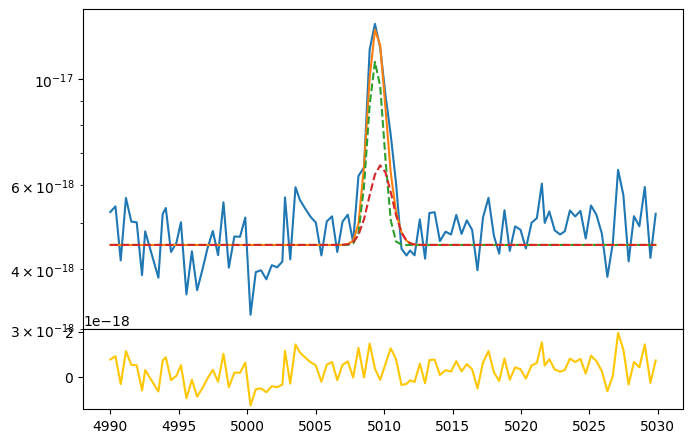

In [146]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(ariv_4740.wavelength, ariv_4740.flux)
bkg = 0.45e-17

ariva_nar = gaussian(ariv_4740.wavelength, 0.8e-17, wave_cat['[ArIV]4740'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_4740))
ariva_brd = gaussian(ariv_4740.wavelength, 0.4e-17, wave_cat['[ArIV]4740'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_4740))

ax.plot(ariv_4740.wavelength, bkg + ariva_nar + ariva_brd)
ax.plot(ariv_4740.wavelength, bkg + ariva_nar, ls='--')
ax.plot(ariv_4740.wavelength, bkg + ariva_brd, ls='--')
ax1.plot(ariv_4740.wavelength, ariv_4740.flux - bkg - ariva_nar - ariva_brd, color=c[3])
ax.set_yscale('log')

In [147]:
params_ariv = Parameters()
params_ariv.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_ariv.add('z_ratio', value=z_ratio, vary=False)
params_ariv.add('sigma_nar', value=upy.nominal_values(sigma_nar_4740), vary=False)
params_ariv.add('sigma_brd', value=upy.nominal_values(sigma_brd_4740), vary=False)
params_ariv.add('Ariva_nar', value=0.8e-17, min=0.)
params_ariv.add('Ariva_brd', value=0.4e-17, min=0.)
params_ariv.add('bkg', value=0.45e-17, min=0.)


def residual_ariv(params_ariv, x, data, uncertainty):
    
    z_nar = params_ariv['z_nar']
    z_brd = params_ariv['z_nar'] * params_ariv['z_ratio']
    sigma_nar = params_ariv['sigma_nar']
    sigma_brd = params_ariv['sigma_brd']
    ariva_nar = params_ariv['Ariva_nar']
    ariva_brd = params_ariv['Ariva_brd']
    bkg = params_ariv['bkg']
    
    x = ariv_4740.wavelength
    model_ariv = gaussian(x, ariva_nar, wave_cat['[ArIV]4740'], z_nar, sigma_nar) \
                + gaussian(x, ariva_brd, wave_cat['[ArIV]4740'], z_brd, sigma_brd)
    
    return (model_ariv + bkg - ariv_4740.flux) / ariv_4740.noise

In [148]:
np.random.seed(1146)
out_ariv = minimize(residual_ariv, params_ariv, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:19<00:00, 129.91it/s]


In [149]:
out_ariv.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05677155,1.0708e-05,(0.02%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_nar,0.49827194,,,0.49827193702,-inf,inf,False
sigma_brd,0.75895824,,,0.7589582353817278,-inf,inf,False
Ariva_nar,5.8013e-18,1.4113e-18,(24.33%),8e-18,0.00000000,inf,True
Ariva_brd,7.3792e-18,1.7189e-18,(23.29%),4e-18,0.00000000,inf,True
bkg,4.7648e-18,5.2678e-20,(1.11%),4.5e-18,0.00000000,inf,True


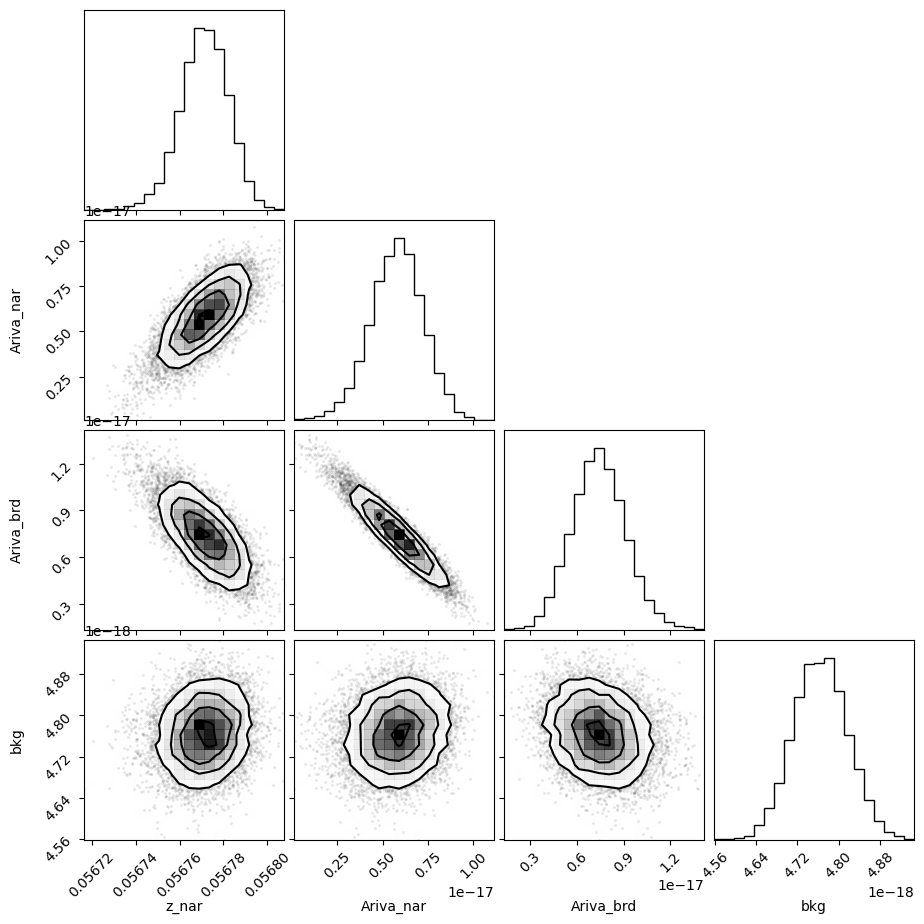

In [150]:
corner.corner(out_ariv.flatchain, labels=out_ariv.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

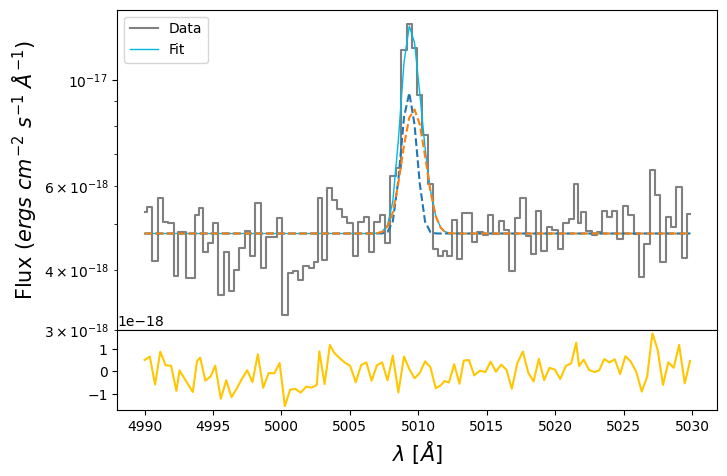

In [151]:
ariva_nar_flux = out_ariv.flatchain.Ariva_nar.mean()
ariva_nar_std = out_ariv.flatchain.Ariva_nar.std()

ariva_brd_flux = out_ariv.flatchain.Ariva_brd.mean()
ariva_brd_std = out_ariv.flatchain.Ariva_brd.std()

z_ariv = out_ariv.flatchain.z_nar.mean()
z_ariv_std = out_ariv.flatchain.z_nar.std()

bkg_ariv = out_ariv.flatchain.bkg.mean()
bkg_ariv_std = out_ariv.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(ariv_4740.wavelength, ariv_4740.flux,
            color='gray', label='Data', where='mid')

ariva_nar = gaussian(ariv_4740.wavelength, ariva_nar_flux, wave_cat['[ArIV]4740'], z_ariv, upy.nominal_values(sigma_nar_4740))
ariva_brd = gaussian(ariv_4740.wavelength, ariva_brd_flux, wave_cat['[ArIV]4740'], z_ariv * z_ratio, upy.nominal_values(sigma_brd_4740))

ariva = ariva_nar + ariva_brd

ax.plot(ariv_4740.wavelength, bkg_ariv + ariva,
        lw=1, color=c[0], label='Fit')
ax.plot(ariv_4740.wavelength, bkg_ariv + ariva_nar, ls='--')
ax.plot(ariv_4740.wavelength, bkg_ariv + ariva_brd, ls='--')

ax1.plot(ariv_4740.wavelength, ariv_4740.flux - bkg_ariv - ariva,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [152]:
fl_ariv = ufloat(ariva_nar_flux, ariva_nar_std) + ufloat(ariva_brd_flux, ariva_brd_std)
sn_ariv = fl_ariv.nominal_value / fl_ariv.std_dev
print(sn_ariv)

5.82875655882468


In [153]:
# EW
EW_ArIV_4740_nar = ufloat(ariva_nar_flux, ariva_nar_std) / ufloat(bkg_ariv, bkg_ariv_std)
EW_ArIV_4740_brd = ufloat(ariva_brd_flux, ariva_brd_std) / ufloat(bkg_ariv, bkg_ariv_std)
EW_ArIV_4740 = (ufloat(ariva_nar_flux, ariva_nar_std) + ufloat(ariva_brd_flux, ariva_brd_std)) / ufloat(bkg_ariv, bkg_ariv_std)

# [NeIII]3868

In [154]:
sigma_arc_3868 = (m * wave_cat['[NeIII]3868']*(1 + z_BN[igal])) + n

sigma_nar_3868 = sigma_arc_3868
sigma_brd_3868 = upy.sqrt((sigma_brd_intrinsic**2) + (sigma_arc_3868**2))

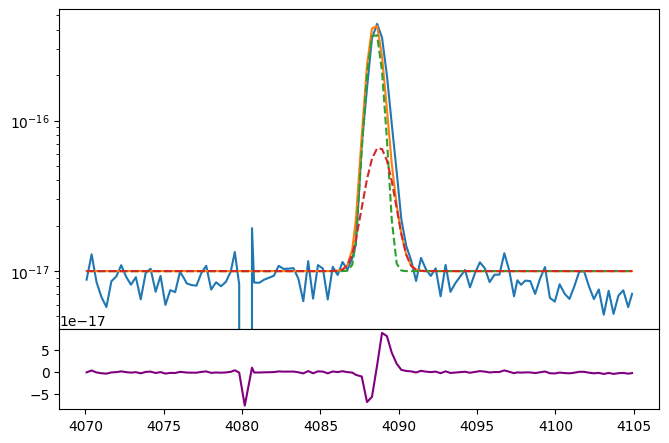

In [155]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(neiii_3868.wavelength, neiii_3868.flux)
bkg = 1e-17

neiiia_nar = gaussian(neiii_3868.wavelength, 40e-17, wave_cat['[NeIII]3868'], z=z_nar_oiii_4959, sigma=upy.nominal_values(sigma_nar_3868))
neiiia_brd = gaussian(neiii_3868.wavelength, 10e-17, wave_cat['[NeIII]3868'], z=z_brd_oiii_4959, sigma=upy.nominal_values(sigma_brd_3868))

ax.plot(neiii_3868.wavelength, bkg + neiiia_nar + neiiia_brd)
ax.plot(neiii_3868.wavelength, bkg + neiiia_nar, ls='--')
ax.plot(neiii_3868.wavelength, bkg + neiiia_brd, ls='--')
ax1.plot(neiii_3868.wavelength, neiii_3868.flux - bkg - neiiia_nar - neiiia_brd, color='purple')
ax.set_yscale('log')

In [156]:
params_neiii_3868 = Parameters()
params_neiii_3868.add('z_nar', value=z_nar_oiii_4959, vary=True)
params_neiii_3868.add('z_ratio', value=z_ratio, vary=False)
params_neiii_3868.add('sigma_nar', value=upy.nominal_values(sigma_nar_3868), vary=False)
params_neiii_3868.add('sigma_brd', value=upy.nominal_values(sigma_brd_3868), vary=False)
params_neiii_3868.add('Neiiia_nar', value=40e-17, min=0.)
params_neiii_3868.add('Neiiia_brd', value=10e-17, min=0.)
params_neiii_3868.add('bkg', value=1e-17, min=0.)


def residual_neiii_3868(params_neiii_3868, x, data, uncertainty):
    
    z_nar = params_neiii_3868['z_nar']
    z_brd = params_neiii_3868['z_nar'] * params_neiii_3868['z_ratio']
    sigma_nar = params_neiii_3868['sigma_nar']
    sigma_brd = params_neiii_3868['sigma_brd']
    neiiia_nar_flux = params_neiii_3868['Neiiia_nar']
    neiiia_brd_flux = params_neiii_3868['Neiiia_brd']
    bkg = params_neiii_3868['bkg']
    
    x = neiii_3868.wavelength
    model = gaussian(x, neiiia_nar_flux, wave_cat['[NeIII]3868'], z_nar, sigma_nar) + \
            gaussian(x, neiiia_brd_flux, wave_cat['[NeIII]3868'], z_brd, sigma_brd)
    
    return (model + bkg - neiii_3868.flux) / neiii_3868.noise

In [157]:
np.random.seed(1146)
out_neiii_3868 = minimize(residual_neiii_3868, params_neiii_3868, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:19<00:00, 129.70it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [19.16357471 80.71857343 92.32885544 71.65558057]


In [158]:
out_neiii_3868.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05682296,1.0205e-06,(0.00%),0.05678928005542782,-inf,inf,True
z_ratio,1.00131162,,,1.001311616723984,-inf,inf,False
sigma_nar,0.41412125,,,0.41412124627599994,-inf,inf,False
sigma_brd,0.70656853,,,0.7065685291953433,-inf,inf,False
Neiiia_nar,3.6802e-16,5.6485e-18,(1.53%),4e-16,0.00000000,inf,True
Neiiia_brd,1.6570e-16,6.1733e-18,(3.73%),1e-16,0.00000000,inf,True
bkg,8.6592e-18,1.4330e-19,(1.65%),1e-17,0.00000000,inf,True


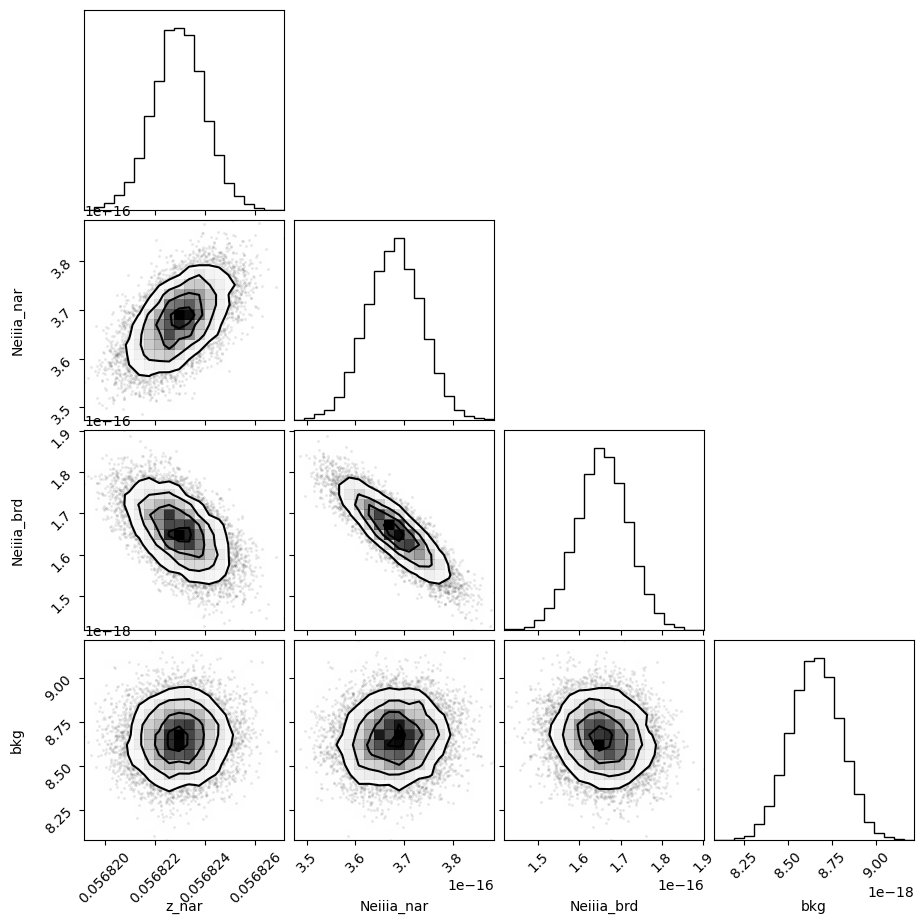

In [159]:
corner.corner(out_neiii_3868.flatchain, labels=out_neiii_3868.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

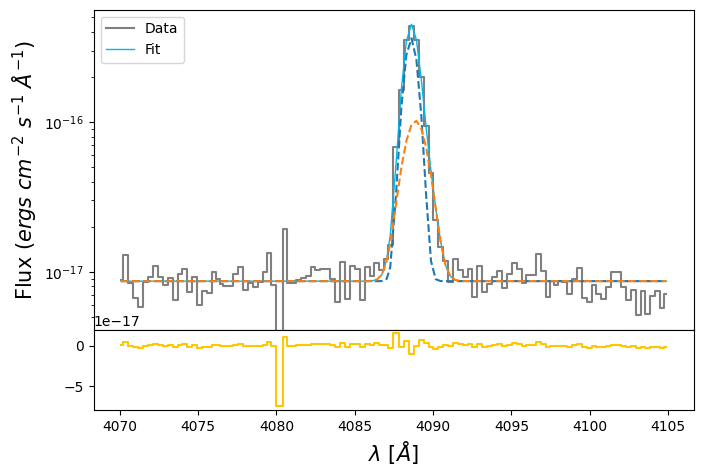

In [160]:
neiiia_nar_flux = out_neiii_3868.flatchain.Neiiia_nar.mean()
neiiia_nar_std = out_neiii_3868.flatchain.Neiiia_nar.std()

neiiia_brd_flux = out_neiii_3868.flatchain.Neiiia_brd.mean()
neiiia_brd_std = out_neiii_3868.flatchain.Neiiia_brd.std()

z_neiii = out_neiii_3868.flatchain.z_nar.mean()
z_neiii_std = out_neiii_3868.flatchain.z_nar.std()

bkg_neiiia = out_neiii_3868.flatchain.bkg.mean()
bkg_neiiia_std = out_neiii_3868.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(neiii_3868.wavelength, neiii_3868.flux,
            color='gray', label='Data', where='mid')

neiiia_nar = gaussian(neiii_3868.wavelength, neiiia_nar_flux, wave_cat['[NeIII]3868'], z_neiii, upy.nominal_values(sigma_nar_3868))
neiiia_brd = gaussian(neiii_3868.wavelength, neiiia_brd_flux, wave_cat['[NeIII]3868'], z_neiii * z_ratio, upy.nominal_values(sigma_brd_3868))
neiiia = neiiia_nar + neiiia_brd

ax.plot(neiii_3868.wavelength, bkg_neiiia + neiiia, lw=1, color=c[0], label='Fit')
ax.plot(neiii_3868.wavelength, bkg_neiiia + neiiia_nar, ls='--')
ax.plot(neiii_3868.wavelength, bkg_neiiia + neiiia_brd, ls='--')
ax1.step(neiii_3868.wavelength, neiii_3868.flux - bkg_neiiia - neiiia, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [161]:
# EW
EW_NeIII_3868_nar = ufloat(neiiia_nar_flux, neiiia_nar_std) / ufloat(bkg_neiiia, bkg_neiiia_std)
EW_NeIII_3868_brd = ufloat(neiiia_brd_flux, neiiia_brd_std) / ufloat(bkg_neiiia, bkg_neiiia_std)
EW_NeIII_3868 = (ufloat(neiiia_nar_flux, neiiia_nar_std) + ufloat(neiiia_brd_flux, neiiia_brd_std)) / ufloat(bkg_neiiia, bkg_neiiia_std)

# Balmer decrements

In [162]:
from magE.functions import *
from magE.functions import calzetti2000 as k_cal

flux_ha_bal = ufloat(out_ha_nii.flatchain.Ha_nar.mean(), out_ha_nii.flatchain.Ha_nar.std()) \
            + ufloat(out_ha_nii.flatchain.Ha_brd.mean(), out_ha_nii.flatchain.Ha_brd.std())
flux_hb_bal = ufloat(out_hb.flatchain.Hb_nar.mean(), out_hb.flatchain.Hb_nar.std()) \
            + ufloat(out_hb.flatchain.Hb_brd.mean(), out_hb.flatchain.Hb_brd.std())
flux_hg_bal = ufloat(out_hg.flatchain.Hg_nar.mean(), out_hg.flatchain.Hg_nar.std()) \
            + ufloat(out_hg.flatchain.Hg_brd.mean(), out_hg.flatchain.Hg_brd.std())
flux_hd_bal = ufloat(out_hd.flatchain.Hd_nar.mean(), out_hd.flatchain.Hd_nar.std()) \
            + ufloat(out_hd.flatchain.Hd_brd.mean(), out_hd.flatchain.Hd_brd.std())

y_balmer = upy.log10([(flux_ha_bal / flux_hb_bal) / 2.86, 
                    (flux_hb_bal / flux_hb_bal) / 1.0,
                    (flux_hg_bal / flux_hb_bal) / 0.464,
                    (flux_hd_bal / flux_hb_bal) / 0.256])

x_balmer = np.array([k_cal(wave_cat['Ha']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hb']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hg']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hd']) - k_cal(wave_cat['Hb'])])

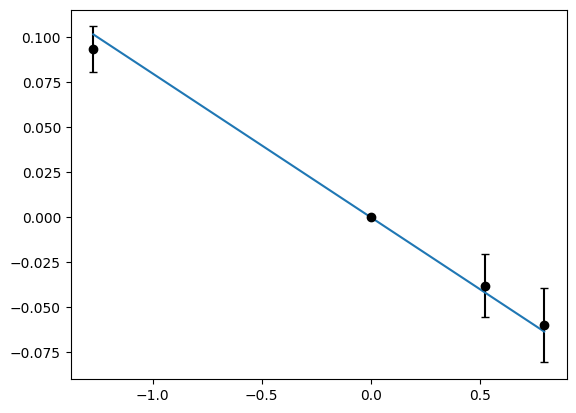

In [163]:
plt.errorbar(x_balmer, upy.nominal_values(y_balmer), 2*upy.std_devs(y_balmer),
            ls='', color='black', marker='o', capsize=3)
plt.plot(x_balmer, x_balmer * (-0.4 * 0.2))

In [175]:
mask_balmer = (y_balmer != 0)

params_balmer = Parameters()
params_balmer.add('slope', value=0.4 * 0.2)

def residuals_balmer(params_balmer, x, data, uncertainty):
    
    slope = params_balmer['slope']
    x = x_balmer[mask_balmer]
    
    model = x * (-slope)
    return (model - upy.nominal_values(y_balmer[mask_balmer])) / upy.nominal_values(y_balmer[mask_balmer])

np.random.seed(1146)
out_balmer = minimize(residuals_balmer, params_balmer, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:12<00:00, 196.68it/s]


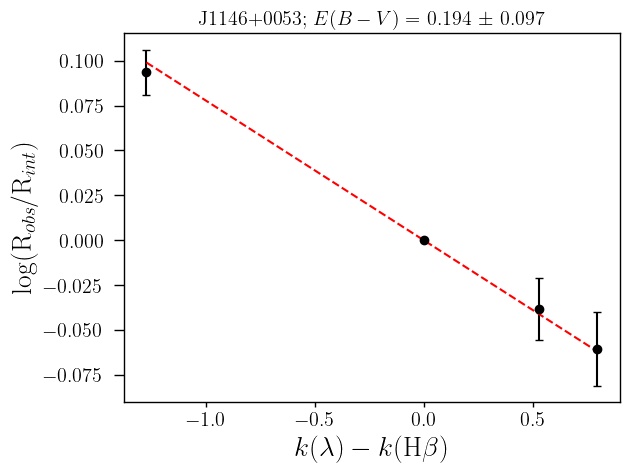

In [183]:
color_excess = ufloat(out_balmer.flatchain.slope.mean(), out_balmer.flatchain.slope.std()) / 0.4
E_BV = out_balmer.flatchain.slope.mean() / 0.4

texPlot('on')
plt.errorbar(x_balmer, upy.nominal_values(y_balmer), 2*upy.std_devs(y_balmer),
            ls='', color='black', marker='o', capsize=3)
plt.plot(x_balmer, - E_BV * 0.4 * x_balmer, ls='--', color='red')
plt.ylabel(r'log(R$_{obs}$/R$_{int}$)')
plt.xlabel(r'$k(\lambda) - k($H$\beta)$')
plt.title(r'J1146+0053; $E(B-V) = $ '+str(round(color_excess.nominal_value, 3))+' $\pm$ '+str(round(color_excess.std_dev, 3)))
plt.savefig('/home/benjamin/Documents/analogs/results/balmer_decrements/bal_dec_J1146.pdf', bbox_inches='tight')

In [184]:
decrement_dict = {'galname': galname,
                 'Ha/Hb': (flux_ha_bal / flux_hb_bal).nominal_value,
                 'Ha/Hb_err': (flux_ha_bal / flux_hb_bal).std_dev,
                 'Hg/Hb': (flux_hg_bal / flux_hb_bal).nominal_value,
                 'Hg/Hb_err': (flux_hg_bal / flux_hb_bal).std_dev,
                 'Hd/Hb': (flux_hd_bal / flux_hb_bal).nominal_value,
                 'Hd/Hb_err': (flux_hd_bal / flux_hb_bal).std_dev,
                 'E_BV': out_balmer.flatchain.slope.mean() / 0.4,
                 'E_BV_err': out_balmer.flatchain.slope.std() / 0.4
                 }
decrement_dict_pd = pd.DataFrame(data=decrement_dict, index=[0])
save_catalog(galname, decrement_dict_pd, magePath + '/results/bal_decrements.csv')

Existent catalog (.csv) file.
Existent data for J1146, overwriting...
Done.


(array([  20.,  189.,  773., 1841., 2798., 2474., 1335.,  465.,   98.,
           7.]),
 array([-0.07673569, -0.04541148, -0.01408728,  0.01723692,  0.04856112,
         0.07988533,  0.11120953,  0.14253373,  0.17385794,  0.20518214,
         0.23650634]),
 <BarContainer object of 10 artists>)

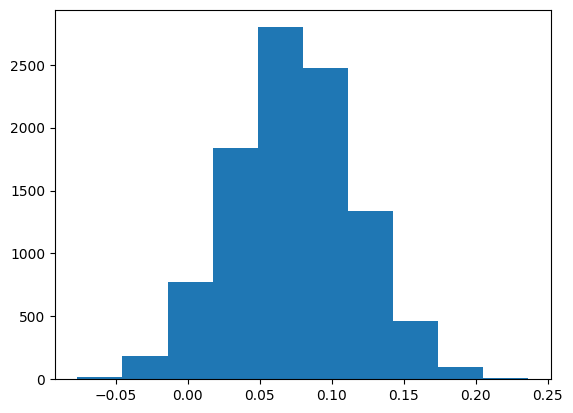

In [176]:
plt.hist(out_balmer.flatchain.slope)

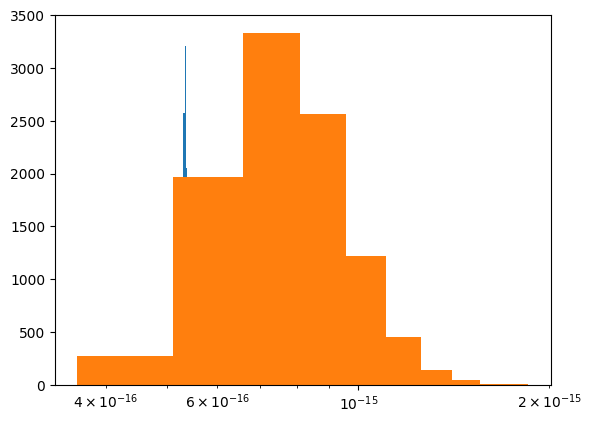

In [178]:
plt.hist(out_neiii_3868.flatchain.Neiiia_nar + out_neiii_3868.flatchain.Neiiia_brd)
plt.hist((out_neiii_3868.flatchain.Neiiia_nar + out_neiii_3868.flatchain.Neiiia_brd) \
        * 10**(0.4 * out_balmer.flatchain.slope * k_cal(wave_cat['[NeIII]3868'])))
plt.xscale('log')

# Temperatures

In [186]:
neiiia_nar_chain = out_neiii_3868.flatchain.Neiiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[NeIII]3868']))
neiiia_brd_chain = out_neiii_3868.flatchain.Neiiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[NeIII]3868']))
neiiia_tot_chain = neiiia_nar_chain + neiiia_brd_chain

ariva_nar_chain = out_ariv.flatchain.Ariva_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[ArIV]4740']))
ariva_brd_chain = out_ariv.flatchain.Ariva_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[ArIV]4740']))
ariva_tot_chain = ariva_nar_chain + ariva_brd_chain

ariiia_nar_chain = out_ariii.flatchain.Ariiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[ArIII]7135']))
ariiia_brd_chain = out_ariii.flatchain.Ariiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[ArIII]7135']))
ariiia_tot_chain = ariiia_nar_chain + ariiia_brd_chain

heiia_nar_chain = out_heii4685.flatchain.Heii4685_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeII4685']))
heiia_brd_chain = out_heii4685.flatchain.Heii4685_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeII4685']))
heiia_tot_chain = heiia_nar_chain + heiia_brd_chain

heia_nar_chain = out_hei7065.flatchain.Hei7065_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI7065']))
heia_brd_chain = out_hei7065.flatchain.Hei7065_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI7065']))
heia_tot_chain = heia_nar_chain + heia_brd_chain

heib_nar_chain = out_hei6678.flatchain.Hei6678_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI6678']))
heib_brd_chain = out_hei6678.flatchain.Hei6678_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI6678']))
heib_tot_chain = heib_nar_chain + heib_brd_chain

heic_nar_chain = out_hei5875.flatchain.Hei5875_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI5875']))
heic_brd_chain = out_hei5875.flatchain.Hei5875_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI5875']))
heic_tot_chain = heic_nar_chain + heic_brd_chain

heid_nar_chain = out_hei4471.flatchain.Hei4471_nar * 10**(0.4 * E_BV * k_cal(wave_cat['HeI4471']))
heid_brd_chain = out_hei4471.flatchain.Hei4471_brd * 10**(0.4 * E_BV * k_cal(wave_cat['HeI4471']))
heid_tot_chain = heid_nar_chain + heid_brd_chain

oiiia_nar_chain = out_oiii_hei.flatchain.Oiiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]5007']))
oiiia_brd_chain = out_oiii_hei.flatchain.Oiiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]5007']))
oiiia_tot_chain = oiiia_nar_chain + oiiia_brd_chain

oiiib_nar_chain = out_oiii_4959.flatchain.Oiiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4959']))
oiiib_brd_chain = out_oiii_4959.flatchain.Oiiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4959']))
oiiib_tot_chain = oiiib_nar_chain + oiiib_brd_chain

oiiic_nar_chain = out_oiiic.flatchain.Oiiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4363']))
oiiic_brd_chain = out_oiiic.flatchain.Oiiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4363']))
oiiic_tot_chain = oiiic_nar_chain + oiiic_brd_chain

siia_nar_chain = out_sii.flatchain.Siia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6730']))
siia_brd_chain = out_sii.flatchain.Siia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6730']))
siia_tot_chain = siia_nar_chain + siia_brd_chain

siib_nar_chain = out_sii.flatchain.Siib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6716']))
siib_brd_chain = out_sii.flatchain.Siib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6716']))
siib_tot_chain = siib_nar_chain + siib_brd_chain

oiia_nar_chain = out_oii_7320.flatchain.Oiia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7330']))
oiia_brd_chain = out_oii_7320.flatchain.Oiia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7330']))
oiia_tot_chain = oiia_nar_chain + oiia_brd_chain

oiib_nar_chain = out_oii_7320.flatchain.Oiib_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7319']))
oiib_brd_chain = out_oii_7320.flatchain.Oiib_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7319']))
oiib_tot_chain = oiib_nar_chain + oiib_brd_chain

oiic_nar_chain = out_oii_3727.flatchain.Oiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3729']))
oiic_brd_chain = out_oii_3727.flatchain.Oiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3729']))
oiic_tot_chain = oiic_nar_chain + oiic_brd_chain

oiid_nar_chain = out_oii_3727.flatchain.Oiid_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3726']))
oiid_brd_chain = out_oii_3727.flatchain.Oiid_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3726']))
oiid_tot_chain = oiid_nar_chain + oiid_brd_chain

siiic_nar_chain = out_oi_siii.flatchain.Siiic_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]6312']))
siiic_brd_chain = out_oi_siii.flatchain.Siiic_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]6312']))
siiic_tot_chain = siiic_nar_chain + siiic_brd_chain

oia_nar_chain = out_oi_siii.flatchain.Oi_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[OI]6300']))
oia_brd_chain = out_oi_siii.flatchain.Oi_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[OI]6300']))
oia_tot_chain = oia_nar_chain + oia_brd_chain

niia_nar_chain = out_ha_nii.flatchain.Niia_nar * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6584']))
niia_brd_chain = out_ha_nii.flatchain.Niia_brd * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6584']))
niia_tot_chain = niia_nar_chain + niia_brd_chain

niib_nar_chain = out_ha_nii.flatchain.Niia_nar * out_ha_nii.flatchain.Niib_to_niia * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6548']))
niib_brd_chain = out_ha_nii.flatchain.Niia_brd * out_ha_nii.flatchain.Niib_to_niia * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6548']))
niib_tot_chain = niib_nar_chain + niib_brd_chain

hd_nar_chain = out_hd.flatchain.Hd_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hd']))
hd_brd_chain = out_hd.flatchain.Hd_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hd']))
hd_tot_chain = hd_nar_chain + hd_brd_chain

hg_nar_chain = out_hg.flatchain.Hg_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hg']))
hg_brd_chain = out_hg.flatchain.Hg_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hg']))
hg_tot_chain = hg_nar_chain + hg_brd_chain

hb_nar_chain = out_hb.flatchain.Hb_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Hb']))
hb_brd_chain = out_hb.flatchain.Hb_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Hb']))
hb_tot_chain = hb_nar_chain + hb_brd_chain

ha_nar_chain = out_ha_nii.flatchain.Ha_nar * 10**(0.4 * E_BV * k_cal(wave_cat['Ha']))
ha_brd_chain = out_ha_nii.flatchain.Ha_brd * 10**(0.4 * E_BV * k_cal(wave_cat['Ha']))
ha_tot_chain = ha_nar_chain + ha_brd_chain

In [187]:
chains_dict = {'[OII]3726_nar': oiid_nar_chain.to_numpy(),
               '[OII]3726_brd': oiid_brd_chain.to_numpy(),
               '[OII]3726': oiid_tot_chain.to_numpy(),
               
               '[OII]3729_nar': oiic_nar_chain.to_numpy(),
               '[OII]3729_brd': oiic_brd_chain.to_numpy(),
               '[OII]3729': oiic_tot_chain.to_numpy(),
               
               '[NeIII]3868_nar': neiiia_nar_chain.to_numpy(),
               '[NeIII]3868_brd': neiiia_brd_chain.to_numpy(),
               '[NeIII]3868': neiiia_tot_chain.to_numpy(),
               
               'Hd_nar': hd_nar_chain.to_numpy(),
               'Hd_brd': hd_brd_chain.to_numpy(),
               'Hd': hd_tot_chain.to_numpy(),
               
               'Hg_nar': hg_nar_chain.to_numpy(),
               'Hg_brd': hg_brd_chain.to_numpy(),
               'Hg': hg_tot_chain.to_numpy(),
               
               '[OIII]4363_nar': oiiic_nar_chain.to_numpy(),
               '[OIII]4363_brd': oiiic_brd_chain.to_numpy(),
               '[OIII]4363': oiiic_tot_chain.to_numpy(),
               
               'HeI4471_nar': heid_nar_chain.to_numpy(),
               'HeI4471_brd': heid_brd_chain.to_numpy(),
               'HeI4471': heid_tot_chain.to_numpy(),
               
               '[FeIII]4658_nar': np.nan * np.ones(10000),
               '[FeIII]4658_brd': np.nan * np.ones(10000),
               '[FeIII]4658': np.nan * np.ones(10000),
               
               'HeII4686_nar': heiia_nar_chain.to_numpy(),
               'HeII4686_brd': heiia_brd_chain.to_numpy(),
               'HeII4686': heiia_tot_chain.to_numpy(),
               
               '[ArIV]4740_nar': ariva_nar_chain.to_numpy(),
               '[ArIV]4740_brd': ariva_brd_chain.to_numpy(),
               '[ArIV]4740': ariva_tot_chain.to_numpy(),
               
               'Hb_nar': hb_nar_chain.to_numpy(),
               'Hb_brd': hb_brd_chain.to_numpy(),
               'Hb': hb_tot_chain.to_numpy(),
               
               '[OIII]4959_nar': oiiib_nar_chain.to_numpy(),
               '[OIII]4959_brd': oiiib_brd_chain.to_numpy(),
               '[OIII]4959': oiiib_tot_chain.to_numpy(),
               
               '[OIII]5007_nar': oiiia_nar_chain.to_numpy(),
               '[OIII]5007_brd': oiiia_brd_chain.to_numpy(),
               '[OIII]5007': oiiia_tot_chain.to_numpy(),
               
               '[NII]5755_nar': np.nan * np.ones(10000),
               '[NII]5755_brd': np.nan * np.ones(10000),
               '[NII]5755': np.nan * np.ones(10000),
               
               'HeI5875_nar': heic_nar_chain.to_numpy(),
               'HeI5875_brd': heic_brd_chain.to_numpy(),
               'HeI5875': heic_tot_chain.to_numpy(),
               
               '[OI]6300_nar': oia_nar_chain.to_numpy(),
               '[OI]6300_brd': oia_brd_chain.to_numpy(),
               '[OI]6300': oia_tot_chain.to_numpy(),
               
               '[SIII]6312_nar': siiic_nar_chain.to_numpy(),
               '[SIII]6312_brd': siiic_brd_chain.to_numpy(),
               '[SIII]6312': siiic_tot_chain.to_numpy(),
               
               '[NII]6548_nar': niib_nar_chain.to_numpy(),
               '[NII]6548_brd': niib_brd_chain.to_numpy(),
               '[NII]6548': niib_tot_chain.to_numpy(),
               
               'Ha_nar': ha_nar_chain.to_numpy(),
               'Ha_brd': ha_brd_chain.to_numpy(),
               'Ha': ha_tot_chain.to_numpy(),
               
               '[NII]6584_nar': niia_nar_chain.to_numpy(),
               '[NII]6584_brd': niia_brd_chain.to_numpy(),
               '[NII]6584': niia_tot_chain.to_numpy(),
               
               'HeI6678_nar': heid_nar_chain.to_numpy(),
               'HeI6678_brd': heid_brd_chain.to_numpy(),
               'HeI6678': heid_tot_chain.to_numpy(),
               
               '[SII]6716_nar': siib_nar_chain.to_numpy(),
               '[SII]6716_brd': siib_brd_chain.to_numpy(),
               '[SII]6716': siib_tot_chain.to_numpy(),
               
               '[SII]6730_nar': siia_nar_chain.to_numpy(),
               '[SII]6730_brd': siia_brd_chain.to_numpy(),
               '[SII]6730': siia_tot_chain.to_numpy(),
               
               'HeI7065_nar': heia_nar_chain.to_numpy(),
               'HeI7065_brd': heia_brd_chain.to_numpy(),
               'HeI7065': heia_tot_chain.to_numpy(),
               
               '[ArIII]7135_nar': ariiia_nar_chain.to_numpy(),
               '[ArIII]7135_brd': ariiia_brd_chain.to_numpy(),
               '[ArIII]7135': ariiia_tot_chain.to_numpy(),
               
               '[OII]7319_nar': oiib_nar_chain.to_numpy(),
               '[OII]7319_brd': oiib_brd_chain.to_numpy(),
               '[OII]7319': oiib_tot_chain.to_numpy(),
               
               '[OII]7330_nar': oiia_nar_chain.to_numpy(),
               '[OII]7330_brd': oiia_brd_chain.to_numpy(),
               '[OII]7330': oiia_tot_chain.to_numpy(),
               
               '[SIII]9069_nar': np.nan * np.ones(10000),
               '[SIII]9069_brd': np.nan * np.ones(10000),
               '[SIII]9069': np.nan * np.ones(10000),
               
               '[SIII]9532_nar': np.nan * np.ones(10000),
               '[SIII]9532_brd': np.nan * np.ones(10000),
               '[SIII]9532': np.nan * np.ones(10000)
}
chains_dict_pd = pd.DataFrame(data=chains_dict, index=None)
chains_dict_pd.to_csv('/home/benjamin/Documents/chains/chains_J1146.csv')
#save_catalog(galname, chains_dict_pd, '/home/benjamin/Documents/chains/chains_J1146.csv')

In [188]:
lines_dict = {'galname': galname,
              '[OII]3726': oiid_tot_chain.mean(),
              '[OII]3726_err': oiid_tot_chain.std(),
              '[OII]3729': oiic_tot_chain.mean(),
              '[OII]3729_err': oiic_tot_chain.std(),
              '[NeIII]3868': neiiia_tot_chain.mean(),
              '[NeIII]3868_err': neiiia_tot_chain.std(),
              'Hd': hd_tot_chain.mean(),
              'Hd_err': hd_tot_chain.std(),
              'Hg': hg_tot_chain.mean(),
              'Hg_err': hg_tot_chain.std(),
              '[OIII]4363': oiiic_tot_chain.mean(),
              '[OIII]4363_err': oiiic_tot_chain.std(),
              'HeI4471': heid_tot_chain.mean(),
              'HeI4471_err': heid_tot_chain.std(),
              '[FeIII]4658': None,
              '[FeIII]4658_err': None,
              'HeII4686': heiia_tot_chain.mean(),
              'HeII4686_err': heiia_tot_chain.std(),
              '[ArIV]4740': ariva_tot_chain.mean(),
              '[ArIV]4740_err': ariva_tot_chain.std(),
              'Hb': hb_tot_chain.mean(),
              'Hb_err': hb_tot_chain.std(),
              '[OIII]4959': oiiib_tot_chain.mean(),
              '[OIII]4959_err': oiiib_tot_chain.std(),
              '[OIII]5007': oiiia_tot_chain.mean(),
              '[OIII]5007_err': oiiia_tot_chain.std(),
              '[NII]5575': None,
              '[NII]5575_err': None,
              'HeI5875': heic_tot_chain.mean(),
              'HeI5875_err': heic_tot_chain.std(),
              '[OI]6300': oia_tot_chain.mean(),
              '[OI]6300_err': oia_tot_chain.std(),
              '[SIII]6312': siiic_tot_chain.mean(),
              '[SIII]6312_err': siiic_tot_chain.std(),
              '[NII]6548': niib_tot_chain.mean(),
              '[NII]6548_err': niib_tot_chain.std(),
              'Ha': ha_tot_chain.mean(),
              'Ha_err': ha_tot_chain.std(),
              '[NII]6584': niia_tot_chain.mean(),
              '[NII]6584_err': niia_tot_chain.std(),
              'HeI6678': heib_tot_chain.mean(),
              'HeI6678_err': heib_tot_chain.std(),
              '[SII]6716': siib_tot_chain.mean(),
              '[SII]6716_err': siib_tot_chain.std(),
              '[SII]6730': siia_tot_chain.mean(),
              '[SII]6730_err': siia_tot_chain.std(),
              'HeI7065': heia_tot_chain.mean(),
              'HeI7065_err': heia_tot_chain.std(),
              '[ArIII]7135': ariiia_tot_chain.mean(),
              '[ArIII]7135_err': ariiia_tot_chain.std(),
              '[OII]7319': oiib_tot_chain.mean(),
              '[OII]7319_err': oiib_tot_chain.std(),
              '[OII]7330': oiia_tot_chain.mean(),
              '[OII]7330_err': oiia_tot_chain.std(),
              '[SIII]9069': None,
              '[SIII]9069_err': None,
              '[SIII]9532': None,
              '[SIII]9532_err': None
}
lines_dict_pd = pd.DataFrame(data=lines_dict, index=[0])
save_catalog(galname, lines_dict_pd, magePath + '/results/em_lines_final.csv')

Existent catalog (.csv) file.
Non existent data for J1146, adding new data...
Done.


In [163]:
lines_dict = {'galname': galname,
              '[OII]3726': EW_OII_3726.nominal_value,
              '[OII]3726_err': EW_OII_3726.std_dev,
              '[OII]3729': EW_OII_3729.nominal_value,
              '[OII]3729_err': EW_OII_3729.std_dev,
              '[NeIII]3868': EW_NeIII_3868.nominal_value,
              '[NeIII]3868_err': EW_NeIII_3868.std_dev,
              'Hd': EW_Hd.nominal_value,
              'Hd_err': EW_Hd.std_dev,
              'Hg': EW_Hg.nominal_value,
              'Hg_err': EW_Hg.std_dev,
              '[OIII]4363': EW_OIII_4363.nominal_value,
              '[OIII]4363_err': EW_OIII_4363.std_dev,
              'HeI4471': EW_HeI_4471.nominal_value,
              'HeI4471_err': EW_HeI_4471.std_dev,
              '[FeIII]4658': None,
              '[FeIII]4658_err': None,
              'HeII4686': EW_HeII_4686.nominal_value,
              'HeII4686_err': EW_HeII_4686.std_dev,
              '[ArIV]4740': EW_ArIV_4740.nominal_value,
              '[ArIV]4740_err': EW_ArIV_4740.std_dev,
              'Hb': EW_Hb.nominal_value,
              'Hb_err': EW_Hb.std_dev,
              '[OIII]4959': EW_OIII_4959.nominal_value,
              '[OIII]4959_err': EW_OIII_4959.std_dev,
              '[OIII]5007': EW_OIII_5007.nominal_value,
              '[OIII]5007_err': EW_OIII_5007.std_dev,
              '[NII]5755': None,
              '[NII]5755_err': None,
              'HeI5875': EW_HeI_5875.nominal_value,
              'HeI5875_err': EW_HeI_5875.std_dev,
              '[OI]6300': EW_OI_6300.nominal_value,
              '[OI]6300_err': EW_OI_6300.std_dev,
              '[SIII]6312': EW_SIII_6312.nominal_value,
              '[SIII]6312_err': EW_SIII_6312.std_dev,
              '[NII]6548': EW_NII_6548.nominal_value,
              '[NII]6548_err': EW_NII_6548.std_dev,
              'Ha': EW_Ha.nominal_value,
              'Ha_err': EW_Ha.std_dev,
              '[NII]6584': EW_NII_6584.nominal_value,
              '[NII]6584_err': EW_NII_6584.std_dev,
              'HeI6678': EW_HeI_6678.nominal_value,
              'HeI6678_err': EW_HeI_6678.std_dev,
              '[SII]6716': EW_SII_6716.nominal_value,
              '[SII]6716_err': EW_SII_6716.std_dev,
              '[SII]6730': EW_SII_6730.nominal_value,
              '[SII]6730_err': EW_SII_6730.std_dev,
              'HeI7065': EW_HeI_7065.nominal_value,
              'HeI7065_err': EW_HeI_7065.std_dev,
              '[ArIII]7135': EW_ArIII_7135.nominal_value,
              '[ArIII]7135_err': EW_ArIII_7135.std_dev,
              '[OII]7319': EW_OII_7319.nominal_value,
              '[OII]7319_err': EW_OII_7319.std_dev,
              '[OII]7330': EW_OII_7330.nominal_value,
              '[OII]7330_err': EW_OII_7330.std_dev,
              '[SIII]9069': None,
              '[SIII]9069_err': None,
              '[SIII]9532': None,
              '[SIII]9532_err': None
}
lines_dict_pd = pd.DataFrame(data=lines_dict, index=[0])
save_catalog(galname, lines_dict_pd, magePath + '/results/ew_lines_final.csv')

Existent catalog (.csv) file.
Non existent data for J1146, adding new data...
Done.


# Start here

In [1]:
# Reading decrements info

import os
import sys
magePath = '/home/benjamin/Documents/analogs/'
os.sys.path.append(magePath)

import pandas as pd
from magE.constutils import *
from magE.functions import *
from magE.plotutils import *
from magE.functions import calzetti2000 as k_cal
import pyneb as pn

galname = 'J1146'

# Extinction
ext_cat = pd.read_csv(magePath+'results/bal_decrements.csv')
index = np.argmax(ext_cat['galname'] == galname)
E_BV = ext_cat['E_BV'][index]
E_BV_err = ext_cat['E_BV_err'][index]

if E_BV < 0:
    E_BV = 0

In [23]:
# Reading the chains
chains = pd.read_csv('/home/benjamin/Documents/chains/chains_J1146.csv')

In [24]:
# High ionization temperature T[OIII]
T_OIII = TO3(chains['[OIII]5007'], chains['[OIII]4959'], chains['[OIII]4363'])
O2plus_H = 10**(double_log_OH(chains['[OIII]5007'], chains['[OIII]4959'], chains['Hb'], T_OIII) - 12)

In [25]:
# Density n([SII])
el_density = ne(chains['[SII]6730'], chains['[SII]6716'], T_OIII)

In [26]:
# Low ionization temperature T[OII]
IO2_R = 9.36 * (T_OIII**0.44) * O2plus_H * chains['Hb']
T_OII = TO2(chains['[OII]7330'], chains['[OII]7319'], chains['[OII]3726'], chains['[OII]3729'], el_density, IO2_R)

# Garnett
T_OII_G92 = ((0.7 * (T_OIII * 10)) + 0.3) / 10

# This work
T_OII_tw = (slope_o3o2_final * T_OIII) + intercept_o3o2_final

In [27]:
# Intermediate ionization temperature
#T_SIII = TS3(chains['[SIII]9532'], chains['[SIII]9069'], chains['[SIII]6312'])

In [28]:
# PyNeb T[NII]
#import pyneb as pn
#N2 = pn.Atom('N', 2)
#R_N2 = (chains['[NII]6584'] + chains['[NII]6548']) / chains['[NII]5755']
#T_NII = N2.getTemDen(R_N2, den=el_density, to_eval = "(L(6584) + L(6548)) / L(5755)") / 10000

Text(0.5, 0, 'T[OII]$_{tot}$ (10$^{4}$ K)')

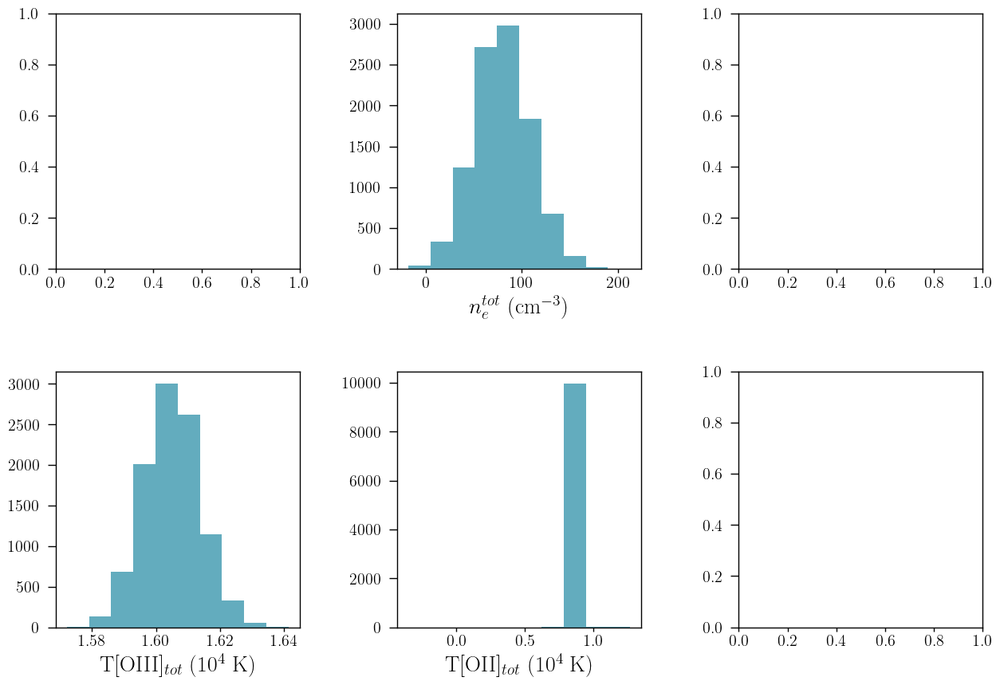

In [29]:
texPlot('on')
fig, axs = plt.subplots(2, 3)
fig.set_size_inches((15, 10))
fig.subplots_adjust(wspace=0.4, hspace=0.4)

#axs[0, 0].scatter(t_OIII_nar, t_OIII_brd, s=1, color=cr[2])
#axs[0, 0].set_xlabel(r'T[OIII]$_{narrow}$ (10$^{4}$ K)')
#axs[0, 0].set_ylabel(r'T[OIII]$_{broad}$ (10$^{4}$ K)')

axs[1, 0].hist(T_OIII, color=cr[2])
axs[1, 0].set_xlabel(r'T[OIII]$_{tot}$ (10$^{4}$ K)')

axs[0, 1].hist(el_density, color=cr[2])
axs[0, 1].set_xlabel(r'$n_{e}^{tot}$ (cm$^{-3}$)')

axs[1, 1].hist(T_OII, color=cr[2])
axs[1, 1].set_xlabel(r'T[OII]$_{tot}$ (10$^{4}$ K)')

#axs[1, 2].hist(T_SIII, color=cr[2])
#axs[1, 2].set_xlabel(r'T[SIII]$_{tot}$ (10$^{4}$ K)')

#axs[0, 2].hist(T_NII, color=cr[2])
#axs[0, 2].set_xlabel(r'T[NII]$_{tot}$ (10$^{4}$ K)')

In [9]:
temden_dict = {'galname': galname,
               'tOIII': np.nanpercentile(T_OIII, 50),
               'tOIII_16': np.nanpercentile(T_OIII, 16),
               'tOIII_84': np.nanpercentile(T_OIII, 84),
               'tOII': np.nanpercentile(T_OII, 50),
               'tOII_16': np.nanpercentile(T_OII, 16),
               'tOII_84': np.nanpercentile(T_OII, 84),
               'ne': np.nanpercentile(el_density, 50),
               'ne_16': np.nanpercentile(el_density, 16),
               'ne_84': np.nanpercentile(el_density, 84),
               'tNII': None,
               'tNII_16': None,
               'tNII_84': None,
               'tSIII': None,
               'tSIII_16': None,
               'tSIII_84': None,
}
temden_dict_pd = pd.DataFrame(data=temden_dict, index=[0])
save_catalog(galname, temden_dict_pd, magePath + '/results/metals/temden_measured_final.csv')

Existent catalog (.csv) file.
Existent data for J1146, overwriting...
Done.


In [10]:
temden_dict = {'galname': galname,
               'tOIII': np.nanpercentile(T_OIII, 50),
               'tOIII_16': np.nanpercentile(T_OIII, 16),
               'tOIII_84': np.nanpercentile(T_OIII, 84),
               'tOII': np.nanpercentile(T_OII, 50),
               'tOII_16': np.nanpercentile(T_OII, 16),
               'tOII_84': np.nanpercentile(T_OII, 84),
               'tOII_G92': np.nanpercentile(T_OII_G92, 50),
               'tOII_G92_16': np.nanpercentile(T_OII_G92, 16),
               'tOII_G92_84': np.nanpercentile(T_OII_G92, 84),
               'tOII_tw': np.nanpercentile(T_OII_tw, 50),
               'tOII_tw_16': np.nanpercentile(T_OII_tw, 16),
               'tOII_tw_84': np.nanpercentile(T_OII_tw, 84)
}
temden_dict_pd = pd.DataFrame(data=temden_dict, index=[0])
save_catalog(galname, temden_dict_pd, magePath + '/results/metals/temden_estimated_final.csv')

Existent catalog (.csv) file.
Non existent data for J1146, adding new data...
Done.


# Abundances

In [30]:
# HELIUM

tau_4471 = 0.921 * E_BV * k_cal(wave_cat['HeI4471'])
tau_5875 = 0.921 * E_BV * k_cal(wave_cat['HeI5875'])
tau_6678 = 0.921 * E_BV * k_cal(wave_cat['HeI6678'])
tau_7065 = 0.921 * E_BV * k_cal(wave_cat['HeI7065'])

f_4471 = optical_depth_function(T_OIII, el_density, tau_4471, line='4471')
f_5875 = optical_depth_function(T_OIII, el_density, tau_5875, line='5875')
f_6678 = optical_depth_function(T_OIII, el_density, tau_6678, line='6678')
f_7065 = optical_depth_function(T_OIII, el_density, tau_7065, line='7065')

F4471, F5875, F6678, F7065 = emissivities(T_OIII, el_density)

y_plus_F4471 = yplus(chains['HeI4471'], chains['Hb'], F4471, f_4471)
y_plus_F5875 = yplus(chains['HeI5875'], chains['Hb'], F5875, f_5875)
y_plus_F6678 = yplus(chains['HeI6678'], chains['Hb'], F6678, f_6678)
y_plus_F7065 = yplus(chains['HeI7065'], chains['Hb'], F7065, f_7065)

y_plus = np.mean(np.array([y_plus_F4471, y_plus_F5875,
                           y_plus_F6678, y_plus_F7065]))

In [31]:
y2_plus = y2plus(chains['HeII4686'], chains['Hb'], T_OIII)
y = y_plus + y2_plus

In [32]:
# OXYGEN MEASURED

log_Oplus_H_tot = single_log_OH(chains['[OII]3729'], chains['[OII]3726'], chains['Hb'], T_OII, el_density)
log_O2plus_H_tot = double_log_OH(chains['[OIII]5007'], chains['[OIII]4959'], chains['Hb'], T_OIII)

O2plus_H_tot = 10**(log_O2plus_H_tot - 12)
Oplus_H_tot = 10**(log_Oplus_H_tot - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_tot = (O2plus_H_tot + Oplus_H_tot) * ICF_Oxygen
log_OH_tot = upy.log10(O_H_tot) + 12

/home/benjamin/anaconda3/envs/analogs/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [16]:
# OXYGEN GARNETT

log_O2plus_H_G92 = double_log_OH(chains['[OIII]5007'], chains['[OIII]4959'], chains['Hb'], T_OIII)
log_Oplus_H_G92 = single_log_OH(chains['[OII]3729'], chains['[OII]3726'], chains['Hb'], T_OII_G92, el_density)

O2plus_H_G92 = 10**(log_O2plus_H_G92 - 12)
Oplus_H_G92 = 10**(log_Oplus_H_G92 - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_G92 = (O2plus_H_G92 + Oplus_H_G92) * ICF_Oxygen
log_OH_G92 = upy.log10(O_H_G92) + 12

In [17]:
# OXYGEN THIS WORK

log_O2plus_H_tw = double_log_OH(chains['[OIII]5007'], chains['[OIII]4959'], chains['Hb'], T_OIII)
log_Oplus_H_tw = single_log_OH(chains['[OII]3729'], chains['[OII]3726'], chains['Hb'], T_OII_tw, el_density)

O2plus_H_tw = 10**(log_O2plus_H_tw - 12)
Oplus_H_tw = 10**(log_Oplus_H_tw - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_tw = (O2plus_H_tw + Oplus_H_tw) * ICF_Oxygen
log_OH_tw = upy.log10(O_H_tw) + 12

In [14]:
# SULFUR

#log_Splus_H_tot = single_log_S(chains['[SII]6730'], chains['[SII]6716'], chains['Hb'], T_OII)
#log_S2plus_H_tot = double_log_S(chains['[SIII]9532'], chains['[SIII]9069'], chains['Hb'], T_SIII)
#
#S2plus_H_tot = 10**(log_S2plus_H_tot - 12)
#Splus_H_tot = 10**(log_Splus_H_tot - 12)
#
#ICF_Sulfur = ICF_S(O2plus_H_tot, Oplus_H_tot, alpha=3.27)
#
#S_H_tot = (S2plus_H_tot + Splus_H_tot) * ICF_Sulfur
#log_SH_tot = upy.log10(S_H_tot) + 12

In [18]:
# NITROGEN

log_Nplus_H_tot = log_NH_12(chains['[NII]6584'], chains['[NII]6548'], chains['Hb'], T_OII)

Nplus_H_tot = 10**(log_Nplus_H_tot - 12)

ICF_Nitrogen = O_H_tot / Oplus_H_tot 

N_H_tot = Nplus_H_tot * ICF_Nitrogen
log_NH_tot = upy.log10(N_H_tot) + 12

In [19]:
# Nitrogen-to-Oxygen ratio

log_NO_tot = log_NO(chains['[NII]6584'], chains['[OII]3729'], chains['[OII]3726'], T_OII)

In [20]:
# NEON

log_Ne2plus_H_tot = log_Ne_12(chains['[NeIII]3868'], chains['Hb'], T_OIII)

Ne2plus_H_tot = 10**(log_Ne2plus_H_tot - 12)

ICF_Neon = ICF_Ne(O2plus_H_tot, Oplus_H_tot)

Ne_H_tot = Ne2plus_H_tot * ICF_Neon
log_NeH_tot = upy.log10(Ne_H_tot) + 12

In [18]:
# ARGON

#log_Ar2plus_H_tot = double_log_Ar(chains['[ArIII]7135'], chains['Hb'], T_SIII)
#log_Ar3plus_H_tot = triple_log_Ar(chains['[ArIV]4740'], chains['Hb'], T_OIII)
#
#Ar2plus_H_tot = 10**(log_Ar2plus_H_tot - 12)
#Ar3plus_H_tot = 10**(log_Ar3plus_H_tot - 12)
#
#ICF_Argon = ICF_double_triple_Ar(O2plus_H_tot, Oplus_H_tot)
#
#Ar_H_tot = (Ar2plus_H_tot + Ar3plus_H_tot) * ICF_Argon
#log_ArH_tot = upy.log10(Ar_H_tot) + 12

In [19]:
# IRON

#log_Fe2plus_H_tot = log_Fe_12(chains['[FeIII]4658'], chains['Hb'], T_OIII)
#
#Fe2plus_H_tot = 10**(log_Fe2plus_H_tot - 12)
#
#ICF_Iron = ICF_Fe(O2plus_H_tot, Oplus_H_tot)
#
#Fe_H_tot = Fe2plus_H_tot * ICF_Iron
#log_FeH_tot = upy.log10(Fe_H_tot) + 12

In [21]:
# ionization parameter

q = log_q(chains['[OIII]5007'], chains['[OII]3726'], log_OH_tot)
U = log_q(chains['[OIII]5007'], chains['[OII]3726'], log_OH_tot, U=True)

Text(0.5, 0, 'log(U)')

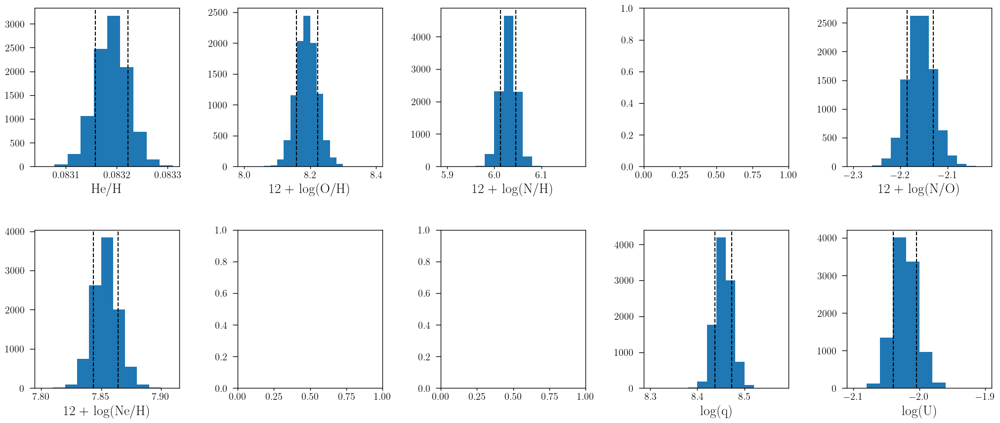

In [22]:
texPlot('on')
fig, axs = plt.subplots(2, 5)
fig.set_size_inches((25, 10))
fig.subplots_adjust(wspace=0.4, hspace=0.4)

axs[0, 0].hist(y)
axs[0, 0].axvline(np.nanpercentile(y, 16), ls='--')
axs[0, 0].axvline(np.nanpercentile(y, 84), ls='--')
axs[0, 0].set_xlabel('He/H')
axs[0, 1].hist(log_OH_tot, bins=np.arange(8, 8.4, 0.02))
axs[0, 1].axvline(np.nanpercentile(log_OH_tot, 16), ls='--')
axs[0, 1].axvline(np.nanpercentile(log_OH_tot, 84), ls='--')
axs[0, 1].set_xlabel('12 + log(O/H)')
axs[0, 2].hist(log_NH_tot, bins=np.arange(5.9, 6.2, 0.02))
axs[0, 2].axvline(np.nanpercentile(log_NH_tot, 16), ls='--')
axs[0, 2].axvline(np.nanpercentile(log_NH_tot, 84), ls='--')
axs[0, 2].set_xlabel('12 + log(N/H)')
#axs[0, 3].hist(log_SH_tot)
#axs[0, 3].set_xlabel('12 + log(S/H)')
axs[0, 4].hist(log_NO_tot, bins=np.arange(-2.3, -2, 0.02))
axs[0, 4].axvline(np.nanpercentile(log_NO_tot, 16), ls='--')
axs[0, 4].axvline(np.nanpercentile(log_NO_tot, 84), ls='--')
axs[0, 4].set_xlabel('12 + log(N/O)')

axs[1, 0].hist(log_NeH_tot, bins=np.arange(7.8, 7.91, 0.01))
axs[1, 0].axvline(np.nanpercentile(log_NeH_tot, 16), ls='--')
axs[1, 0].axvline(np.nanpercentile(log_NeH_tot, 84), ls='--')
axs[1, 0].set_xlabel('12 + log(Ne/H)')
#axs[1, 1].hist(log_ArH_tot)
#axs[1, 1].set_xlabel('12 + log(Ar/H)')
#axs[1, 2].hist(log_FeH_tot)
#axs[1, 2].set_xlabel('12 + log(Fe/H)')
axs[1, 3].hist(q, bins=np.arange(8.3, 8.6, 0.02))
axs[1, 3].axvline(np.nanpercentile(q, 16), ls='--')
axs[1, 3].axvline(np.nanpercentile(q, 84), ls='--')
axs[1, 3].set_xlabel('log(q)')
axs[1, 4].hist(U, bins=np.arange(-2.1, -1.9, 0.02))
axs[1, 4].axvline(np.nanpercentile(U, 16), ls='--')
axs[1, 4].axvline(np.nanpercentile(U, 84), ls='--')
axs[1, 4].set_xlabel('log(U)')

In [23]:
abundance_dict = {'galname': galname,
                  'He/H': np.nanpercentile(y, 50),
                  'He/H_16': np.nanpercentile(y, 16),
                  'He/H_84': np.nanpercentile(y, 84),
                  'log_OH': np.nanpercentile(log_OH_tot, 50),
                  'log_OH_16': np.nanpercentile(log_OH_tot, 16),
                  'log_OH_84': np.nanpercentile(log_OH_tot, 84),
                  'log_SH': None,
                  'log_SH_16': None,
                  'log_SH_84': None,
                  'log_NH': np.nanpercentile(log_NH_tot, 50),
                  'log_NH_16': np.nanpercentile(log_NH_tot, 16),
                  'log_NH_84': np.nanpercentile(log_NH_tot, 84),
                  'log_NO': np.nanpercentile(log_NO_tot, 50),
                  'log_NO_16': np.nanpercentile(log_NO_tot, 16),
                  'log_NO_84': np.nanpercentile(log_NO_tot, 84),
                  'log_NeH': np.nanpercentile(log_NeH_tot, 50),
                  'log_NeH_16': np.nanpercentile(log_NeH_tot, 16),
                  'log_NeH_84': np.nanpercentile(log_NeH_tot, 84),
                  'log_ArH': None,
                  'log_ArH_16': None,
                  'log_ArH_84': None,
                  'log_FeH': None,
                  'log_FeH_16': None,
                  'log_FeH_84': None,
                  'log_q': np.nanpercentile(q, 50),
                  'log_q_16': np.nanpercentile(q, 16),
                  'log_q_84': np.nanpercentile(q, 84),
                  'log_U': np.nanpercentile(U, 50),
                  'log_U_16': np.nanpercentile(U, 16),
                  'log_U_84': np.nanpercentile(U, 84)
}
abundance_dict_pd = pd.DataFrame(data=abundance_dict, index=[0])
save_catalog(galname, abundance_dict_pd, magePath + '/results/metals/abundance_measured_final.csv')

Existent catalog (.csv) file.
Existent data for J1146, overwriting...
Done.


In [24]:
abundance_dict = {'galname': galname,
                  'log_OH_G92': np.nanpercentile(log_OH_G92, 50),
                  'log_OH_G92_16': np.nanpercentile(log_OH_G92, 16),
                  'log_OH_G92_84': np.nanpercentile(log_OH_G92, 84),
                  'log_OH_tw': np.nanpercentile(log_OH_tw, 50),
                  'log_OH_tw_16': np.nanpercentile(log_OH_tw, 16),
                  'log_OH_tw_84': np.nanpercentile(log_OH_tw, 84)
}
abundance_dict_pd = pd.DataFrame(data=abundance_dict, index=[0])
save_catalog(galname, abundance_dict_pd, magePath + '/results/metals/abundance_estimated_final.csv')

Existent catalog (.csv) file.
Non existent data for J1146, adding new data...
Done.


# -----------------------------------------------------------------------------------

# Attenuation test

In [5]:
# Reading the chains
chains = pd.read_csv('/home/benjamin/Documents/chains/chains_J1146.csv')

In [6]:
# High ionization temperature T[OIII]
T_OIII_up = TO3(chains['[OIII]5007'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OIII]5007'])),
                chains['[OIII]4959'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OIII]4959'])),
                chains['[OIII]4363'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OIII]4363'])))
O2plus_H_up = 10**(double_log_OH(chains['[OIII]5007'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OIII]5007'])),
                                 chains['[OIII]4959'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OIII]4959'])),
                                 chains['Hb'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['Hb'])),
                                 T_OIII_up) - 12)


# High ionization temperature T[OIII]
T_OIII_dn = TO3(chains['[OIII]5007'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OIII]5007'])),
                chains['[OIII]4959'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OIII]4959'])),
                chains['[OIII]4363'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OIII]4363'])))
O2plus_H_dn = 10**(double_log_OH(chains['[OIII]5007'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OIII]5007'])),
                                 chains['[OIII]4959'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OIII]4959'])),
                                 chains['Hb'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['Hb'])),
                                 T_OIII_dn) - 12)

(array([   7.,  138.,  684., 2011., 3005., 2625., 1143.,  328.,   55.,
           4.]),
 array([1.5282132 , 1.53476919, 1.54132518, 1.54788117, 1.55443716,
        1.56099315, 1.56754914, 1.57410513, 1.58066112, 1.58721711,
        1.5937731 ]),
 <BarContainer object of 10 artists>)

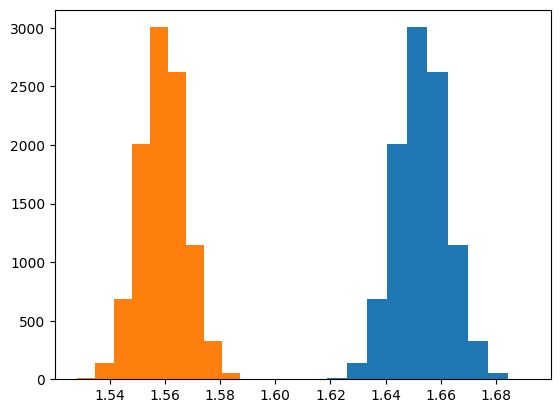

In [7]:
plt.hist(T_OIII_up)
plt.hist(T_OIII_dn)

In [8]:
# Density n([SII])
el_density_up = ne(chains['[SII]6730'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[SII]6730'])),
                   chains['[SII]6716'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[SII]6716'])),
                   T_OIII_up)

el_density_dn = ne(chains['[SII]6730'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[SII]6730'])),
                   chains['[SII]6716'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[SII]6716'])),
                   T_OIII_dn)

(array([  41.,  332., 1239., 2711., 2979., 1837.,  676.,  163.,   19.,
           3.]),
 array([-16.26444484,   6.75638561,  29.77721607,  52.79804652,
         75.81887697,  98.83970743, 121.86053788, 144.88136833,
        167.90219879, 190.92302924, 213.94385969]),
 <BarContainer object of 10 artists>)

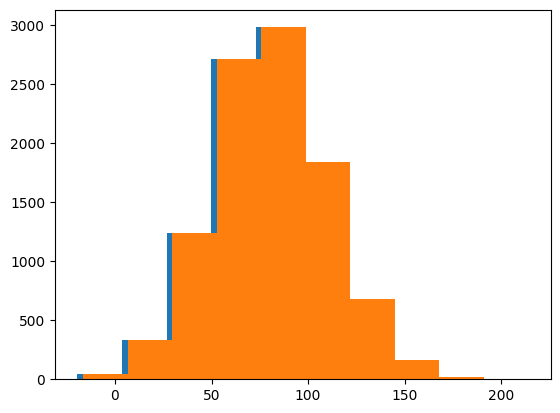

In [9]:
plt.hist(el_density_up)
plt.hist(el_density_dn)

In [10]:
# Low ionization temperature T[OII]
IO2_R_up = 9.36 * (T_OIII_up**0.44) * O2plus_H_up * chains['Hb'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['Hb']))
IO2_R_dn = 9.36 * (T_OIII_dn**0.44) * O2plus_H_dn * chains['Hb'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['Hb']))



T_OII_up = TO2(chains['[OII]7330'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OII]7330'])),
               chains['[OII]7319'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OII]7319'])),
               chains['[OII]3726'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OII]3726'])),
               chains['[OII]3729'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OII]3729'])),
               el_density_up, IO2_R_up)

T_OII_dn = TO2(chains['[OII]7330'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OII]7330'])),
               chains['[OII]7319'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OII]7319'])),
               chains['[OII]3726'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OII]3726'])),
               chains['[OII]3729'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OII]3729'])),
               el_density_dn, IO2_R_dn)

(array([2.210e+02, 9.777e+03, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([0.44942188, 0.89979025, 1.35015862, 1.800527  , 2.25089537,
        2.70126374, 3.15163211, 3.60200049, 4.05236886, 4.50273723,
        4.9531056 ]),
 <BarContainer object of 10 artists>)

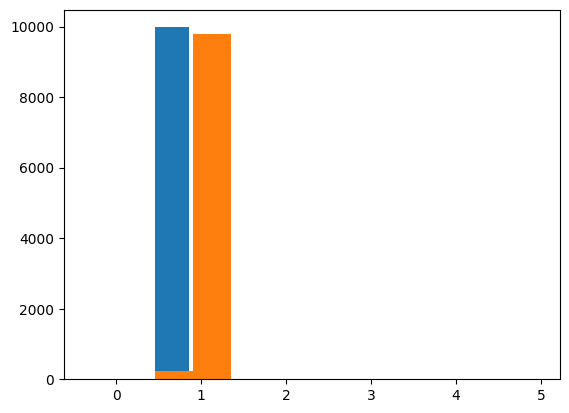

In [18]:
plt.hist(T_OII_up)
plt.hist(T_OII_dn)

In [12]:
# HELIUM

tau_4471_up = 0.921 * (E_BV + E_BV_err) * k_cal(wave_cat['HeI4471'])
tau_5875_up = 0.921 * (E_BV + E_BV_err) * k_cal(wave_cat['HeI5875'])
tau_6678_up = 0.921 * (E_BV + E_BV_err) * k_cal(wave_cat['HeI6678'])
tau_7065_up = 0.921 * (E_BV + E_BV_err) * k_cal(wave_cat['HeI7065'])

tau_4471_dn = 0.921 * (E_BV - E_BV_err) * k_cal(wave_cat['HeI4471'])
tau_5875_dn = 0.921 * (E_BV - E_BV_err) * k_cal(wave_cat['HeI5875'])
tau_6678_dn = 0.921 * (E_BV - E_BV_err) * k_cal(wave_cat['HeI6678'])
tau_7065_dn = 0.921 * (E_BV - E_BV_err) * k_cal(wave_cat['HeI7065'])

f_4471_up = optical_depth_function(T_OIII_up, el_density_up, tau_4471_up, line='4471')
f_5875_up = optical_depth_function(T_OIII_up, el_density_up, tau_5875_up, line='5875')
f_6678_up = optical_depth_function(T_OIII_up, el_density_up, tau_6678_up, line='6678')
f_7065_up = optical_depth_function(T_OIII_up, el_density_up, tau_7065_up, line='7065')

f_4471_dn = optical_depth_function(T_OIII_dn, el_density_dn, tau_4471_dn, line='4471')
f_5875_dn = optical_depth_function(T_OIII_dn, el_density_dn, tau_5875_dn, line='5875')
f_6678_dn = optical_depth_function(T_OIII_dn, el_density_dn, tau_6678_dn, line='6678')
f_7065_dn = optical_depth_function(T_OIII_dn, el_density_dn, tau_7065_dn, line='7065')

F4471_up, F5875_up, F6678_up, F7065_up = emissivities(T_OIII_up, el_density_up)
F4471_dn, F5875_dn, F6678_dn, F7065_dn = emissivities(T_OIII_dn, el_density_dn)

y_plus_F4471_up = yplus(chains['HeI4471'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['HeI4471'])), chains['Hb'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['Hb'])), F4471_up, f_4471_up)
y_plus_F5875_up = yplus(chains['HeI5875'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['HeI5875'])), chains['Hb'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['Hb'])), F5875_up, f_5875_up)
y_plus_F6678_up = yplus(chains['HeI6678'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['HeI6678'])), chains['Hb'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['Hb'])), F6678_up, f_6678_up)
y_plus_F7065_up = yplus(chains['HeI7065'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['HeI7065'])), chains['Hb'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['Hb'])), F7065_up, f_7065_up)

y_plus_F4471_dn = yplus(chains['HeI4471'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['HeI4471'])), chains['Hb'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['Hb'])), F4471_dn, f_4471_dn)
y_plus_F5875_dn = yplus(chains['HeI5875'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['HeI5875'])), chains['Hb'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['Hb'])), F5875_dn, f_5875_dn)
y_plus_F6678_dn = yplus(chains['HeI6678'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['HeI6678'])), chains['Hb'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['Hb'])), F6678_dn, f_6678_dn)
y_plus_F7065_dn = yplus(chains['HeI7065'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['HeI7065'])), chains['Hb'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['Hb'])), F7065_dn, f_7065_dn)

y_plus_up = np.mean(np.array([y_plus_F4471_up, y_plus_F5875_up,
                              y_plus_F6678_up, y_plus_F7065_up]))

y_plus_dn = np.mean(np.array([y_plus_F4471_dn, y_plus_F5875_dn,
                              y_plus_F6678_dn, y_plus_F7065_dn]))

In [13]:
y2_plus_up = y2plus(chains['HeII4686'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['HeII4685'])),
                    chains['Hb'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['Hb'])),
                    T_OIII_up)
y_up = y_plus_up + y2_plus_up

y2_plus_dn = y2plus(chains['HeII4686'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['HeII4685'])),
                    chains['Hb'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['Hb'])),
                    T_OIII_dn)
y_dn = y_plus_dn + y2_plus_dn

In [14]:
# OXYGEN MEASURED

log_Oplus_H_up = single_log_OH(chains['[OII]3729'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OII]3729'])),
                               chains['[OII]3726'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OII]3726'])),
                               chains['Hb'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['Hb'])),
                               T_OII_up, el_density_up)

log_O2plus_H_up = double_log_OH(chains['[OIII]5007'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OIII]5007'])),
                                chains['[OIII]4959'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['[OIII]4959'])),
                                chains['Hb'] * 10**(0.4 * E_BV_err * k_cal(wave_cat['Hb'])),
                                T_OIII_up)

log_Oplus_H_dn = single_log_OH(chains['[OII]3729'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OII]3729'])),
                               chains['[OII]3726'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OII]3726'])),
                               chains['Hb'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['Hb'])),
                               T_OII_dn, el_density_dn)

log_O2plus_H_dn = double_log_OH(chains['[OIII]5007'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OIII]5007'])),
                                chains['[OIII]4959'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['[OIII]4959'])),
                                chains['Hb'] * 10**(0.4 * -E_BV_err * k_cal(wave_cat['Hb'])),
                                T_OIII_dn)

O2plus_H_up = 10**(log_O2plus_H_up - 12)
Oplus_H_up = 10**(log_Oplus_H_up - 12)

O2plus_H_dn = 10**(log_O2plus_H_dn - 12)
Oplus_H_dn = 10**(log_Oplus_H_dn - 12)

ICF_Oxygen_up = 1 + (y2_plus_up / y_plus_up)
ICF_Oxygen_dn = 1 + (y2_plus_dn / y_plus_dn)

O_H_up = (O2plus_H_up + Oplus_H_up) * ICF_Oxygen_up
log_OH_up = upy.log10(O_H_up) + 12

O_H_dn = (O2plus_H_dn + Oplus_H_dn) * ICF_Oxygen_dn
log_OH_dn = upy.log10(O_H_dn) + 12

/home/benjamin/anaconda3/envs/analogs/lib/python3.9/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


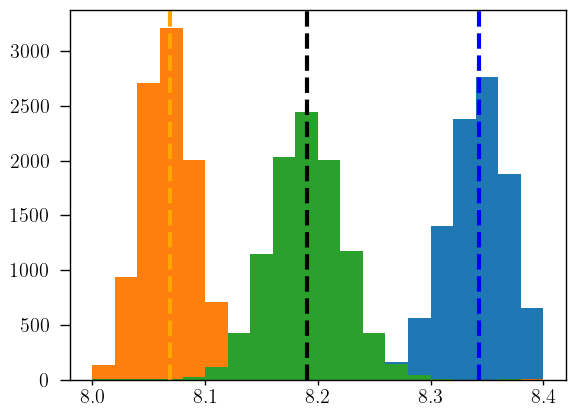

In [35]:
plt.hist(log_OH_up, bins=np.arange(8, 8.4, 0.02))
plt.axvline(np.median(log_OH_up), ls='--', lw=3, color='blue')
plt.hist(log_OH_dn, bins=np.arange(8, 8.4, 0.02))
plt.axvline(np.mean(log_OH_dn), ls='--', lw=3, color='orange')
plt.hist(log_OH_tot, bins=np.arange(8, 8.4, 0.02))
plt.axvline(np.median(log_OH_tot), ls='--', lw=3, color='black')

In [36]:
np.median(log_OH_tot) - np.mean(log_OH_dn)

0.1214355559832292

In [37]:
np.median(log_OH_up) - np.median(log_OH_tot)

0.15275524181118527

# -----------------------------------------------------------------------------------------------------------

# [OIII]4959

In [4]:
m = arc_slope19a
n = arc_intercept19a

sigma_arc_4959 = (m * wave_cat['[OIII]4959']*(1 + z_BN[igal])) + n

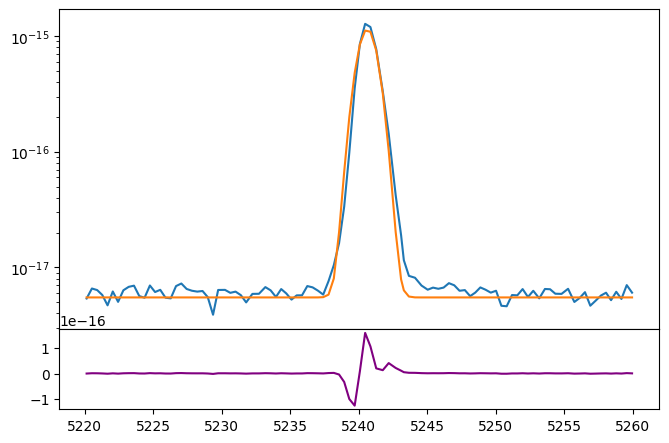

In [8]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_4959.wavelength, oiii_4959.flux)
bkg = 5.5e-18

oiiib_tot = gaussian(oiii_4959.wavelength, 200e-17, wave_cat['[OIII]4959'], z=z_BN[igal]+0.00001, sigma=0.7)

ax.plot(oiii_4959.wavelength, bkg + oiiib_tot)
ax1.plot(oiii_4959.wavelength, oiii_4959.flux - bkg - oiiib_tot, color='purple')
ax.set_yscale('log')

In [8]:
params_oiii_4959 = Parameters()
params_oiii_4959.add('z_nar', value=z_BN[igal]+0.00001)
params_oiii_4959.add('z_brd', value=z_BN[igal]+0.0001)
params_oiii_4959.add('sigma_nar', value=0.5, min=0.)
params_oiii_4959.add('sigma_brd', value=0.8, min=0.)
params_oiii_4959.add('Oiiib_nar', value=100e-17, min=0.)
params_oiii_4959.add('Oiiib_brd', value=70e-17, min=0.)
params_oiii_4959.add('bkg', value=0.55e-17, min=0.)


def residual_oiii_4959(params_oiii_4959, x, data, uncertainty):
    
    z_nar = params_oiii_4959['z_nar']
    z_brd = params_oiii_4959['z_brd']
    sigma_nar = params_oiii_4959['sigma_nar']
    sigma_brd = params_oiii_4959['sigma_brd']
    oiiib_nar = params_oiii_4959['Oiiib_nar']
    oiiib_brd = params_oiii_4959['Oiiib_brd']
    bkg = params_oiii_4959['bkg']
    
    x = oiii_4959.wavelength
    model = gaussian(x, oiiib_nar, wave_cat['[OIII]4959'], z_nar, sigma_nar) \
          + gaussian(x, oiiib_brd, wave_cat['[OIII]4959'], z_brd, sigma_brd)
    
    return (model + bkg - oiii_4959.flux) / oiii_4959.noise

In [10]:
np.random.seed(1146)
out_oiii_4959 = minimize(residual_oiii_4959, params_oiii_4959, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|██████████████████████████████████████| 2500/2500 [00:18<00:00, 137.31it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 7 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [126.92677352  52.25241455 109.39889432  85.65926721 111.23431592
 162.10269096 163.91239799]


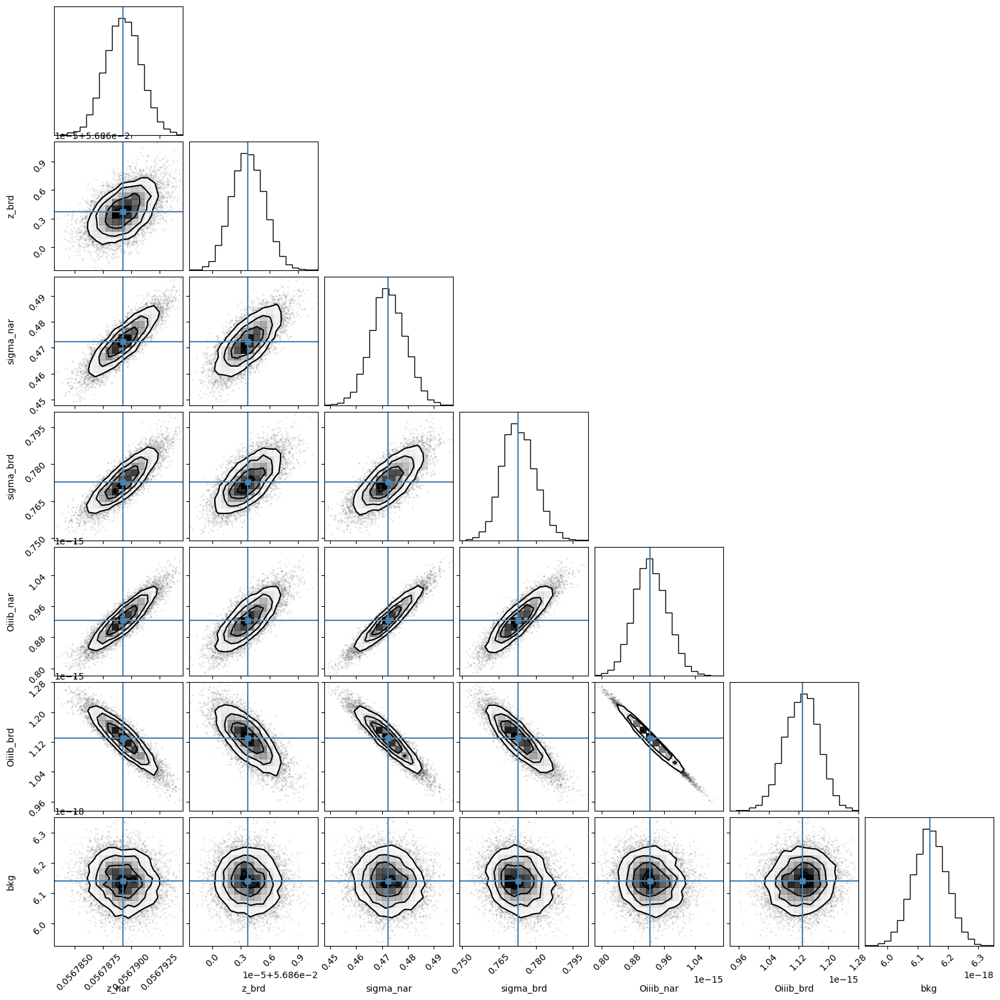

In [12]:
corner.corner(out_oiii_4959.flatchain, labels=out_oiii_4959.var_names,
             truths=list(out_oiii_4959.params.valuesdict().values()));
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [11]:
out_oiii_4959.params

name,value,standard error,relative error,initial value,min,max,vary
z_nar,0.05678927,1.5718e-06,(0.00%),0.056810000000000006,-inf,inf,True
z_brd,0.05686374,1.7336e-06,(0.00%),0.056900000000000006,-inf,inf,True
sigma_nar,0.47224474,0.00663648,(1.41%),0.5,0.00000000,inf,True
sigma_brd,0.77265677,0.00674764,(0.87%),0.8,0.00000000,inf,True
Oiiib_nar,9.2409e-16,4.3123e-17,(4.67%),1e-15,0.00000000,inf,True
Oiiib_brd,1.1295e-15,4.6478e-17,(4.11%),7e-16,0.00000000,inf,True
bkg,6.1404e-18,5.6696e-20,(0.92%),5.5e-18,0.00000000,inf,True


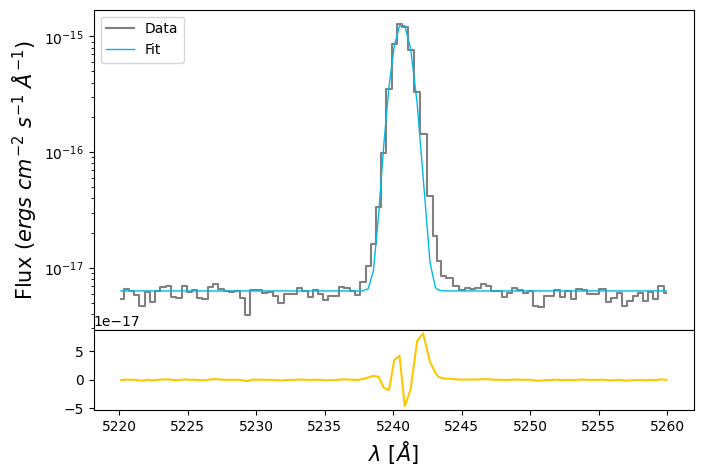

In [13]:
oiiib_tot_flux = out_oiii_4959.flatchain.Oiiib_tot.mean()
oiiib_tot_std = out_oiii_4959.flatchain.Oiiib_tot.std()

bkg_oiii_4959 = out_oiii_4959.flatchain.bkg.mean()
bkg_oiii_4959_std = out_oiii_4959.flatchain.bkg.std()

z_tot_oiii_4959 = out_oiii_4959.flatchain.z_tot.mean()
z_tot_oiii_4959_std = out_oiii_4959.flatchain.z_tot.std()

sigma_tot_oiii_4959 = out_oiii_4959.flatchain.sigma_tot.mean()
sigma_tot_oiii_4959_std = out_oiii_4959.flatchain.sigma_tot.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4959.wavelength, oiii_4959.flux,
            color='gray', label='Data', where='mid')

oiiib = gaussian(oiii_4959.wavelength, oiiib_tot_flux, wave_cat['[OIII]4959'], z_tot_oiii_4959, sigma_tot_oiii_4959)

ax.plot(oiii_4959.wavelength, bkg_oiii_4959 + oiiib,
        lw=1, color=c[0], label='Fit')
ax1.plot(oiii_4959.wavelength, oiii_4959.flux - bkg_oiii_4959 - oiiib,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [14]:
# Correcting sigma by instrumental broadening

# Intrinsic from the galaxy
sigma_intrinsic = upy.sqrt((ufloat(sigma_tot_oiii_4959, sigma_tot_oiii_4959_std)**2) - (sigma_4959**2))

In [15]:
# EW
EW_OIII_4959 = ufloat(oiiib_tot_flux, oiiib_tot_std) / ufloat(bkg_oiii_4959, bkg_oiii_4959_std)

# FWHM
FWHM_4959 = FWHM(sigma_intrinsic,  wave_cat['[OIII]4959']*(1 + ufloat(z_tot_oiii_4959, z_tot_oiii_4959_std)))

# velocity shift
dV_4959 = 0

In [16]:
print('Redshift of the narrow component: {:.4f}'.format(ufloat(z_tot_oiii_4959, z_tot_oiii_4959_std)))

Redshift of the narrow component: 0.0568+/-0.0000


In [17]:
# Velocities
vel = {'galname': galname,
       'z_nar': z_tot_oiii_4959,
       'dV': None,
       'dV_err': None,
       'FWHM_nar': FWHM_4959.nominal_value,
       'FWHM_nar_err': FWHM_4959.std_dev,
       'FWHM_brd': None,
       'FWHM_brd_err': None
}

vel_catalog_pd = pd.DataFrame(data=vel, index=[0])
save_catalog(galname, vel_catalog_pd, magePath + '/results/vel_catalog.csv')

Existent catalog (.csv) file.
Existent data for J1146, overwriting...
Done.


---

# [NII]6548 + H$\alpha$ + [NII]6584

In [18]:
sigma_arc_ha = (m * wave_cat['Ha']*(1 + z_BN[igal])) + n

sigma_ha = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_ha**2))

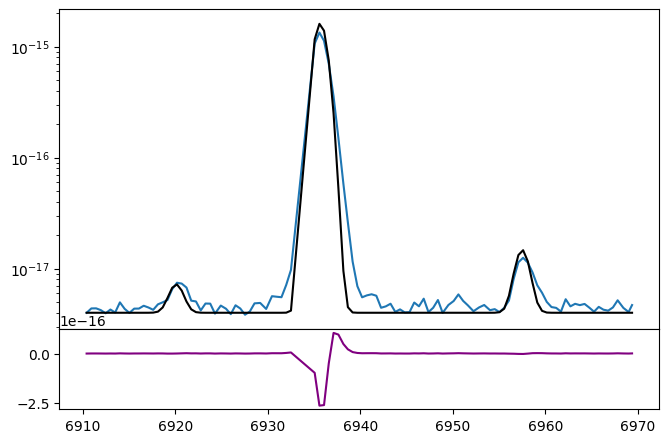

In [19]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(ha_nii.wavelength, ha_nii.flux)
bkg = 4e-18

ha_tot = gaussian(ha_nii.wavelength, 3e-15, wave_cat['Ha'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_ha))
niib_tot = gaussian(ha_nii.wavelength, 0.6e-17, wave_cat['[NII]6548'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_ha))
niia_tot = gaussian(ha_nii.wavelength, 2e-17, wave_cat['[NII]6584'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_ha))

ax.plot(ha_nii.wavelength, bkg + niib_tot + ha_tot + niia_tot, color='black')
ax1.plot(ha_nii.wavelength, ha_nii.flux - bkg - niib_tot - ha_tot - niia_tot, color='purple')
ax.set_yscale('log')

In [20]:
params_ha_nii = Parameters()
params_ha_nii.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_ha_nii.add('sigma_tot', value=upy.nominal_values(sigma_ha), vary=False)
params_ha_nii.add('Ha_tot', value=1.5e-15, min=0.)
params_ha_nii.add('Niia_tot', value=0.5e-17, min=0.)
params_ha_nii.add('Niib_to_niia', value=1/3, min=0., max=1.)
params_ha_nii.add('bkg', value=4.0e-18, vary=True)


def residual_ha_nii(params_ha_nii, x, data, uncertainty):
    
    z_tot = params_ha_nii['z_tot']
    sigma_tot = params_ha_nii['sigma_tot']
    ha_tot = params_ha_nii['Ha_tot']
    niia_tot = params_ha_nii['Niia_tot']
    niib_tot = params_ha_nii['Niia_tot']*params_ha_nii['Niib_to_niia']
    bkg = params_ha_nii['bkg']
    
    x = ha_nii.wavelength
    
    model_ha = gaussian(x, ha_tot, wave_cat['Ha'], z_tot, sigma_tot)
    model_niia = gaussian(x, niia_tot, wave_cat['[NII]6584'], z_tot, sigma_tot)
    model_niib = gaussian(x, niib_tot, wave_cat['[NII]6548'], z_tot, sigma_tot)
    model = model_niib + model_ha + model_niia
    
    return (model + bkg - ha_nii.flux) / ha_nii.noise

In [21]:
np.random.seed(1146)
out_ha_nii = minimize(residual_ha_nii, params_ha_nii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:45<00:00, 54.86it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 35.5635044   82.80485014 170.89620758  80.23285282 100.70969911]


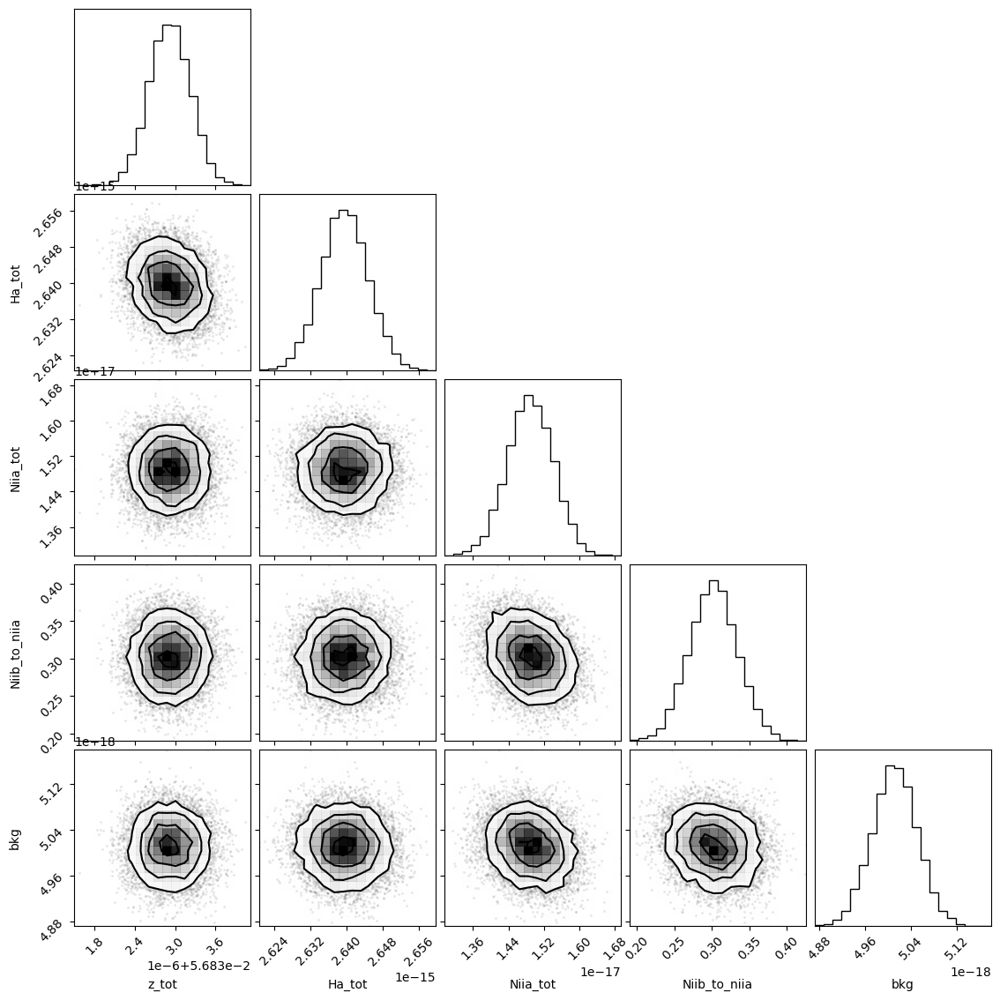

In [22]:
corner.corner(out_ha_nii.flatchain, labels=out_ha_nii.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [23]:
out_ha_nii.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05683292,3.0735e-07,(0.00%),0.05681744694523519,-inf,inf,True
sigma_tot,0.74267407,,,0.7426740738514153,-inf,inf,False
Ha_tot,2.6395e-15,5.2201e-18,(0.20%),1.5e-15,0.00000000,inf,True
Niia_tot,1.4891e-17,5.1485e-19,(3.46%),5e-18,0.00000000,inf,True
Niib_to_niia,0.30246969,0.03214247,(10.63%),0.3333333333333333,0.00000000,1.00000000,True
bkg,5.0116e-18,3.9186e-20,(0.78%),4e-18,-inf,inf,True


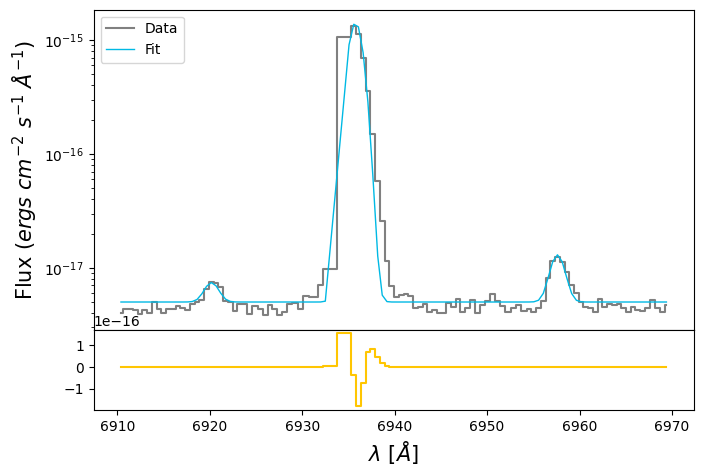

In [24]:
ha_tot_flux = out_ha_nii.flatchain.Ha_tot.mean()
ha_tot_std = out_ha_nii.flatchain.Ha_tot.std()

niia_tot_flux = out_ha_nii.flatchain.Niia_tot.mean()
niia_tot_std = out_ha_nii.flatchain.Niia_tot.std()

niib_tot_flux = (niia_tot_flux * out_ha_nii.flatchain.Niib_to_niia).mean()
niib_tot_std = (niia_tot_flux * out_ha_nii.flatchain.Niib_to_niia).std()

z_ha_nii = out_ha_nii.flatchain.z_tot.mean()
z_ha_nii_std = out_ha_nii.flatchain.z_tot.std()

bkg_ha_nii = out_ha_nii.flatchain.bkg.mean()
bkg_ha_nii_std = out_ha_nii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(ha_nii.wavelength, ha_nii.flux,
            color='gray', label='Data', where='mid')

ha = gaussian(ha_nii.wavelength, ha_tot_flux, wave_cat['Ha'], z_ha_nii, upy.nominal_values(sigma_ha))
niia = gaussian(ha_nii.wavelength, niia_tot_flux, wave_cat['[NII]6584'], z_ha_nii, upy.nominal_values(sigma_ha))
niib = gaussian(ha_nii.wavelength, niib_tot_flux, wave_cat['[NII]6548'], z_ha_nii, upy.nominal_values(sigma_ha))

ax.plot(ha_nii.wavelength, bkg_ha_nii + niia + ha + niib,
        lw=1, color=c[0], label='Fit')

ax1.step(ha_nii.wavelength, ha_nii.flux - bkg_ha_nii - niia - ha - niib,
         color=c[3], where='mid')
#ax1.set_ylim(-5*bkg_ha_nii, 5*bkg_ha_nii)
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
#ax.text(x=7008, y=1.5e-13, s=r'[NII]$\lambda$6548 + H$\alpha$ + [NII]$\lambda$6584',
#       fontsize=15)
ax.legend(loc='upper left')

In [25]:
# EW
EW_Ha = ufloat(ha_tot_flux, ha_tot_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6584 = ufloat(niia_tot_flux, niia_tot_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)
EW_NII_6548 = ufloat(niib_tot_flux, niib_tot_std) / ufloat(bkg_ha_nii, bkg_ha_nii_std)

# [OII]7319 + [OII]7330

In [26]:
sigma_arc_7330 = (m * wave_cat['[OII]7330']*(1 + z_BN[igal])) + n

sigma_7330 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_7330**2))

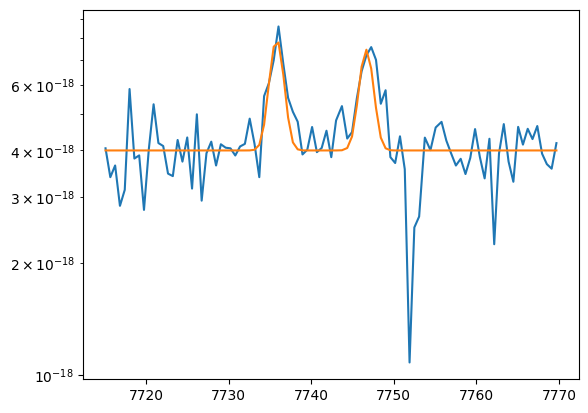

In [27]:
# Search for good initial guess

plt.plot(oii_7320.wavelength, oii_7320.flux)

oiia_tot = gaussian(oii_7320.wavelength, 7e-18, wave_cat['[OII]7330'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_7330))
oiib_tot = gaussian(oii_7320.wavelength, 8e-18, wave_cat['[OII]7319'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_7330))
bkg = 4e-18

plt.plot(oii_7320.wavelength, bkg + oiib_tot + oiia_tot)

plt.yscale('log')

In [28]:
params_oii_7320 = Parameters()

params_oii_7320.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_oii_7320.add('sigma_tot', value=upy.nominal_values(sigma_7330), vary=False)
params_oii_7320.add('Oiia_tot', value=7.0e-18, min=0.)
params_oii_7320.add('Oiib_tot', value=8.0e-18, min=0.)
params_oii_7320.add('bkg', value=4e-18, min=0.)

def residual_oii_7320(params_oii_7320, x, data, uncertainty):
    
    z_tot = params_oii_7320['z_tot']
    sigma_tot = params_oii_7320['sigma_tot']
    oiia_tot_flux = params_oii_7320['Oiia_tot']
    oiib_tot_flux = params_oii_7320['Oiib_tot']
    bkg = params_oii_7320['bkg']
    
    x = oii_7320.wavelength
    model_oiia = gaussian(x, oiia_tot_flux, wave_cat['[OII]7330'], z_tot, sigma_tot)
    model_oiib = gaussian(x, oiib_tot_flux, wave_cat['[OII]7319'], z_tot, sigma_tot)
    model = model_oiia + model_oiib
    return (model + bkg - oii_7320.flux) / oii_7320.noise

In [29]:
np.random.seed(1146)
out_oii_7320 = minimize(residual_oii_7320, params_oii_7320, args=(1, 1, 1),
                         method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:40<00:00, 61.86it/s]


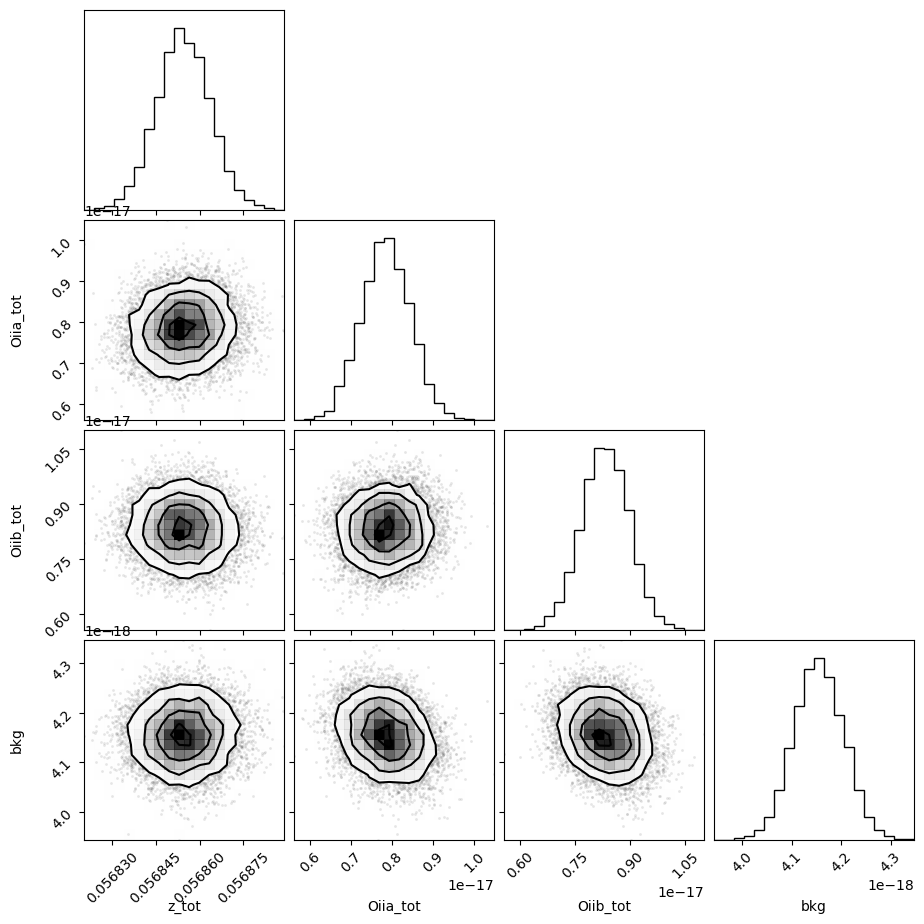

In [30]:
corner.corner(out_oii_7320.flatchain, labels=out_oii_7320.var_names);

In [31]:
out_oii_7320.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05685438,9.2151e-06,(0.02%),0.05681744694523519,-inf,inf,True
sigma_tot,0.81054831,,,0.810548305054763,-inf,inf,False
Oiia_tot,7.8504e-18,5.9514e-19,(7.58%),7e-18,0.00000000,inf,True
Oiib_tot,8.3231e-18,6.3539e-19,(7.63%),8e-18,0.00000000,inf,True
bkg,4.1550e-18,5.0506e-20,(1.22%),4e-18,0.00000000,inf,True


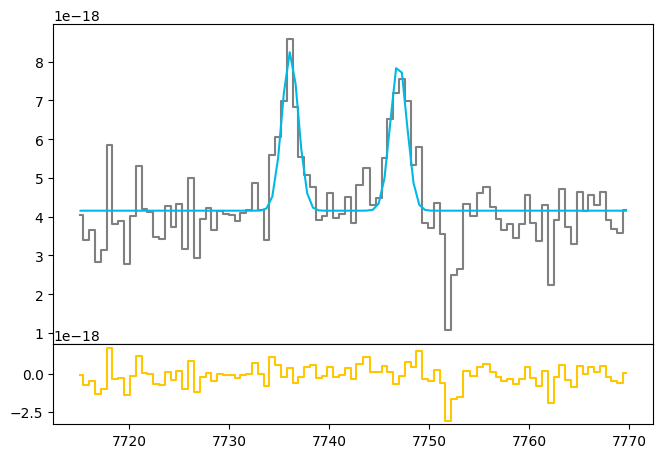

In [32]:
oiia_tot_flux = out_oii_7320.flatchain.Oiia_tot.mean()
oiia_tot_std = out_oii_7320.flatchain.Oiia_tot.std()

oiib_tot_flux = out_oii_7320.flatchain.Oiib_tot.mean()
oiib_tot_std = out_oii_7320.flatchain.Oiib_tot.std()

z_oii_7320 = out_oii_7320.flatchain.z_tot.mean()
z_oii_7320_std = out_oii_7320.flatchain.z_tot.std()

bkg_oii_7320 = out_oii_7320.flatchain.bkg.mean()
bkg_oii_7320_std = out_oii_7320.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_7320.wavelength, oii_7320.flux, color='gray', label='Data', where='mid')

oiia = gaussian(oii_7320.wavelength, oiia_tot_flux, wave_cat['[OII]7330'], z_oii_7320, upy.nominal_values(sigma_7330))
oiib = gaussian(oii_7320.wavelength, oiib_tot_flux, wave_cat['[OII]7319'], z_oii_7320, upy.nominal_values(sigma_7330))

ax.plot(oii_7320.wavelength, bkg_oii_7320 + oiia + oiib, color=c[0])
#plt.yscale('log')
ax1.step(oii_7320.wavelength, oii_7320.flux - bkg_oii_7320 - oiia - oiib, color=c[3], where='mid')

In [33]:
# EW
EW_OII_7330 = ufloat(oiia_tot_flux, oiia_tot_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)
EW_OII_7319 = ufloat(oiib_tot_flux, oiib_tot_std) / ufloat(bkg_oii_7320, bkg_oii_7320_std)

# HeI 7065

In [34]:
sigma_arc_7065 = (m * wave_cat['HeI7065']*(1 + z_BN[igal])) + n

sigma_7065 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_7065**2))

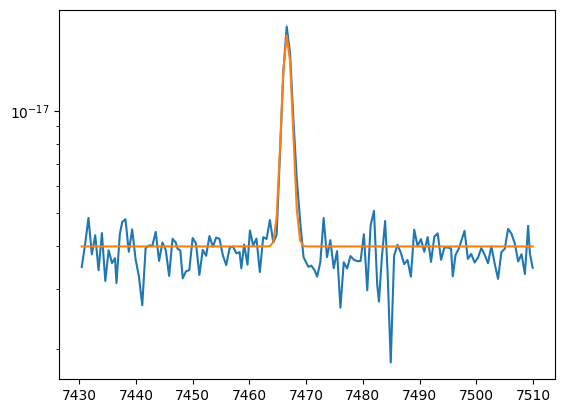

In [35]:
plt.plot(hei_7065.wavelength, hei_7065.flux)
bkg = 4e-18

hei7065_tot = gaussian(hei_7065.wavelength, 2.5e-17, wave_cat['HeI7065'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_7065))

plt.plot(hei_7065.wavelength, hei7065_tot + bkg)
plt.yscale('log')

In [36]:
params_7065 = Parameters()
params_7065.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_7065.add('sigma_hei7065_tot', value=upy.nominal_values(sigma_7065), vary=False)
params_7065.add('Hei7065_tot', value=2.5e-17, min=0.)
params_7065.add('bkg', value=4e-18, min=0.)

def residual_hei7065(params_7065, x, data, uncertainty):
    
    z_tot = params_7065['z_tot']
    sigma_hei7065_tot = params_7065['sigma_hei7065_tot']
    hei7065_tot_flux = params_7065['Hei7065_tot']
    bkg = params_7065['bkg']
    
    x = hei_7065.wavelength
    model = gaussian(x, hei7065_tot_flux, wave_cat['HeI7065'], z_tot, sigma_hei7065_tot)
    return (model + bkg - hei_7065.flux) / hei_7065.noise

In [37]:
np.random.seed(1146)
out_hei7065 = minimize(residual_hei7065, params_7065, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:30<00:00, 81.04it/s]


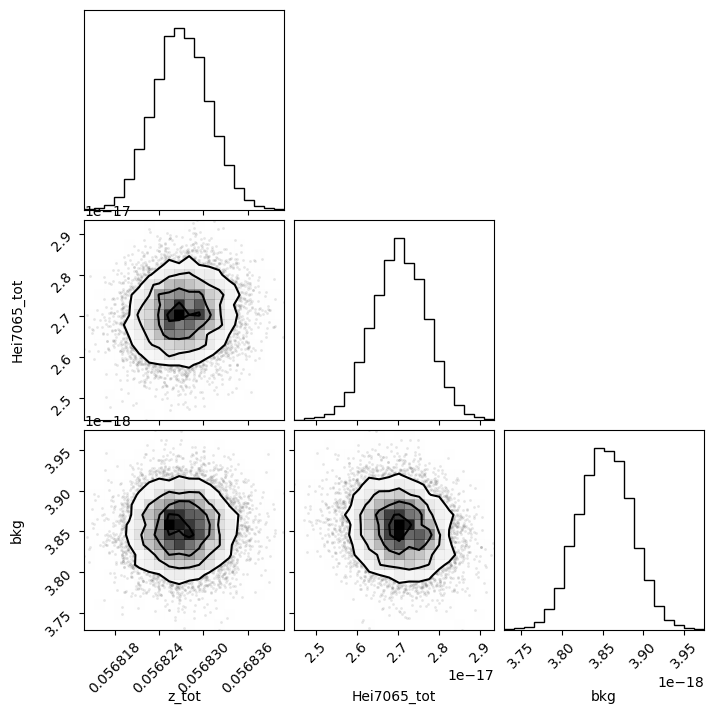

In [38]:
corner.corner(out_hei7065.flatchain, labels=out_hei7065.var_names);

In [39]:
out_hei7065.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05682704,3.7527e-06,(0.01%),0.05681744694523519,-inf,inf,True
sigma_hei7065_tot,0.78698282,,,0.7869828150143192,-inf,inf,False
Hei7065_tot,2.7059e-17,6.5403e-19,(2.42%),2.5e-17,0.00000000,inf,True
bkg,3.8530e-18,3.3007e-20,(0.86%),4e-18,0.00000000,inf,True


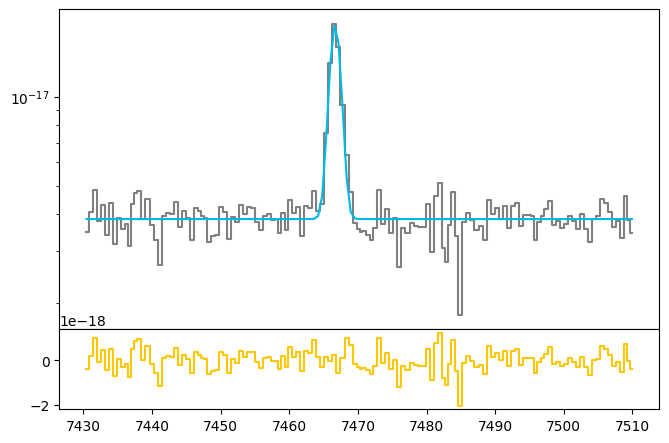

In [40]:
hei7065_tot_flux = out_hei7065.flatchain.Hei7065_tot.mean()
hei7065_tot_std = out_hei7065.flatchain.Hei7065_tot.std()

z_hei7065 = out_hei7065.flatchain.z_tot.mean()
z_hei7065_std = out_hei7065.flatchain.z_tot.std()

bkg_hei7065 = out_hei7065.flatchain.bkg.mean()
bkg_hei7065_std = out_hei7065.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_7065.wavelength, hei_7065.flux, color='gray', label='Data', where='mid')

hei7065 = gaussian(hei_7065.wavelength, hei7065_tot_flux, wave_cat['HeI7065'], z_hei7065, upy.nominal_values(sigma_7065))

ax.plot(hei_7065.wavelength, bkg_hei7065 + hei7065, color=c[0])
ax.set_yscale('log')
ax1.step(hei_7065.wavelength, hei_7065.flux - bkg_hei7065 - hei7065, color=c[3], where='mid')

In [41]:
# EW
EW_hei7065 = ufloat(hei7065_tot_flux, hei7065_tot_std) / ufloat(bkg_hei7065, bkg_hei7065_std)

# HeI 6678

In [42]:
sigma_arc_6678 = (m * wave_cat['HeI6678']*(1 + z_BN[igal])) + n

sigma_6678 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_6678**2))

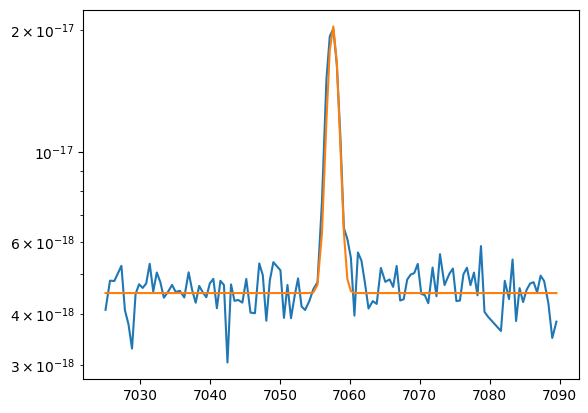

In [43]:
plt.plot(hei_6678.wavelength, hei_6678.flux)
bkg = 4.5e-18

hei6678_tot = gaussian(hei_6678.wavelength, 3e-17, wave_cat['HeI6678'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_6678))

plt.plot(hei_6678.wavelength, hei6678_tot + bkg)
plt.yscale('log')

In [44]:
params_6678 = Parameters()
params_6678.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_6678.add('sigma_hei6678_tot', value=upy.nominal_values(sigma_6678), vary=False)
params_6678.add('Hei6678_tot', value=3.0e-17, min=0.)
params_6678.add('bkg', value=4.5e-18, min=0.)

def residual_hei6678(params_6678, x, data, uncertainty):
    
    z_tot = params_6678['z_tot']
    sigma_hei6678_tot = params_6678['sigma_hei6678_tot']
    hei6678_tot_flux = params_6678['Hei6678_tot']
    bkg = params_6678['bkg']
    
    x = hei_6678.wavelength
    model = gaussian(x, hei6678_tot_flux, wave_cat['HeI6678'], z_tot, sigma_hei6678_tot)
    return (model + bkg - hei_6678.flux) / hei_6678.noise

In [45]:
np.random.seed(1146)
out_hei6678 = minimize(residual_hei6678, params_6678, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:35<00:00, 70.92it/s]


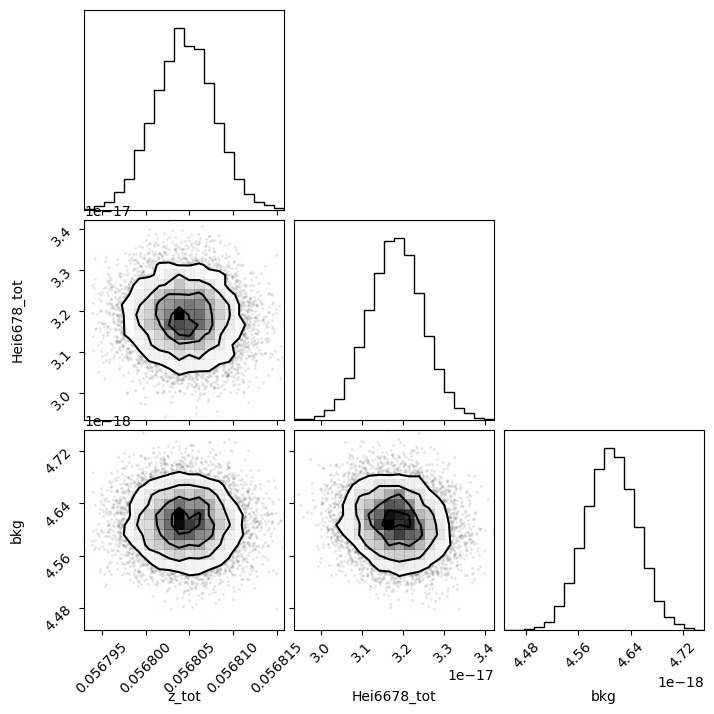

In [46]:
corner.corner(out_hei6678.flatchain, labels=out_hei6678.var_names);

In [47]:
out_hei6678.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05680441,3.4121e-06,(0.01%),0.05681744694523519,-inf,inf,True
sigma_hei6678_tot,0.75280238,,,0.7528023753919302,-inf,inf,False
Hei6678_tot,3.1836e-17,6.6194e-19,(2.08%),3e-17,0.00000000,inf,True
bkg,4.6107e-18,3.8478e-20,(0.83%),4.5e-18,0.00000000,inf,True


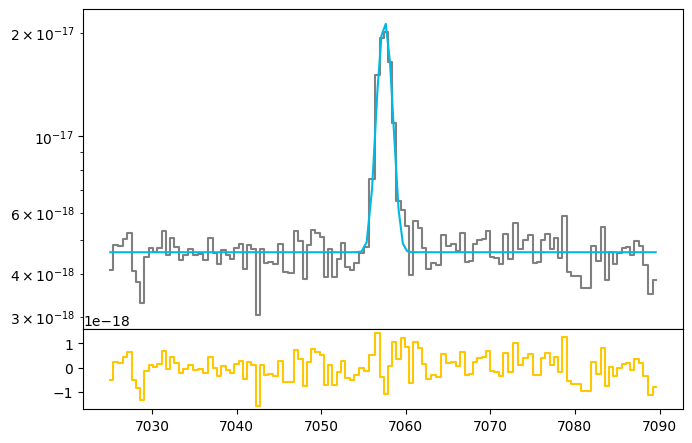

In [48]:
hei6678_tot_flux = out_hei6678.flatchain.Hei6678_tot.mean()
hei6678_tot_std = out_hei6678.flatchain.Hei6678_tot.std()

z_hei6678 = out_hei6678.flatchain.z_tot.mean()
z_hei6678_std = out_hei6678.flatchain.z_tot.std()

bkg_hei6678 = out_hei6678.flatchain.bkg.mean()
bkg_hei6678_std = out_hei6678.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_6678.wavelength, hei_6678.flux, color='gray', label='Data', where='mid')

hei6678 = gaussian(hei_6678.wavelength, hei6678_tot_flux, wave_cat['HeI6678'], z_hei6678, upy.nominal_values(sigma_6678))

ax.plot(hei_6678.wavelength, bkg_hei6678 + hei6678, color=c[0])
ax.set_yscale('log')
ax1.step(hei_6678.wavelength, hei_6678.flux - bkg_hei6678 - hei6678, color=c[3], where='mid')

In [49]:
# EW
EW_hei6678 = ufloat(hei6678_tot_flux, hei6678_tot_std) / ufloat(bkg_hei6678, bkg_hei6678_std)

# HeI 5875

In [50]:
sigma_arc_5875 = (m * wave_cat['HeI5875']*(1 + z_BN[igal])) + n

sigma_5875 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_5875**2))

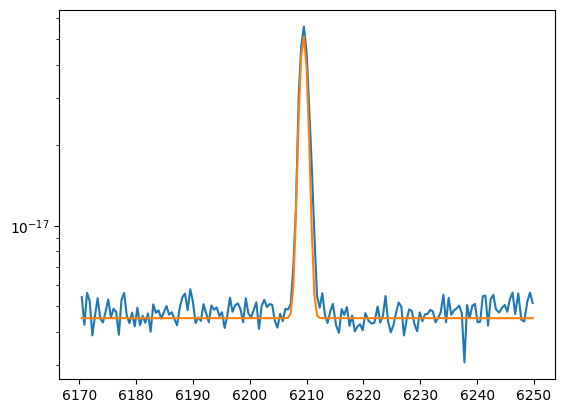

In [51]:
plt.plot(hei_5875.wavelength, hei_5875.flux)
bkg = 4.5e-18

hei5875_tot = gaussian(hei_5875.wavelength, 8e-17, wave_cat['HeI5875'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_5875))

plt.plot(hei_5875.wavelength, hei5875_tot + bkg)
plt.yscale('log')

In [52]:
params_5875 = Parameters()
params_5875.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_5875.add('sigma_hei5875_tot', value=upy.nominal_values(sigma_5875), vary=False)
params_5875.add('Hei5875_tot', value=8e-17, min=0.)
params_5875.add('bkg', value=4.5e-18, min=0.)

def residual_hei5875(params_5875, x, data, uncertainty):
    
    z_tot = params_5875['z_tot']
    sigma_hei5875_tot = params_5875['sigma_hei5875_tot']
    hei5875_tot_flux = params_5875['Hei5875_tot']
    bkg = params_5875['bkg']
    
    x = hei_5875.wavelength
    model = gaussian(x, hei5875_tot_flux, wave_cat['HeI5875'], z_tot, sigma_hei5875_tot)
    return (model + bkg - hei_5875.flux) / hei_5875.noise

In [53]:
np.random.seed(1146)
out_hei5875 = minimize(residual_hei5875, params_5875, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:39<00:00, 62.91it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [28.54793266 64.83500971 57.37100725]


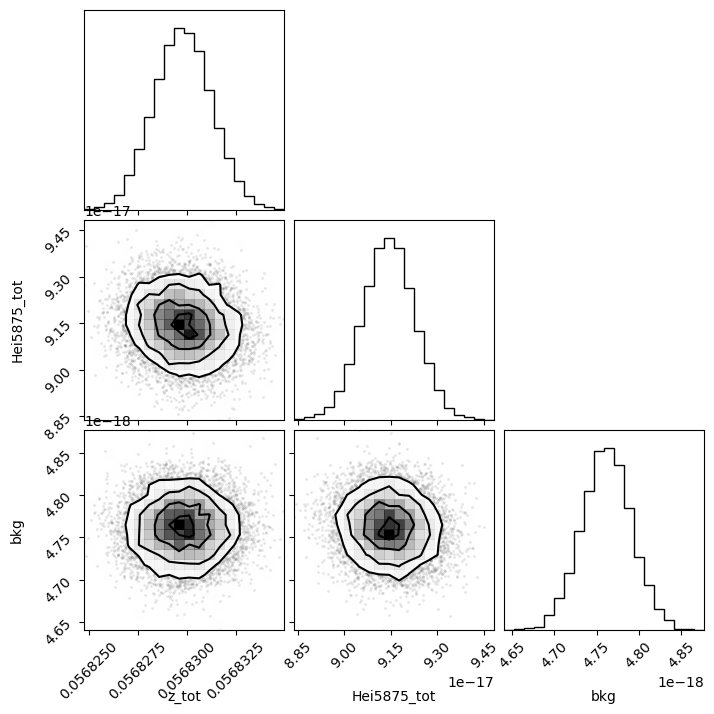

In [54]:
corner.corner(out_hei5875.flatchain, labels=out_hei5875.var_names);

In [55]:
out_hei5875.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05682980,1.4659e-06,(0.00%),0.05681744694523519,-inf,inf,True
sigma_hei5875_tot,0.68299594,,,0.682995936054941,-inf,inf,False
Hei5875_tot,9.1440e-17,8.3802e-19,(0.92%),8e-17,0.00000000,inf,True
bkg,4.7619e-18,2.9290e-20,(0.62%),4.5e-18,0.00000000,inf,True


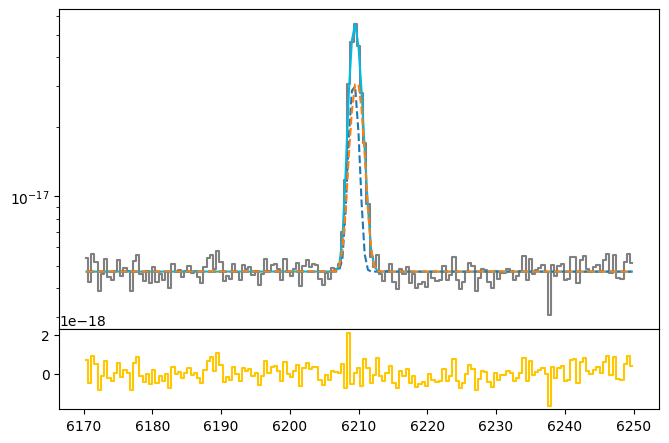

In [65]:
heic_nar_flux = out_hei5875.flatchain.Hei5875_nar.mean()
heic_nar_std = out_hei5875.flatchain.Hei5875_nar.std()

heic_brd_flux = out_hei5875.flatchain.Hei5875_brd.mean()
heic_brd_std = out_hei5875.flatchain.Hei5875_brd.std()

z_heic = out_hei5875.flatchain.z_nar.mean()
z_heic_std = out_hei5875.flatchain.z_nar.std()

bkg_heic = out_hei5875.flatchain.bkg.mean()
bkg_heic_std = out_hei5875.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_5875.wavelength, hei_5875.flux, color='gray', label='Data', where='mid')

heic_nar = gaussian(hei_5875.wavelength, heic_nar_flux, wave_cat['HeI5875'], z_heic, upy.nominal_values(sigma_nar_5875))
heic_brd = gaussian(hei_5875.wavelength, heic_brd_flux, wave_cat['HeI5875'], z_heic * z_ratio, upy.nominal_values(sigma_brd_5875))

heic = heic_nar + heic_brd

ax.plot(hei_5875.wavelength, bkg_heic + heic, color=c[0])
ax.plot(hei_5875.wavelength, bkg_heic + heic_nar, ls='--')
ax.plot(hei_5875.wavelength, bkg_heic + heic_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_5875.wavelength, hei_5875.flux - bkg_heic - heic, color=c[3], where='mid')

In [66]:
# EW
EW_HeI_5875_nar = ufloat(heic_nar_flux, heic_nar_std) / ufloat(bkg_heic, bkg_heic_std)
EW_HeI_5875_brd = ufloat(heic_brd_flux, heic_brd_std) / ufloat(bkg_heic, bkg_heic_std)
EW_HeI_5875 = (ufloat(heic_nar_flux, heic_nar_std) + ufloat(heic_brd_flux, heic_brd_std)) / ufloat(bkg_heic, bkg_heic_std)

# HeI 4471

In [58]:
sigma_arc_4471 = (m * wave_cat['HeI4471']*(1 + z_BN[igal])) + n

sigma_4471 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_4471**2))

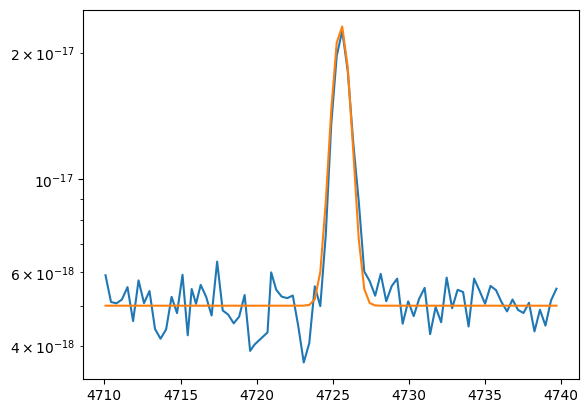

In [59]:
plt.plot(hei_4471.wavelength, hei_4471.flux)
bkg = 5.0e-18

hei4471_tot = gaussian(hei_4471.wavelength, 2.6e-17, wave_cat['HeI4471'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_4471))

plt.plot(hei_4471.wavelength, hei4471_tot + bkg)
plt.yscale('log')

In [60]:
params_4471 = Parameters()
params_4471.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_4471.add('sigma_hei4471_tot', value=upy.nominal_values(sigma_4471), vary=False)
params_4471.add('Hei4471_tot', value=2.6e-17, min=0.)
params_4471.add('bkg', value=5.0e-18, min=0.)

def residual_hei4471(params_4471, x, data, uncertainty):
    
    z_tot = params_4471['z_tot']
    sigma_hei4471_tot = params_4471['sigma_hei4471_tot']
    hei4471_tot_flux = params_4471['Hei4471_tot']
    bkg = params_4471['bkg']
    
    x = hei_4471.wavelength
    model = gaussian(x, hei4471_tot_flux, wave_cat['HeI4471'], z_tot, sigma_hei4471_tot)
    return (model + bkg - hei_4471.flux) / hei_4471.noise

In [61]:
np.random.seed(1146)
out_hei4471 = minimize(residual_hei4471, params_4471, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:41<00:00, 60.55it/s]


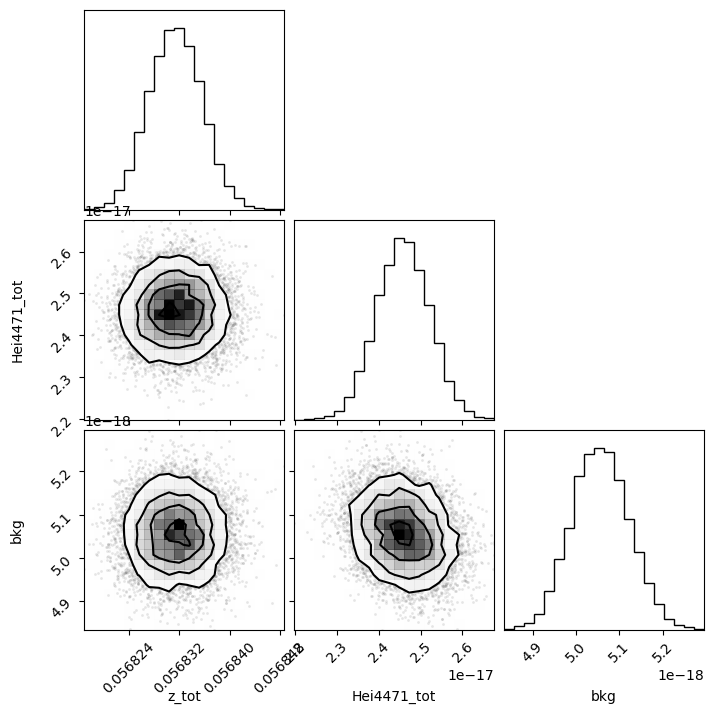

In [62]:
corner.corner(out_hei4471.flatchain, labels=out_hei4471.var_names);

In [63]:
out_hei4471.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05683140,4.2334e-06,(0.01%),0.05681744694523519,-inf,inf,True
sigma_hei4471_tot,0.56569695,,,0.5656969526473294,-inf,inf,False
Hei4471_tot,2.4584e-17,6.3578e-19,(2.59%),2.6e-17,0.00000000,inf,True
bkg,5.0561e-18,6.6558e-20,(1.32%),5e-18,0.00000000,inf,True


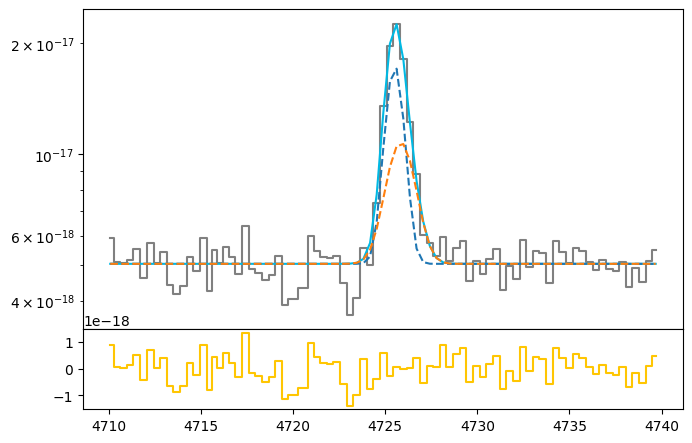

In [73]:
heid_nar_flux = out_hei4471.flatchain.Hei4471_nar.mean()
heid_nar_std = out_hei4471.flatchain.Hei4471_nar.std()

heid_brd_flux = out_hei4471.flatchain.Hei4471_brd.mean()
heid_brd_std = out_hei4471.flatchain.Hei4471_brd.std()

z_heid = out_hei4471.flatchain.z_nar.mean()
z_heid_std = out_hei4471.flatchain.z_nar.std()

bkg_heid = out_hei4471.flatchain.bkg.mean()
bkg_heid_std = out_hei4471.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hei_4471.wavelength, hei_4471.flux, color='gray', label='Data', where='mid')

heid_nar = gaussian(hei_4471.wavelength, heid_nar_flux, wave_cat['HeI4471'], z_heid, upy.nominal_values(sigma_nar_4471))
heid_brd = gaussian(hei_4471.wavelength, heid_brd_flux, wave_cat['HeI4471'], z_heid * z_ratio, upy.nominal_values(sigma_brd_4471))

heid = heid_nar + heid_brd

ax.plot(hei_4471.wavelength, bkg_heid + heid, color=c[0])
ax.plot(hei_4471.wavelength, bkg_heid + heid_nar, ls='--')
ax.plot(hei_4471.wavelength, bkg_heid + heid_brd, ls='--')
ax.set_yscale('log')
ax1.step(hei_4471.wavelength, hei_4471.flux - bkg_heid - heid, color=c[3], where='mid')

In [74]:
# EW
EW_HeI_4471_nar = ufloat(heid_nar_flux, heid_nar_std) / ufloat(bkg_heid, bkg_heid_std)
EW_HeI_4471_brd = ufloat(heid_brd_flux, heid_brd_std) / ufloat(bkg_heid, bkg_heid_std)
EW_HeI_4471 = (ufloat(heid_nar_flux, heid_nar_std) + ufloat(heid_brd_flux, heid_brd_std)) / ufloat(bkg_heid, bkg_heid_std)

# [SII]6716 + [SII]6730

In [66]:
sigma_arc_6730 = (m * wave_cat['[SII]6730']*(1 + z_BN[igal])) + n

sigma_6730 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_6730**2))

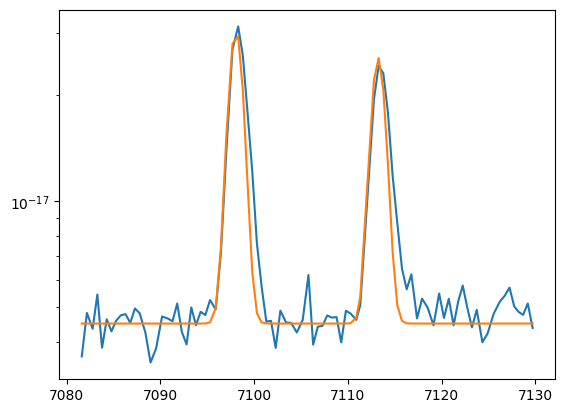

In [67]:
plt.plot(sii.wavelength, sii.flux)
bkg = 4.5e-18

siia_tot = gaussian(sii.wavelength, 4.0e-17, wave_cat['[SII]6730'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_6730))
siib_tot = gaussian(sii.wavelength, 5.0e-17, wave_cat['[SII]6716'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_6730))

plt.plot(sii.wavelength, siia_tot + siib_tot + bkg)
plt.yscale('log')

In [68]:
params_sii = Parameters()
params_sii.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_sii.add('sigma_tot', value=upy.nominal_values(sigma_6730), vary=False)
params_sii.add('Siia_tot', value=4.0e-17, min=0.)
params_sii.add('Siib_tot', value=5.0e-17, min=0.)
params_sii.add('bkg', value=4.5e-18, min=0.)


def residual_sii(params_sii, x, data, uncertainty):
    
    z_tot = params_sii['z_tot']
    sigma_tot = params_sii['sigma_tot']
    siia_tot_flux = params_sii['Siia_tot']
    siib_tot_flux = params_sii['Siib_tot']
    bkg = params_sii['bkg']
    
    x = sii.wavelength
    model_siia = gaussian(x, siia_tot_flux, wave_cat['[SII]6730'], z_tot, sigma_tot)
    model_siib = gaussian(x, siib_tot_flux, wave_cat['[SII]6716'], z_tot, sigma_tot)
    model = model_siia + model_siib
    return (model + bkg - sii.flux) / sii.noise

In [69]:
np.random.seed(1146)
out_sii = minimize(residual_sii, params_sii, args=(1, 1, 1),
                    method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:56<00:00, 43.95it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [26.53247341 39.4633952  55.98287195 62.41497625]


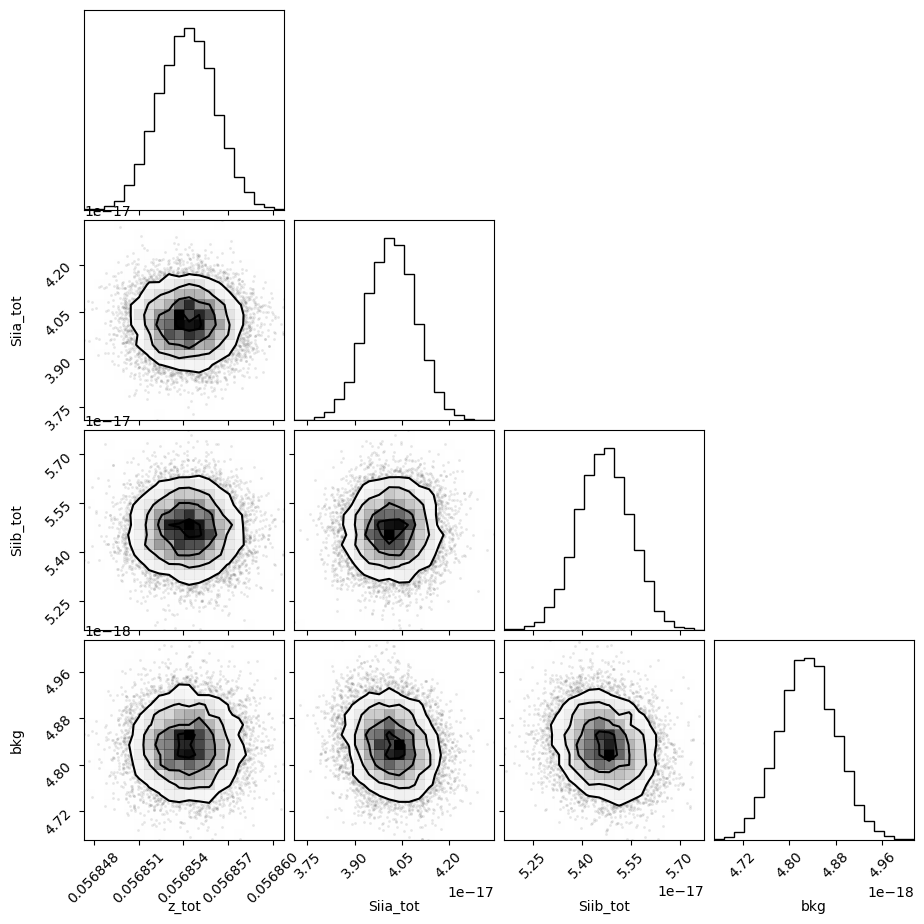

In [70]:
corner.corner(out_sii.flatchain, labels=out_sii.var_names);

In [71]:
out_sii.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05685425,1.9015e-06,(0.00%),0.05681744694523519,-inf,inf,True
sigma_tot,0.75743554,,,0.7574355376421327,-inf,inf,False
Siia_tot,4.0186e-17,7.7627e-19,(1.93%),4e-17,0.00000000,inf,True
Siib_tot,5.4688e-17,8.1950e-19,(1.50%),5e-17,0.00000000,inf,True
bkg,4.8324e-18,4.8608e-20,(1.01%),4.5e-18,0.00000000,inf,True


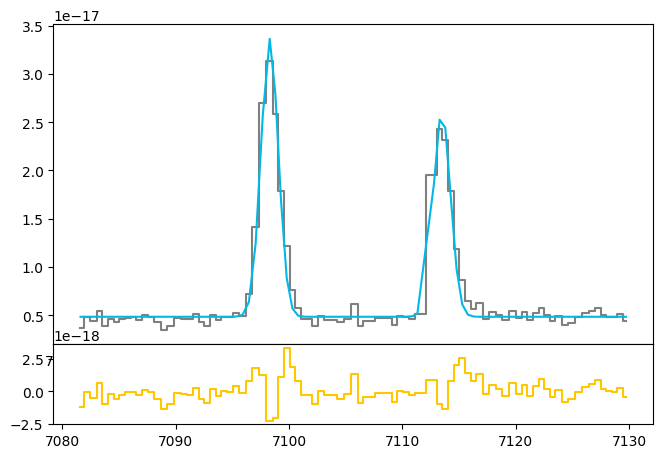

In [72]:
siia_tot_flux = out_sii.flatchain.Siia_tot.mean()
siia_tot_std = out_sii.flatchain.Siia_tot.std()

siib_tot_flux = out_sii.flatchain.Siib_tot.mean()
siib_tot_std = out_sii.flatchain.Siib_tot.std()

z_sii = out_sii.flatchain.z_tot.mean()
z_sii_std = out_sii.flatchain.z_tot.std()

bkg_sii = out_sii.flatchain.bkg.mean()
bkg_sii_std = out_sii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(sii.wavelength, sii.flux, color='gray', label='Data', where='mid')

siia = gaussian(sii.wavelength, siia_tot_flux, wave_cat['[SII]6730'], z_sii, upy.nominal_values(sigma_6730))
siib = gaussian(sii.wavelength, siib_tot_flux, wave_cat['[SII]6716'], z_sii, upy.nominal_values(sigma_6730))

ax.plot(sii.wavelength, bkg_sii + siia + siib, color=c[0])
#plt.yscale('log')
ax1.step(sii.wavelength, sii.flux - bkg_sii - siia - siib, color=c[3], where='mid')

In [73]:
# EW
EW_SII_6730 = ufloat(siia_tot_flux, siia_tot_std) / ufloat(bkg_sii, bkg_sii_std)
EW_SII_6716 = ufloat(siib_tot_flux, siib_tot_std) / ufloat(bkg_sii, bkg_sii_std)

# H$\beta$

In [74]:
sigma_arc_hb = (m * wave_cat['Hb']*(1 + z_BN[igal])) + n

sigma_hb = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_hb**2))

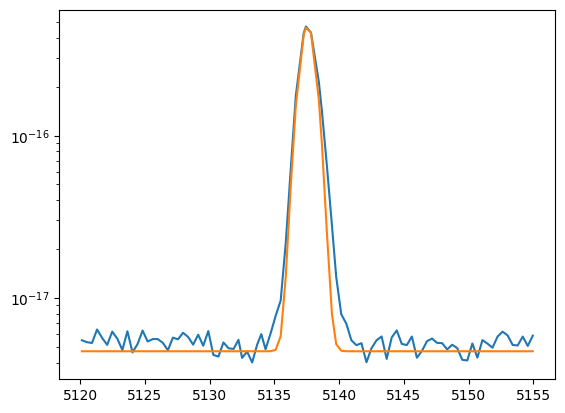

In [75]:
plt.plot(hbeta.wavelength, hbeta.flux)
bkg = 4.7e-18

hb_tot = gaussian(hbeta.wavelength, 7e-16, wave_cat['Hb'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_hb))

plt.plot(hbeta.wavelength, hb_tot + bkg)
plt.yscale('log')

In [76]:
params_hb = Parameters()
params_hb.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_hb.add('sigma_tot', value=upy.nominal_values(sigma_hb), vary=False)
params_hb.add('Hb_tot', value=7e-16, min=0.)
params_hb.add('bkg', value=4.7e-18, min=0.)

def residual_hb(params_hb, x, data, uncertainty):
    
    z_tot = params_hb['z_tot']
    sigma_tot = params_hb['sigma_tot']
    hb_tot_flux = params_hb['Hb_tot']
    bkg = params_hb['bkg']
    
    x = hbeta.wavelength
    model = gaussian(x, hb_tot_flux, wave_cat['Hb'], z_tot, sigma_tot)
    return (model + bkg - hbeta.flux) / hbeta.noise

In [77]:
np.random.seed(1146)
out_hb = minimize(residual_hb, params_hb, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:48<00:00, 51.75it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 2 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [33.06500352 73.76434179 67.88905807]


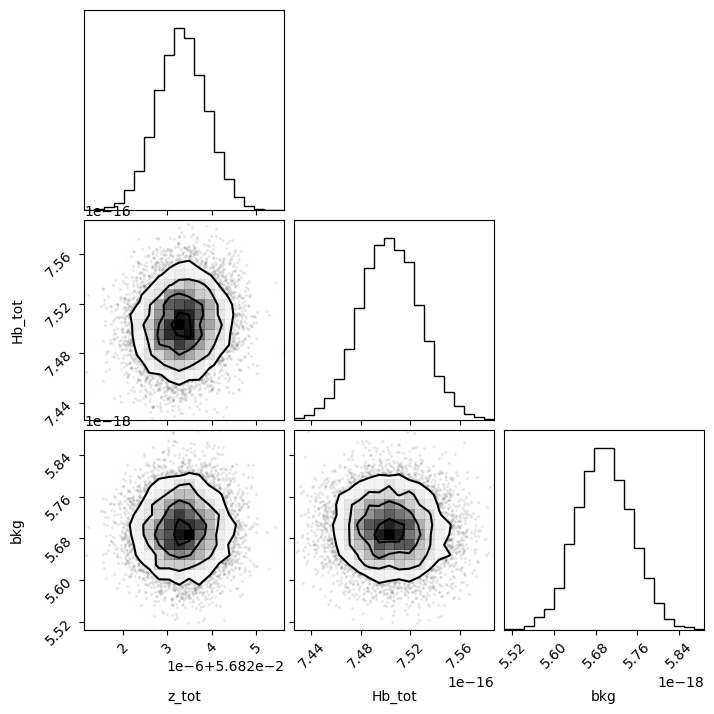

In [78]:
corner.corner(out_hb.flatchain, labels=out_hb.var_names);

In [79]:
out_hb.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05682332,5.5873e-07,(0.00%),0.05681744694523519,-inf,inf,True
sigma_tot,0.59748996,,,0.597489964769349,-inf,inf,False
Hb_tot,7.5035e-16,2.3992e-18,(0.32%),7e-16,0.00000000,inf,True
bkg,5.6962e-18,5.2878e-20,(0.93%),4.7e-18,0.00000000,inf,True


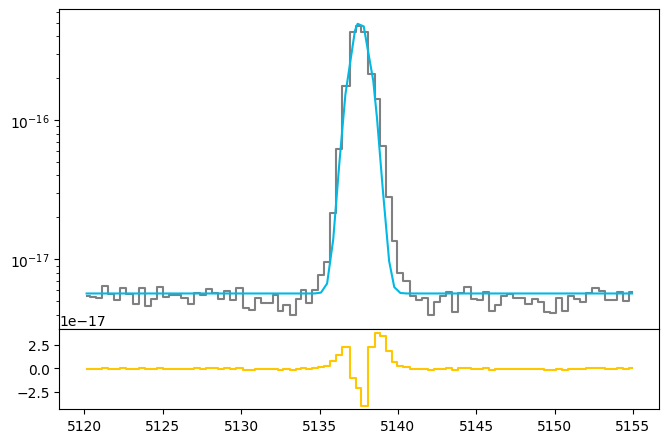

In [80]:
hb_tot_flux = out_hb.flatchain.Hb_tot.mean()
hb_tot_std = out_hb.flatchain.Hb_tot.std()

z_hb = out_hb.flatchain.z_tot.mean()
z_hb_std = out_hb.flatchain.z_tot.std()

bkg_hb = out_hb.flatchain.bkg.mean()
bkg_hb_std = out_hb.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hbeta.wavelength, hbeta.flux, color='gray', label='Data', where='mid')

hb = gaussian(hbeta.wavelength, hb_tot_flux, wave_cat['Hb'], z_hb, upy.nominal_values(sigma_hb))

ax.plot(hbeta.wavelength, bkg_hb + hb, color=c[0])
ax.set_yscale('log')
ax1.step(hbeta.wavelength, hbeta.flux - bkg_hb - hb, color=c[3], where='mid')

In [81]:
# EW
EW_Hb = ufloat(hb_tot_flux, hb_tot_std) / ufloat(bkg_hb, bkg_hb_std)

# H$\gamma$

In [82]:
sigma_arc_hg = (m * wave_cat['Hg']*(1 + z_BN[igal])) + n

sigma_hg = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_hg**2))

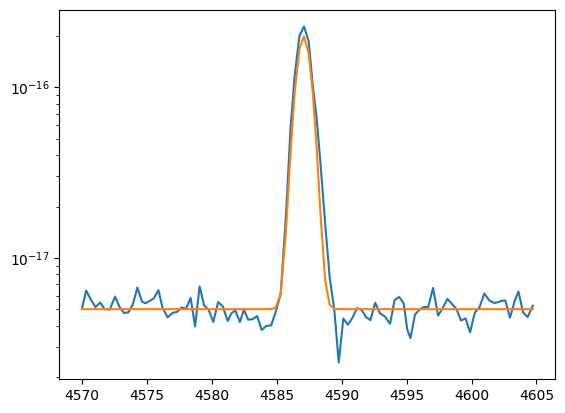

In [83]:
plt.plot(hgamma.wavelength, hgamma.flux)
bkg = 5e-18

hg_tot = gaussian(hgamma.wavelength, 2.7e-16, wave_cat['Hg'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_hg))

plt.plot(hgamma.wavelength, hg_tot + bkg)
plt.yscale('log')

In [84]:
params_hg = Parameters()
params_hg.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_hg.add('sigma_tot', value=upy.nominal_values(sigma_hg), vary=False)
params_hg.add('Hg_tot', value=2.7e-16, min=0.)
params_hg.add('bkg', value=5e-18, min=0.)

def residual_hg(params_hg, x, data, uncertainty):
    
    z_tot = params_hg['z_tot']
    sigma_tot = params_hg['sigma_tot']
    hg_tot_flux = params_hg['Hg_tot']
    bkg = params_hg['bkg']
    
    x = hgamma.wavelength
    model = gaussian(x, hg_tot_flux, wave_cat['Hg'], z_tot, sigma_tot)
    return (model + bkg - hgamma.flux) / hgamma.noise

In [85]:
np.random.seed(1146)
out_hg = minimize(residual_hg, params_hg, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:53<00:00, 46.99it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [34.12382997 79.59857658 49.74606082]


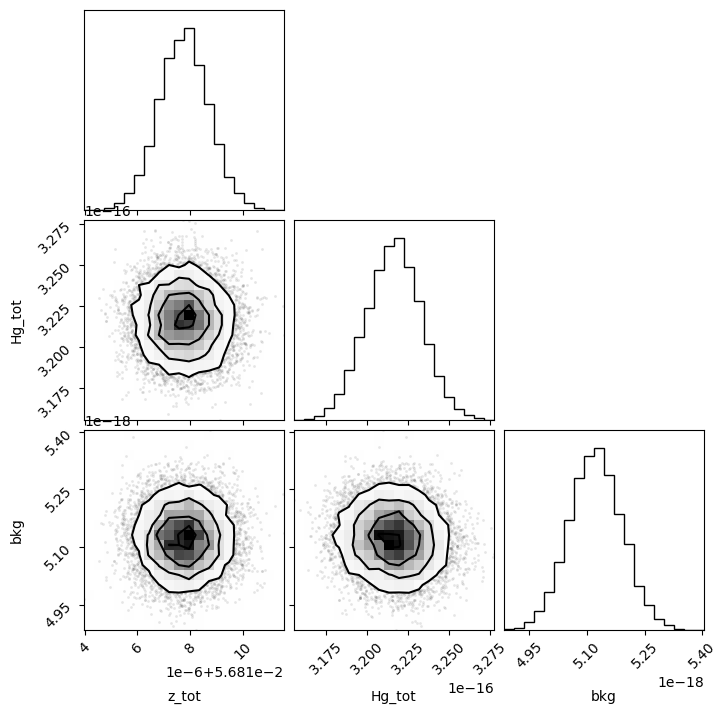

In [86]:
corner.corner(out_hg.flatchain, labels=out_hg.var_names);

In [87]:
out_hg.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05681777,9.3945e-07,(0.00%),0.05681744694523519,-inf,inf,True
sigma_tot,0.55517793,,,0.5551779349640745,-inf,inf,False
Hg_tot,3.2165e-16,1.6824e-18,(0.52%),2.7e-16,0.00000000,inf,True
bkg,5.1220e-18,6.8667e-20,(1.34%),5e-18,0.00000000,inf,True


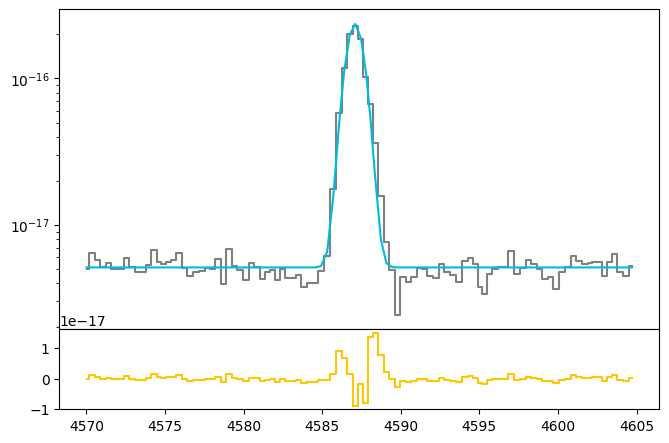

In [88]:
hg_tot_flux = out_hg.flatchain.Hg_tot.mean()
hg_tot_std = out_hg.flatchain.Hg_tot.std()

z_hg = out_hg.flatchain.z_tot.mean()
z_hg_std = out_hg.flatchain.z_tot.std()

bkg_hg = out_hg.flatchain.bkg.mean()
bkg_hg_std = out_hg.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hgamma.wavelength, hgamma.flux, color='gray', label='Data', where='mid')

hg = gaussian(hgamma.wavelength, hg_tot_flux, wave_cat['Hg'],           z_hg, upy.nominal_values(sigma_hg))

ax.plot(hgamma.wavelength, bkg_hg + hg, color=c[0])
ax.set_yscale('log')
ax1.step(hgamma.wavelength, hgamma.flux - bkg_hg - hg, color=c[3], where='mid')

In [89]:
# EW
EW_Hg = ufloat(hg_tot_flux, hg_tot_std) / ufloat(bkg_hg, bkg_hg_std)

# H$\delta$

In [90]:
sigma_arc_hd = (m * wave_cat['Hd']*(1 + z_BN[igal])) + n

sigma_hd = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_hd**2))

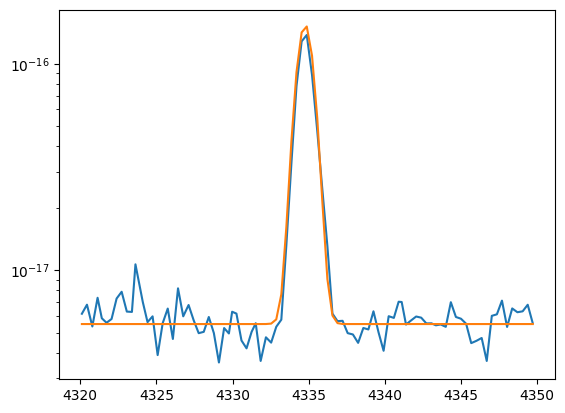

In [91]:
plt.plot(hdelta.wavelength, hdelta.flux)
bkg = 5.5e-18

hd_tot = gaussian(hdelta.wavelength, 2e-16, wave_cat['Hd'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_hd))

plt.plot(hdelta.wavelength, hd_tot + bkg)
plt.yscale('log')

In [92]:
params_hd = Parameters()
params_hd.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_hd.add('sigma_tot', value=upy.nominal_values(sigma_hd), vary=False)
params_hd.add('Hd_tot', value=2.0e-16, min=0.)
params_hd.add('bkg', value=5.5e-18, min=0.)

def residual_hd(params_hd, x, data, uncertainty):
    
    z_tot = params_hd['z_tot']
    sigma_tot = params_hd['sigma_tot']
    hd_tot_flux = params_hd['Hd_tot']
    bkg = params_hd['bkg']
    
    x = hdelta.wavelength
    model = gaussian(x, hd_tot_flux, wave_cat['Hd'], z_tot, sigma_tot)
    return (model + bkg - hdelta.flux) / hdelta.noise

In [93]:
np.random.seed(1146)
out_hd = minimize(residual_hd, params_hd, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:56<00:00, 44.52it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [38.46796777 61.84913622 32.52690169]


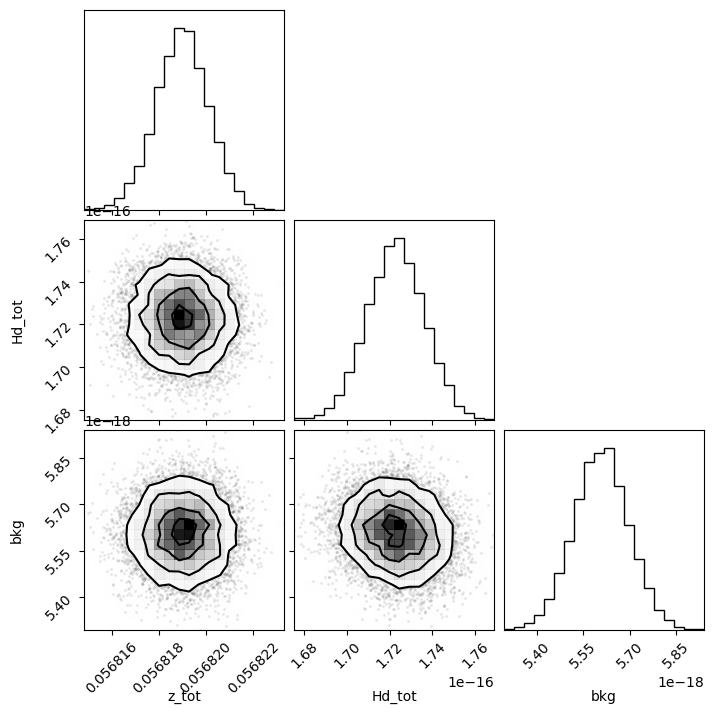

In [94]:
corner.corner(out_hd.flatchain, labels=out_hd.var_names);

In [95]:
out_hd.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05681900,1.1070e-06,(0.00%),0.05681744694523519,-inf,inf,True
sigma_tot,0.53624404,,,0.5362440419031429,-inf,inf,False
Hd_tot,1.7230e-16,1.3285e-18,(0.77%),2e-16,0.00000000,inf,True
bkg,5.6084e-18,8.8549e-20,(1.58%),5.5e-18,0.00000000,inf,True


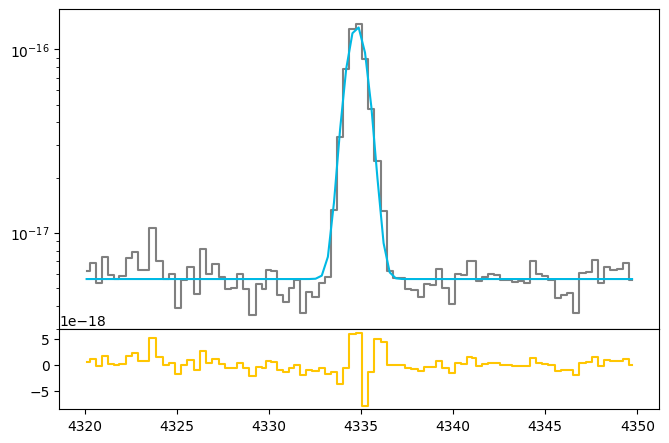

In [96]:
hd_tot_flux = out_hd.flatchain.Hd_tot.mean()
hd_tot_std = out_hd.flatchain.Hd_tot.std()

z_hd = out_hd.flatchain.z_tot.mean()
z_hd_std = out_hd.flatchain.z_tot.std()

bkg_hd = out_hd.flatchain.bkg.mean()
bkg_hd_std = out_hd.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(hdelta.wavelength, hdelta.flux, color='gray', label='Data', where='mid')

hd = gaussian(hdelta.wavelength, hd_tot_flux, wave_cat['Hd'], z_hd, upy.nominal_values(sigma_hd))

ax.plot(hdelta.wavelength, bkg_hd + hd, color=c[0])
ax.set_yscale('log')
ax1.step(hdelta.wavelength, hdelta.flux - bkg_hd - hd, color=c[3], where='mid')

In [97]:
# EW
EW_Hd = ufloat(hd_tot_flux, hd_tot_std)/ ufloat(bkg_hd, bkg_hd_std)

# HeII 4686

In [98]:
sigma_arc_4685 = (m * wave_cat['HeII4685']*(1 + z_BN[igal])) + n

sigma_4685 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_4685**2))

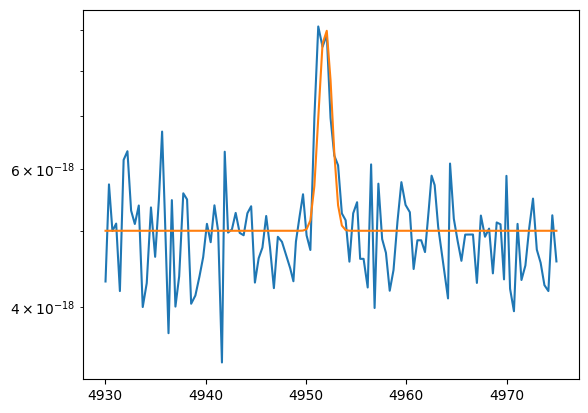

In [99]:
plt.plot(heii_4686.wavelength, heii_4686.flux)
bkg = 5e-18

heii4685_tot = gaussian(heii_4686.wavelength, 6e-18, wave_cat['HeII4685'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_4685))

plt.plot(heii_4686.wavelength, heii4685_tot + bkg)
plt.yscale('log')

In [100]:
params_4685 = Parameters()
params_4685.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_4685.add('sigma_heii4685_tot', value=upy.nominal_values(sigma_4685), vary=False)
params_4685.add('Heii4685_tot', value=6e-18, min=0.)
params_4685.add('bkg', value=5e-18, min=0.)

def residual_heii4685(params_4685, x, data, uncertainty):
    
    z_tot = params_4685['z_tot']
    sigma_heii4685_tot = params_4685['sigma_heii4685_tot']
    heii4685_tot_flux = params_4685['Heii4685_tot']
    bkg = params_4685['bkg']
    
    x = heii_4686.wavelength
    model = gaussian(x, heii4685_tot_flux, wave_cat['HeII4685'], z_tot, sigma_heii4685_tot)
    return (model + bkg - heii_4686.flux) / heii_4686.noise

In [101]:
np.random.seed(1146)
out_heii4685 = minimize(residual_heii4685, params_4685, args=(1, 1, 1),
                   method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:53<00:00, 46.37it/s]


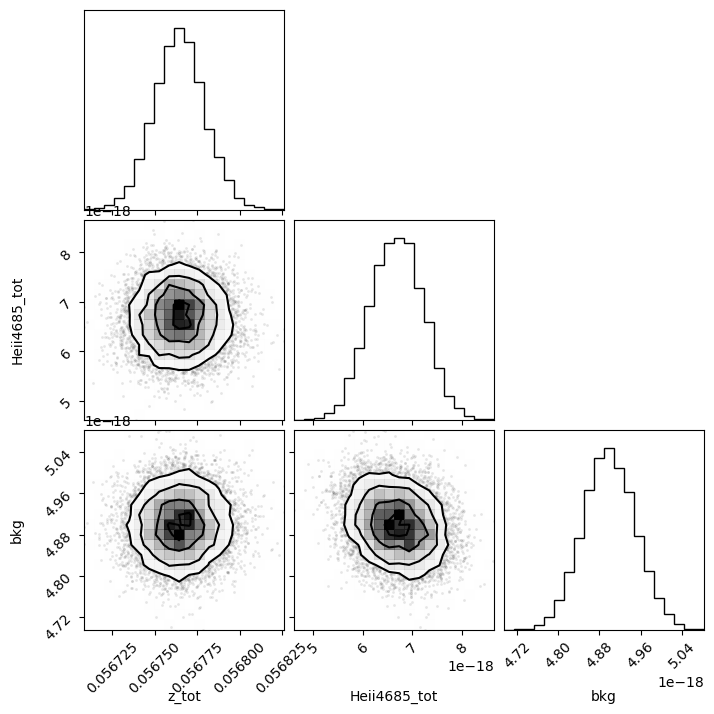

In [102]:
corner.corner(out_heii4685.flatchain, labels=out_heii4685.var_names);

In [103]:
out_heii4685.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05676468,1.4863e-05,(0.03%),0.05681744694523519,-inf,inf,True
sigma_heii4685_tot,0.58308062,,,0.5830806167603962,-inf,inf,False
Heii4685_tot,6.6838e-18,5.3502e-19,(8.00%),6e-18,0.00000000,inf,True
bkg,4.8990e-18,5.0858e-20,(1.04%),5e-18,0.00000000,inf,True


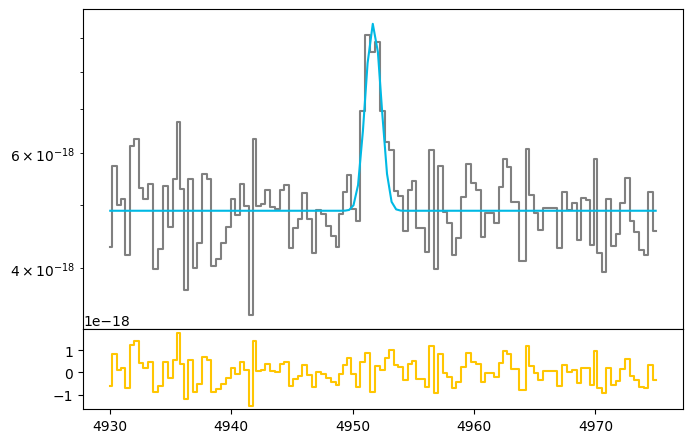

In [104]:
heii4685_tot_flux = out_heii4685.flatchain.Heii4685_tot.mean()
heii4685_tot_std = out_heii4685.flatchain.Heii4685_tot.std()

z_heii4685 = out_heii4685.flatchain.z_tot.mean()
z_heii4685_std = out_heii4685.flatchain.z_tot.std()

bkg_heii4685 = out_heii4685.flatchain.bkg.mean()
bkg_heii4685_std = out_heii4685.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(heii_4686.wavelength, heii_4686.flux, color='gray', label='Data', where='mid')

heii4685 = gaussian(heii_4686.wavelength, heii4685_tot_flux, wave_cat['HeII4685'], z_heii4685, upy.nominal_values(sigma_4685))

ax.plot(heii_4686.wavelength, bkg_heii4685 + heii4685, color=c[0])
ax.set_yscale('log')
ax1.step(heii_4686.wavelength, heii_4686.flux - bkg_heii4685 - heii4685, color=c[3], where='mid')

In [105]:
# EW
EW_heii4685 = ufloat(heii4685_tot_flux, heii4685_tot_std) / ufloat(bkg_heii4685, bkg_heii4685_std)

# [OII]3726 + [OII]3729

In [106]:
sigma_arc_3729 = (m * wave_cat['[OII]3729']*(1 + z_BN[igal])) + n

sigma_3729 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_3729**2))

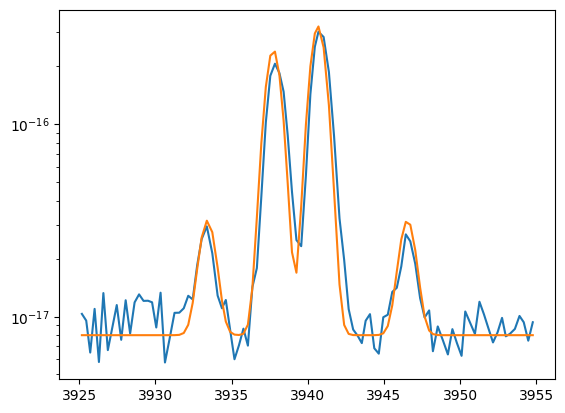

In [107]:
# Search for good initial guess

plt.plot(oii_3727.wavelength, oii_3727.flux)

h13 = gaussian(oii_3727.wavelength, 0.3e-16, wave_cat['H13'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_3729))
oiic_tot = gaussian(oii_3727.wavelength, 0.4e-15, wave_cat['[OII]3729'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_3729))
oiid_tot = gaussian(oii_3727.wavelength, 0.3e-15, wave_cat['[OII]3726'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_3729))
h14 = gaussian(oii_3727.wavelength, 0.3e-16, wave_cat['H14'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_3729))

bkg = 0.8e-17

plt.plot(oii_3727.wavelength, bkg + oiid_tot + oiic_tot + h13 + h14)
plt.yscale('log')

In [108]:
params_oii_3727 = Parameters()

params_oii_3727.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_oii_3727.add('sigma_tot', value=upy.nominal_values(sigma_3729), vary=False)
params_oii_3727.add('H13', value=0.3e-16, min=0.)
params_oii_3727.add('Oiic_tot', value=0.4e-15, min=0.)
params_oii_3727.add('Oiid_tot', value=0.3e-15, min=0.)
params_oii_3727.add('H14', value=0.3e-16, min=0.)
params_oii_3727.add('bkg', value=0.8e-17, min=0.)

def residual_oii_3727(params_oii_3727, x, data, uncertainty):
    
    z_tot = params_oii_3727['z_tot']
    sigma_tot = params_oii_3727['sigma_tot']
    
    h13_flux = params_oii_3727['H13']
    oiic_tot_flux = params_oii_3727['Oiic_tot']
    oiid_tot_flux = params_oii_3727['Oiid_tot']
    h14_flux = params_oii_3727['H14']
    bkg = params_oii_3727['bkg']
    
    x = oii_3727.wavelength
    model_h13 = gaussian(x, h13_flux, wave_cat['H13'], z_tot, sigma_tot)
    model_oiic = gaussian(x, oiic_tot_flux, wave_cat['[OII]3729'], z_tot, sigma_tot)
    model_oiid = gaussian(x, oiid_tot_flux, wave_cat['[OII]3726'], z_tot, sigma_tot)
    model_h14 = gaussian(x, h14_flux, wave_cat['H14'], z_tot, sigma_tot)
    model = model_h13 + model_oiic + model_oiid + model_h14
    return (model + bkg - oii_3727.flux) / oii_3727.noise

In [109]:
np.random.seed(1146)
out_oii_3727 = minimize(residual_oii_3727, params_oii_3727, args=(1, 1, 1),
                         method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:33<00:00, 26.73it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 5 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 25.7249588  115.91824623  61.44664053  81.63422407 104.69566708
 101.70852377]


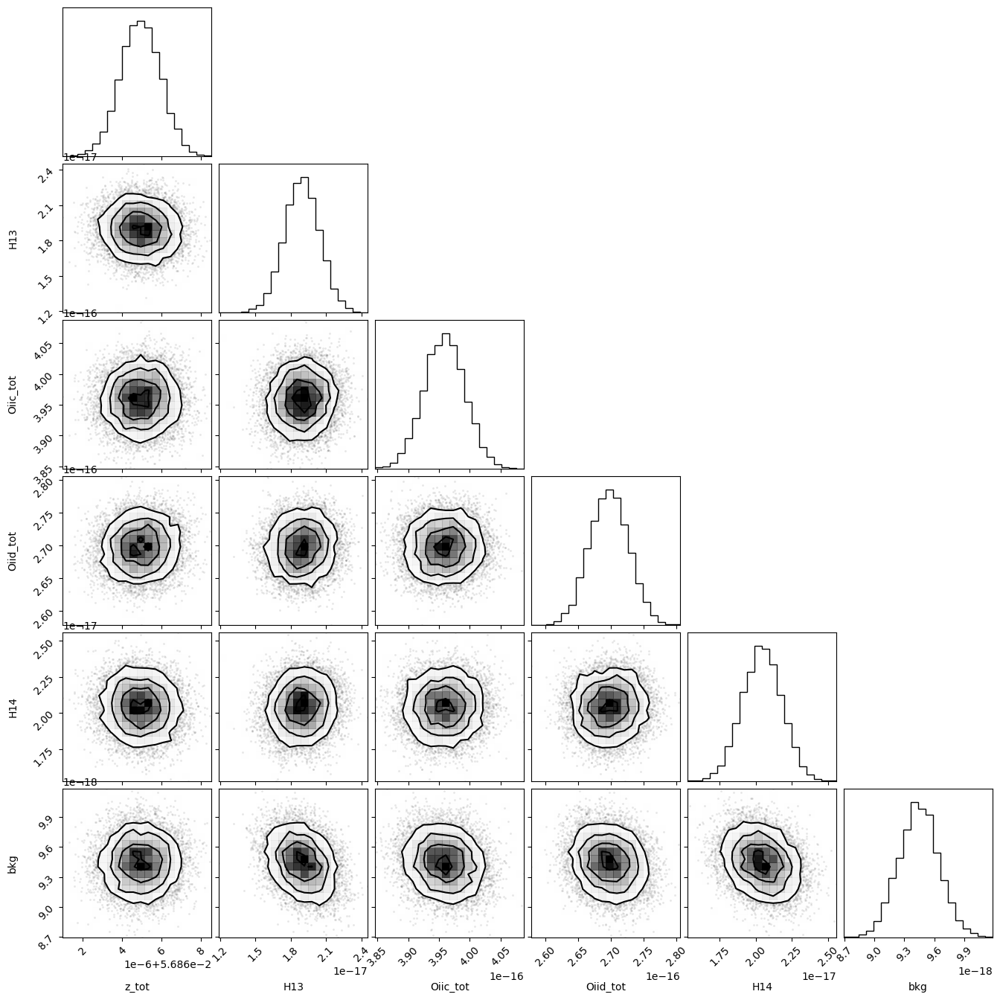

In [110]:
corner.corner(out_oii_3727.flatchain, labels=out_oii_3727.var_names);

In [111]:
out_oii_3727.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05686493,1.0126e-06,(0.00%),0.05681744694523519,-inf,inf,True
sigma_tot,0.50735625,,,0.5073562515208658,-inf,inf,False
H13,1.8954e-17,1.4781e-18,(7.80%),3e-17,0.00000000,inf,True
Oiic_tot,3.9587e-16,3.2827e-18,(0.83%),4e-16,0.00000000,inf,True
Oiid_tot,2.6974e-16,2.9917e-18,(1.11%),3e-16,0.00000000,inf,True
H14,2.0438e-17,1.3819e-18,(6.76%),3e-17,0.00000000,inf,True
bkg,9.4450e-18,2.0266e-19,(2.15%),8e-18,0.00000000,inf,True


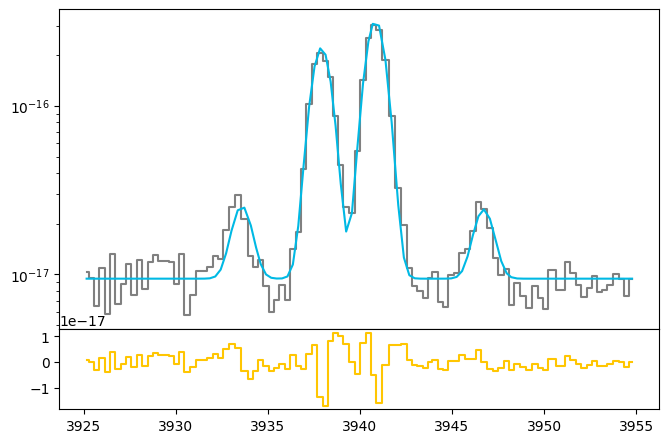

In [112]:
h13_flux = out_oii_3727.flatchain.H13.mean()
h13_std = out_oii_3727.flatchain.H13.std()

oiic_tot_flux = out_oii_3727.flatchain.Oiic_tot.mean()
oiic_tot_std = out_oii_3727.flatchain.Oiic_tot.std()

oiid_tot_flux = out_oii_3727.flatchain.Oiid_tot.mean()
oiid_tot_std = out_oii_3727.flatchain.Oiid_tot.std()

h14_flux = out_oii_3727.flatchain.H14.mean()
h14_std = out_oii_3727.flatchain.H14.std()

z_oii_3727 = out_oii_3727.flatchain.z_tot.mean()
z_oii_3727_std = out_oii_3727.flatchain.z_tot.std()

bkg_oii_3727 = out_oii_3727.flatchain.bkg.mean()
bkg_oii_3727_std = out_oii_3727.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oii_3727.wavelength, oii_3727.flux, color='gray', label='Data', where='mid')

h13 = gaussian(oii_3727.wavelength, h13_flux, wave_cat['H13'], z_oii_3727, upy.nominal_values(sigma_3729))
oiic = gaussian(oii_3727.wavelength, oiic_tot_flux, wave_cat['[OII]3729'], z_oii_3727, upy.nominal_values(sigma_3729))
oiid = gaussian(oii_3727.wavelength, oiid_tot_flux, wave_cat['[OII]3726'], z_oii_3727, upy.nominal_values(sigma_3729))
h14 = gaussian(oii_3727.wavelength, h14_flux, wave_cat['H14'], z_oii_3727, upy.nominal_values(sigma_3729))

ax.plot(oii_3727.wavelength, bkg_oii_3727 + h13 + oiic + oiid + h14, color=c[0])

ax.set_yscale('log')
ax1.step(oii_3727.wavelength, oii_3727.flux - bkg_oii_3727 - oiic - oiid - h13 - h14, color=c[3], where='mid')

In [113]:
# EW
EW_OII_3729 = ufloat(oiic_tot_flux, oiic_tot_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)
EW_OII_3726 = ufloat(oiid_tot_flux, oiid_tot_std) / ufloat(bkg_oii_3727, bkg_oii_3727_std)

# [SIII]9532

In [114]:
sigma_arc_9532 = (m * wave_cat['[SIII]9532']*(1 + z_BN[igal])) + n

sigma_9532 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_9532**2))

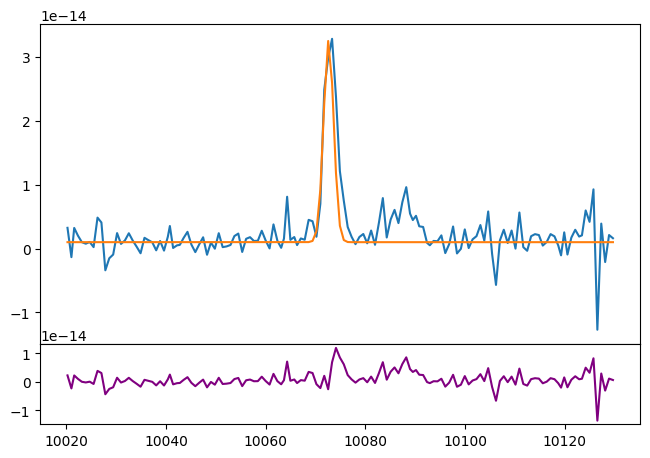

In [115]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(siii_9532.wavelength, siii_9532.flux)
bkg = 1e-15

siiia_tot = gaussian(siii_9532.wavelength, 8e-14, wave_cat['[SIII]9532'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_9532))

ax.plot(siii_9532.wavelength, bkg + siiia_tot)
ax1.plot(siii_9532.wavelength, siii_9532.flux - bkg - siiia_tot, color='purple')
#ax.set_yscale('log')

In [116]:
params_siiia = Parameters()
params_siiia.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_siiia.add('sigma_tot', value=sigma_tot_oiii_4959, vary=False)
params_siiia.add('Siiia_tot', value=8.0e-14, min=0.)
params_siiia.add('bkg', value=1e-15, min=0.)


def residual_siiia(params_siiia, x, data, uncertainty):
    
    z_tot = params_siiia['z_tot']
    sigma_tot = params_siiia['sigma_tot']
    siiia_tot_flux = params_siiia['Siiia_tot']
    bkg = params_siiia['bkg']
    
    x = siii_9532.wavelength
    model = gaussian(x, siiia_tot_flux, wave_cat['[SIII]9532'], z_tot, sigma_tot)
    
    return (model + bkg - siii_9532.flux) / siii_9532.noise

In [117]:
np.random.seed(1146)
out_siiia = minimize(residual_siiia, params_siiia, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:57<00:00, 43.46it/s]


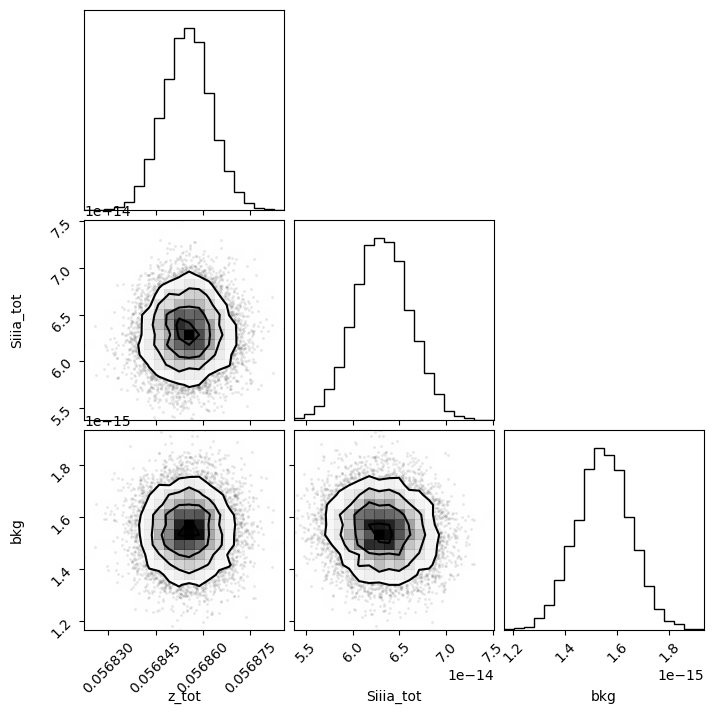

In [118]:
corner.corner(out_siiia.flatchain, labels=out_siiia.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [119]:
out_siiia.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05685505,7.4707e-06,(0.01%),0.05681744694523519,-inf,inf,True
sigma_tot,0.60555088,,,0.6055508816594599,-inf,inf,False
Siiia_tot,6.3122e-14,2.9352e-15,(4.65%),8e-14,0.00000000,inf,True
bkg,1.5474e-15,1.0418e-16,(6.73%),1e-15,0.00000000,inf,True


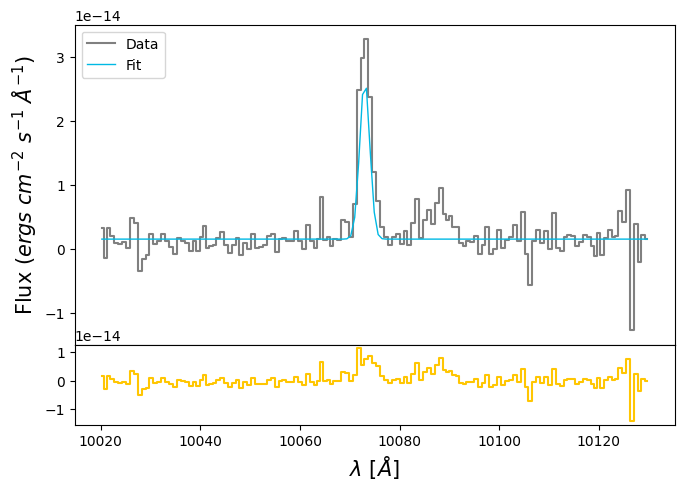

In [120]:
siiia_tot_flux = out_siiia.flatchain.Siiia_tot.mean()
siiia_tot_std = out_siiia.flatchain.Siiia_tot.std()

z_siiia = out_siiia.flatchain.z_tot.mean()
z_siiia_std = out_siiia.flatchain.z_tot.std()

bkg_siiia = out_siiia.flatchain.bkg.mean()
bkg_siiia_std = out_siiia.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(siii_9532.wavelength, siii_9532.flux,
            color='gray', label='Data', where='mid')

siiia = gaussian(siii_9532.wavelength, siiia_tot_flux, wave_cat['[SIII]9532'], z_siiia, upy.nominal_values(sigma_9532))

ax.plot(siii_9532.wavelength, bkg_siiia + siiia, lw=1, color=c[0], label='Fit')
ax1.step(siii_9532.wavelength, siii_9532.flux - bkg_siiia - siiia, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
#ax.set_yscale('log')
ax.legend(loc='upper left')

In [121]:
# EW
EW_SIII_9532 = ufloat(siiia_tot_flux, siiia_tot_std)/ ufloat(bkg_siiia, bkg_siiia_std)

# [SIII]9069

In [122]:
sigma_arc_9069 = (m * wave_cat['[SIII]9069']*(1 + z_BN[igal])) + n

sigma_9069 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_9069**2))

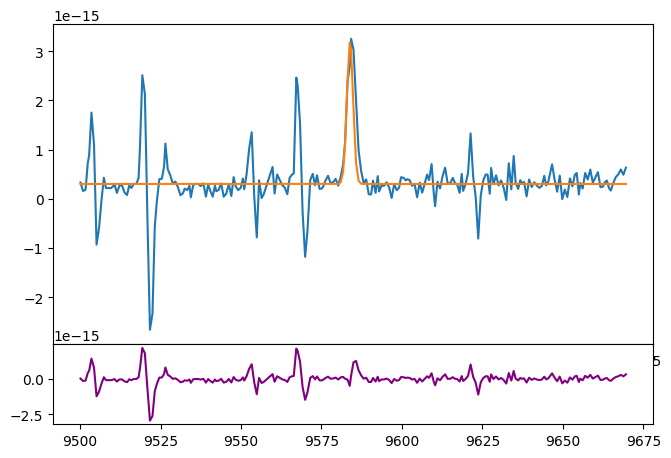

In [123]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(siii_9069.wavelength, siii_9069.flux)
bkg = 3e-16

siiib_tot = gaussian(siii_9069.wavelength, 7e-15, wave_cat['[SIII]9069'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_9069))

ax.plot(siii_9069.wavelength, bkg + siiib_tot)
ax1.plot(siii_9069.wavelength, siii_9069.flux - bkg - siiib_tot, color='purple')
#ax.set_yscale('log')

In [124]:
params_siiib = Parameters()
params_siiib.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_siiib.add('sigma_tot', value=upy.nominal_values(sigma_9069), vary=False)
params_siiib.add('Siiib_tot', value=7.0e-15, min=0.)
params_siiib.add('bkg', value=3e-16, min=0.)


def residual_siiib(params_siiib, x, data, uncertainty):
    
    z_tot = params_siiib['z_tot']
    sigma_tot = params_siiib['sigma_tot']
    siiib_tot_flux = params_siiib['Siiib_tot']
    bkg = params_siiib['bkg']
    
    x = siii_9069.wavelength
    model = gaussian(x, siiib_tot_flux, wave_cat['[SIII]9069'], z_tot, sigma_tot)
    
    return (model + bkg - siii_9069.flux) / siii_9069.noise

In [125]:
np.random.seed(1146)
out_siiib = minimize(residual_siiib, params_siiib, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:56<00:00, 44.56it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [30.45875994 50.19702144 33.82125732]


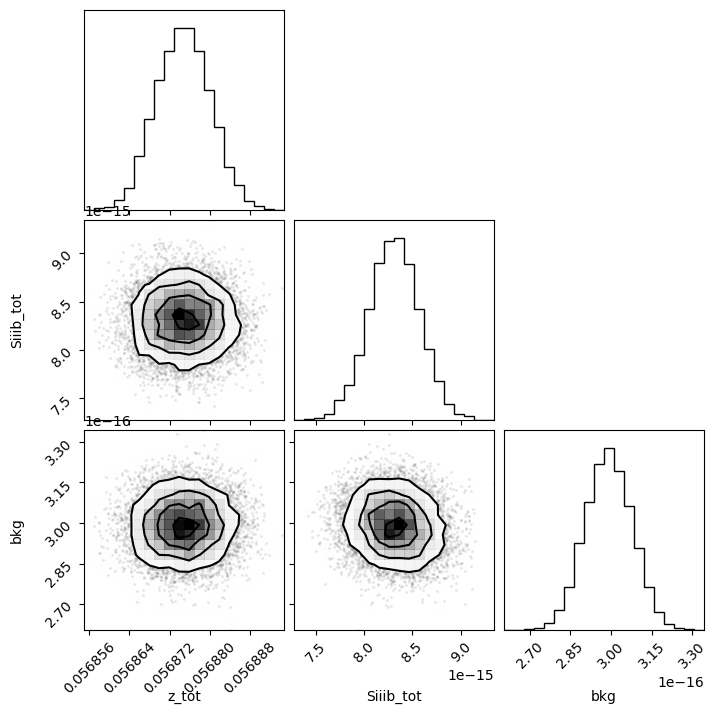

In [126]:
corner.corner(out_siiib.flatchain, labels=out_siiib.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [127]:
out_siiib.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05687473,5.4255e-06,(0.01%),0.05681744694523519,-inf,inf,True
sigma_tot,0.96769194,,,0.9676919389095024,-inf,inf,False
Siiib_tot,8.3141e-15,2.5658e-16,(3.09%),7e-15,0.00000000,inf,True
bkg,2.9919e-16,8.7662e-18,(2.93%),3e-16,0.00000000,inf,True


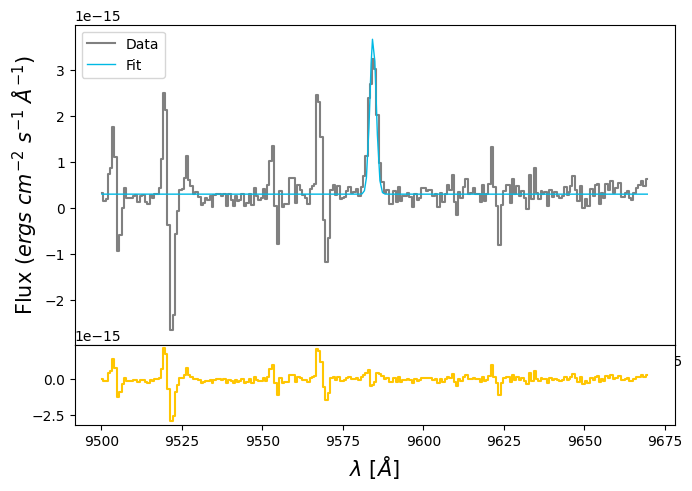

In [128]:
siiib_tot_flux = out_siiib.flatchain.Siiib_tot.mean()
siiib_tot_std = out_siiib.flatchain.Siiib_tot.std()

z_siiib = out_siiib.flatchain.z_tot.mean()
z_siiib_std = out_siiib.flatchain.z_tot.std()

bkg_siiib = out_siiib.flatchain.bkg.mean()
bkg_siiib_std = out_siiib.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(siii_9069.wavelength, siii_9069.flux,
            color='gray', label='Data', where='mid')

siiib = gaussian(siii_9069.wavelength, siiib_tot_flux, wave_cat['[SIII]9069'], z_siiib, upy.nominal_values(sigma_9069))

ax.plot(siii_9069.wavelength, bkg_siiib + siiib, lw=1, color=c[0], label='Fit')
ax1.step(siii_9069.wavelength, siii_9069.flux - bkg_siiib - siiib, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
#ax.set_yscale('log')
ax.legend(loc='upper left')

In [129]:
# EW
EW_SIII_9069 = ufloat(siiib_tot_flux, siiib_tot_std)/ ufloat(bkg_siiib, bkg_siiib_std)

# [OI]6300 + [SIII]6312

In [130]:
sigma_arc_6312 = (m * wave_cat['[SIII]6312']*(1 + z_BN[igal])) + n

sigma_6312 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_6312**2))

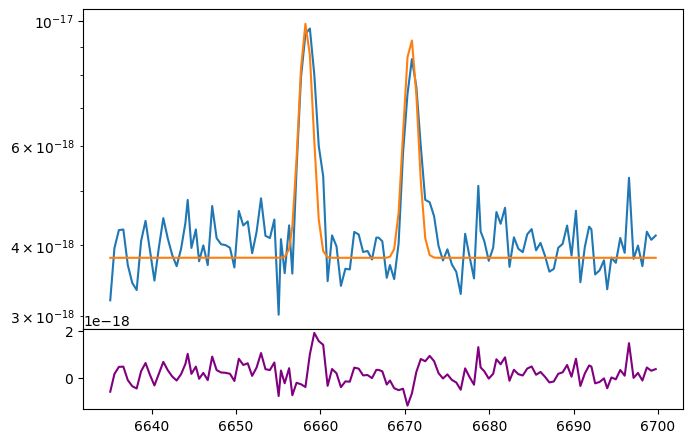

In [131]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oi_siii.wavelength, oi_siii.flux)
bkg = 3.8e-18

oi_tot = gaussian(oi_siii.wavelength, 1.1e-17, wave_cat['[OI]6300'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_6312))
siiic_tot = gaussian(oi_siii.wavelength, 1e-17, wave_cat['[SIII]6312'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_6312))

ax.plot(oi_siii.wavelength, bkg + siiic_tot + oi_tot)
ax1.plot(oi_siii.wavelength, oi_siii.flux - bkg - siiic_tot - oi_tot, color='purple')
ax.set_yscale('log')

In [132]:
params_oi_siii = Parameters()
params_oi_siii.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_oi_siii.add('sigma_tot', value=upy.nominal_values(sigma_6312), vary=False)
params_oi_siii.add('Oi_tot', value=1.1e-17, min=0.)
params_oi_siii.add('Siiic_tot', value=0.9e-17, min=0.)
params_oi_siii.add('bkg', value=3.8e-18, min=0.)


def residual_oi_siii(params_oi_siii, x, data, uncertainty):
    
    z_tot = params_oi_siii['z_tot']
    sigma_tot = params_oi_siii['sigma_tot']
    oi_tot = params_oi_siii['Oi_tot']
    siiic_tot = params_oi_siii['Siiic_tot']
    bkg = params_oi_siii['bkg']
    
    x = oi_siii.wavelength
    model_oi = gaussian(x, oi_tot, wave_cat['[OI]6300'], z_tot, sigma_tot)
    model_siii = gaussian(x, siiic_tot, wave_cat['[SIII]6312'], z_tot, sigma_tot)
    
    return (model_siii + model_oi + bkg - oi_siii.flux) / oi_siii.noise

In [133]:
np.random.seed(1146)
out_oi_siii = minimize(residual_oi_siii, params_oi_siii, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:08<00:00, 36.24it/s]


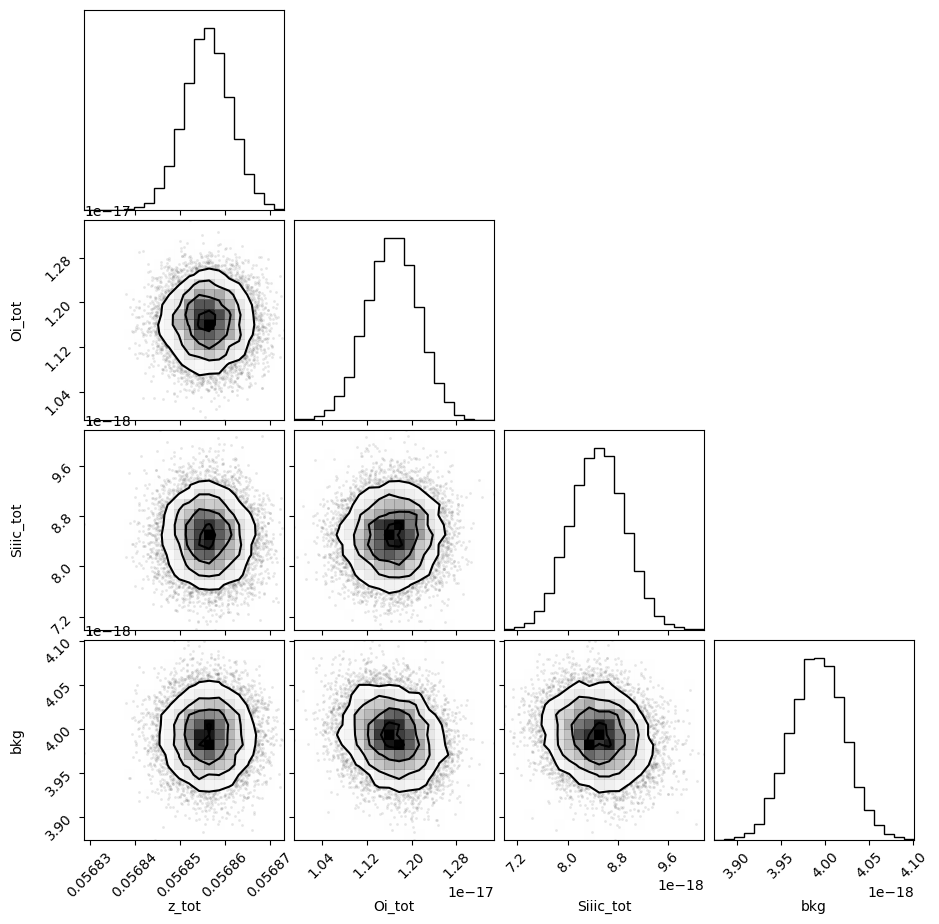

In [134]:
corner.corner(out_oi_siii.flatchain, labels=out_oi_siii.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [135]:
out_oi_siii.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05685620,5.0980e-06,(0.01%),0.05681744694523519,-inf,inf,True
sigma_tot,0.72076378,,,0.7207637805651967,-inf,inf,False
Oi_tot,1.1665e-17,4.6049e-19,(3.95%),1.1e-17,0.00000000,inf,True
Siiic_tot,8.4869e-18,4.3298e-19,(5.10%),9e-18,0.00000000,inf,True
bkg,3.9919e-18,3.0502e-20,(0.76%),3.8e-18,0.00000000,inf,True


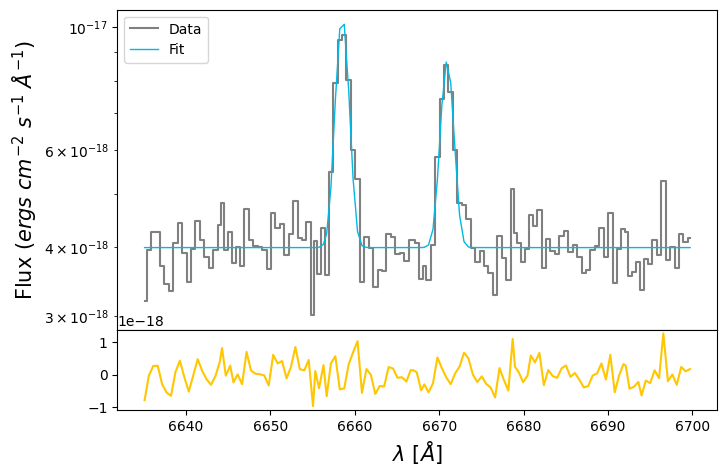

In [136]:
oi_tot_flux = out_oi_siii.flatchain.Oi_tot.mean()
oi_tot_std = out_oi_siii.flatchain.Oi_tot.std()

siiic_tot_flux = out_oi_siii.flatchain.Siiic_tot.mean()
siiic_tot_std = out_oi_siii.flatchain.Siiic_tot.std()

z_oi_siii = out_oi_siii.flatchain.z_tot.mean()
z_oi_siii_std = out_oi_siii.flatchain.z_tot.std()

bkg_oi_siii = out_oi_siii.flatchain.bkg.mean()
bkg_oi_siii_std = out_oi_siii.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oi_siii.wavelength, oi_siii.flux,
            color='gray', label='Data', where='mid')

oi = gaussian(oi_siii.wavelength, oi_tot_flux, wave_cat['[OI]6300'], z_oi_siii, upy.nominal_values(sigma_6312))
siiic = gaussian(oi_siii.wavelength, siiic_tot_flux, wave_cat['[SIII]6312'], z_oi_siii, upy.nominal_values(sigma_6312))

ax.plot(oi_siii.wavelength, bkg_oi_siii + siiic + oi,
        lw=1, color=c[0], label='Fit')
ax1.plot(oi_siii.wavelength, oi_siii.flux - bkg_oi_siii - siiic - oi,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [137]:
# EW
EW_OI_6300 = ufloat(oi_tot_flux, oi_tot_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)
EW_SIII_6312 = ufloat(siiic_tot_flux, siiic_tot_std) / ufloat(bkg_oi_siii, bkg_oi_siii_std)

# [OIII]5007 + HeI 5015

In [138]:
sigma_arc_5007 = (m * wave_cat['[OIII]5007']*(1 + z_BN[igal])) + n

sigma_5007 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_5007**2))

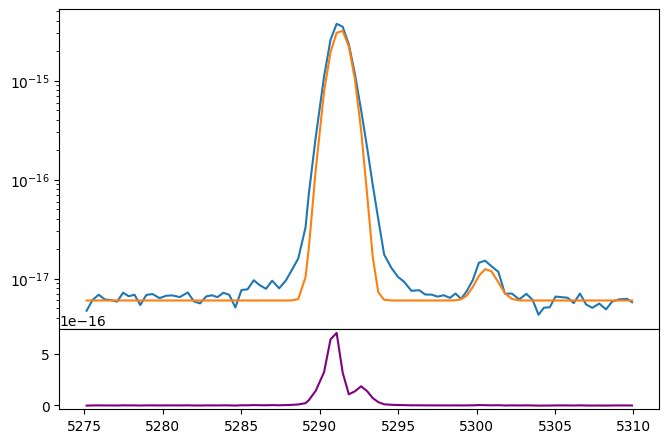

In [139]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_hei.wavelength, oiii_hei.flux)
bkg = 6e-18

oiiia_tot = gaussian(oiii_hei.wavelength, 5e-15, wave_cat['[OIII]5007'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_5007))

hei_5015 = gaussian(oiii_hei.wavelength, 1e-17, wave_cat['HeI5015'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_5007))

ax.plot(oiii_hei.wavelength, bkg + oiiia_tot + hei_5015)
ax1.plot(oiii_hei.wavelength, oiii_hei.flux - bkg - oiiia_tot - hei_5015, color='purple')
ax.set_yscale('log')

In [140]:
params_oiii_hei = Parameters()
params_oiii_hei.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_oiii_hei.add('sigma_tot', value=upy.nominal_values(sigma_5007), vary=False)
params_oiii_hei.add('Hei', value=1e-17, min=0.)
params_oiii_hei.add('Oiiia_tot', value=5.0e-15, min=0.)
params_oiii_hei.add('bkg', value=6e-18, min=0.)


def residual_oiii_hei(params_oiii_hei, x, data, uncertainty):
    
    z_tot = params_oiii_hei['z_tot']
    sigma_tot = params_oiii_hei['sigma_tot']
    oiiia_tot = params_oiii_hei['Oiiia_tot']
    hei = params_oiii_hei['Hei']
    bkg = params_oiii_hei['bkg']
    
    x = oiii_hei.wavelength
    model_oiii = gaussian(x, oiiia_tot, wave_cat['[OIII]5007'], z_tot, sigma_tot)
    model_hei = gaussian(x, hei, wave_cat['HeI5015'], z_tot, sigma_tot)
    
    return (model_oiii + model_hei + bkg - oiii_hei.flux) / oiii_hei.noise

In [141]:
np.random.seed(1146)
out_oiii_hei = minimize(residual_oiii_hei, params_oiii_hei, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [01:07<00:00, 37.05it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [ 50.24021282  78.18368816  72.6705525  108.69229281]


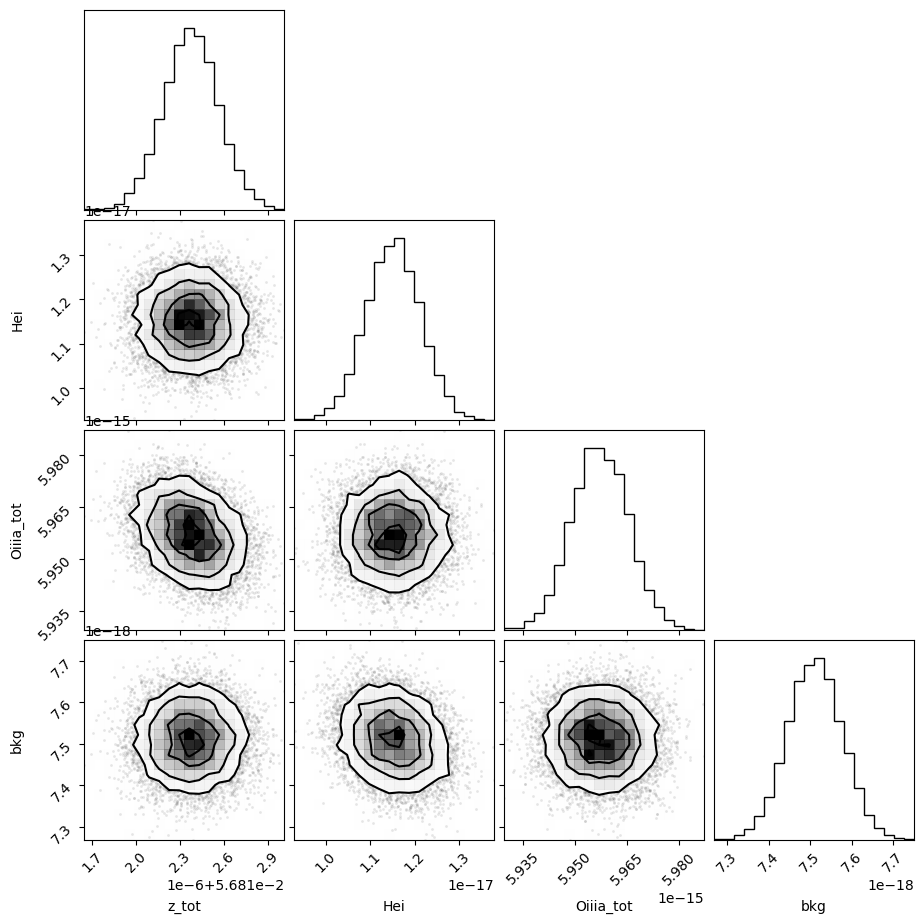

In [142]:
corner.corner(out_oiii_hei.flatchain, labels=out_oiii_hei.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [143]:
out_oiii_hei.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05681237,1.8680e-07,(0.00%),0.05681744694523519,-inf,inf,True
sigma_tot,0.60952552,,,0.6095255238600736,-inf,inf,False
Hei,1.1524e-17,6.0398e-19,(5.24%),1e-17,0.00000000,inf,True
Oiiia_tot,5.9572e-15,8.0643e-18,(0.14%),5e-15,0.00000000,inf,True
bkg,7.5119e-18,6.5776e-20,(0.88%),6e-18,0.00000000,inf,True


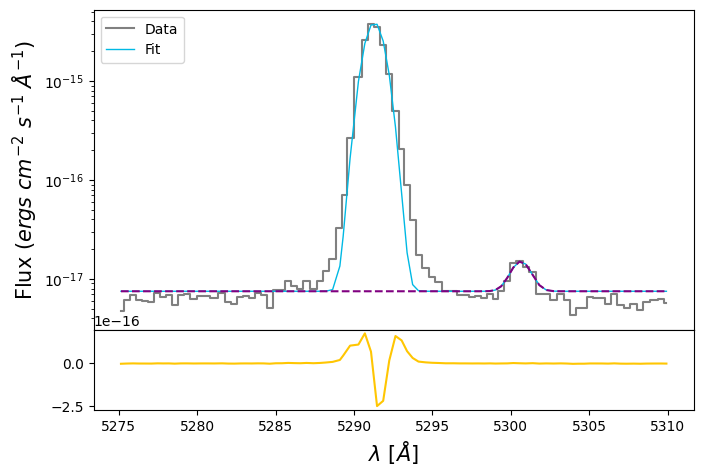

In [144]:
hei_flux = out_oiii_hei.flatchain.Hei.mean()
hei_std = out_oiii_hei.flatchain.Hei.std()

oiiia_tot_flux = out_oiii_hei.flatchain.Oiiia_tot.mean()
oiiia_tot_std = out_oiii_hei.flatchain.Oiiia_tot.std()

z_oiii_hei = out_oiii_hei.flatchain.z_tot.mean()
z_oiii_hei_std = out_oiii_hei.flatchain.z_tot.std()

bkg_oiii_hei = out_oiii_hei.flatchain.bkg.mean()
bkg_oiii_hei_std = out_oiii_hei.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_hei.wavelength, oiii_hei.flux,
            color='gray', label='Data', where='mid')

hei = gaussian(oiii_hei.wavelength, hei_flux, wave_cat['HeI5015'], z_oiii_hei, upy.nominal_values(sigma_5007))
oiiia = gaussian(oiii_hei.wavelength, oiiia_tot_flux, wave_cat['[OIII]5007'], z_oiii_hei, upy.nominal_values(sigma_5007))

ax.plot(oiii_hei.wavelength, bkg_oiii_hei + oiiia + hei,
        lw=1, color=c[0], label='Fit')
ax.plot(oiii_hei.wavelength, bkg_oiii_hei + hei, ls='--', color='purple')

ax1.plot(oiii_hei.wavelength, oiii_hei.flux - bkg_oiii_hei - oiiia - hei,
         color=c[3])
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [145]:
# EW
EW_OIII_5007 = ufloat(oiiia_tot_flux, oiiia_tot_std) / ufloat(bkg_oiii_hei, bkg_oiii_hei_std)

# [OIII]4363

In [146]:
sigma_arc_4363 = (m * wave_cat['[OIII]4363']*(1 + z_BN[igal])) + n

sigma_4363 = upy.sqrt((sigma_intrinsic**2) + (sigma_arc_4363**2))

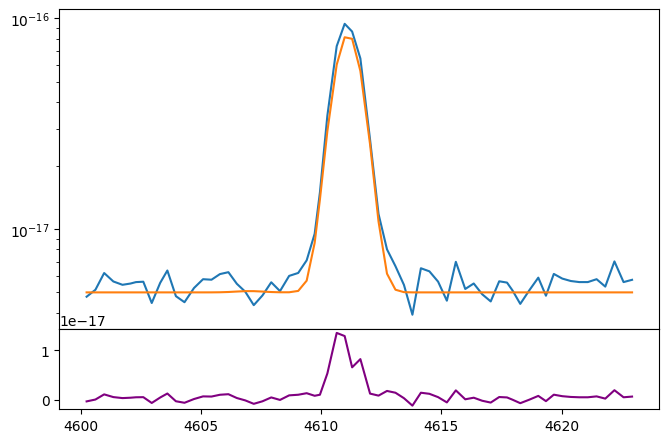

In [147]:
# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.plot(oiii_4363.wavelength, oiii_4363.flux)
bkg = 5e-18

feii_4360 = gaussian(oiii_4363.wavelength, 0.1e-18, wave_cat['[FeII]4360'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_4363))
oiiic_tot = gaussian(oiii_4363.wavelength, 1.1e-16, wave_cat['[OIII]4363'], z=z_tot_oiii_4959, sigma=upy.nominal_values(sigma_4363))

ax.plot(oiii_4363.wavelength, bkg + oiiic_tot + feii_4360)
ax1.plot(oiii_4363.wavelength, oiii_4363.flux - bkg - oiiic_tot - feii_4360, color='purple')
ax.set_yscale('log')

In [148]:
params_oiiic = Parameters()

params_oiiic.add('z_tot', value=z_tot_oiii_4959, vary=True)
params_oiiic.add('sigma_tot', value=upy.nominal_values(sigma_4363), vary=False)
params_oiiic.add('Feii_4360_tot', value=0.1e-18, min=0.)
params_oiiic.add('Oiiic_tot', value=1.1e-16, min=0.)
params_oiiic.add('bkg', value=5e-18, min=0.)


def residual_oiiic(params_oiiic, x, data, uncertainty):
    
    z_tot = params_oiiic['z_tot']
    sigma_tot = params_oiiic['sigma_tot']
    feii_4360_flux = params_oiiic['Feii_4360_tot']
    oiiic_tot_flux = params_oiiic['Oiiic_tot']
    bkg = params_oiiic['bkg']
    
    x = oiii_4363.wavelength
    model = gaussian(x, feii_4360_flux, wave_cat['[FeII]4360'], z_tot, sigma_tot) + \
            gaussian(x, oiiic_tot_flux, wave_cat['[OIII]4363'], z_tot, sigma_tot)
    
    return (model + bkg - oiii_4363.flux) / oiii_4363.noise

In [149]:
np.random.seed(1146)
out_oiiic = minimize(residual_oiiic, params_oiiic, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10, nwalkers=100)

100%|███████████████████████████████████████| 2500/2500 [00:55<00:00, 44.96it/s]


The chain is shorter than 50 times the integrated autocorrelation time for 3 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 50;
tau: [38.361033   55.78541582 69.99324186 60.9310549 ]


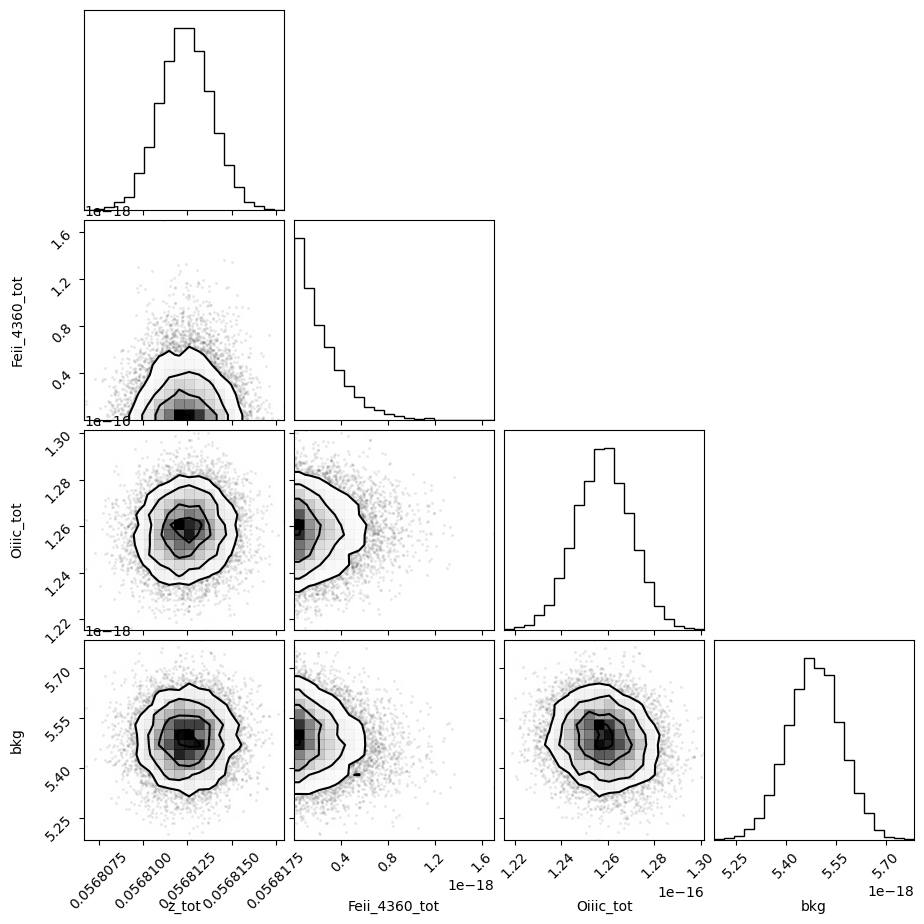

In [150]:
corner.corner(out_oiiic.flatchain, labels=out_oiiic.var_names);
#plt.savefig(fname='corner_ha.jpg', bbox_inches='tight')

In [151]:
out_oiiic.params

name,value,standard error,relative error,initial value,min,max,vary
z_tot,0.05681240,1.4373e-06,(0.00%),0.05681744694523519,-inf,inf,True
sigma_tot,0.55699719,,,0.55699719313318,-inf,inf,False
Feii_4360_tot,1.6947e-19,1.8452e-19,(108.88%),1e-19,0.00000000,inf,True
Oiiic_tot,1.2582e-16,1.1958e-18,(0.95%),1.1e-16,0.00000000,inf,True
bkg,5.4865e-18,8.0955e-20,(1.48%),5e-18,0.00000000,inf,True


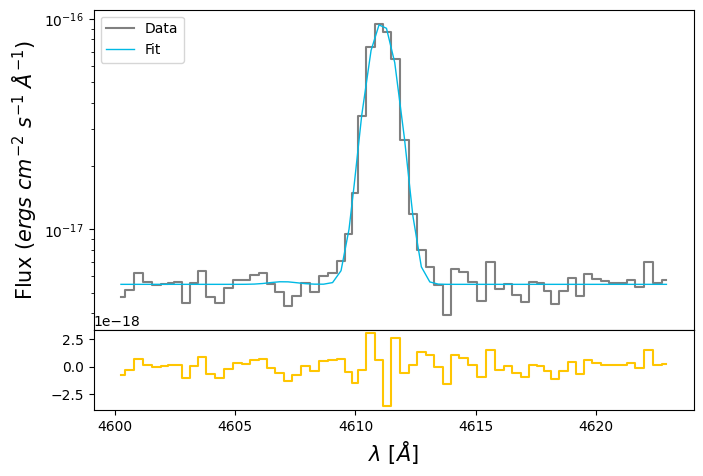

In [152]:
oiiic_tot_flux = out_oiiic.flatchain.Oiiic_tot.mean()
oiiic_tot_std = out_oiiic.flatchain.Oiiic_tot.std()

feii_4360_flux = out_oiiic.flatchain.Feii_4360_tot.mean()
feii_4360_std = out_oiiic.flatchain.Feii_4360_tot.std()

z_oiii = out_oiiic.flatchain.z_tot.mean()
z_oiii_std = out_oiiic.flatchain.z_tot.std()

bkg_oiiic = out_oiiic.flatchain.bkg.mean()
bkg_oiiic_std = out_oiiic.flatchain.bkg.std()

# Search for good initial guess

fig = plt.figure(1)
fig.set_size_inches(6, 4)
ax = fig.add_axes((0, .2, 1, .8))
ax1 = fig.add_axes((0, 0, 1, .2))

ax.step(oiii_4363.wavelength, oiii_4363.flux,
            color='gray', label='Data', where='mid')

feii_4360 = gaussian(oiii_4363.wavelength, feii_4360_flux, wave_cat['[FeII]4360'], z_oiii, upy.nominal_values(sigma_4363))
oiiic = gaussian(oiii_4363.wavelength, oiiic_tot_flux, wave_cat['[OIII]4363'], z_oiii, upy.nominal_values(sigma_4363))

ax.plot(oiii_4363.wavelength, bkg_oiiic + oiiic + feii_4360, lw=1, color=c[0], label='Fit')
ax1.step(oiii_4363.wavelength, oiii_4363.flux - bkg_oiiic - oiiic - feii_4360, color=c[3], where='mid')
ax.set_ylabel(r'Flux ($ergs\ cm^{-2}\  s^{-1}\ \AA^{-1}$)', fontsize=15)
ax1.set_xlabel(r'$\lambda$ [$\AA$]', fontsize=15)
ax.set_yscale('log')
ax.legend(loc='upper left')

In [153]:
# EW
EW_OIII_4363 = ufloat(oiiic_tot_flux, oiiic_tot_std) / ufloat(bkg_oiiic, bkg_oiiic_std)

# Balmer decrements

In [154]:
from magE.functions import *
from magE.functions import calzetti2000 as k_cal

flux_ha_bal = ufloat(out_ha_nii.flatchain.Ha_tot.mean(), out_ha_nii.flatchain.Ha_tot.std())
flux_hb_bal = ufloat(out_hb.flatchain.Hb_tot.mean(), out_hb.flatchain.Hb_tot.std())
flux_hg_bal = ufloat(out_hg.flatchain.Hg_tot.mean(), out_hg.flatchain.Hg_tot.std())
flux_hd_bal = ufloat(out_hd.flatchain.Hd_tot.mean(), out_hd.flatchain.Hd_tot.std())

y_balmer = upy.log10([(flux_ha_bal / flux_hb_bal) / 2.86, 
                    (flux_hb_bal / flux_hb_bal) / 1.0,
                    (flux_hg_bal / flux_hb_bal) / 0.464,
                    (flux_hd_bal / flux_hb_bal) / 0.256])

x_balmer = np.array([k_cal(wave_cat['Ha']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hb']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hg']) - k_cal(wave_cat['Hb']),
                     k_cal(wave_cat['Hd']) - k_cal(wave_cat['Hb'])])

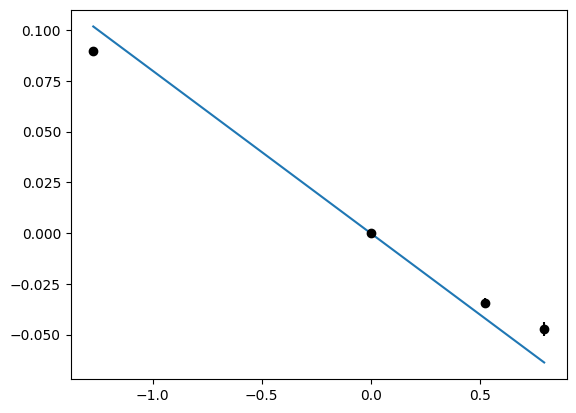

In [155]:
plt.errorbar(x_balmer, upy.nominal_values(y_balmer), upy.std_devs(y_balmer),
            ls='', color='black', marker='o')
plt.plot(x_balmer, x_balmer * (-0.4 * 0.2))

In [156]:
params_balmer = Parameters()
params_balmer.add('slope', value=0.4 * 0.2, min=0.)

def residuals_balmer(params_balmer, x, data, uncertainty):
    
    slope = params_balmer['slope']
    x = x_balmer
    
    model = x * (-slope)
    return (model - upy.nominal_values(y_balmer)) / 0.05

np.random.seed(1146)
out_balmer = minimize(residuals_balmer, params_balmer, args=(1, 1, 1),
                      method='emcee', burn=1500, steps=2500, thin=10)

100%|███████████████████████████████████████| 2500/2500 [00:36<00:00, 68.37it/s]


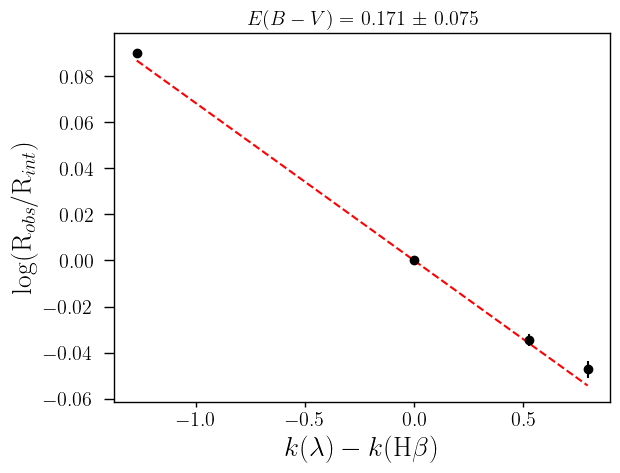

In [157]:
color_excess = ufloat(out_balmer.flatchain.slope.mean(), out_balmer.flatchain.slope.std()) / 0.4
E_BV = out_balmer.flatchain.slope.mean() / 0.4

texPlot('on')
plt.errorbar(x_balmer, upy.nominal_values(y_balmer), upy.std_devs(y_balmer),
            ls='', color='black', marker='o')
plt.plot(x_balmer, - E_BV * 0.4 * x_balmer, ls='--', color='red')
plt.ylabel(r'log(R$_{obs}$/R$_{int}$)')
plt.xlabel(r'$k(\lambda) - k($H$\beta)$')
plt.title(r'$E(B-V) = $ '+str(round(color_excess.nominal_value, 3))+' $\pm$ '+str(round(color_excess.std_dev, 3)))
plt.savefig('/home/benjamin/Documents/analogs/results/balmer_decrements/bal_dec_J1146.pdf', bbox_inches='tight')

In [158]:
decrement_dict = {'galname': galname,
                 'Ha/Hb': (flux_ha_bal / flux_hb_bal).nominal_value,
                 'Ha/Hb_err': (flux_ha_bal / flux_hb_bal).std_dev,
                 'Hg/Hb': (flux_hg_bal / flux_hb_bal).nominal_value,
                 'Hg/Hb_err': (flux_hg_bal / flux_hb_bal).std_dev,
                 'Hd/Hb': (flux_hd_bal / flux_hb_bal).nominal_value,
                 'Hd/Hb_err': (flux_hd_bal / flux_hb_bal).std_dev,
                 'E_BV': out_balmer.flatchain.slope.mean() / 0.4,
                 'E_BV_err': out_balmer.flatchain.slope.std() / 0.4
                 }
decrement_dict_pd = pd.DataFrame(data=decrement_dict, index=[0])
save_catalog(galname, decrement_dict_pd, magePath + '/results/bal_decrements.csv')

Existent catalog (.csv) file.
Existent data for J1146, overwriting...
Done.


# Temperatures

In [159]:
heiia_tot_chain = out_heii4685.flatchain.Heii4685_tot * 10**(0.4 * E_BV * k_cal(wave_cat['HeII4685']))

heia_tot_chain = out_hei7065.flatchain.Hei7065_tot * 10**(0.4 * E_BV * k_cal(wave_cat['HeI7065']))

heib_tot_chain = out_hei6678.flatchain.Hei6678_tot * 10**(0.4 * E_BV * k_cal(wave_cat['HeI6678']))

heic_tot_chain = out_hei5875.flatchain.Hei5875_tot * 10**(0.4 * E_BV * k_cal(wave_cat['HeI5875']))

heid_tot_chain = out_hei4471.flatchain.Hei4471_tot * 10**(0.4 * E_BV * k_cal(wave_cat['HeI4471']))

oiiia_tot_chain = out_oiii_hei.flatchain.Oiiia_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]5007']))

oiiib_tot_chain = out_oiii_4959.flatchain.Oiiib_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4959']))

oiiic_tot_chain = out_oiiic.flatchain.Oiiic_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[OIII]4363']))

siia_tot_chain = out_sii.flatchain.Siia_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6730']))

siib_tot_chain = out_sii.flatchain.Siib_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[SII]6716']))

oiia_tot_chain = out_oii_7320.flatchain.Oiia_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7330']))

oiib_tot_chain = out_oii_7320.flatchain.Oiib_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]7319']))

oiic_tot_chain = out_oii_3727.flatchain.Oiic_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3729']))

oiid_tot_chain = out_oii_3727.flatchain.Oiid_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[OII]3726']))

siiia_tot_chain = out_siiia.flatchain.Siiia_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9532']))

siiib_tot_chain = out_siiib.flatchain.Siiib_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]9069']))

siiic_tot_chain = out_oi_siii.flatchain.Siiic_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[SIII]6312']))

niia_tot_chain = out_ha_nii.flatchain.Niia_tot * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6584']))

niib_tot_chain = out_ha_nii.flatchain.Niia_tot * out_ha_nii.flatchain.Niib_to_niia * 10**(0.4 * E_BV * k_cal(wave_cat['[NII]6548']))

hb_tot_chain = out_hb.flatchain.Hb_tot * 10**(0.4 * E_BV * k_cal(wave_cat['Hb']))

hg_tot_chain = out_hg.flatchain.Hg_tot * 10**(0.4 * E_BV * k_cal(wave_cat['Hg']))

hd_tot_chain = out_hd.flatchain.Hd_tot * 10**(0.4 * E_BV * k_cal(wave_cat['Hd']))

ha_tot_chain = out_ha_nii.flatchain.Ha_tot * 10**(0.4 * E_BV * k_cal(wave_cat['Ha']))

In [226]:
chains_dict = {'[OII]3726_nar': np.nan * np.ones(10000),
               '[OII]3726_brd': np.nan * np.ones(10000),
               '[OII]3726': oiid_tot_chain.to_numpy(),
               
               '[OII]3729_nar': np.nan * np.ones(10000),
               '[OII]3729_brd': np.nan * np.ones(10000),
               '[OII]3729': oiic_tot_chain.to_numpy(),
               
               'Hd_nar': np.nan * np.ones(10000),
               'Hd_brd': np.nan * np.ones(10000),
               'Hd': hd_tot_chain.to_numpy(),
               
               'Hg_nar': np.nan * np.ones(10000),
               'Hg_brd': np.nan * np.ones(10000),
               'Hg': hg_tot_chain.to_numpy(),
               
               '[OIII]4363_nar': np.nan * np.ones(10000),
               '[OIII]4363_brd': np.nan * np.ones(10000),
               '[OIII]4363': oiiic_tot_chain.to_numpy(),
               
               'HeI4471_nar': np.nan * np.ones(10000),
               'HeI4471_brd': np.nan * np.ones(10000),
               'HeI4471': heid_tot_chain.to_numpy(),
               
               'HeII4686_nar': np.nan * np.ones(10000),
               'HeII4686_brd': np.nan * np.ones(10000),
               'HeII4686': heiia_tot_chain.to_numpy(),
               
               'Hb_nar': np.nan * np.ones(10000),
               'Hb_brd': np.nan * np.ones(10000),
               'Hb': hb_tot_chain.to_numpy(),
               
               '[OIII]4959_nar': np.nan * np.ones(10000),
               '[OIII]4959_brd': np.nan * np.ones(10000),
               '[OIII]4959': oiiib_tot_chain.to_numpy(),
               
               '[OIII]5007_nar': np.nan * np.ones(10000),
               '[OIII]5007_brd': np.nan * np.ones(10000),
               '[OIII]5007': oiiia_tot_chain.to_numpy(),
               
               '[NII]5755_nar': np.nan * np.ones(10000),
               '[NII]5755_brd': np.nan * np.ones(10000),
               '[NII]5755': np.nan * np.ones(10000),
               
               'HeI5875_nar': np.nan * np.ones(10000),
               'HeI5875_brd': np.nan * np.ones(10000),
               'HeI5875': heic_tot_chain.to_numpy(),
               
               '[SIII]6312_nar': np.nan * np.ones(10000),
               '[SIII]6312_brd': np.nan * np.ones(10000),
               '[SIII]6312': siiic_tot_chain.to_numpy(),
               
               '[NII]6548_nar': np.nan * np.ones(10000),
               '[NII]6548_brd': np.nan * np.ones(10000),
               '[NII]6548': niib_tot_chain.to_numpy(),
               
               'Ha_nar': np.nan * np.ones(10000),
               'Ha_brd': np.nan * np.ones(10000),
               'Ha': ha_tot_chain.to_numpy(),
               
               '[NII]6584_nar': np.nan * np.ones(10000),
               '[NII]6584_brd': np.nan * np.ones(10000),
               '[NII]6584': niia_tot_chain.to_numpy(),
               
               'HeI6678_nar': np.nan * np.ones(10000),
               'HeI6678_brd': np.nan * np.ones(10000),
               'HeI6678': heib_tot_chain.to_numpy(),
               
               '[SII]6716_nar': np.nan * np.ones(10000),
               '[SII]6716_brd': np.nan * np.ones(10000),
               '[SII]6716': siib_tot_chain.to_numpy(),
               
               '[SII]6730_nar': np.nan * np.ones(10000),
               '[SII]6730_brd': np.nan * np.ones(10000),
               '[SII]6730': siia_tot_chain.to_numpy(),
               
               'HeI7065_nar': np.nan * np.ones(10000),
               'HeI7065_brd': np.nan * np.ones(10000),
               'HeI7065': heia_tot_chain.to_numpy(),
               
               '[OII]7319_nar': np.nan * np.ones(10000),
               '[OII]7319_brd': np.nan * np.ones(10000),
               '[OII]7319': oiib_tot_chain.to_numpy(),
               
               '[OII]7330_nar': np.nan * np.ones(10000),
               '[OII]7330_brd': np.nan * np.ones(10000),
               '[OII]7330': oiia_tot_chain.to_numpy(),
               
               '[SIII]9069_nar': np.nan * np.ones(10000),
               '[SIII]9069_brd': np.nan * np.ones(10000),
               '[SIII]9069': siiib_tot_chain.to_numpy(),
               
               '[SIII]9532_nar': np.nan * np.ones(10000),
               '[SIII]9532_brd': np.nan * np.ones(10000),
               '[SIII]9532': siiia_tot_chain.to_numpy()
}
chains_dict_pd = pd.DataFrame(data=chains_dict, index=None)
chains_dict_pd.to_csv('/home/benjamin/Documents/chains/chains_J1146.csv')
#save_catalog(galname, chains_dict_pd, '/home/benjamin/Documents/chains/chains_J0021.csv')

In [160]:
lines_dict = {'galname': galname,
              '[OII]3726': oiid_tot_chain.mean(),
              '[OII]3726_err': oiid_tot_chain.std(),
              '[OII]3729': oiic_tot_chain.mean(),
              '[OII]3729_err': oiic_tot_chain.std(),
              'Hd': hd_tot_chain.mean(),
              'Hd_err': hd_tot_chain.std(),
              'Hg': hg_tot_chain.mean(),
              'Hg_err': hg_tot_chain.std(),
              '[OIII]4363': oiiic_tot_chain.mean(),
              '[OIII]4363_err': oiiic_tot_chain.std(),
              'HeI4471': heid_tot_chain.mean(),
              'HeI4471_err': heid_tot_chain.std(),
              'HeII4686': heiia_tot_chain.mean(),
              'HeII4686_err': heiia_tot_chain.std(),
              'Hb': hb_tot_chain.mean(),
              'Hb_err': hb_tot_chain.std(),
              '[OIII]4959': oiiib_tot_chain.mean(),
              '[OIII]4959_err': oiiib_tot_chain.std(),
              '[OIII]5007': oiiia_tot_chain.mean(),
              '[OIII]5007_err': oiiia_tot_chain.std(),
              '[NII]5575': None,
              '[NII]5575_err': None,
              'HeI5875': heic_tot_chain.mean(),
              'HeI5875_err': heic_tot_chain.std(),
              '[SIII]6312': siiic_tot_chain.mean(),
              '[SIII]6312_err': siiic_tot_chain.std(),
              '[NII]6548': niib_tot_chain.mean(),
              '[NII]6548_err': niib_tot_chain.std(),
              'Ha': ha_tot_chain.mean(),
              'Ha_err': ha_tot_chain.std(),
              '[NII]6584': niia_tot_chain.mean(),
              '[NII]6584_err': niia_tot_chain.std(),
              'HeI6678': heib_tot_chain.mean(),
              'HeI6678_err': heib_tot_chain.std(),
              '[SII]6716': siib_tot_chain.mean(),
              '[SII]6716_err': siib_tot_chain.std(),
              '[SII]6730': siia_tot_chain.mean(),
              '[SII]6730_err': siia_tot_chain.std(),
              'HeI7065': heia_tot_chain.mean(),
              'HeI7065_err': heia_tot_chain.std(),
              '[OII]7319': oiib_tot_chain.mean(),
              '[OII]7319_err': oiib_tot_chain.std(),
              '[OII]7330': oiia_tot_chain.mean(),
              '[OII]7330_err': oiia_tot_chain.std(),
              '[SIII]9069': None,
              '[SIII]9069_err': None,
              '[SIII]9532': None,
              '[SIII]9532_err': None
              
}
lines_dict_pd = pd.DataFrame(data=lines_dict, index=[0])
save_catalog(galname, lines_dict_pd, magePath + '/results/em_lines.csv')

Existent catalog (.csv) file.
Existent data for J1146, overwriting...
Done.


# Start here

In [1]:
# Reading decrements info

import os
import sys
magePath = '/home/benjamin/Documents/analogs/'
os.sys.path.append(magePath)

import pandas as pd
from magE.constutils import *
from magE.functions import *
from magE.plotutils import *
from magE.functions import calzetti2000 as k_cal

galname = 'J1146'

# Extinction
ext_cat = pd.read_csv(magePath+'results/bal_decrements.csv')
index = np.argmax(ext_cat['galname'] == galname)
E_BV = ext_cat['E_BV'][index]

if E_BV < 0:
    E_BV = 0

In [3]:
# Reading the chains
chains = pd.read_csv('/home/benjamin/Documents/chains/chains_J1146.csv')

In [4]:
#t_OIII_nar = TO3(chains['[OIII]5007_nar'].to_numpy(), chains['[OIII]4959_nar'].to_numpy(), chains['[OIII]4363_nar'].to_numpy())
#t_OIII_brd = TO3(chains['[OIII]5007_brd'].to_numpy(), chains['[OIII]4959_brd'].to_numpy(), chains['[OIII]4363_brd'].to_numpy())
t_OIII_tot = TO3(chains['[OIII]5007'].to_numpy()    , chains['[OIII]4959'].to_numpy()    , chains['[OIII]4363'].to_numpy())

#O2_H_nar = 10**(double_log_OH(chains['[OIII]5007_nar'].to_numpy(), chains['[OIII]4959_nar'].to_numpy(), chains['Hb_nar'].to_numpy(), t_OIII_nar) - 12)
#O2_H_brd = 10**(double_log_OH(chains['[OIII]5007_brd'].to_numpy(), chains['[OIII]4959_brd'].to_numpy(), chains['Hb_brd'].to_numpy(), t_OIII_brd) - 12)
O2_H_tot = 10**(double_log_OH(chains['[OIII]5007'].to_numpy()    , chains['[OIII]4959'].to_numpy()    , chains['Hb'].to_numpy()    , t_OIII_tot) - 12)

#IO2_R_nar = 9.36 * (t_OIII_nar**0.44) * O2_H_nar * chains['Hb_nar'].to_numpy()
#IO2_R_brd = 9.36 * (t_OIII_brd**0.44) * O2_H_brd * chains['Hb_brd'].to_numpy()
IO2_R_tot = 9.36 * (t_OIII_tot**0.44) * O2_H_tot * chains['Hb'].to_numpy()    

#den_nar = ne(chains['[SII]6730_nar'].to_numpy(), chains['[SII]6716_nar'].to_numpy(), t_OIII_nar)
#den_brd = ne(chains['[SII]6730_brd'].to_numpy(), chains['[SII]6716_brd'].to_numpy(), t_OIII_brd)
den_tot = ne(chains['[SII]6730'].to_numpy()    , chains['[SII]6716'].to_numpy()    , t_OIII_tot)

#t_OII_nar = TO2(chains['[OII]7330_nar'].to_numpy(), chains['[OII]7319_nar'].to_numpy(), chains['[OII]3729_nar'].to_numpy(), chains['[OII]3726_nar'].to_numpy(), den_nar, IO2_R_nar)
#t_OII_brd = TO2(chains['[OII]7330_brd'].to_numpy(), chains['[OII]7319_brd'].to_numpy(), chains['[OII]3729_brd'].to_numpy(), chains['[OII]3726_brd'].to_numpy(), den_brd, IO2_R_brd)
t_OII_tot = TO2(chains['[OII]7330'].to_numpy()    , chains['[OII]7319'].to_numpy()    , chains['[OII]3729'].to_numpy()    , chains['[OII]3726'].to_numpy()    , den_tot, IO2_R_tot)

# Garnett
t_OII_tot_garnett = ((0.7 * (t_OIII_tot * 10)) + 0.3) / 10

# PM17 DENSITY DEPENDENT
#t_OII_tot_PM = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))

# Linear
t_OII_tot_lin = (slope_o3o2 * t_OIII_tot) + intercept_o3o2

# Non-linear
#t_OII_tot_nlin = (2.4 / ((t_OIII_tot**-1) + 1.5))

# Polynomial
#t_OII_tot_poly = (-6.6 * t_OIII_tot) + (15.1 * (t_OIII_tot**2)) + (-8.3 * (t_OIII_tot**3)) + (0.69 * (t_OIII_tot**5))

# Square root
#t_OII_tot_sqrt = 0.3 + (0.66 * np.sqrt(t_OIII_tot))

#t_SIII_nar = TS3(chains['[SIII]9532_nar'].to_numpy(), chains['[SIII]9069_nar'].to_numpy(), chains['[SIII]6312_nar'].to_numpy())
#t_SIII_brd = TS3(chains['[SIII]9532_brd'].to_numpy(), chains['[SIII]9069_brd'].to_numpy(), chains['[SIII]6312_brd'].to_numpy())
t_SIII_tot = TS3(chains['[SIII]9532'].to_numpy()    , chains['[SIII]9069'].to_numpy()    , chains['[SIII]6312'].to_numpy()    )

(0.0, 1.0, 0.0, 1.0)

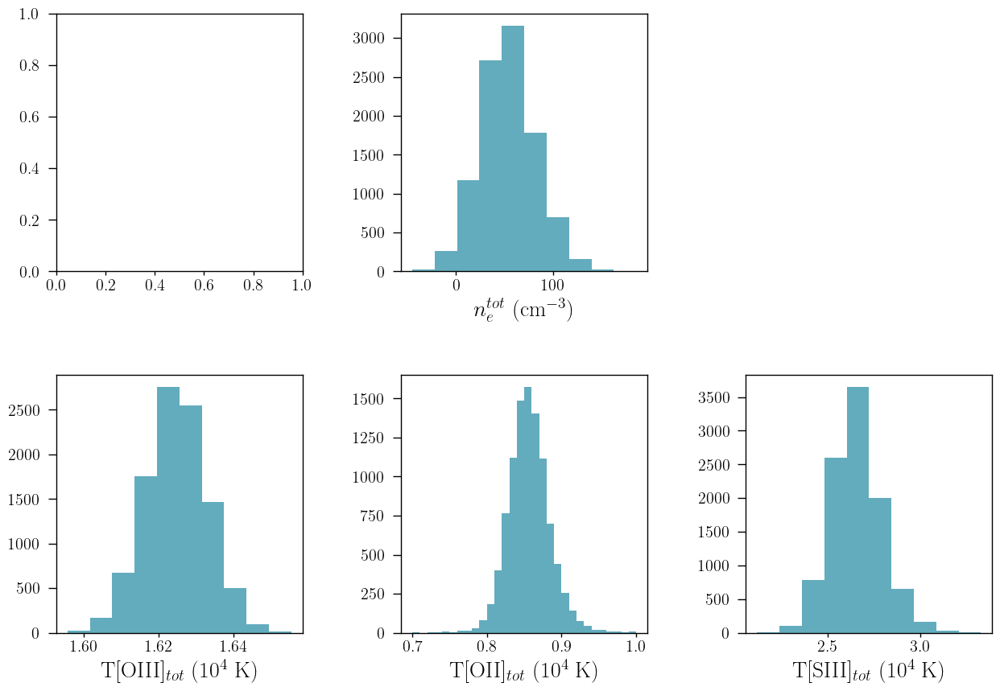

In [5]:
texPlot('on')
fig, axs = plt.subplots(2, 3)
fig.set_size_inches((15, 10))
fig.subplots_adjust(wspace=0.4, hspace=0.4)

#axs[0, 0].scatter(t_OIII_nar, t_OIII_brd, s=1, color=cr[2])
#axs[0, 0].set_xlabel(r'T[OIII]$_{narrow}$ (10$^{4}$ K)')
#axs[0, 0].set_ylabel(r'T[OIII]$_{broad}$ (10$^{4}$ K)')
#axs[0, 0].set_ylim(0, 2)

axs[1, 0].hist(t_OIII_tot, color=cr[2])
axs[1, 0].set_xlabel(r'T[OIII]$_{tot}$ (10$^{4}$ K)')

axs[0, 1].hist(den_tot, color=cr[2])
axs[0, 1].set_xlabel(r'$n_{e}^{tot}$ (cm$^{-3}$)')

axs[1, 1].hist(t_OII_tot, color=cr[2], bins=np.arange(0.7, 1.0, 0.01))
axs[1, 1].set_xlabel(r'T[OII]$_{tot}$ (10$^{4}$ K)')

axs[1, 2].hist(t_SIII_tot, color=cr[2])
axs[1, 2].set_xlabel(r'T[SIII]$_{tot}$ (10$^{4}$ K)')

axs[0, 2].axis('off')

# Using Temperature relations derived by me

In [201]:
#t_SIII_tot_temprel = (0.86 * t_OIII_tot) + 0.17

In [6]:
#t_OIII_nar_mean = np.nanpercentile(t_OIII_nar, 50)
#t_OIII_nar_16 = np.nanpercentile(t_OIII_nar, 16)
#t_OIII_nar_84 = np.nanpercentile(t_OIII_nar, 84)
#
#t_OIII_brd_mean = np.nanpercentile(t_OIII_brd, 50)
#t_OIII_brd_16 = np.nanpercentile(t_OIII_brd, 16)
#t_OIII_brd_84 = np.nanpercentile(t_OIII_brd, 84)

t_OIII_tot_mean = np.nanpercentile(t_OIII_tot, 50)
t_OIII_tot_16 = np.nanpercentile(t_OIII_tot, 16)
t_OIII_tot_84 = np.nanpercentile(t_OIII_tot, 84)

# Measured by me
t_OII = np.nanpercentile(t_OII_tot, 50)
t_OII_16 = np.nanpercentile(t_OII_tot, 16)
t_OII_84 = np.nanpercentile(t_OII_tot, 84)

# Photoionization models
t_OII_garnett = ((0.7 * (t_OIII_tot_mean * 10)) + 0.3) / 10
t_OII_garnett_16 = ((0.7 * (t_OIII_tot_16 * 10)) + 0.3) / 10
t_OII_garnett_84 = ((0.7 * (t_OIII_tot_84 * 10)) + 0.3) / 10

# Using PM
#t_OII_PM = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_mean**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))
#t_OII_PM_16 = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_16**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))
#t_OII_PM_84 = (1.2 + (0.002 * 300) + (4.2 / 300)) / ((t_OIII_tot_84**-1) + 0.08 + (0.003 * 300) + (2.5 / 300))

# Linear
t_OII_lin = (slope_o3o2 * t_OIII_tot_mean) + intercept_o3o2
t_OII_lin_16 = (slope_o3o2 * t_OIII_tot_16) + intercept_o3o2
t_OII_lin_84 = (slope_o3o2 * t_OIII_tot_84) + intercept_o3o2

# Non-linear
#t_OII_nlin = (2.4 / ((t_OIII_tot_mean**-1) + 1.5))
#t_OII_nlin_16 = (2.4 / ((t_OIII_tot_16**-1) + 1.5))
#t_OII_nlin_84 = (2.4 / ((t_OIII_tot_84**-1) + 1.5))

# Polynomial
#t_OII_poly = (-6.6 * t_OIII_tot_mean) + (15.1 * (t_OIII_tot_mean**2)) + (-8.3 * (t_OIII_tot_mean**3)) + (0.69 * (t_OIII_tot_mean**5))
#t_OII_poly_16 = (-6.6 * t_OIII_tot_16) + (15.1 * (t_OIII_tot_16**2)) + (-8.3 * (t_OIII_tot_16**3)) + (0.69 * (t_OIII_tot_16**5))
#t_OII_poly_84 = (-6.6 * t_OIII_tot_84) + (15.1 * (t_OIII_tot_84**2)) + (-8.3 * (t_OIII_tot_84**3)) + (0.69 * (t_OIII_tot_84**5))

## Square-root
#t_OII_sqrt = 0.3 + (0.66 * np.sqrt(t_OIII_tot_mean))
#t_OII_sqrt_16 = 0.3 + (0.66 * np.sqrt(t_OIII_tot_16))
#t_OII_sqrt_84 = 0.3 + (0.66 * np.sqrt(t_OIII_tot_84))

density = np.nanpercentile(den_tot, 50)
density_16 = np.nanpercentile(den_tot, 16)
density_84 = np.nanpercentile(den_tot, 84)

#t_SIII = np.nanpercentile(t_SIII_tot, 50)
#t_SIII_16 = np.nanpercentile(t_SIII_tot, 16)
#t_SIII_84 = np.nanpercentile(t_SIII_tot, 84)

In [235]:
temden_dict = {'galname': galname,
               'tOIII_nar': None,
               'tOIII_nar_16': None,
               'tOIII_nar_84': None,
               'tOIII_brd': None,
               'tOIII_brd_16': None,
               'tOIII_brd_84': None,
               'tOIII_tot': t_OIII_tot_mean,
               'tOIII_tot_16': t_OIII_tot_16,
               'tOIII_tot_84': t_OIII_tot_84,
               'tOII': t_OII,
               'tOII_16': t_OII_16,
               'tOII_84': t_OII_84,
               'tOII_G92': t_OII_garnett,
               'tOII_G92_16': t_OII_garnett_16,
               'tOII_G92_84': t_OII_garnett_84,
               #'tOII_PM': t_OII_PM,
               #'tOII_PM_16': t_OII_PM_16,
               #'tOII_PM_84': t_OII_PM_84,
               #'tOII_lin': t_OII_lin,
               #'tOII_lin_16': t_OII_lin_16,
               #'tOII_lin_84': t_OII_lin_84,
               #'tOII_nlin': t_OII_nlin,
               #'tOII_nlin_16': t_OII_nlin_16,
               #'tOII_nlin_84': t_OII_nlin_84,
               #'tOII_poly': t_OII_poly,
               #'tOII_poly_16': t_OII_poly_16,
               #'tOII_poly_84': t_OII_poly_84,
               #'tOII_sqrt': t_OII_sqrt,
               #'tOII_sqrt_16': t_OII_sqrt_16,
               #'tOII_sqrt_84': t_OII_sqrt_84,
               'ne': density,
               'ne_16': density_16,
               'ne_84': density_84,
               'tNII': None,
               'tNII_16': None,
               'tNII_84': None,
               'tSIII': None,
               'tSIII_16': None,
               'tSIII_84': None,
}
temden_dict_pd = pd.DataFrame(data=temden_dict, index=[0])
save_catalog(galname, temden_dict_pd, magePath + '/results/metals/temden_measured.csv')

Existent catalog (.csv) file.
Non existent data for J1146, adding new data...
Done.


In [7]:
temden_dict = {'galname': galname,
               'tOIII_tot': t_OIII_tot_mean,
               'tOIII_tot_16': t_OIII_tot_16,
               'tOIII_tot_84': t_OIII_tot_84,
               'tOII': t_OII,
               'tOII_16': t_OII_16,
               'tOII_84': t_OII_84,
               'tOII_G92': t_OII_garnett,
               'tOII_G92_16': t_OII_garnett_16,
               'tOII_G92_84': t_OII_garnett_84,
               'tOII_lin': t_OII_lin,
               'tOII_lin_16': t_OII_lin_16,
               'tOII_lin_84': t_OII_lin_84
}
temden_dict_pd = pd.DataFrame(data=temden_dict, index=[0])
save_catalog(galname, temden_dict_pd, magePath + '/results/metals/temden_estimated.csv')

Existent catalog (.csv) file.
Non existent data for J1146, adding new data...
Done.


# Abundances

In [8]:
# HELIUM

tau_4471 = 0.921 * E_BV * k_cal(wave_cat['HeI4471'])
tau_5875 = 0.921 * E_BV * k_cal(wave_cat['HeI5875'])
tau_6678 = 0.921 * E_BV * k_cal(wave_cat['HeI6678'])
tau_7065 = 0.921 * E_BV * k_cal(wave_cat['HeI7065'])

f_4471 = optical_depth_function(t_OIII_tot, den_tot, tau_4471, line='4471')
f_5875 = optical_depth_function(t_OIII_tot, den_tot, tau_5875, line='5875')
f_6678 = optical_depth_function(t_OIII_tot, den_tot, tau_6678, line='6678')
f_7065 = optical_depth_function(t_OIII_tot, den_tot, tau_7065, line='7065')

F4471, F5875, F6678, F7065 = emissivities(t_OIII_tot, den_tot)

y_plus_F4471 = yplus(chains['HeI4471'].to_numpy(), chains['Hb'].to_numpy(), F4471, f_4471)
y_plus_F5875 = yplus(chains['HeI5875'].to_numpy(), chains['Hb'].to_numpy(), F5875, f_5875)
y_plus_F6678 = yplus(chains['HeI6678'].to_numpy(), chains['Hb'].to_numpy(), F6678, f_6678)
y_plus_F7065 = yplus(chains['HeI7065'].to_numpy(), chains['Hb'].to_numpy(), F7065, f_7065)

y_plus = np.nanmean(np.array([y_plus_F4471,
                              y_plus_F5875,
                              y_plus_F6678,
                              y_plus_F7065]), axis=0)

y2_plus = y2plus(chains['HeII4686'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
y = y_plus + y2_plus

In [9]:
# OXYGEN MEASURED

log_O2plus_H_tot = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_tot = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot, den_tot)

O2plus_H_tot = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_tot = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot, den_tot) - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_tot = (O2plus_H_tot + Oplus_H_tot) * ICF_Oxygen
log_OH_tot = np.log10(O_H_tot) + 12

/home/benjamin/Documents/analogs/magE/functions.py:800: RuntimeWarning: invalid value encountered in log10
  s1 = 5.887 + (1.641 / tl) - (0.543 * np.log10(tl)) + (1.14e-4 * n)


In [10]:
# OXYGEN GARNETT

log_O2plus_H_G92 = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_G92 = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_garnett, den_tot)

O2plus_H_G92 = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_G92 = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_garnett, den_tot) - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_G92 = (O2plus_H_G92 + Oplus_H_G92) * ICF_Oxygen
log_OH_G92 = np.log10(O_H_G92) + 12

In [11]:
# OXYGEN lin

log_O2plus_H_lin = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
log_Oplus_H_lin = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_lin, den_tot)

O2plus_H_lin = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
Oplus_H_lin = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_lin, den_tot) - 12)

ICF_Oxygen = 1 + (y2_plus / y_plus)

O_H_lin = (O2plus_H_lin + Oplus_H_lin) * ICF_Oxygen
log_OH_lin = np.log10(O_H_lin) + 12

In [209]:
# OXYGEN PM

#log_O2plus_H_PM = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_PM = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_PM, den_tot)
#
#O2plus_H_PM = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_PM = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_PM, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_PM = (O2plus_H_PM + Oplus_H_PM) * ICF_Oxygen
#log_OH_PM = np.log10(O_H_PM) + 12

In [211]:
# OXYGEN nlin

#log_O2plus_H_nlin = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_nlin = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_nlin, den_tot)
#
#O2plus_H_nlin = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_nlin = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_nlin, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_nlin = (O2plus_H_nlin + Oplus_H_nlin) * ICF_Oxygen
#log_OH_nlin = np.log10(O_H_nlin) + 12

In [212]:
# OXYGEN poly

#log_O2plus_H_poly = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_poly = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_poly, den_tot)
#
#O2plus_H_poly = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_poly = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_poly, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_poly = (O2plus_H_poly + Oplus_H_poly) * ICF_Oxygen
#log_OH_poly = np.log10(O_H_poly) + 12

In [213]:
# OXYGEN sqrt

#log_O2plus_H_sqrt = double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot)
#log_Oplus_H_sqrt = single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_sqrt, den_tot)
#
#O2plus_H_sqrt = 10**(double_log_OH(chains['[OIII]5007'].to_numpy(), chains['[OIII]4959'].to_numpy(), chains['Hb'].to_numpy(), t_OIII_tot) - 12)
#Oplus_H_sqrt = 10**(single_log_OH(chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot_sqrt, den_tot) - 12)
#
#ICF_Oxygen = 1 + (y2_plus / y_plus)
#
#O_H_sqrt = (O2plus_H_sqrt + Oplus_H_sqrt) * ICF_Oxygen
#log_OH_sqrt = np.log10(O_H_sqrt) + 12

In [12]:
# SULFUR

#log_S2plus_H_tot = double_log_S_noline(chains['[SIII]6312'].to_numpy(), chains['Hb'].to_numpy(), t_SIII_tot_temprel)
#log_Splus_H_tot = single_log_S(chains['[SII]6730'].to_numpy(), chains['[SII]6716'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot)
#
#S2plus_H_tot = 10**(double_log_S_noline(chains['[SIII]6312'].to_numpy(), chains['Hb'].to_numpy(), t_SIII_tot_temprel) - 12)
#Splus_H_tot = 10**(single_log_S(chains['[SII]6730'].to_numpy(), chains['[SII]6716'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot) - 12)
#
#ICF_Sulfur = ICF_S(O2plus_H_tot, Oplus_H_tot, alpha=3.27)
#
#S_H_tot = (S2plus_H_tot + Splus_H_tot) * ICF_Sulfur
#log_SH_tot = np.log10(S_H_tot) + 12

In [13]:
# NITROGEN

log_Nplus_H_tot = log_NH_12(chains['[NII]6584'].to_numpy(), chains['[NII]6548'].to_numpy(), chains['Hb'].to_numpy(), t_OII_tot)

Nplus_H_tot = 10**(log_Nplus_H_tot - 12)

ICF_Nitrogen = O_H_tot / Oplus_H_tot 

N_H_tot = Nplus_H_tot * ICF_Nitrogen
log_NH_tot = np.log10(N_H_tot) + 12

/home/benjamin/Documents/analogs/magE/functions.py:868: RuntimeWarning: invalid value encountered in log10
  s1 = 6.291 + (0.90221 / tl) - (0.5511 * np.log10(tl))


In [14]:
# Nitrogen-to-Oxygen ratio
log_NO_tot = log_NO(chains['[NII]6584'].to_numpy(), chains['[OII]3729'].to_numpy(), chains['[OII]3726'].to_numpy(), t_OII_tot)

/home/benjamin/Documents/analogs/magE/functions.py:879: RuntimeWarning: invalid value encountered in log10
  s1 = 0.493 - (0.025 * tl) - (0.687 / tl) + (0.1621 * np.log10(tl))


(0.0, 1.0, 0.0, 1.0)

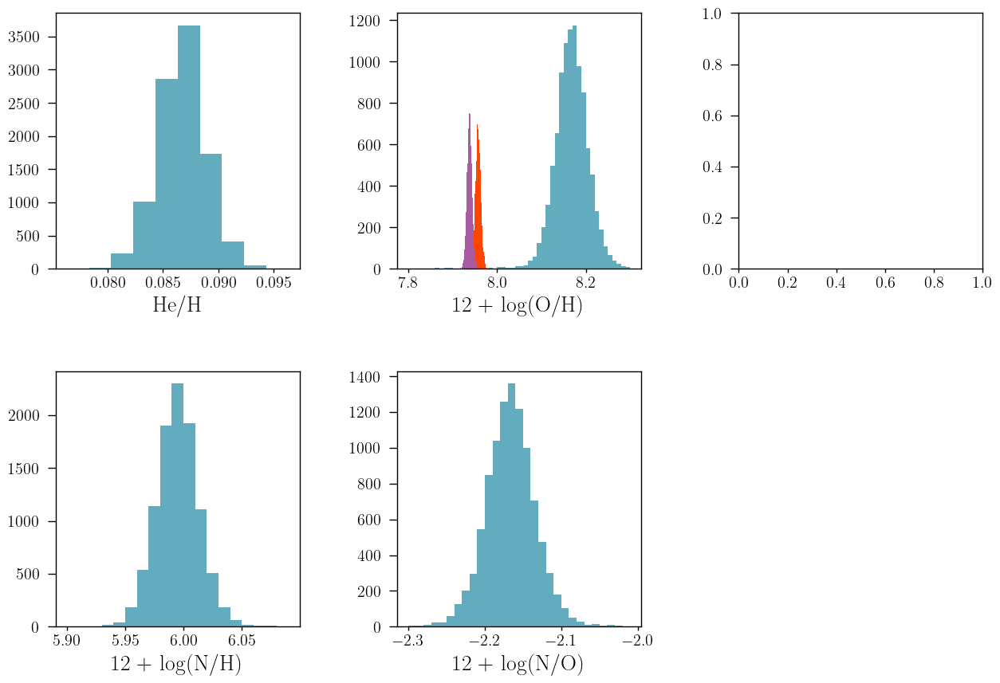

In [17]:
texPlot('on')
fig, axs = plt.subplots(2, 3)
fig.set_size_inches((15, 10))
fig.subplots_adjust(wspace=0.4, hspace=0.4)

axs[0, 0].hist(y, color=cr[2])
axs[0, 0].set_xlabel(r'He/H')

axs[0, 1].hist(log_OH_tot, bins=np.arange(7.8, 8.3, 0.01), color=cr[2])
axs[0, 1].hist(log_OH_G92, bins=np.arange(7.8, 8.3, 0.001), color='Orangered')
#axs[0, 1].hist(log_OH_PM, bins=np.arange(7.8, 8.3, 0.05), color='Pink')
axs[0, 1].hist(log_OH_lin, bins=np.arange(7.8, 8.3, 0.001), color=cz[1])
#axs[0, 1].hist(log_OH_nlin, bins=np.arange(7.8, 8.3, 0.05), color='Green')
#axs[0, 1].hist(log_OH_poly, bins=np.arange(7.8, 8.3, 0.05), color='Blue')
#axs[0, 1].hist(log_OH_sqrt, bins=np.arange(7.8, 8.3, 0.05), color='Gray')
axs[0, 1].set_xlabel(r'12 + log(O/H)')

#axs[0, 2].hist(log_SH_tot, color=cr[2])
#axs[0, 2].set_xlabel(r'12 + log(S/H)')

axs[1, 0].hist(log_NH_tot, color=cr[2], bins=np.arange(5.9, 6.1, 0.01))
axs[1, 0].set_xlabel(r'12 + log(N/H)')

axs[1, 1].hist(log_NO_tot, color=cr[2], bins=np.arange(-2.3, -2, 0.01))
axs[1, 1].set_xlabel(r'12 + log(N/O)')

axs[1, 2].axis('off')

In [20]:
He_tot_mean = np.nanpercentile(y, 50)
He_tot_16 = np.nanpercentile(y, 16)
He_tot_84 = np.nanpercentile(y, 84)

log_OH_tot_mean = np.nanpercentile(log_OH_tot, 50)
log_OH_tot_16 = np.nanpercentile(log_OH_tot, 16)
log_OH_tot_84 = np.nanpercentile(log_OH_tot, 84)

log_OH_G92_mean = np.nanpercentile(log_OH_G92, 50)
log_OH_G92_16 = np.nanpercentile(log_OH_G92, 16)
log_OH_G92_84 = np.nanpercentile(log_OH_G92, 84)

#log_OH_PM_mean = np.nanpercentile(log_OH_PM, 50)
#log_OH_PM_16 = np.nanpercentile(log_OH_PM, 16)
#log_OH_PM_84 = np.nanpercentile(log_OH_PM, 84)

log_OH_lin_mean = np.nanpercentile(log_OH_lin, 50)
log_OH_lin_16 = np.nanpercentile(log_OH_lin, 16)
log_OH_lin_84 = np.nanpercentile(log_OH_lin, 84)

#log_OH_nlin_mean = np.nanpercentile(log_OH_nlin, 50)
#log_OH_nlin_16 = np.nanpercentile(log_OH_nlin, 16)
#log_OH_nlin_84 = np.nanpercentile(log_OH_nlin, 84)

#log_OH_poly_mean = np.nanpercentile(log_OH_poly, 50)
#log_OH_poly_16 = np.nanpercentile(log_OH_poly, 16)
#log_OH_poly_84 = np.nanpercentile(log_OH_poly, 84)

#log_OH_sqrt_mean = np.nanpercentile(log_OH_sqrt, 50)
#log_OH_sqrt_16 = np.nanpercentile(log_OH_sqrt, 16)
#log_OH_sqrt_84 = np.nanpercentile(log_OH_sqrt, 84)

#log_SH_tot_mean = np.nanpercentile(log_SH_tot, 50)
#log_SH_tot_16 = np.nanpercentile(log_SH_tot, 16)
#log_SH_tot_84 = np.nanpercentile(log_SH_tot, 84)

log_NH_tot_mean = np.nanpercentile(log_NH_tot, 50)
log_NH_tot_16 = np.nanpercentile(log_NH_tot, 16)
log_NH_tot_84 = np.nanpercentile(log_NH_tot, 84)

log_NO_tot_mean = np.nanpercentile(log_NO_tot, 50)
log_NO_tot_16 = np.nanpercentile(log_NO_tot, 16)
log_NO_tot_84 = np.nanpercentile(log_NO_tot, 84)

In [254]:
abundance_dict = {'galname': galname,
               'He/H': He_tot_mean,
               'He/H_16': He_tot_16,
               'He/H_84': He_tot_84,
               'log_OH': log_OH_tot_mean,
               'log_OH_16': log_OH_tot_16,
               'log_OH_84': log_OH_tot_84,
               'log_OH_G92': log_OH_G92_mean,
               'log_OH_G92_16': log_OH_G92_16,
               'log_OH_G92_84': log_OH_G92_84,
               #'log_OH_PM': log_OH_PM_mean,
               #'log_OH_PM_16': log_OH_PM_16,
               #'log_OH_PM_84': log_OH_PM_84,
               #'log_OH_lin': log_OH_lin_mean,
               #'log_OH_lin_16': log_OH_lin_16,
               #'log_OH_lin_84': log_OH_lin_84,
               #'log_OH_nlin': log_OH_nlin_mean,
               #'log_OH_nlin_16': log_OH_nlin_16,
               #'log_OH_nlin_84': log_OH_nlin_84,
               #'log_OH_poly': log_OH_poly_mean,
               #'log_OH_poly_16': log_OH_poly_16,
               #'log_OH_poly_84': log_OH_poly_84,
               #'log_OH_sqrt': log_OH_sqrt_mean,
               #'log_OH_sqrt_16': log_OH_sqrt_16,
               #'log_OH_sqrt_84': log_OH_sqrt_84,
               'log_SH': None,
               'log_SH_16': None,
               'log_SH_84': None,
               'log_NH': log_NH_tot_mean,
               'log_NH_16': log_NH_tot_16,
               'log_NH_84': log_NH_tot_84,
               'log_NO': log_NO_tot_mean,
               'log_NO_16': log_NO_tot_16,
               'log_NO_84': log_NO_tot_84,
}
abundance_dict_pd = pd.DataFrame(data=abundance_dict, index=[0])
save_catalog(galname, abundance_dict_pd, magePath + '/results/metals/abundance_measured.csv')

Existent catalog (.csv) file.
Non existent data for J1146, adding new data...
Done.


In [21]:
abundance_dict = {'galname': galname,
               'log_OH': log_OH_tot_mean,
               'log_OH_16': log_OH_tot_16,
               'log_OH_84': log_OH_tot_84,
               'log_OH_G92': log_OH_G92_mean,
               'log_OH_G92_16': log_OH_G92_16,
               'log_OH_G92_84': log_OH_G92_84,
               'log_OH_lin': log_OH_lin_mean,
               'log_OH_lin_16': log_OH_lin_16,
               'log_OH_lin_84': log_OH_lin_84
}
abundance_dict_pd = pd.DataFrame(data=abundance_dict, index=[0])
save_catalog(galname, abundance_dict_pd, magePath + '/results/metals/abundance_estimated.csv')

Existent catalog (.csv) file.
Non existent data for J1146, adding new data...
Done.


# Test for Starlight

(-1e-16, 1e-15)

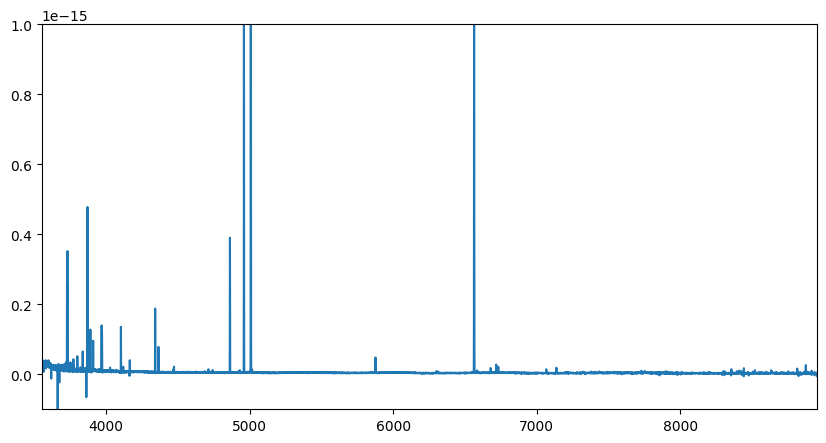

In [31]:
rf_wave = wave / (1 + z_nar_oiii_4959)
plt.figure(figsize=(10, 5))
plt.plot(rf_wave, flux)
plt.xlim(3550, 8950)
plt.ylim(-0.1e-15, 1e-15)

In [32]:
import spectres

rf_new_wave = np.arange(3550, 8950, 1)
new_flux, new_err = spectres.spectres(rf_new_wave, rf_wave, flux, err)

mask_flux = (new_flux > 0)

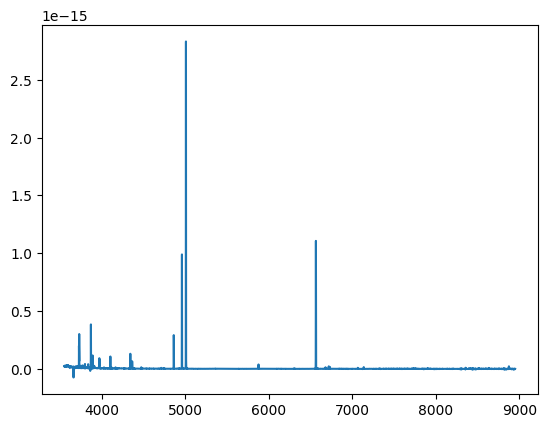

In [33]:
plt.plot(rf_new_wave, new_flux)

In [36]:
mask = False
mask_count = 0
mask_list = []
for line in wave_cat:
    if (wave_cat[line] > 3550) & (wave_cat[line] < 8950):
        sigma_line = (m * (wave_cat[line] * (1 + z_nar_oiii_4959))) + n
        sigma3 = 3 * np.sqrt(((upy.nominal_values(sigma_brd_intrinsic)**2) + (sigma_line**2)))
        lim_sup = wave_cat[line] + sigma3
        lim_inf = wave_cat[line] - sigma3
        mask_list.append([round(lim_inf), round(lim_sup)])
        mask_count += 1
        mask += (rf_new_wave > lim_inf) & (rf_new_wave < lim_sup)

In [37]:
with open('J1146_mask.cxt', 'a', newline='\n') as f:
    f.write(str(mask_count)+'\n')
    for masks in mask_list:
        f.write(str(masks[0])+' '+str(masks[1])+' '+'0\n')

In [48]:
from scipy.signal import medfilt
gpixs = np.where(abs(new_flux[~mask]-medfilt(new_flux[~mask],31))<0.05e-16)[0]

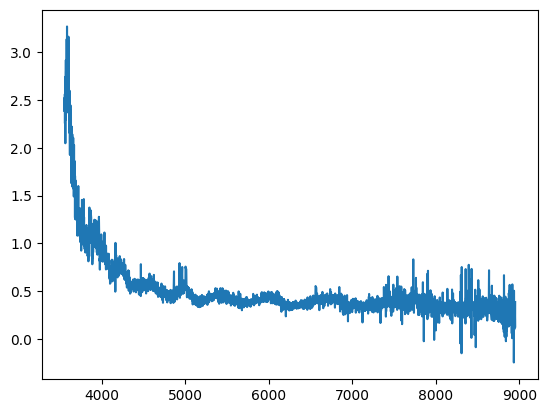

In [49]:
plt.plot(rf_new_wave[~mask][gpixs], new_flux[~mask][gpixs]/1e-17)
#plt.xlim(6500, 7000)
#plt.ylim(1e-16, 3e-16)

In [50]:
from astropy.io import ascii
for i in range(len(rf_new_wave)):
    if i in gpixs:
        flag = 0
    else:
        flag = 99
    spec_str = str(rf_new_wave[i])+' '+str(new_flux[i]/1e-17)+' '+str(new_err[i]/1e-17)+' '+str(flag)+'\n'
    with open('J1146.cxt', 'a', newline='\n') as f:
        f.write(spec_str)

In [51]:
FWHM(sigma_nar_oiii_4959, wave_cat['[OIII]4959'])

72.64085936643463

# After fitting

In [52]:
with open('/home/benjamin/Documents/STARLIGHTv04/J1146/J1146.cxt.sc4.C99.im.CAL.BS', 'r') as bf:
    # limits of lines to read
    line_lims = [531, 5932]
    # To store lines
    lines = []
    for i, line in enumerate(bf):
        # read lines inside limits
        if (i >= line_lims[0]) & (i <= line_lims[1]):
            lines.append(line.strip())
        elif i > 5932:
            # don't read after line 7 to save time
            break
print(lines)

['3550.00    5.61775   2.11532   -1.000', '3551.00    5.32227   2.12383   -1.000', '3552.00    5.57971   2.12995   -1.000', '3553.00    5.33241   2.12368   -1.000', '3554.00    6.85546   2.10923   -2.000', '3555.00    6.63255   2.09979   -2.000', '3556.00    5.49124   2.09915   -1.000', '3557.00    5.72020   2.10292   -1.000', '3558.00    5.03557   2.10397   -1.000', '3559.00    5.77094   2.09967   -1.000', '3560.00    6.12218   2.09379   -1.000', '3561.00    5.46219   2.09080   -1.000', '3562.00    5.66713   2.08861   -1.000', '3563.00    4.57080   2.08231   -1.000', '3564.00    6.96615   2.06962   -2.000', '3565.00    6.00364   2.05585   -1.000', '3566.00    5.12065   2.05190   -1.000', '3567.00    5.90652   2.05971   -1.000', '3568.00    6.47658   2.06869   -1.000', '3569.00    6.51469   2.06657   -1.000', '3570.00    5.59460   2.04763   -1.000', '3571.00    6.25062   2.01476   -1.000', '3572.00    5.51858   1.98388   -1.000', '3573.00    5.55055   1.96723   -1.000', '3574.00    5.6

In [53]:
wl = []
input_flux = []
best_model = []
for element in lines:
    wl.append(float(element.split()[0]))
    input_flux.append(float(element.split()[1]))
    best_model.append(float(element.split()[2]))

(0.0, 5.0)

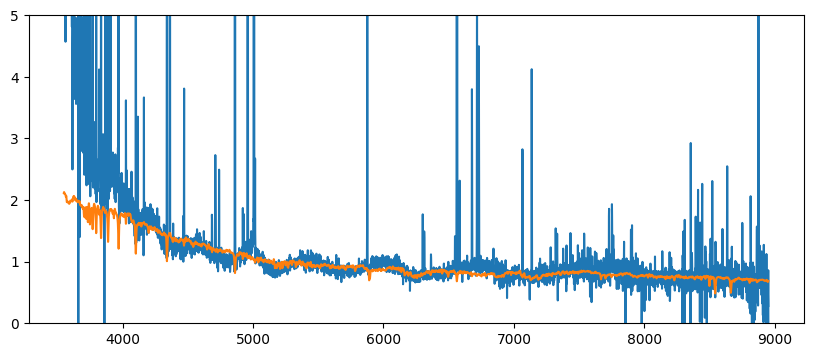

In [54]:
plt.figure(figsize=(10, 4))
plt.plot(wl, input_flux)
plt.plot(wl, best_model)
#plt.xlim(4500, 5000)
plt.ylim(0, 5)

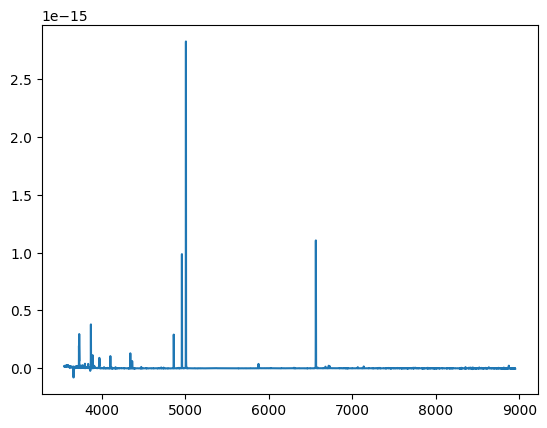

In [55]:
plt.plot(np.array(wl), (np.array(input_flux) - np.array(best_model)) * 4.478281E-01 * 1e-17)

In [57]:
np.log10(8.76437E+01 * 1e-17 * (1/3.826e33) * 4 * np.pi * ((7.88082e+26)**2))

6.252328418386464

In [20]:
z_nar_oiii_4959

0.05679983702007108

In [21]:
FWHM(sigma_nar_oiii_4959, wave_cat['[OIII]4959'])

72.64085936643463